In [1]:
# =============================
# Standard Libraries
# =============================
import os
import time
import math
import io
import zipfile
import requests
from urllib.parse import urlparse
from itertools import chain, combinations
import json
import re
import warnings
import logging

# progress / kaggle
from tqdm.auto import tqdm
import kagglehub
from IPython.display import display

# =============================
# Data Science Libraries
# =============================
import numpy as np
import pandas as pd
import optuna
import scipy.stats as stats
from scipy import sparse
from scipy.stats import loguniform, randint, uniform
from scipy.special import expit, logit

# =============================
# Visualization
# =============================
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.ticker as mticker
import seaborn as sns
from matplotlib.colors import ListedColormap


# =============================
# Scikit-learn
# =============================
from sklearn import clone
from sklearn.model_selection import (
    train_test_split,
    cross_val_score,
    GridSearchCV,
    RandomizedSearchCV,
    RepeatedKFold,
    ParameterGrid,
    ParameterSampler,
    KFold,
    RepeatedStratifiedKFold,
    StratifiedKFold,
)
import sklearn.model_selection._search as sk_search
import sklearn.model_selection._validation as sk_validation

from sklearn.preprocessing import (
    StandardScaler,
    OrdinalEncoder,
    MultiLabelBinarizer,
    Normalizer,
    MinMaxScaler,
)
from sklearn.impute import SimpleImputer
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score,
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
    roc_auc_score,
    roc_curve,
    auc,
    get_scorer,
)
from sklearn.feature_selection import (
    SequentialFeatureSelector,
    f_regression,
    SelectKBest,
    mutual_info_classif,
)
from sklearn.linear_model import (
    LinearRegression,
    Ridge,
    Lasso,
    ElasticNet,
    RidgeClassifier,
    LogisticRegression,
    RidgeCV,
    LassoCV,
    ElasticNetCV,
)
from sklearn.ensemble import (
    BaggingRegressor,
    RandomForestRegressor,
    GradientBoostingRegressor,
    RandomForestClassifier,
    GradientBoostingClassifier,
)
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.cross_decomposition import PLSRegression
from sklearn.decomposition import PCA
from sklearn.utils import resample
from sklearn.exceptions import NotFittedError
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.kernel_approximation import Nystroem
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.inspection import permutation_importance
from sklearn.neighbors import KNeighborsRegressor

# extra joblib tools
from joblib import Parallel, delayed, parallel_backend

# =============================
# Global Settings
# =============================
warnings.filterwarnings("ignore", category=UserWarning)
logging.getLogger("optuna").setLevel(logging.WARNING)

random_state = 42
N_ROWS = 1_000_000
pd.set_option("display.float_format", lambda x: f"{x:.6f}")  # no scientific notation

# =============================
# Small Helpers
# =============================
def is_sparse_dtype(dtype):
    return isinstance(dtype, pd.SparseDtype)


def dollar_format(x, pos=None):
    # format money
    return f"${x:,.0f}"

def format_hms(seconds):
    # format seconds to H:M:S
    return time.strftime("%H:%M:%S", time.gmtime(seconds))

def try_read_csv(folder_path, file_name, **kwargs):
    # try to read csv
    full_path = os.path.join(folder_path, file_name) if folder_path is not None else None
    if full_path is not None and os.path.exists(full_path):
        return pd.read_csv(full_path, **kwargs)
    return None

def list_csvs(folder_path):
    # list csv files
    if folder_path is None or not os.path.exists(folder_path):
        return []
    return [f for f in os.listdir(folder_path) if f.lower().endswith(".csv")]

def simple_random_sample(data_frame, n_rows=None, frac=None, random_state=42):
    # simple sample
    if data_frame is None:
        raise ValueError("data_frame is None")
    total_rows = len(data_frame)
    if (n_rows is None) == (frac is None):
        raise ValueError("pass exactly one of n_rows or frac")
    if frac is not None:
        if not (0 < frac <= 1):
            raise ValueError("frac must be between 0 and 1")
        pick_rows = int(np.floor(frac * total_rows))
    else:
        if int(n_rows) <= 0:
            raise ValueError("n_rows must be > 0")
        pick_rows = min(int(n_rows), total_rows)
    if pick_rows >= total_rows:
        print("simple_random_sample: taking all rows")
        return data_frame.copy()

    start = time.perf_counter()
    rng = np.random.default_rng(random_state)
    pick_index = rng.choice(total_rows, size=pick_rows, replace=False)
    out_df = data_frame.iloc[pick_index].copy()
    end = time.perf_counter()
    print(f"simple_random_sample: picked {len(out_df)} of {total_rows} rows in {round(end - start, 3)} sec")
    return out_df

def stratified_sample(data_frame, y, n_rows=None, frac=None, random_state=42):
    # stratified sample
    if data_frame is None:
        raise ValueError("data_frame is None")
    y_array = data_frame[y].to_numpy() if isinstance(y, str) else np.asarray(y)
    total_rows = len(data_frame)
    if len(y_array) != total_rows:
        raise ValueError("X and y length mismatch")
    if n_rows is not None and frac is not None:
        frac = None
    if n_rows is None and frac is None:
        raise ValueError("provide n_rows or frac")
    if frac is not None:
        if not (0 < frac <= 1):
            raise ValueError("frac must be between 0 and 1")
        test_size = float(frac)
        use_frac, use_n = frac, None
    else:
        if int(n_rows) <= 0:
            raise ValueError("n_rows must be > 0")
        test_size = min(float(n_rows) / total_rows, 1.0)
        use_frac, use_n = None, int(n_rows)
    if test_size >= 1.0:
        print("stratified_sample: taking all rows")
        return data_frame.copy()

    _, counts = np.unique(y_array, return_counts=True)
    if np.any(counts < 2):
        print("stratified_sample: some classes < 2, falling back to simple sample")
        return simple_random_sample(data_frame, n_rows=use_n, frac=use_frac, random_state=random_state)

    start = time.perf_counter()
    index_array = np.arange(total_rows)
    _, test_idx, _, _ = train_test_split(
        index_array, y_array, test_size=test_size, stratify=y_array, random_state=random_state
    )
    out_df = data_frame.iloc[test_idx].copy()
    end = time.perf_counter()
    print(f"stratified_sample: picked {len(out_df)} of {total_rows} rows in {round(end - start, 3)} sec")
    return out_df

def safe_kaggle_download(dataset_name):
    # download from kaggle
    print(f"download: starting {dataset_name}")
    start = time.perf_counter()
    try:
        path = kagglehub.dataset_download(dataset_name)
        end = time.perf_counter()
        print(f"download: done {dataset_name} -> {path} in {round(end - start, 3)} sec")
        return path
    except Exception as e:
        end = time.perf_counter()
        print(f"download: error {dataset_name} -> {str(e)} in {round(end - start, 3)} sec")
        return None

def coerce_datetime_columns(df):
    # make date/time columns into datetime
    if df is None:
        return None
    print("dates: converting possible date/time columns")
    for col_name in df.columns:
        lower = col_name.lower()
        if ("date" in lower) or ("time" in lower):
            try:
                df[col_name] = pd.to_datetime(df[col_name].astype("string"), errors="coerce")
            except Exception:
                pass
    return df

def optimize_dtypes(data_frame, convert_categoricals=True, category_threshold=0.2):
    # shrink memory
    print("optimize_dtypes: start")
    if data_frame is None:
        print("optimize_dtypes: skip because data_frame is None")
        return None

    start_bytes = int(data_frame.memory_usage(deep=True).sum())

    # numeric downsizing
    for col in data_frame.select_dtypes(include=[np.floating]).columns:
        data_frame[col] = pd.to_numeric(data_frame[col], downcast="float")
    for col in data_frame.select_dtypes(include=[np.integer]).columns:
        data_frame[col] = pd.to_numeric(data_frame[col], downcast="integer")

    # object -> category (skip date/time-like names)
    if convert_categoricals:
        object_columns = [
            c for c in data_frame.select_dtypes(include=["object"]).columns
            if ("date" not in c.lower() and "time" not in c.lower())
        ]
        total_rows = max(len(data_frame), 1)

        def is_unhashable_obj(x):
            return isinstance(x, (list, dict, set))

        for col in object_columns:
            series_now = data_frame[col]
            try:
                if series_now.apply(is_unhashable_obj).any():
                    continue
                unique_ratio = series_now.nunique(dropna=False) / total_rows
                if unique_ratio <= category_threshold:
                    data_frame[col] = data_frame[col].astype("category")
            except Exception:
                pass

    end_bytes = int(data_frame.memory_usage(deep=True).sum())
    print(f"optimize_dtypes: memory {round(start_bytes / (1024**2), 2)} MB -> {round(end_bytes / (1024**2), 2)} MB")
    return data_frame

# =============================
# Steam Loader
# =============================
def load_steam_dataset(base_path, n_rows=1_000_000, seed=42):
    print("steam: start")
    if base_path is None:
        print("steam: skip because base_path is None")
        return None

    games = try_read_csv(base_path, "games.csv", low_memory=False)
    users = try_read_csv(base_path, "users.csv", low_memory=False)
    recommendations = try_read_csv(base_path, "recommendations.csv", low_memory=False)

    metadata = None
    meta_path = os.path.join(base_path, "games_metadata.json")
    if os.path.exists(meta_path):
        try:
            metadata = pd.read_json(meta_path, lines=True)
        except Exception as e:
            print(f"steam: metadata read error -> {str(e)}")

    print(f"steam: shapes games={None if games is None else games.shape}, users={None if users is None else users.shape}, recs={None if recommendations is None else recommendations.shape}, meta={None if metadata is None else metadata.shape}")

    steam_table = None
    if recommendations is not None:
        if "is_recommended" in recommendations.columns:
            recs_sample = stratified_sample(recommendations, y="is_recommended", n_rows=n_rows, random_state=seed)
        else:
            recs_sample = simple_random_sample(recommendations, n_rows=n_rows, random_state=seed)

        games_plus = games
        if metadata is not None and games is not None and "app_id" in metadata.columns and "app_id" in games.columns:
            print("steam: merge games with metadata")
            games_plus = games.merge(metadata, on="app_id", how="left")

        steam_table = recs_sample
        if games_plus is not None and "app_id" in recs_sample.columns and "app_id" in games_plus.columns:
            print("steam: merge recommendations with games")
            steam_table = steam_table.merge(games_plus, on="app_id", how="left")
        if users is not None and "user_id" in steam_table.columns and "user_id" in users.columns:
            print("steam: merge with users")
            steam_table = steam_table.merge(users, on="user_id", how="left")

        # make dates now
        steam_table = coerce_datetime_columns(steam_table)

        print(f"steam: done shape={None if steam_table is None else steam_table.shape}")
    else:
        print("steam: skip because recommendations.csv is missing")

    return steam_table

# =============================
# Olist Loader
# =============================
def load_olist_dataset(base_path, n_rows=1_000_000, seed=42):
    print("olist: start")
    if base_path is None:
        print("olist: skip because base_path is None")
        return None

    olist_customers = try_read_csv(base_path, "olist_customers_dataset.csv")
    olist_geolocation = try_read_csv(base_path, "olist_geolocation_dataset.csv")
    olist_items = try_read_csv(base_path, "olist_order_items_dataset.csv")
    olist_payments = try_read_csv(base_path, "olist_order_payments_dataset.csv")
    olist_reviews = try_read_csv(base_path, "olist_order_reviews_dataset.csv")
    olist_orders = try_read_csv(base_path, "olist_orders_dataset.csv")
    olist_products = try_read_csv(base_path, "olist_products_dataset.csv")
    olist_sellers = try_read_csv(base_path, "olist_sellers_dataset.csv")
    olist_cat_trans = try_read_csv(base_path, "product_category_name_translation.csv")

    print(
        "olist: shapes "
        f"customers={None if olist_customers is None else olist_customers.shape}, "
        f"geolocation={None if olist_geolocation is None else olist_geolocation.shape}, "
        f"items={None if olist_items is None else olist_items.shape}, "
        f"payments={None if olist_payments is None else olist_payments.shape}, "
        f"reviews={None if olist_reviews is None else olist_reviews.shape}, "
        f"orders={None if olist_orders is None else olist_orders.shape}, "
        f"products={None if olist_products is None else olist_products.shape}, "
        f"sellers={None if olist_sellers is None else olist_sellers.shape}, "
        f"cat_trans={None if olist_cat_trans is None else olist_cat_trans.shape}"
    )

    if not all(x is not None for x in [olist_orders, olist_items, olist_products, olist_sellers, olist_customers]):
        print("olist: skip because core tables are missing")
        return None

    print("olist: sample orders")
    orders_small = simple_random_sample(olist_orders, n_rows=min(n_rows, len(olist_orders)), random_state=seed)

    print("olist: filter items for sampled orders")
    items_small = olist_items[olist_items["order_id"].isin(orders_small["order_id"])].copy()

    if olist_cat_trans is not None and "product_category_name" in olist_products.columns:
        print("olist: merge category translation")
        products_en = olist_products.merge(olist_cat_trans, on="product_category_name", how="left")
    else:
        products_en = olist_products

    if olist_reviews is not None:
        print("olist: build product review stats")
        product_reviews = (
            items_small[["order_id", "product_id"]]
            .merge(olist_reviews[["order_id", "review_score"]], on="order_id", how="inner")
        )
        product_reviews = product_reviews.drop_duplicates(["order_id", "product_id"])
        product_stats = (
            product_reviews.groupby("product_id", as_index=False)
            .agg(
                review_count_product=("review_score", "count"),
                review_score_mean_product=("review_score", "mean"),
            )
        )
    else:
        product_stats = None

    print("olist: merge items, products, and sellers")
    items_ext = (
        items_small.merge(products_en, on="product_id", how="left")
        .merge(olist_sellers, on="seller_id", how="left", suffixes=("", "_seller"))
    )

    if olist_geolocation is not None:
        print("olist: build basic zip geo")
        geo_zip = (
            olist_geolocation.groupby("geolocation_zip_code_prefix", as_index=False).agg(
                geolocation_lat=("geolocation_lat", "mean"),
                geolocation_lng=("geolocation_lng", "mean"),
                geo_points=("geolocation_city", "count"),
            )
        )
        print("olist: merge customers with geo")
        customers_geo = (
            olist_customers.merge(
                geo_zip,
                left_on="customer_zip_code_prefix",
                right_on="geolocation_zip_code_prefix",
                how="left",
            )
            .drop(columns=["geolocation_zip_code_prefix"])
        )
    else:
        customers_geo = olist_customers

    if olist_payments is not None:
        print("olist: aggregate payments")
        payments_agg = (
            olist_payments.groupby("order_id", as_index=False).agg(
                payment_value_total=("payment_value", "sum"),
                payment_installments_max=("payment_installments", "max"),
                payment_count=("payment_type", "count"),
            )
        )
    else:
        payments_agg = None

    print("olist: assemble main table")
    olist_full = (
        orders_small.merge(customers_geo, on="customer_id", how="left")
        .merge(items_ext, on="order_id", how="left")
    )

    if payments_agg is not None:
        print("olist: merge payments")
        olist_full = olist_full.merge(payments_agg, on="order_id", how="left")

    if product_stats is not None:
        print("olist: merge product stats")
        olist_full = olist_full.merge(product_stats, on="product_id", how="left")

    # make dates now
    olist_full = coerce_datetime_columns(olist_full)

    print(f"olist: shape after assemble {olist_full.shape}")
    print("olist: done")
    return olist_full

# =============================
# VG2019 Loader
# =============================
def load_vg2019_dataset(base_path, n_rows=1_000_000, seed=42):
    print("vg2019: start")
    if base_path is None:
        print("vg2019: skip because base_path is None")
        return None

    csv_files = list_csvs(base_path)
    target_csv = "vgsales-12-4-2019.csv" if "vgsales-12-4-2019.csv" in csv_files else (csv_files[0] if csv_files else None)
    if target_csv is None:
        print("vg2019: skip because no csv found")
        return None

    full_path = os.path.join(base_path, target_csv)
    sales = pd.read_csv(full_path, low_memory=False)
    print(f"vg2019: loaded {target_csv} with shape {sales.shape}")

    if "Genre" in sales.columns:
        print("vg2019: stratified sample by Genre")
        sales = stratified_sample(sales, y="Genre", n_rows=n_rows, random_state=seed)
    else:
        print("vg2019: simple random sample")
        sales = simple_random_sample(sales, n_rows=n_rows, random_state=seed)

    print(f"vg2019: done shape={sales.shape}")
    return sales

# =============================
# Download Paths
# =============================
print("main: start downloads")
steam_path = safe_kaggle_download("antonkozyriev/game-recommendations-on-steam")
olist_path = safe_kaggle_download("olistbr/brazilian-ecommerce")
vg2019_path = safe_kaggle_download("ashaheedq/video-games-sales-2019")
print("main: downloads finished")

# =============================
# Load All
# =============================
start_total = time.perf_counter()
steam = load_steam_dataset(steam_path, n_rows=N_ROWS, seed=random_state)
olist = load_olist_dataset(olist_path, n_rows=N_ROWS, seed=random_state)
sales = load_vg2019_dataset(vg2019_path, n_rows=N_ROWS, seed=random_state)
end_total = time.perf_counter()
print(f"main: load all done in {round(end_total - start_total, 3)} sec ({format_hms(end_total - start_total)})")

# =============================
# Optimize Dtypes (after making dates)
# =============================
if steam is not None:
    print("main: optimize steam dtypes")
    steam = optimize_dtypes(steam, convert_categoricals=True, category_threshold=0.2)

if olist is not None:
    print("main: optimize olist dtypes")
    olist = optimize_dtypes(olist, convert_categoricals=True, category_threshold=0.2)

if sales is not None:
    print("main: optimize vg2019 dtypes")
    sales = optimize_dtypes(sales, convert_categoricals=True, category_threshold=0.2)

# =============================
# Final Shapes
# =============================
print("final: shapes summary")
print(f"final: steam shape = {None if steam is None else steam.shape}")
print(f"final: olist shape = {None if olist is None else olist.shape}")
print(f"final: sales shape = {None if sales is None else sales.shape}")




def prepare_all(
    steam, olist, sales,
    top_k_tags=200, max_total_features=400,
    test_size=0.2, random_state=42,
    balance_method="auto",
    min_class_ratio=0.5,
    feature_select_method="none",
    feature_select_k=100,
    task_type="classification",
    scale_method="none",
    poly_degree=2,
    poly_interaction_only=False,
    poly_include_bias=False,
    poly_feature_limit=25
):
    def is_sparse_dtype(dtype):
        return isinstance(dtype, pd.SparseDtype)

    is_classification = str(task_type).lower().startswith("c")

    # forward-selected feature lists you provided
    best_forward_features_raw = {
        "steam": [
            "poly_price_final_log1p^2", "mac", "poly_price_original_log1p",
            "tag_'early access'", "tag_'great soundtrack'", "poly_days_since_release",
            "poly_hours_log1p^2", "tag_'2d'", "tag_'massively multiplayer'",
            "tag_'free to play'", "tag_'cute'", "tag_'action rpg'",
            "poly_price_original_log1p^2", "tag_'first-person'", "tag_'fast-paced'",
            "poly_title_len price_final_log1p", "poly_days_since_release review_year",
            "poly_products_log1p reviews_log1p", "tag_'mmorpg'", "tag_'puzzle'",
            "tag_'pvp'", "poly_desc_len hours_log1p", "poly_hours_log1p",
            "tag_'management'", "tag_'memes'", "tag_'relaxing'", "tag_'visual novel'",
            "tag_'sexual content'", "tag_'difficult'", "tag_'emotional'"
        ],
        "olist": [
            "poly_to_customer_h", "order_status_delivered", "order_status_shipped",
            "poly_to_carrier_h", "seller_state_SP", "order_item_id",
            "product_category_bed_bath_table", "product_category_office_furniture",
            "product_category_furniture_decor", "poly_customer_zip_code_prefix",
            "product_category_watches_gifts", "product_category_computers_accessories",
            "product_category_telephony", "product_category_books_general_interest",
            "product_category_home_confort", "poly_to_customer_h est_delivery_h",
            "poly_to_customer_h price", "order_status_processing", "seller_state_RS",
            "seller_state_PE", "poly_payment_value_per_payment approval_delay_h",
            "product_category_audio", "poly_product_description_lenght product_height_cm",
            "product_name_lenght", "product_category_stationery",
            "product_category_luggage_accessories", "product_category_electronics",
            "seller_state_MA", "product_category_Unknown", "product_category_baby"
        ],
        "sales": [
            "poly_Developer_freq", "Genre_Action", "ESRB_Rating_M", "poly_Year^2",
            "Decade_1970", "Platform_Family_PC", "poly_Developer_freq^2",
            "Platform_Family_Nintendo", "poly_Publisher_freq",
            "poly_Year Publisher_freq", "is_remaster", "Genre_Party", "Genre_Misc",
            "Genre_Simulation", "is_portable", "Genre_Role-Playing", "Decade_1980",
            "Genre_Strategy", "Genre_Fighting", "Genre_Puzzle", "poly_Year",
            "Decade_<NA>", "poly_Year Developer_freq", "poly_Publisher_freq^2",
            "Platform_Family_PlayStation", "Genre_Board Game", "Genre_Racing",
            "Genre_Adventure", "Genre_Shooter"
        ]
    }

    # normalize names like "tag_'great soundtrack'" -> "tag_great soundtrack"
    def _normalize_forward_name(name):
        s = str(name).strip()
        if s.startswith("tag_"):
            rest = s[4:].strip()
            if (rest.startswith("'") and rest.endswith("'")) or (rest.startswith('"') and rest.endswith('"')):
                rest = rest[1:-1]
            return "tag_" + rest.lower()
        return s

    best_forward_features = {
        k: [_normalize_forward_name(n) for n in v]
        for k, v in best_forward_features_raw.items()
    }

    # make poly interaction names order-agnostic
    def canonical_poly_name(name):
        s = str(name)
        if not s.startswith("poly_"):
            return s
        body = s[5:]
        if "^" in body and " " not in body:
            return s  # keep squares like "poly_x^2"
        tokens = body.split()
        tokens = sorted(tokens)
        return "poly_" + " ".join(tokens)

    def build_poly_canonical_map(cols):
        col_map = {}
        for c in cols:
            if c.startswith("poly_"):
                col_map[canonical_poly_name(c)] = c
            else:
                col_map[c] = c
        return col_map

    # small debug print for missing columns (uses canonical poly names)
    def debug_forward_missing(X, dataset_name, best_forward_features):
        expect = best_forward_features.get(dataset_name, [])
        col_map = build_poly_canonical_map(X.columns)
        missing = [f for f in expect if canonical_poly_name(f) not in col_map]
        if missing:
            print(f"[debug] {dataset_name} missing:", missing)
        return missing

    def drop_known_leaks_from_features(X_in, y_in=None):
        leak_names = {"y_is_4_plus", "delivered_late", "target", "label",
                      "target_olist", "target_sales", "target_steam"}
        to_drop = [c for c in X_in.columns if (c in leak_names) or c.lower().startswith("target") or c.lower().startswith("label")]
        X_in = X_in.drop(columns=to_drop, errors="ignore")
        if is_classification and (y_in is not None):
            y_series = pd.Series(y_in).reset_index(drop=True)
            for c in list(X_in.columns):
                xc = pd.Series(X_in[c]).reset_index(drop=True)
                try:
                    ux = set(pd.unique(xc.dropna()))
                    uy = set(pd.unique(y_series.dropna()))
                    if ux <= {0, 1} and uy <= {0, 1}:
                        if (xc.astype("int8") == y_series.astype("int8")).all():
                            X_in = X_in.drop(columns=[c])
                except Exception:
                    pass
        return X_in

    def resample_binary(Xb, yb, method="oversample", random_state=42):
        counts = yb.value_counts(dropna=False)
        if counts.shape[0] != 2:
            return Xb, yb
        majority_class = counts.idxmax()
        minority_class = counts.idxmin()
        majority_idx = yb[yb == majority_class].index.values
        minority_idx = yb[yb == minority_class].index.values
        rng = np.random.RandomState(random_state)
        if method == "undersample":
            keep_majority = rng.choice(majority_idx, size=len(minority_idx), replace=False)
            new_index = np.concatenate([minority_idx, keep_majority])
        else:
            need = int(len(majority_idx) - len(minority_idx))
            need = max(0, need)
            add_minority = rng.choice(minority_idx, size=need, replace=True)
            new_index = np.concatenate([majority_idx, minority_idx, add_minority])
        rng.shuffle(new_index)
        Xb2 = Xb.loc[new_index].reset_index(drop=True)
        yb2 = yb.loc[new_index].reset_index(drop=True)
        return Xb2, yb2

    def split_and_balance(df_in, target_col, balance_method, min_class_ratio, random_state):
        X_in = df_in.drop(columns=[target_col]).copy()
        y_in = df_in[target_col].copy()
        X_in = drop_known_leaks_from_features(X_in, y_in)

        dense_num_cols = [c for c in X_in.select_dtypes(include=[np.number]).columns
                          if not is_sparse_dtype(X_in[c].dtype)]
        for c in dense_num_cols:
            X_in[c] = pd.to_numeric(X_in[c], errors="coerce").fillna(pd.to_numeric(X_in[c], errors="coerce").median())
        obj_cols = X_in.select_dtypes(include=["object"]).columns
        for c in obj_cols:
            X_in[c] = X_in[c].astype("string").fillna("Unknown")

        if is_classification:
            if pd.Series(y_in).nunique() != 2:
                raise ValueError(f"{target_col}: for classification, target must have 2 classes.")
            X_tr, X_te, y_tr, y_te = train_test_split(
                X_in, y_in.astype(int), test_size=test_size, random_state=random_state, stratify=y_in
            )
        else:
            X_tr, X_te, y_tr, y_te = train_test_split(
                X_in, y_in, test_size=test_size, random_state=random_state
            )

        if is_classification:
            vc = y_tr.value_counts()
            ratio = float(vc.min()) / float(vc.max()) if vc.max() > 0 else 1.0
            if balance_method != "none" and ratio < min_class_ratio:
                method = (
                    "oversample" if balance_method == "auto" and len(X_tr) <= 200000
                    else ("undersample" if balance_method == "auto" else balance_method)
                )
                X_tr, y_tr = resample_binary(X_tr, y_tr, method=method, random_state=random_state)
            print(f"{target_col} train class counts:", y_tr.value_counts().to_dict())
            print(f"{target_col} test class counts:", y_te.value_counts().to_dict())
        else:
            def sstats(s):
                return {"n": int(s.shape[0]),
                        "mean": float(np.nanmean(s)),
                        "std": float(np.nanstd(s)),
                        "min": float(np.nanmin(s)),
                        "max": float(np.nanmax(s))}
            print(f"{target_col} train stats:", sstats(y_tr))
            print(f"{target_col} test stats:", sstats(y_te))
        return X_tr, X_te, y_tr, y_te

    def apply_feature_selection(X_tr, y_tr, X_te, method, k, random_state, dataset_name=None):
        if method == "none":
            return X_tr, X_te

        if method in {"forward_best", "forward", "best_forward"}:
            feature_list = best_forward_features.get(dataset_name, [])
            if not feature_list:
                print(f"forward_best: no saved list for {dataset_name}, using all features.")
                return X_tr, X_te

            col_map = build_poly_canonical_map(X_tr.columns)
            kept_cols = []
            for want in feature_list:
                key = canonical_poly_name(want)
                if key in col_map:
                    kept_cols.append(col_map[key])

            missing = [f for f in feature_list if canonical_poly_name(f) not in col_map]
            if missing:
                print(f"forward_best: {dataset_name} missing {len(missing)} of {len(feature_list)} saved features.")

            if not kept_cols:
                print(f"forward_best: none of the saved features found for {dataset_name}, using all features.")
                return X_tr, X_te

            if isinstance(k, int) and k > 0:
                kept_cols = kept_cols[: min(k, len(kept_cols))]

            return X_tr[kept_cols].copy(), X_te[kept_cols].copy()

        n_features = X_tr.shape[1]
        if n_features <= 1 or k >= n_features:
            return X_tr, X_te
        k = int(max(1, min(k, n_features)))
        try:
            if method == "mi":
                if is_classification:
                    sel = SelectKBest(score_func=mutual_info_classif, k=k)
                else:
                    sel = SelectKBest(score_func=f_regression, k=k)
                sel.fit(X_tr, y_tr)
                kept_cols = X_tr.columns[sel.get_support()].tolist()
            elif method == "rf":
                if is_classification:
                    rf = RandomForestClassifier(
                        n_estimators=300, random_state=random_state, n_jobs=-1,
                        class_weight="balanced_subsample"
                    )
                else:
                    rf = RandomForestRegressor(
                        n_estimators=300, random_state=random_state, n_jobs=-1
                    )
                rf.fit(X_tr, y_tr)
                order = np.argsort(rf.feature_importances_)[::-1][:k]
                kept_cols = X_tr.columns[order].tolist()
            else:
                print("feature selection: unknown method, skipping")
                return X_tr, X_te
            return X_tr[kept_cols].copy(), X_te[kept_cols].copy()
        except Exception as e:
            print(f"feature selection error ({method}): {e}. using all features.")
            return X_tr, X_te

    # pick continuous columns, but always keep forced bases (even if low variance)
    def pick_continuous_columns(X, max_cols, must_have=None):
        sample = X.iloc[: min(10000, len(X))].copy()
        num_cols = sample.select_dtypes(include=[np.number]).columns.tolist()

        def ok(col):
            return (not str(X[col].dtype).startswith("uint8")) and (sample[col].nunique(dropna=False) > 2)

        must_have = [c for c in (must_have or []) if c in X.columns and not str(X[c].dtype).startswith("uint8")]
        rest = [c for c in num_cols if ok(c) and c not in must_have]
        if rest:
            var_series = sample[rest].var().sort_values(ascending=False)
            rest_sorted = var_series.index.tolist()
        else:
            rest_sorted = []
        cols = (must_have + [c for c in rest_sorted if c not in must_have])[: max_cols]
        return cols

    def apply_scaling_and_poly(X_tr, X_te):
        # bases needed by your forward polys on Steam
        steam_poly_must_have = [
            "price_final_log1p", "price_original_log1p",
            "days_since_release", "review_year",
            "hours_log1p", "products_log1p", "reviews_log1p",
            "title_len", "desc_len"
        ]
        cont_cols = pick_continuous_columns(X_tr, poly_feature_limit, must_have=steam_poly_must_have)
        X_tr = X_tr.copy()
        X_te = X_te.copy()

        do_scale = (scale_method in {"standard", "minmax"}) and bool(cont_cols)
        do_poly = (poly_degree is not None) and (int(poly_degree) >= 2 or bool(poly_interaction_only)) and bool(cont_cols)

        if not cont_cols:
            return X_tr, X_te

        tr_cont = X_tr[cont_cols].astype("float32").values
        te_cont = X_te[cont_cols].astype("float32").values

        if do_scale:
            if scale_method == "standard":
                scaler = StandardScaler()
            elif scale_method == "minmax":
                scaler = MinMaxScaler()
            else:
                scaler = None
            if scaler is not None:
                tr_cont = scaler.fit_transform(tr_cont).astype("float32")
                te_cont = scaler.transform(te_cont).astype("float32")
                print(f"scaled columns: {len(cont_cols)} with {scale_method}")

        if do_poly:
            poly = PolynomialFeatures(
                degree=int(poly_degree),
                include_bias=bool(poly_include_bias),
                interaction_only=bool(poly_interaction_only)
            )
            tr_poly = poly.fit_transform(tr_cont).astype("float32")
            te_poly = poly.transform(te_cont).astype("float32")
            poly_names = [f"poly_{n}" for n in poly.get_feature_names_out(cont_cols)]
            tr_poly_df = pd.DataFrame(tr_poly, columns=poly_names, index=X_tr.index)
            te_poly_df = pd.DataFrame(te_poly, columns=poly_names, index=X_te.index)
            X_tr = X_tr.drop(columns=cont_cols).join(tr_poly_df)
            X_te = X_te.drop(columns=cont_cols).join(te_poly_df)
            print(f"polynomial features added: {len(poly_names)} (from {len(cont_cols)} columns)")
            return X_tr, X_te

        if do_scale:
            tr_scaled_df = pd.DataFrame(tr_cont, columns=cont_cols, index=X_tr.index).astype("float32")
            te_scaled_df = pd.DataFrame(te_cont, columns=cont_cols, index=X_te.index).astype("float32")
            X_tr = X_tr.drop(columns=cont_cols).join(tr_scaled_df)
            X_te = X_te.drop(columns=cont_cols).join(te_scaled_df)

        return X_tr, X_te

    def prepare_steam_df(steam_in):
        print("prep: steam")
        df = steam_in.copy()
        for col in ["title", "description", "tags"]:
            if col in df.columns:
                df[col] = df[col].astype("string")

        def safe_to_datetime(series):
            return pd.to_datetime(series.astype("string"), errors="coerce")
        for c in ["date", "date_release"]:
            if c in df.columns:
                df[c] = safe_to_datetime(df[c])
            else:
                df[c] = pd.NaT

        df["days_since_release"] = (df["date"] - df["date_release"]).dt.days
        df["days_since_release"] = df["days_since_release"].clip(lower=0).fillna(0).astype("int32")
        df["review_year"] = df["date"].dt.year.astype("float64")
        df["review_month"] = df["date"].dt.month.astype("float64")
        df["review_dow"] = df["date"].dt.dayofweek.astype("float64")
        df["review_year"] = df["review_year"].fillna(-1).astype("int16")
        df["review_month"] = df["review_month"].fillna(-1).astype("int8")
        df["review_dow"] = df["review_dow"].fillna(-1).astype("int8")

        df["title_len"] = df["title"].astype("string").str.len().fillna(0).astype("int32")
        df["desc_len"]  = df["description"].astype("string").str.len().fillna(0).astype("int32")

        for col in ["hours","products","reviews","price_final","price_original"]:
            if col not in df.columns:
                df[col] = np.nan
            df[col] = pd.to_numeric(df[col], errors="coerce")
            df[col + "_log1p"] = np.log1p(df[col])

        df["is_free"] = (df["price_final"] == 0).astype("int8")
        df["discount_ratio"] = np.where(
            pd.to_numeric(df["price_original"], errors="coerce") > 0,
            1.0 - (pd.to_numeric(df["price_final"], errors="coerce") /
                   pd.to_numeric(df["price_original"], errors="coerce")),
            0.0
        )
        df["discount_ratio"] = pd.Series(df["discount_ratio"]).clip(0, 1).fillna(0.0)

        for b in ["win","mac","linux","steam_deck"]:
            if b in df.columns:
                df[b] = (df[b] == True).astype("int8")
            else:
                df[b] = 0

        pos = pd.to_numeric(df.get("positive_ratio"), errors="coerce")
        if is_classification:
            y = (pos >= 80).astype("Int64")
        else:
            y = pos.round().astype("Int64")

        keep_dense = [
            "win","mac","linux","steam_deck",
            "days_since_release","review_year","review_month","review_dow",
            "title_len","desc_len",
            "hours_log1p","products_log1p","reviews_log1p",
            "price_final_log1p","price_original_log1p",
            "discount_ratio","is_free"
        ]
        X = df[keep_dense].copy()

        base_cols_count = X.shape[1]
        allowed_tag_cols = max(0, min(top_k_tags, max_total_features - base_cols_count))
        if allowed_tag_cols > 0 and "tags" in df.columns:
            print("prep: steam build sparse tag matrix")
            tags_clean = (
                df["tags"].astype("string").fillna("").str.lower()
                  .str.replace(r"[\[\]\"]", "", regex=True)
                  .str.replace(";", ",").str.replace("/", ",")
            )
            vec = CountVectorizer(
                tokenizer=lambda s: [t.strip() for t in s.split(",") if t.strip()],
                lowercase=False, binary=True, max_features=allowed_tag_cols
            )
            tag_sparse = vec.fit_transform(tags_clean.values)
            tag_df = pd.DataFrame.sparse.from_spmatrix(
                tag_sparse,
                columns=[f"tag_{t}" for t in vec.get_feature_names_out()],
                index=df.index
            ).astype(pd.SparseDtype("uint8", 0))
            X = pd.concat([X, tag_df], axis=1)

            # force-create chosen tags even if not in top-K
            force_tags = [
                "early access","great soundtrack","2d","massively multiplayer","free to play","cute",
                "action rpg","first-person","fast-paced","mmorpg","puzzle","pvp","management","memes",
                "relaxing","visual novel","sexual content","difficult","emotional"
            ]
            def has_tag(series, t):
                pattern = rf"(?:^|,)\s*{re.escape(t)}\s*(?:,|$)"
                return series.str.contains(pattern, regex=True)

            for t in force_tags:
                col = f"tag_{t}"
                if col not in X.columns:
                    X[col] = has_tag(tags_clean, t).astype("uint8")

            # alias variants -> OR into canonical columns
            tag_aliases = {
                "first-person": ["first person"],
                "action rpg": ["action-rpg"],
                "mmorpg": ["mmo rpg", "mmo-rpg"]
            }
            for t, alts in tag_aliases.items():
                col = f"tag_{t}"
                if col not in X.columns:
                    X[col] = has_tag(tags_clean, t).astype("uint8")
                for a in alts:
                    alias_hits = has_tag(tags_clean, a).astype("uint8")
                    if alias_hits.any():
                        X[col] = (X[col].astype("uint8") | alias_hits).astype("uint8")

        if any(is_sparse_dtype(X[c].dtype) for c in X.columns):
            for c in X.columns:
                if is_sparse_dtype(X[c].dtype):
                    X[c] = X[c].sparse.to_dense().astype("uint8")

        dense_num_cols = [c for c in X.select_dtypes(include=[np.number]).columns
                          if not is_sparse_dtype(X[c].dtype)]
        for c in dense_num_cols:
            X[c] = pd.to_numeric(X[c], errors="coerce").fillna(pd.to_numeric(X[c], errors="coerce").median())

        raw = df[["date","app_id"]].copy()
        out_df = X.copy()
        out_df["target_steam"] = y
        out_df = out_df[out_df["target_steam"].notna()].copy()
        if is_classification:
            out_df["target_steam"] = out_df["target_steam"].astype("int8")
        else:
            out_df["target_steam"] = out_df["target_steam"].astype("int16")
        return out_df, raw

    def prepare_olist_df(olist_in):
        print("prep: olist")
        o = olist_in.copy()

        def safe_to_datetime(series):
            return pd.to_datetime(series.astype("string"), errors="coerce")
        date_cols = [
            "order_purchase_timestamp","order_approved_at","order_delivered_carrier_date",
            "order_delivered_customer_date","order_estimated_delivery_date","shipping_limit_date",
        ]
        for c in date_cols:
            if c in o.columns:
                o[c] = safe_to_datetime(o[c])
            else:
                o[c] = pd.NaT

        o["purchase_dayofweek"] = o["order_purchase_timestamp"].dt.dayofweek
        o["purchase_month"] = o["order_purchase_timestamp"].dt.month
        o["purchase_hour"] = o["order_purchase_timestamp"].dt.hour

        def to_hours(td):
            return td.dt.total_seconds() / 3600.0

        for c in ["product_length_cm","product_width_cm","product_height_cm","product_weight_g",
                  "payment_installments_max","payment_value_total","payment_count","freight_value","order_item_id"]:
            if c in o.columns:
                o[c] = pd.to_numeric(o[c], errors="coerce")

        o["approval_delay_h"] = to_hours(o["order_approved_at"] - o["order_purchase_timestamp"])
        o["to_carrier_h"] = to_hours(o["order_delivered_carrier_date"] - o["order_purchase_timestamp"])
        o["to_customer_h"] = to_hours(o["order_delivered_customer_date"] - o["order_purchase_timestamp"])
        o["est_delivery_h"] = to_hours(o["order_estimated_delivery_date"] - o["order_purchase_timestamp"])
        o["limit_from_purchase_h"] = to_hours(o["shipping_limit_date"] - o["order_purchase_timestamp"])

        o["delivered_late"] = (o["order_delivered_customer_date"] > o["order_estimated_delivery_date"]).astype("Int64")

        for c in ["product_length_cm","product_width_cm","product_height_cm","product_weight_g"]:
            if c not in o.columns:
                o[c] = np.nan
        o["product_volume_cm3"] = o["product_length_cm"] * o["product_width_cm"] * o["product_height_cm"]
        o["density_g_per_cm3"] = np.where(
            (o["product_volume_cm3"] > 0) & o["product_weight_g"].notna(),
            o["product_weight_g"] / o["product_volume_cm3"],
            np.nan,
        )

        for c in ["payment_installments_max","payment_value_total","payment_count"]:
            if c not in o.columns:
                o[c] = np.nan
        o["avg_installment_value"] = np.where(
            pd.to_numeric(o["payment_installments_max"], errors="coerce") > 0,
            o["payment_value_total"] / o["payment_installments_max"],
            np.nan,
        )
        o["payment_value_per_payment"] = np.where(
            pd.to_numeric(o["payment_count"], errors="coerce") > 0,
            o["payment_value_total"] / o["payment_count"],
            np.nan,
        )

        if "freight_value" not in o.columns:
            o["freight_value"] = np.nan
        o["freight_per_kg"] = np.where(
            pd.to_numeric(o["product_weight_g"], errors="coerce") > 0,
            o["freight_value"] / (o["product_weight_g"] / 1000.0),
            np.nan,
        )

        if "order_item_id" not in o.columns:
            o["order_item_id"] = 1
        o["is_multi_item_order"] = (pd.to_numeric(o["order_item_id"], errors="coerce") > 1).astype("Int64")

        if "product_category_name" in o.columns:
            o["product_category_name"] = o["product_category_name"].astype("string")
        if "product_category_name_english" in o.columns:
            o["product_category_name_english"] = o["product_category_name_english"].astype("string")
        if "product_category_name" in o.columns and "product_category_name_english" in o.columns:
            s1 = o["product_category_name_english"]
            s2 = o["product_category_name"]
            o["product_category"] = s1.mask(s1.isna() | (s1 == ""), s2)
            o = o.drop(columns=["product_category_name","product_category_name_english"])
        elif "product_category_name_english" in o.columns:
            o["product_category"] = o["product_category_name_english"]
            o = o.drop(columns=["product_category_name_english"])
        elif "product_category_name" in o.columns:
            o["product_category"] = o["product_category_name"]
            o = o.drop(columns=["product_category_name"])
        else:
            o["product_category"] = "Unknown"

        for col in ["customer_city","seller_city"]:
            if col in o.columns:
                s_ = o[col].astype("string").fillna("Unknown")
                freq = s_.map(s_.value_counts(normalize=True))
                o[col + "_freq"] = freq.astype(float)
                o = o.drop(columns=[col])

        cat_cols = []
        for c in ["order_status","customer_state","seller_state","product_category"]:
            if c in o.columns:
                cat_cols.append(c)
                o[c] = o[c].astype("string").fillna("Unknown")
        if cat_cols:
            o = pd.get_dummies(o, columns=cat_cols, dtype=np.uint8)

        if "review_score_mean_product" in olist_in.columns:
            base = pd.to_numeric(olist_in["review_score_mean_product"], errors="coerce")
            if is_classification:
                y = (base >= 4.0).astype("Int64")
            else:
                y = base.astype("Float64")
        else:
            print("olist: 'review_score_mean_product' missing; falling back to delivered_late.")
            y = o["delivered_late"].copy()

        o["target_olist"] = y
        o = o[o["target_olist"].notna()].copy()
        if is_classification:
            o["target_olist"] = o["target_olist"].astype("int8")
        else:
            o["target_olist"] = o["target_olist"].astype("float32")

        for leak_col in ["review_score_mean_product","review_count_product","review_score_mean","delivered_late"]:
            if leak_col in o.columns:
                o = o.drop(columns=[leak_col])

        drop_ids = ["order_id","customer_id","customer_unique_id","product_id","seller_id"]
        o = o.drop(columns=[c for c in drop_ids if c in o.columns], errors="ignore")
        o = o.drop(columns=[c for c in date_cols if c in o.columns], errors="ignore")

        num_cols = o.select_dtypes(include=[np.number]).columns.tolist()
        num_cols_no_target = [c for c in num_cols if c != "target_olist"]
        for c in num_cols_no_target:
            o[c] = pd.to_numeric(o[c], errors="coerce").fillna(pd.to_numeric(o[c], errors="coerce").median())
        obj_cols = o.select_dtypes(include=["object"]).columns.tolist()
        for c in obj_cols:
            o[c] = o[c].astype("string").fillna("Unknown")

        return o.copy()
    
    def prepare_sales_df(sales_in):
        print("prep: sales")
        s = sales_in.copy()

        # target
        if "Critic_Score" in s.columns:
            cs = pd.to_numeric(s["Critic_Score"], errors="coerce")
            y = (cs > 8.0).astype("Int64") if is_classification else cs.astype("Float64")
        else:
            y = pd.Series(np.nan, index=s.index, dtype="Float64")

        s["target_sales"] = y
        s = s[s["target_sales"].notna()].copy()
        s["target_sales"] = s["target_sales"].astype("int8" if is_classification else "float32")

        # remove obvious leaks and junk
        leak_cols = ["NA_Sales","PAL_Sales","JP_Sales","Other_Sales","Total_Shipped","Rank","Global_Sales"]
        junk_cols = ["VGChartz_Score","Vgchartzscore","url","img_url","status","Last_Update","basename","User_Score"]
        s = s.drop(columns=[c for c in leak_cols + junk_cols if c in s.columns], errors="ignore")
        if "Critic_Score" in s.columns:
            s = s.drop(columns=["Critic_Score"], errors="ignore")

        # simple remaster flag, then drop Name
        if "Name" in s.columns:
            terms = ["remaster","remastered","hd","definitive","collection","trilogy","anniversary"]
            s["is_remaster"] = s["Name"].astype("string").str.lower().str.contains("|".join(terms), na=False).astype("Int64")
            s = s.drop(columns=["Name"])
        else:
            s["is_remaster"] = pd.Series(0, index=s.index, dtype="Int64")

        # platform family + handheld flag
        def platform_family(p):
            p = "" if pd.isna(p) else str(p).upper()
            if p.startswith("PS") or p in {"PSP","PSV"}: return "PlayStation"
            if p.startswith("X") or p in {"XB","XBLA"}: return "Xbox"
            if p in {"SWITCH","WII","WIIU","GC","N64","SNES","NES","DS","3DS","GB","GBC","GBA"}: return "Nintendo"
            if p == "PC": return "PC"
            if p in {"DC","DREAMCAST","SAT","GEN","MD","MEGADRIVE","GG"}: return "Sega"
            if "ATARI" in p: return "Atari"
            return "Other"

        if "Platform" in s.columns:
            s["Platform_Family"] = s["Platform"].apply(platform_family)
            handhelds = {"DS","3DS","GB","GBC","GBA","PSP","PSV"}
            s["is_portable"] = s["Platform"].astype("string").str.upper().isin(handhelds).astype("Int64")
            s = s.drop(columns=["Platform"])
        else:
            s["Platform_Family"] = "Other"
            s["is_portable"] = pd.Series(0, index=s.index, dtype="Int64")

        # year / decade
        if "Year" in s.columns:
            s["Year"] = pd.to_numeric(s["Year"], errors="coerce")
            s.loc[~s["Year"].between(1970, 2025, inclusive="both"), "Year"] = np.nan
            s["Decade"] = (s["Year"] // 10 * 10).astype("Int64").astype(str)
        else:
            s["Year"] = np.nan
            s["Decade"] = "<NA>"

        # frequency encodes then drop raw strings
        for col in ["Publisher","Developer"]:
            if col in s.columns:
                series = s[col].astype("string").fillna("Unknown")
                freq = series.map(series.value_counts(normalize=True))
                s[col + "_freq"] = freq.astype(float)
                s = s.drop(columns=[col])

        # one-hot encode once, after building the list
        cat_cols = [c for c in ["Genre","ESRB_Rating","Platform_Family","Decade"] if c in s.columns]
        for c in cat_cols:
            s[c] = s[c].astype("string").fillna("Unknown")
        if len(cat_cols) > 0:
            s = pd.get_dummies(s, columns=cat_cols, dtype=np.uint8)

        # numeric cleanup
        num_cols = s.select_dtypes(include=[np.number]).columns.tolist()
        num_cols_no_target = [c for c in num_cols if c != "target_sales"]
        for c in num_cols_no_target:
            s[c] = pd.to_numeric(s[c], errors="coerce").fillna(pd.to_numeric(s[c], errors="coerce").median())

        # object cleanup
        obj_cols = s.select_dtypes(include=["object"]).columns.tolist()
        for c in obj_cols:
            s[c] = s[c].astype("string").fillna("Unknown")

        return s.copy()


    steam_df, steam_raw = prepare_steam_df(steam)
    olist_df = prepare_olist_df(olist)
    sales_df = prepare_sales_df(sales)

    raw_for_split = steam_raw.loc[steam_df.index].copy()
    raw_for_split["date"] = pd.to_datetime(raw_for_split["date"].astype("string"), errors="coerce")
    cutoff_q = 1.0 - float(test_size)
    cutoff_date = raw_for_split["date"].sort_values().quantile(cutoff_q)

    grp_first = raw_for_split.groupby("app_id")["date"].min()
    app_train = set(grp_first[grp_first <= cutoff_date].index.tolist())
    app_test = set(grp_first[grp_first > cutoff_date].index.tolist())

    is_train_mask = raw_for_split["app_id"].isin(app_train)
    is_test_mask = raw_for_split["app_id"].isin(app_test)
    is_train_mask = is_train_mask | (~(is_train_mask | is_test_mask))

    Xs = steam_df.drop(columns=["target_steam"])
    ys = steam_df["target_steam"]

    X_train_steam = Xs[is_train_mask].reset_index(drop=True)
    X_test_steam = Xs[is_test_mask].reset_index(drop=True)
    y_train_steam = ys[is_train_mask].reset_index(drop=True)
    y_test_steam = ys[is_test_mask].reset_index(drop=True)

    print("steam cutoff_date:", pd.to_datetime(cutoff_date))
    print("steam apps in test:", len(app_test), "of", len(grp_first))
    print("steam train rows:", int(X_train_steam.shape[0]), "| test rows:", int(X_test_steam.shape[0]))
    if is_classification:
        print("steam y_train counts:", y_train_steam.value_counts().to_dict())
        print("steam y_test counts:", y_test_steam.value_counts().to_dict())
    else:
        def sstats(s):
            return {"n": int(s.shape[0]),
                    "mean": float(np.nanmean(s)),
                    "std": float(np.nanstd(s)),
                    "min": float(np.nanmin(s)),
                    "max": float(np.nanmax(s))}
        print("steam y_train stats:", sstats(y_train_steam))
        print("steam y_test stats:", sstats(y_test_steam))

    if is_classification:
        if y_train_steam.nunique() == 2:
            vc = y_train_steam.value_counts()
            ratio = float(vc.min()) / float(vc.max()) if vc.max() > 0 else 1.0
            if balance_method != "none" and ratio < min_class_ratio:
                method = "oversample" if (balance_method == "auto" and len(X_train_steam) <= 200000) else \
                         ("undersample" if balance_method == "auto" else balance_method)
                X_train_steam, y_train_steam = resample_binary(X_train_steam, y_train_steam, method=method, random_state=random_state)
                print("steam balanced train counts:", y_train_steam.value_counts().to_dict())

    steam_split = (X_train_steam, X_test_steam, y_train_steam, y_test_steam)

    olist_split = split_and_balance(olist_df, "target_olist", balance_method, min_class_ratio, random_state)
    sales_split = split_and_balance(sales_df, "target_sales", balance_method, min_class_ratio, random_state)

    def scale_poly_wrapper(split):
        Xtr, Xte, ytr, yte = split
        Xtr2, Xte2 = apply_scaling_and_poly(Xtr, Xte)
        return (Xtr2, Xte2, ytr, yte)

    steam_split = scale_poly_wrapper(steam_split)
    olist_split = scale_poly_wrapper(olist_split)
    sales_split = scale_poly_wrapper(sales_split)

    if feature_select_method != "none":
        Xtr, Xte, ytr, yte = steam_split
        Xtr_s, Xte_s = apply_feature_selection(
            Xtr, ytr, Xte, feature_select_method, feature_select_k, random_state, dataset_name="steam"
        )
        steam_split = (Xtr_s, Xte_s, ytr, yte)

        Xtr, Xte, ytr, yte = olist_split
        Xtr_o, Xte_o = apply_feature_selection(
            Xtr, ytr, Xte, feature_select_method, feature_select_k, random_state, dataset_name="olist"
        )
        olist_split = (Xtr_o, Xte_o, ytr, yte)

        Xtr, Xte, ytr, yte = sales_split
        Xtr_v, Xte_v = apply_feature_selection(
            Xtr, ytr, Xte, feature_select_method, feature_select_k, random_state, dataset_name="sales"
        )
        sales_split = (Xtr_v, Xte_v, ytr, yte)

    # show exactly which saved features are missing (after selection)
    _ = debug_forward_missing(steam_split[0], "steam", best_forward_features)
    _ = debug_forward_missing(olist_split[0], "olist", best_forward_features)
    _ = debug_forward_missing(sales_split[0], "sales", best_forward_features)

    print("\nsteam selected features (train, test):", steam_split[0].shape[1], steam_split[1].shape[1])
    print("olist selected features (train, test):", olist_split[0].shape[1], olist_split[1].shape[1])
    print("sales selected features (train, test):", sales_split[0].shape[1], sales_split[1].shape[1])

    return {
        "steam": steam_split,
        "olist": olist_split,
        "sales": sales_split,
        "feature_names": {
            "steam": steam_split[0].columns.tolist(),
            "olist": olist_split[0].columns.tolist(),
            "sales": sales_split[0].columns.tolist(),
        }
    }


def float_range(start, stop, step):
    values = []
    value = start
    while value <= stop:
        values.append(value)
        value += step
    return values


main: start downloads
download: starting antonkozyriev/game-recommendations-on-steam
download: done antonkozyriev/game-recommendations-on-steam -> /Users/chandlercampbell/.cache/kagglehub/datasets/antonkozyriev/game-recommendations-on-steam/versions/28 in 0.24 sec
download: starting olistbr/brazilian-ecommerce
download: done olistbr/brazilian-ecommerce -> /Users/chandlercampbell/.cache/kagglehub/datasets/olistbr/brazilian-ecommerce/versions/2 in 0.222 sec
download: starting ashaheedq/video-games-sales-2019
download: done ashaheedq/video-games-sales-2019 -> /Users/chandlercampbell/.cache/kagglehub/datasets/ashaheedq/video-games-sales-2019/versions/2 in 0.191 sec
main: downloads finished
steam: start
steam: shapes games=(50872, 13), users=(14306064, 3), recs=(41154794, 8), meta=(50872, 3)
stratified_sample: picked 1000001 of 41154794 rows in 5.751 sec
steam: merge games with metadata
steam: merge recommendations with games
steam: merge with users
dates: converting possible date/time colu


FEATURE SELECTION K=10 RUN


RUNNING FULL PIPELINE WITH FEATURE SELECT K=10

prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train counts: {1: 781248, 0: 174261}
steam y_test counts: {1: 28773, 0: 15719}
steam balanced train counts: {1: 174261, 0: 174261}
target_olist train class counts: {1: 61050, 0: 61050}
target_olist test class counts: {1: 15263, 0: 7422}
target_sales train class counts: {1: 43000, 0: 43000}
target_sales test class counts: {0: 10751, 1: 408}
scaled columns: 12 with standard
polynomial features added: 90 (from 12 columns)
scaled columns: 20 with standard
polynomial features added: 230 (from 20 columns)
scaled columns: 3 with standard
polynomial features added: 9 (from 3 columns)
[debug] steam missing: ['poly_price_original_log1p', 'tag_early access', 'tag_great soundtrack', 'poly_days_since_release', 'poly_hours_log1p^

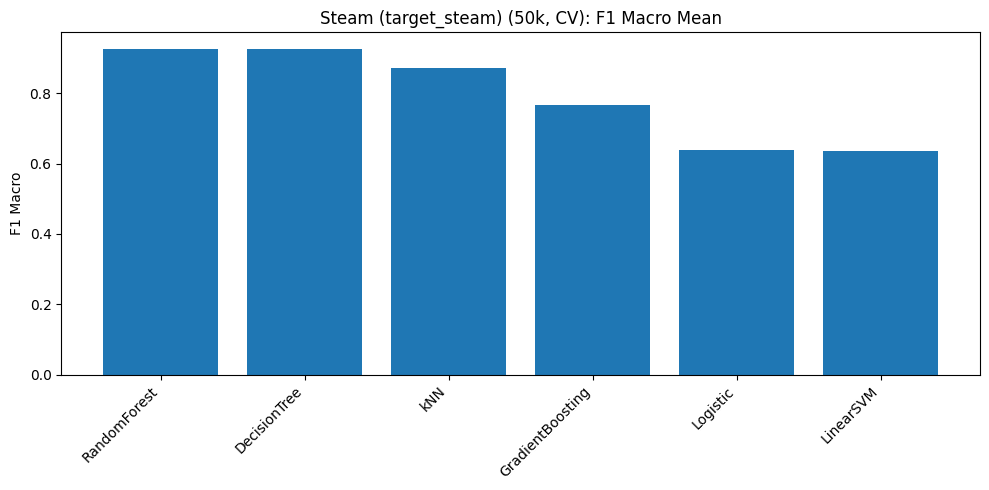

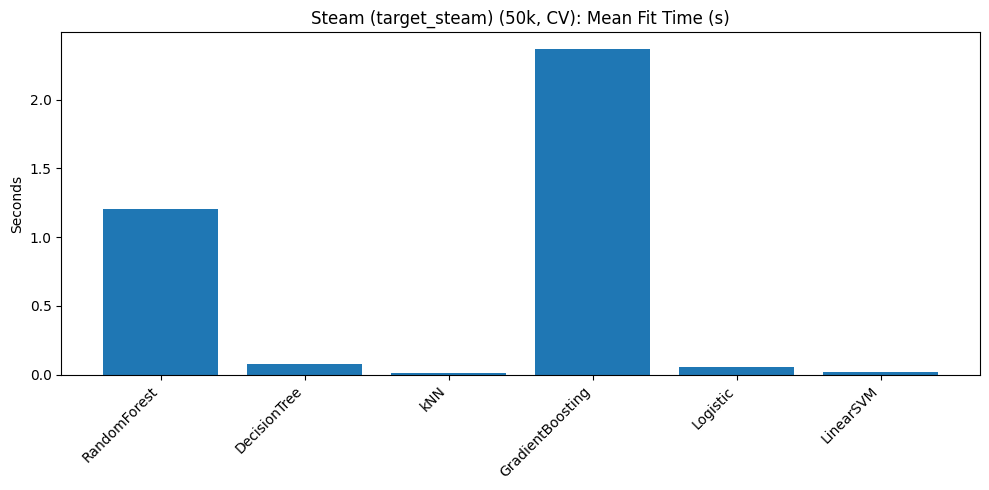

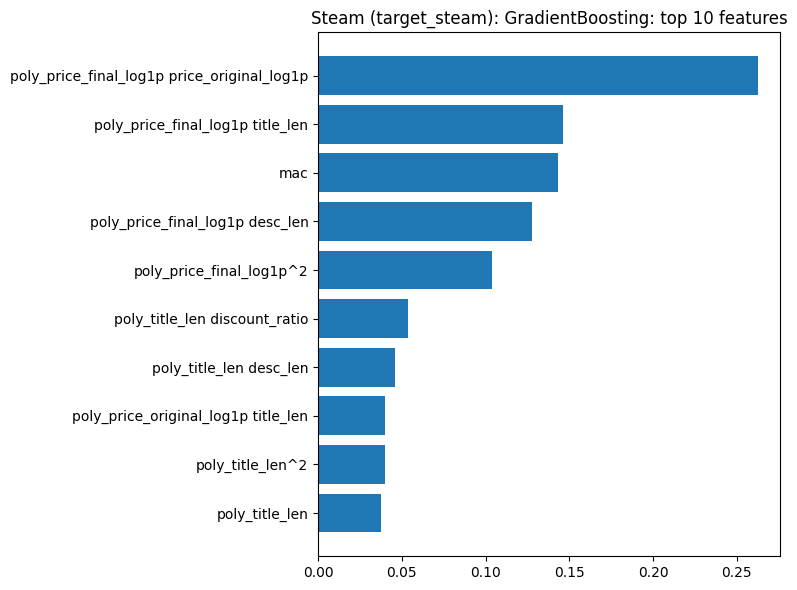

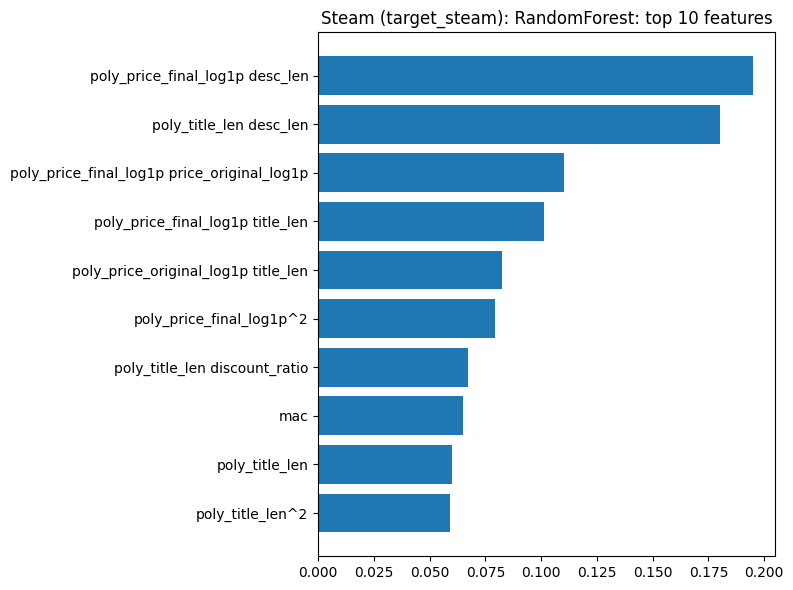

Steam (target_steam) elapsed: 10.21 s

Olist (target_olist): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.8760       0.0015        0.8766       0.9488           6.345             0.192             6.537             202.92
    DecisionTree        0.8086       0.0040        0.8087       0.8097           0.334             0.005             0.339               0.96
             kNN        0.6783       0.0017        0.6794       0.7516           0.015             0.426             0.441               5.57
GradientBoosting        0.6665       0.0039        0.6755       0.7370           6.089             0.016             6.104               0.14
        Logistic        0.5513       0.0025        0.5737       0.6092           0.080             0.004             0.084        

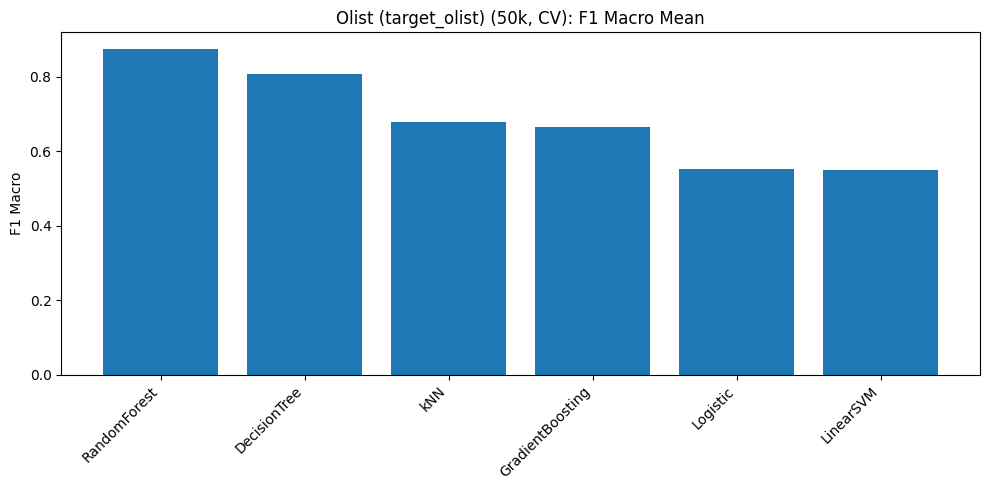

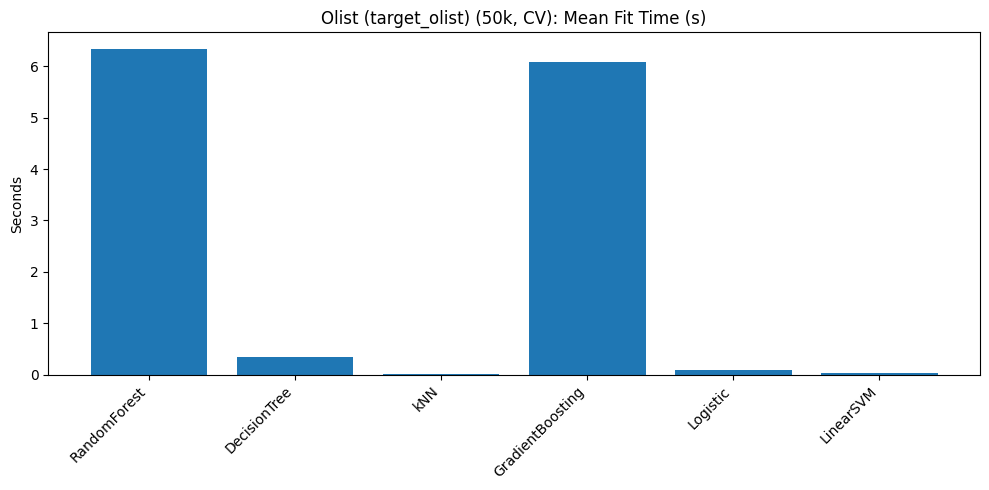

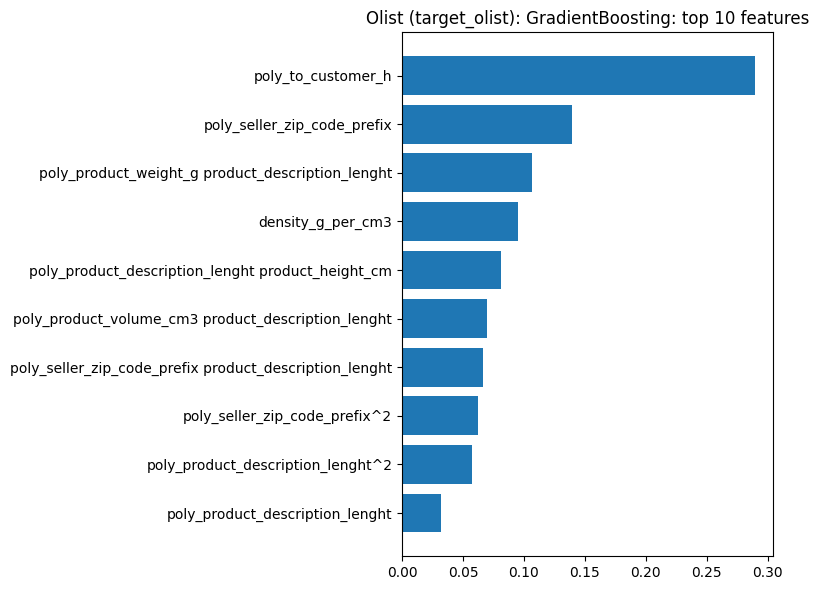

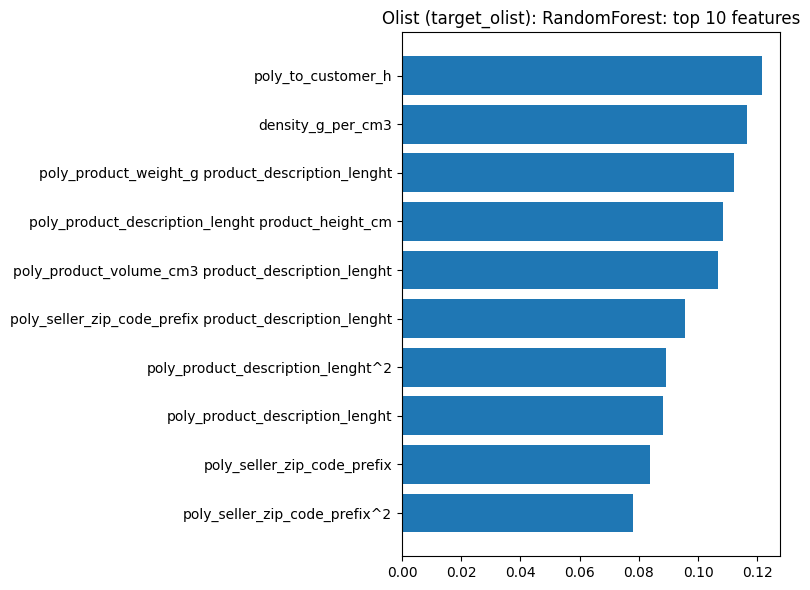

Olist (target_olist) elapsed: 18.67 s

VG2019 (target_sales): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.9559       0.0029        0.9561       0.9837           2.592             0.178             2.770              75.97
    DecisionTree        0.9517       0.0029        0.9519       0.9682           0.093             0.005             0.098               0.31
             kNN        0.8796       0.0041        0.8796       0.9516           0.013             0.093             0.106               5.57
GradientBoosting        0.7999       0.0036        0.8000       0.8861           2.926             0.018             2.944               0.14
        Logistic        0.7541       0.0032        0.7552       0.8179           0.146             0.004             0.151       

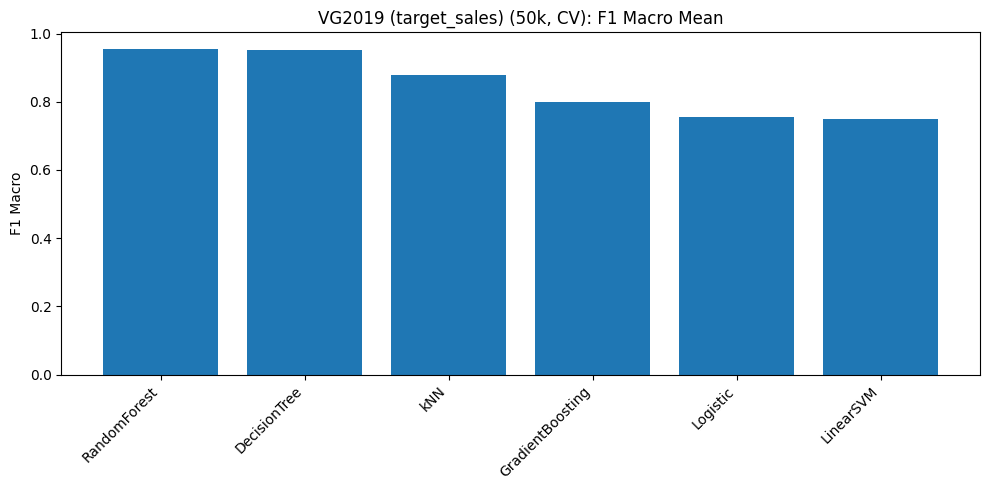

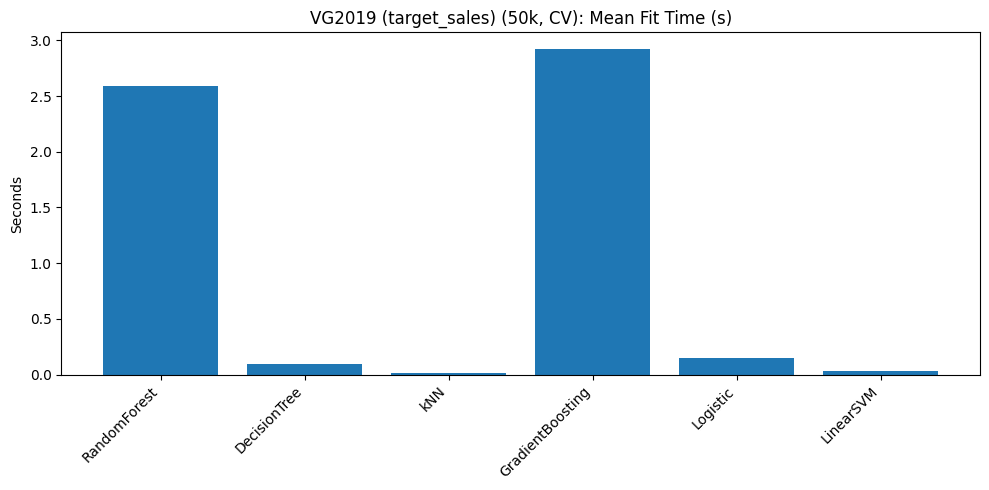

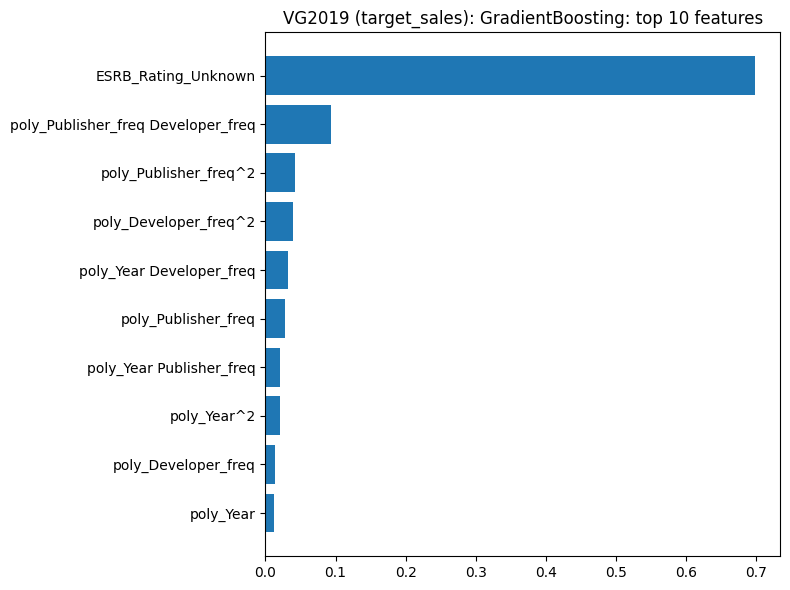

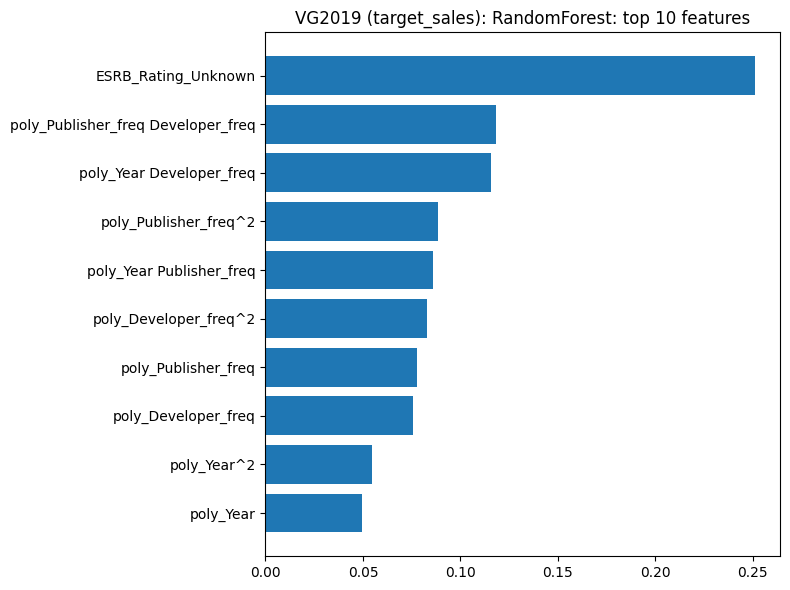

VG2019 (target_sales) elapsed: 9.83 s
prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train stats: {'n': 955509, 'mean': 86.35820698706135, 'std': 10.978047160242102, 'min': 0.0, 'max': 100.0}
steam y_test stats: {'n': 44492, 'mean': 81.25285444574305, 'std': 15.442551141752842, 'min': 0.0, 'max': 100.0}
target_olist train stats: {'n': 89954, 'mean': 4.058243751525879, 'std': 0.8512095808982849, 'min': 1.0, 'max': 5.0}
target_olist test stats: {'n': 22489, 'mean': 4.053517818450928, 'std': 0.8607538342475891, 'min': 1.0, 'max': 5.0}
target_sales train stats: {'n': 5228, 'mean': 7.202467441558838, 'std': 1.45883047580719, 'min': 1.0, 'max': 10.0}
target_sales test stats: {'n': 1308, 'mean': 7.258639812469482, 'std': 1.4334877729415894, 'min': 1.5, 'max': 10.0}
scaled columns: 12 with standard
polynomial features added: 90 (from 12 columns)


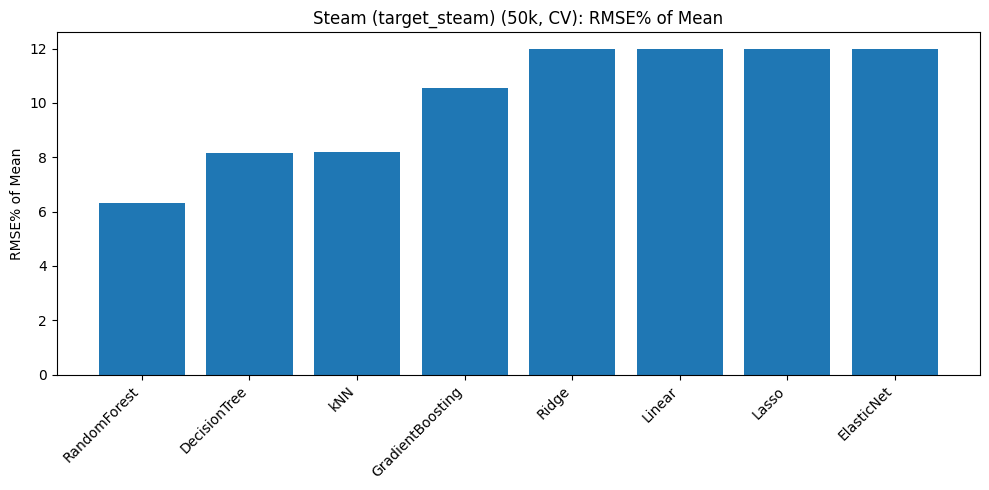

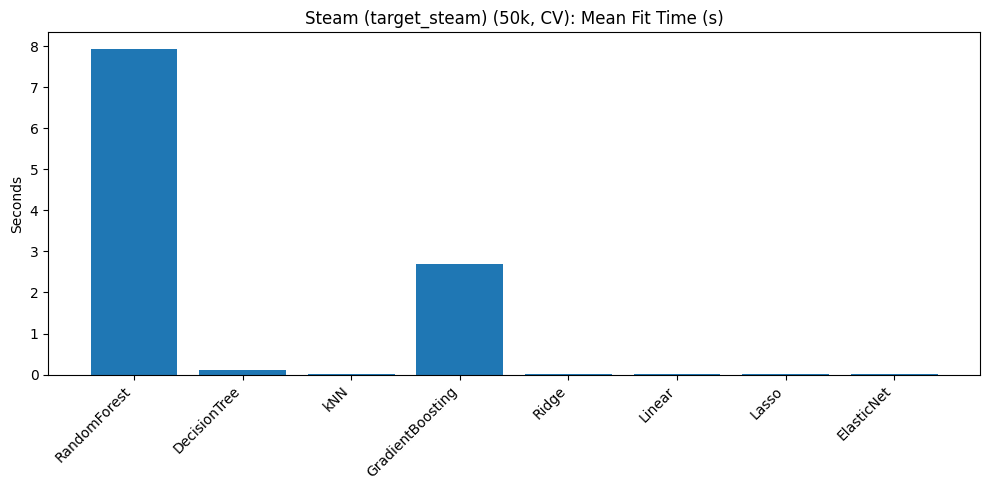

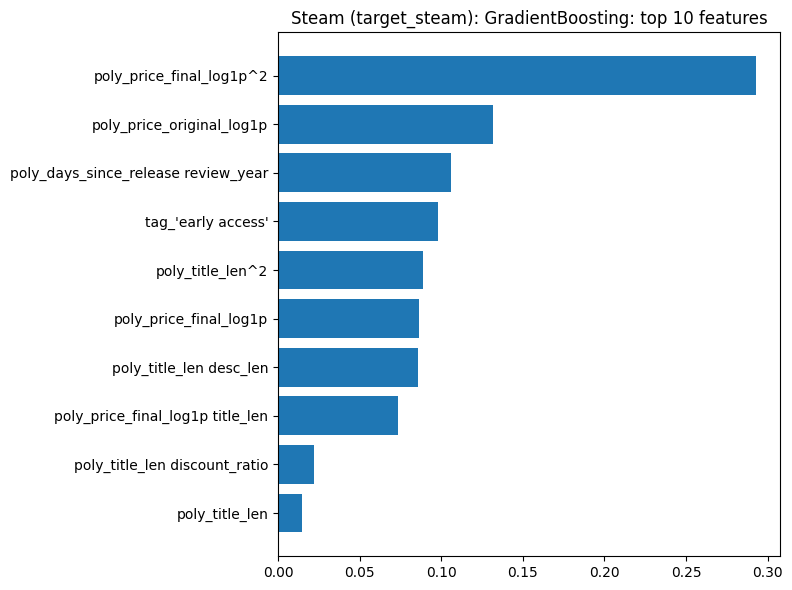

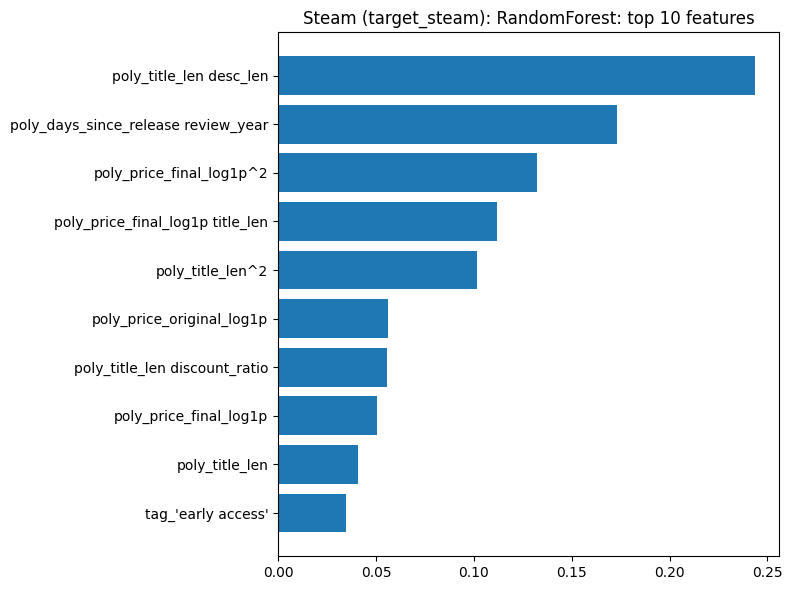

Steam (target_steam) elapsed: 19.14 s

Olist (target_olist): build 50k sample and run 5-fold regression CV

sample: picked 50000 rows (quantile-binned by target)
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.5048    0.7469  0.2343        12.44         18.41          29.775             0.231            30.005             740.74
GradientBoosting   0.5634    0.8007  0.1198        13.89         19.74           5.773             0.006             5.779               0.14
           Ridge   0.5732    0.8097  0.1000        14.13         19.96           0.006             0.001             0.007               0.00
          Linear   0.5732    0.8097  0.1000        14.13         19.96           0.011             0.002             0.013               0.00
      ElasticNet   0.5732    0.8097  0.1000        14.13         19.96           0.007             0.002             0.008      

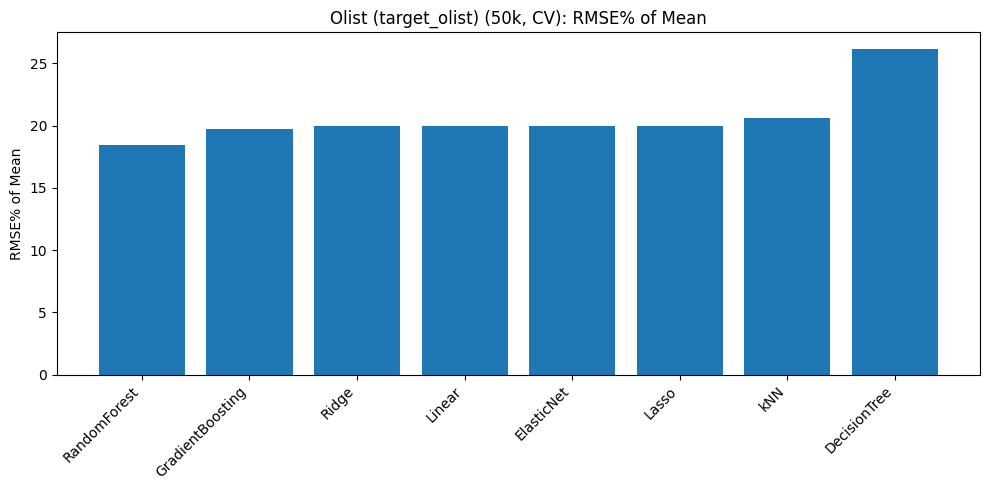

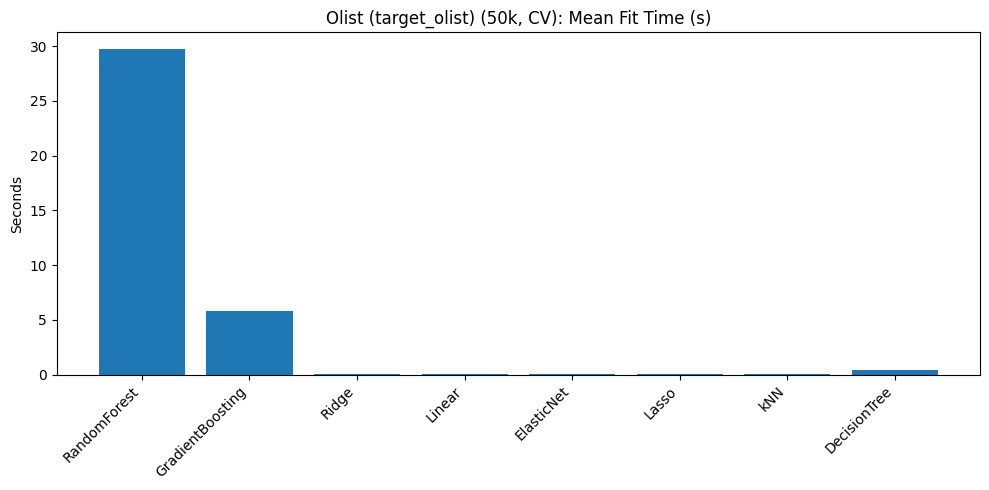

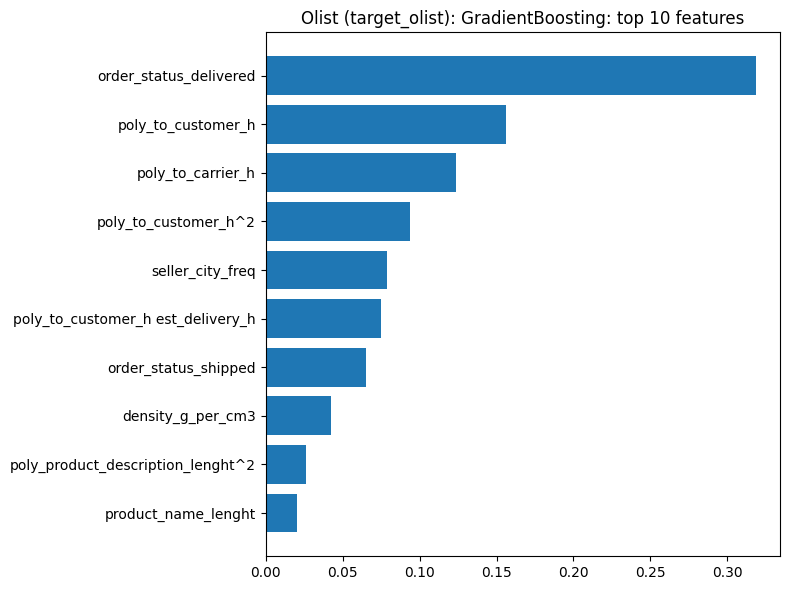

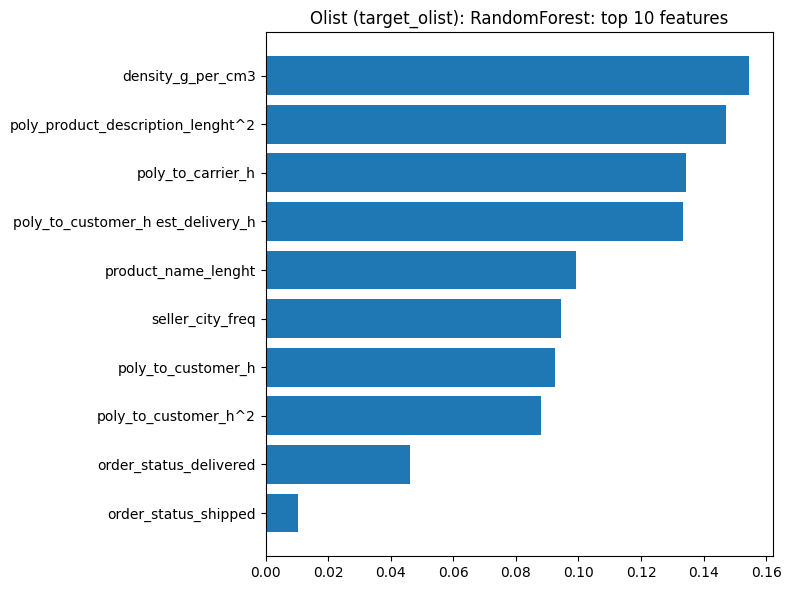

Olist (target_olist) elapsed: 44.96 s

VG2019 (target_sales): build 50k sample and run 5-fold regression CV

sample: using all 6536 rows
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   1.0017    1.3506  0.1355        13.89         18.72           1.408             0.041             1.449              90.90
GradientBoosting   1.0547    1.3528  0.1330        14.62         18.75           0.375             0.002             0.378               0.13
           Ridge   1.1053    1.4117  0.0558        15.32         19.57           0.002             0.001             0.003               0.00
          Linear   1.1053    1.4117  0.0558        15.32         19.57           0.002             0.001             0.003               0.00
      ElasticNet   1.1053    1.4117  0.0558        15.32         19.57           0.002             0.001             0.002               0.00
           

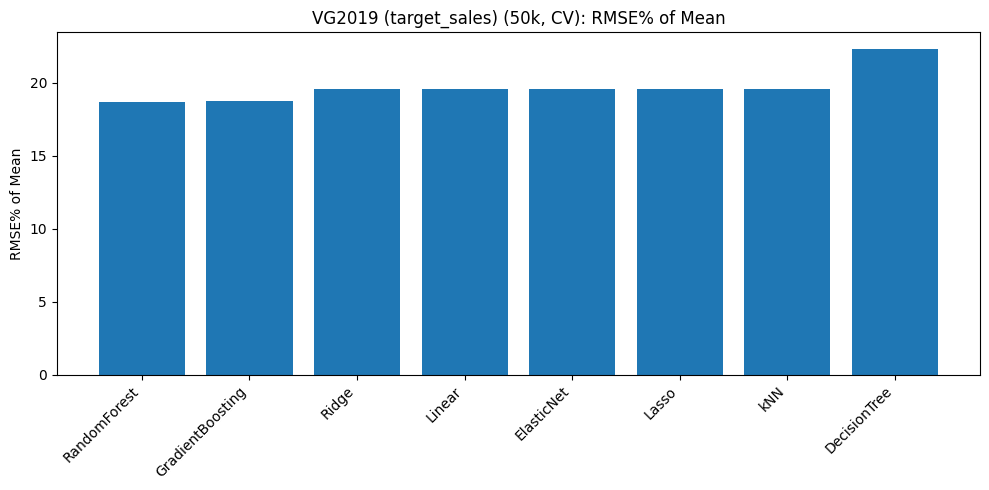

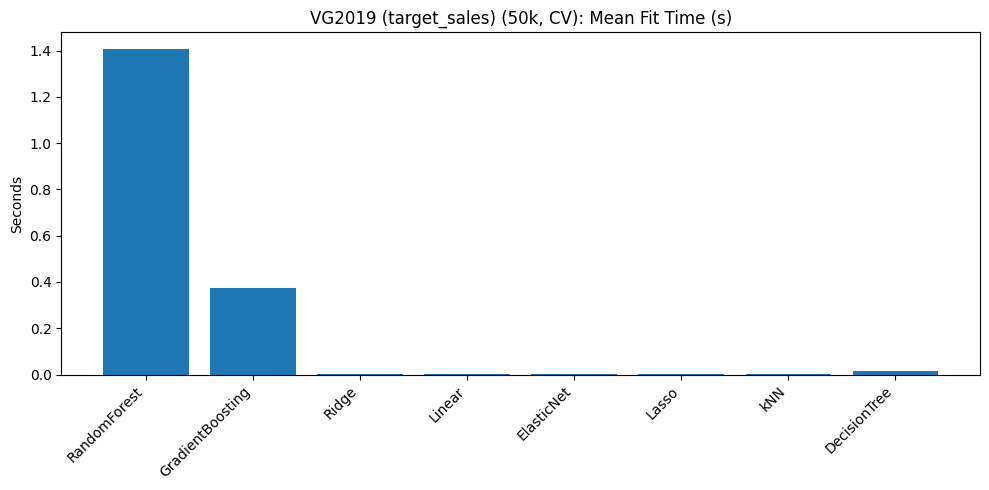

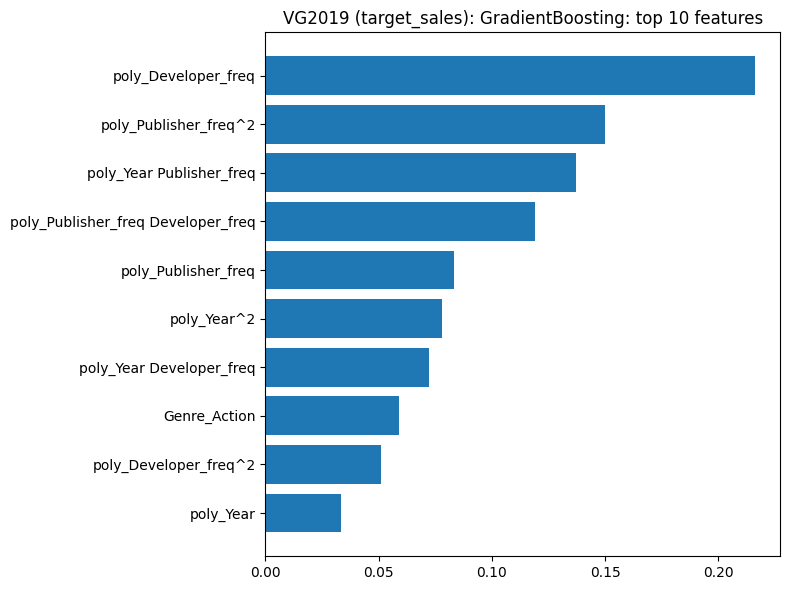

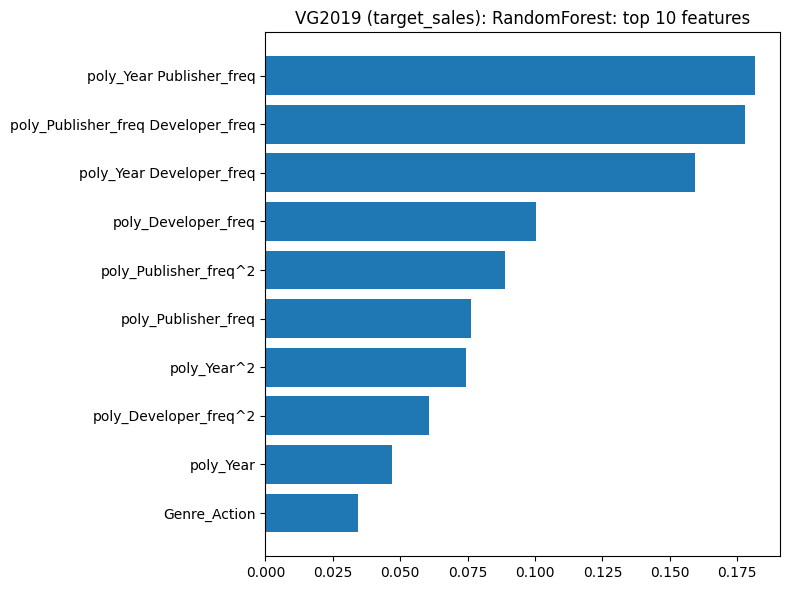

VG2019 (target_sales) elapsed: 4.94 s

SUMMARY TIME (seconds)

Classification total: 143.42
  Steam:  10.21
  Olist:  18.67
  VG2019: 9.83

Regression total:    2169.21
  Steam:  19.14
  Olist:  44.96
  VG2019: 4.94

ALL STEPS TOTAL:     2312.63 seconds

CSV outputs (created during runs):
 - steam_(target_steam)_cls_cv_50k_results.csv
 - olist_(target_olist)_cls_cv_50k_results.csv
 - vg2019_(target_sales)_cls_cv_50k_results.csv
 - steam_(target_steam)_reg_cv_50k_results.csv
 - olist_(target_olist)_reg_cv_50k_results.csv
 - vg2019_(target_sales)_reg_cv_50k_results.csv

FEATURE SELECTION K=20 RUN


RUNNING FULL PIPELINE WITH FEATURE SELECT K=20

prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train counts: {1: 781248, 0: 174261}
steam y_test counts: {1: 28773, 0: 15719}
steam balanced train counts: {1: 174261, 0: 174261}
target_olist train c

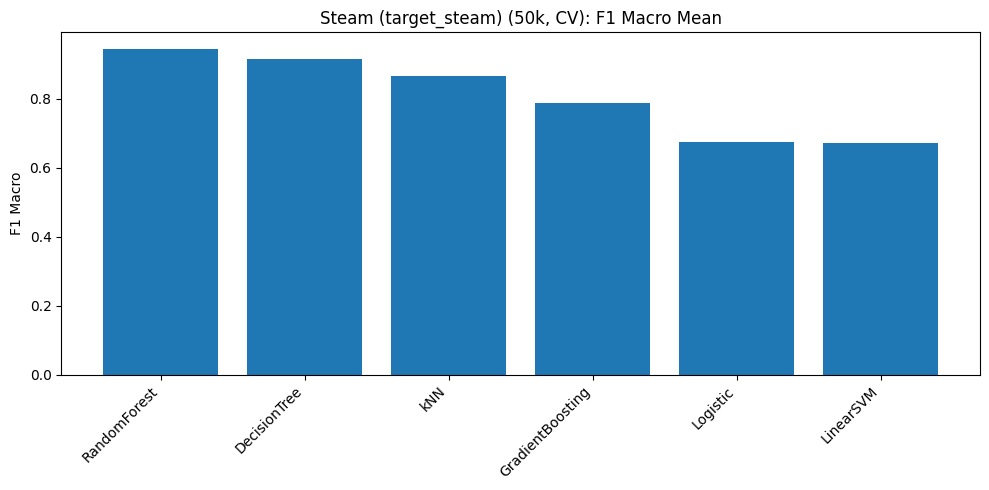

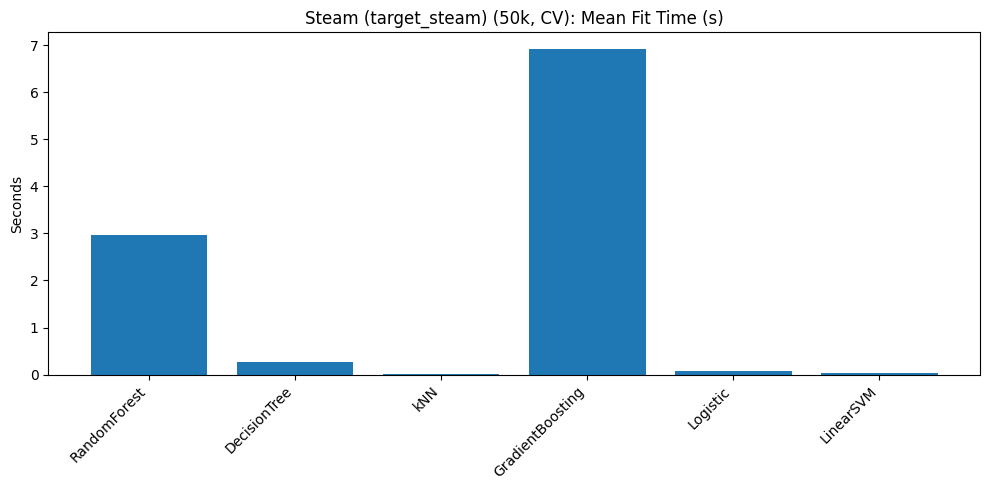

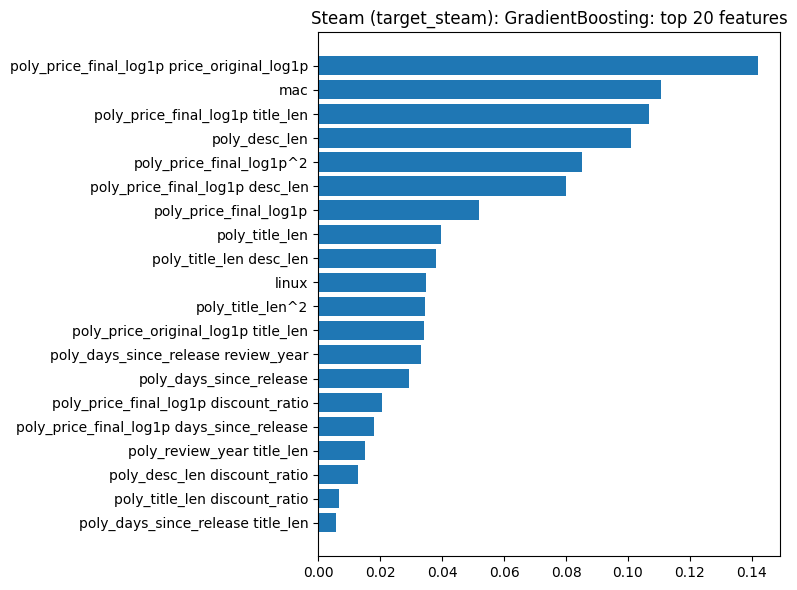

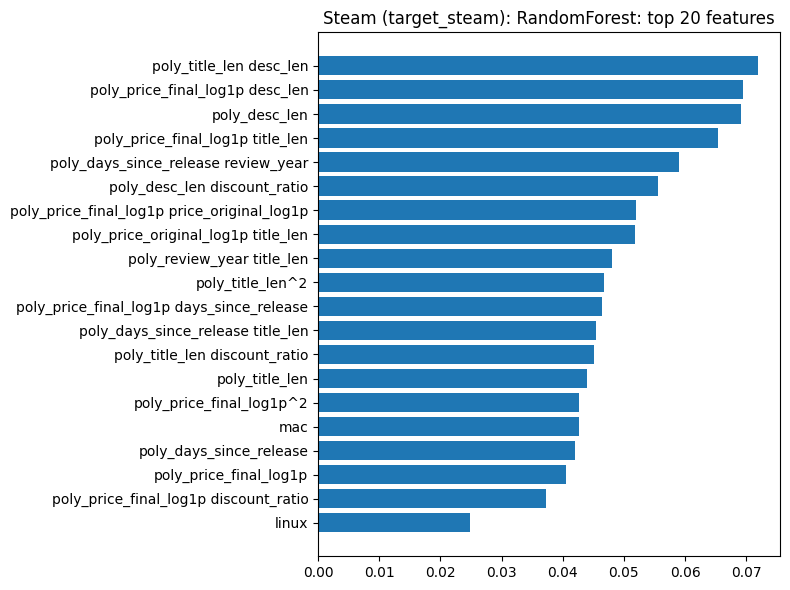

Steam (target_steam) elapsed: 17.65 s

Olist (target_olist): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.8939       0.0014        0.8945       0.9590           9.237             0.236             9.473             181.55
    DecisionTree        0.8396       0.0059        0.8397       0.8406           0.612             0.006             0.618               0.78
             kNN        0.7270       0.0018        0.7278       0.8119           0.007             1.676             1.684               3.36
GradientBoosting        0.6792       0.0048        0.6895       0.7531          11.249             0.017            11.266               0.14
        Logistic        0.5825       0.0027        0.6027       0.6403           0.387             0.005             0.392        

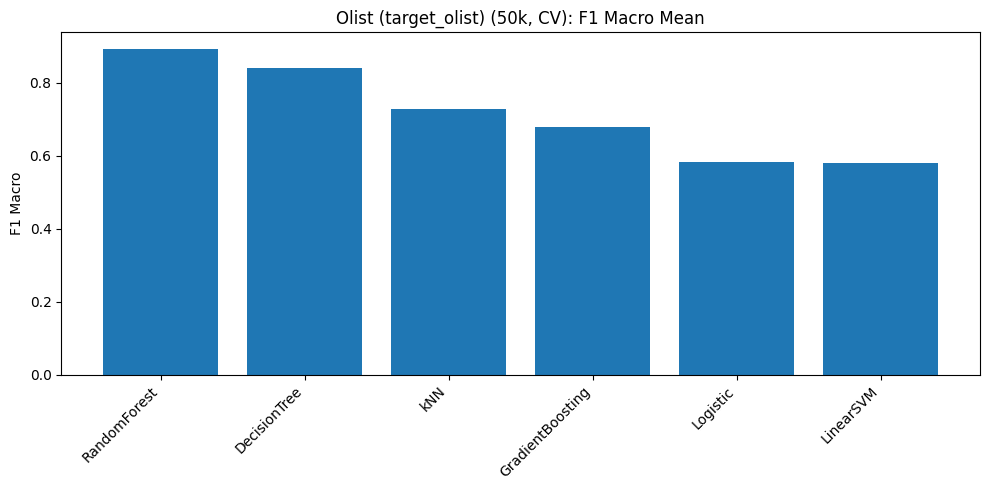

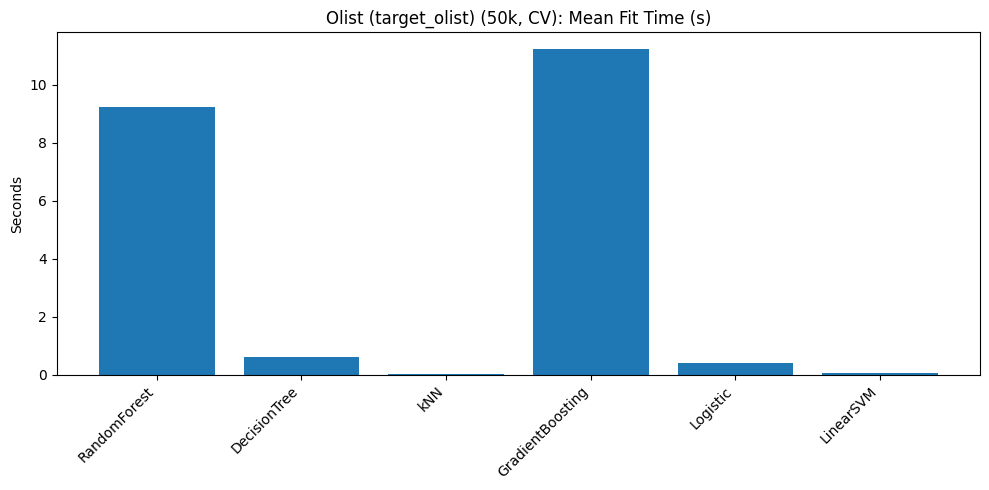

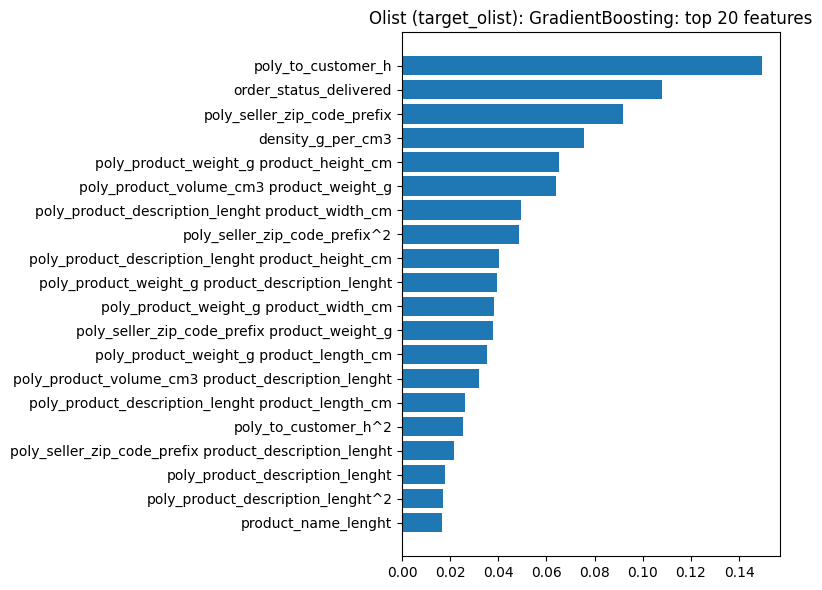

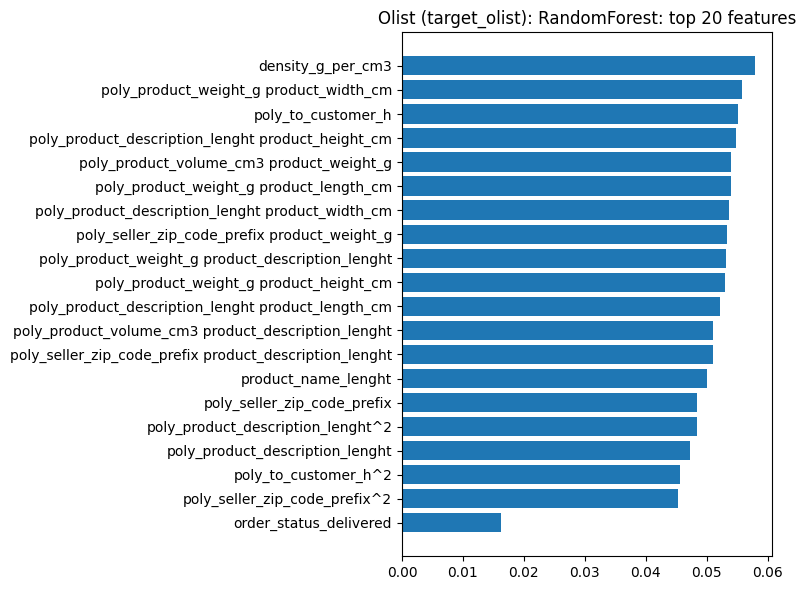

Olist (target_olist) elapsed: 27.45 s

VG2019 (target_sales): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.9761       0.0009        0.9762       0.9941           2.325             0.181             2.507              92.57
    DecisionTree        0.9664       0.0008        0.9666       0.9708           0.126             0.006             0.132               0.36
             kNN        0.8826       0.0029        0.8826       0.9538           0.017             1.742             1.759               6.41
GradientBoosting        0.8195       0.0018        0.8198       0.9002           3.479             0.019             3.498               0.14
       LinearSVM        0.7789       0.0017        0.7789       0.8458           0.056             0.009             0.065       

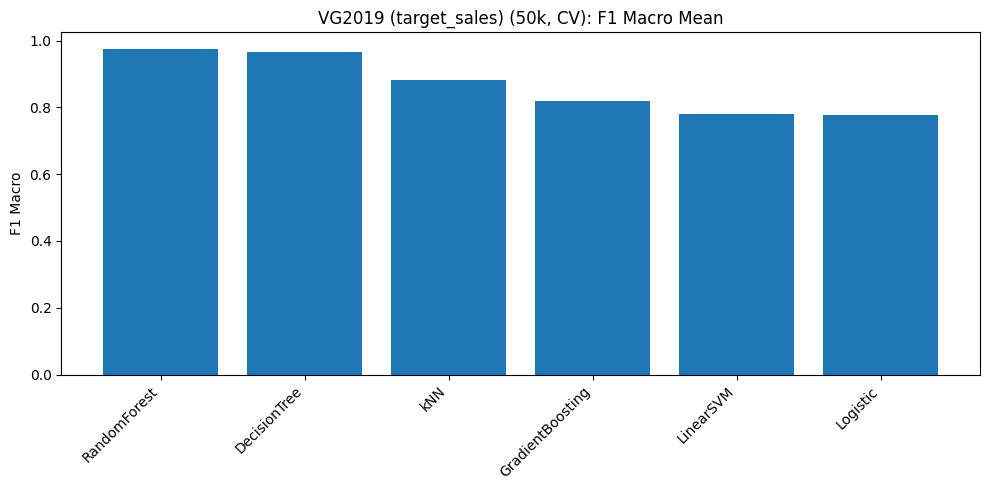

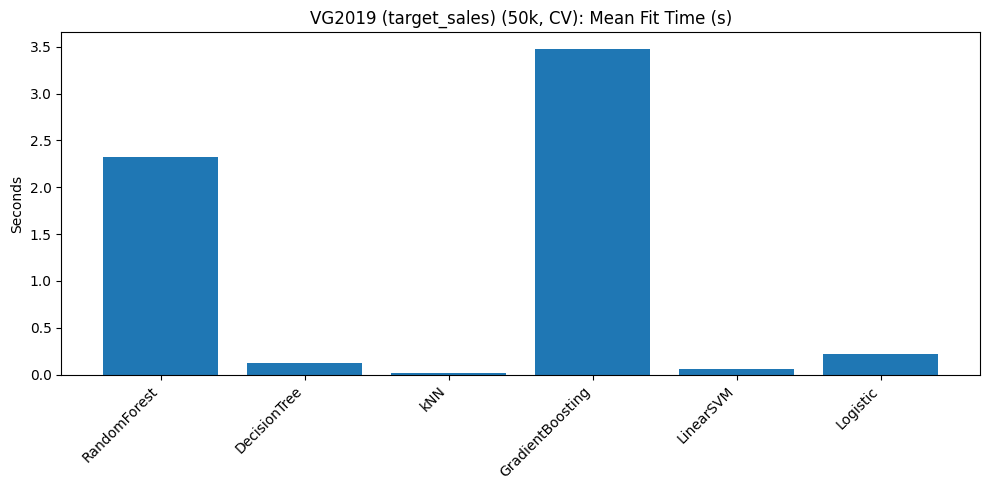

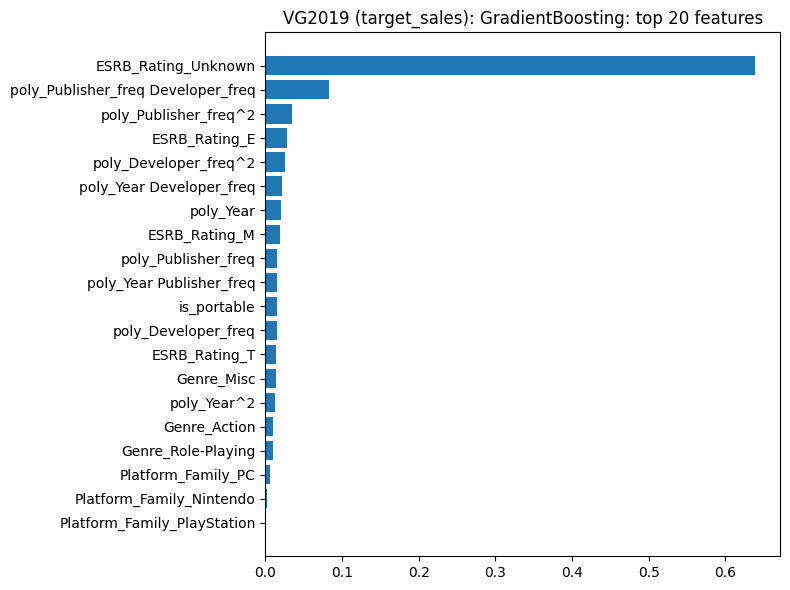

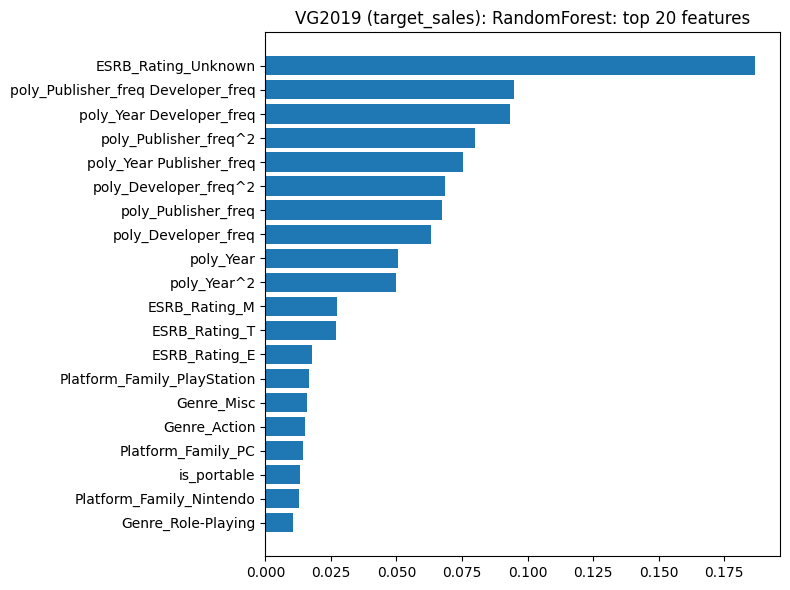

VG2019 (target_sales) elapsed: 12.41 s
prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train stats: {'n': 955509, 'mean': 86.35820698706135, 'std': 10.978047160242102, 'min': 0.0, 'max': 100.0}
steam y_test stats: {'n': 44492, 'mean': 81.25285444574305, 'std': 15.442551141752842, 'min': 0.0, 'max': 100.0}
target_olist train stats: {'n': 89954, 'mean': 4.058243751525879, 'std': 0.8512095808982849, 'min': 1.0, 'max': 5.0}
target_olist test stats: {'n': 22489, 'mean': 4.053517818450928, 'std': 0.8607538342475891, 'min': 1.0, 'max': 5.0}
target_sales train stats: {'n': 5228, 'mean': 7.202467441558838, 'std': 1.45883047580719, 'min': 1.0, 'max': 10.0}
target_sales test stats: {'n': 1308, 'mean': 7.258639812469482, 'std': 1.4334877729415894, 'min': 1.5, 'max': 10.0}
scaled columns: 12 with standard
polynomial features added: 90 (from 12 columns)

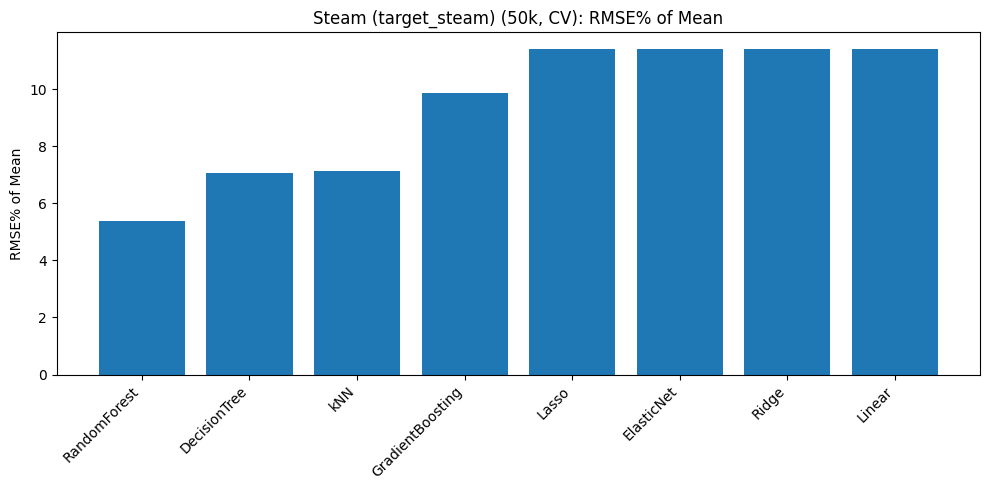

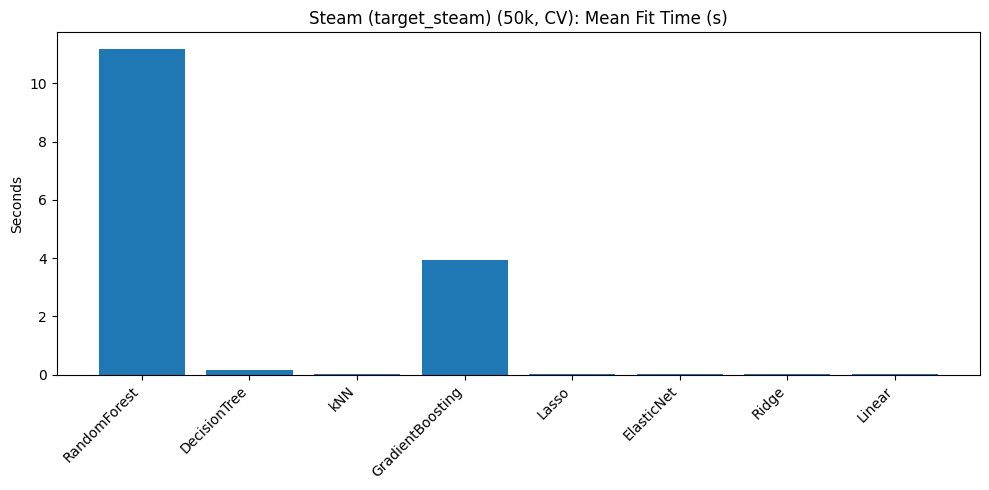

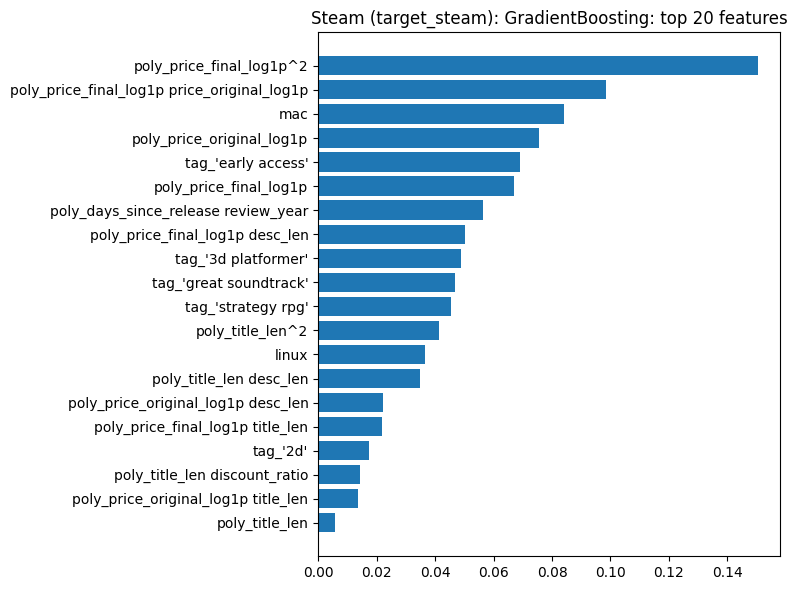

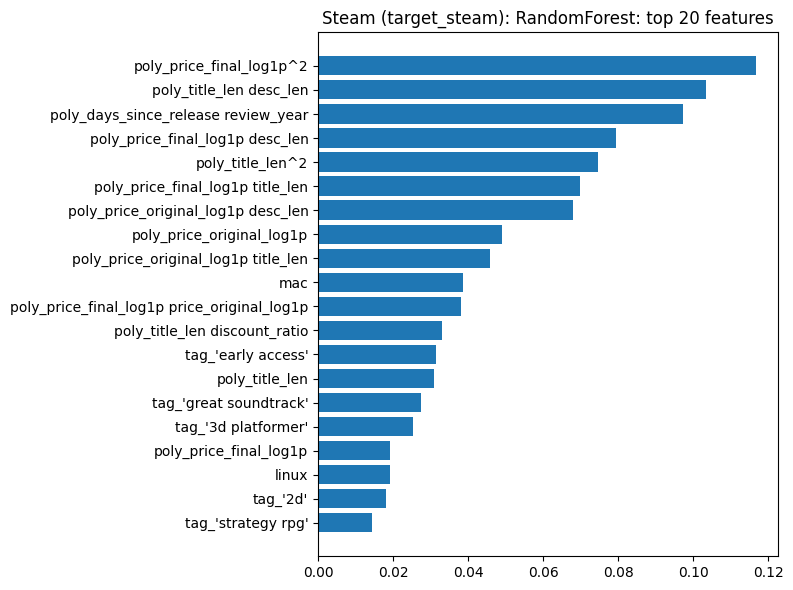

Steam (target_steam) elapsed: 24.67 s

Olist (target_olist): build 50k sample and run 5-fold regression CV

sample: picked 50000 rows (quantile-binned by target)
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.4708    0.7224  0.2836        11.60         17.81          74.575             0.147            74.722             650.31
GradientBoosting   0.5566    0.7903  0.1426        13.72         19.48          12.748             0.007            12.754               0.14
      ElasticNet   0.5709    0.8086  0.1025        14.07         19.93           0.012             0.002             0.014               0.00
           Lasso   0.5709    0.8086  0.1025        14.07         19.93           0.010             0.002             0.011               0.00
           Ridge   0.5709    0.8086  0.1025        14.07         19.93           0.008             0.002             0.010      

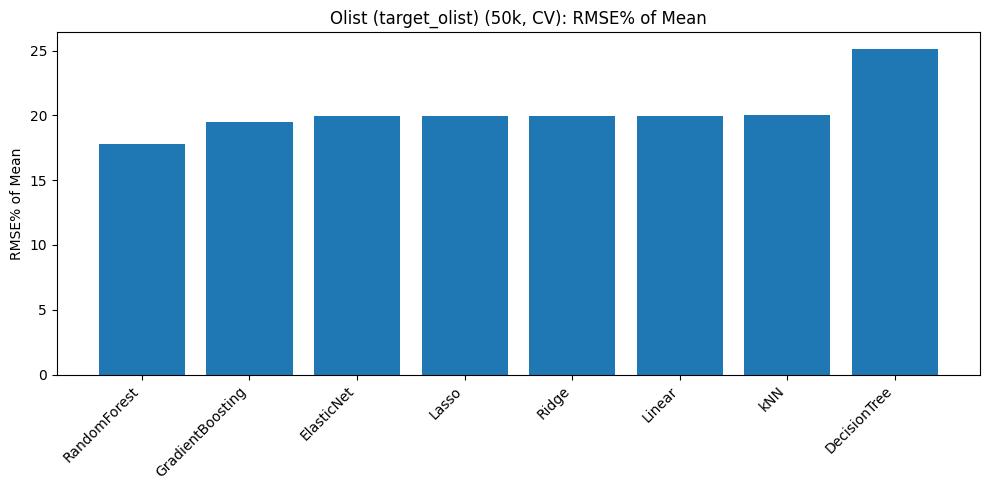

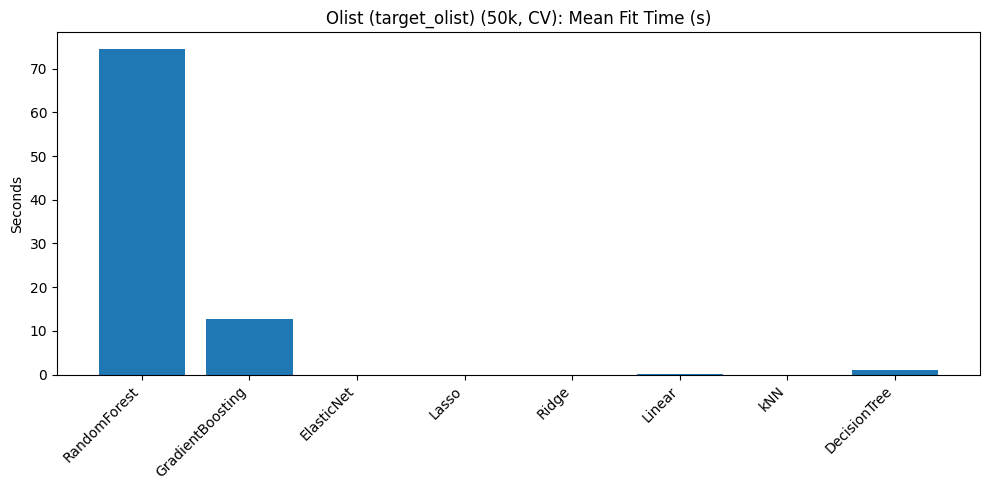

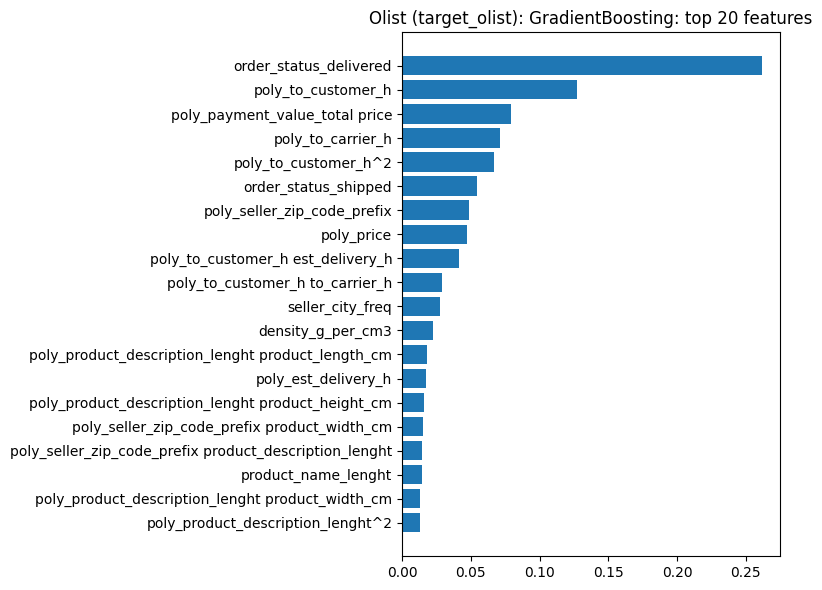

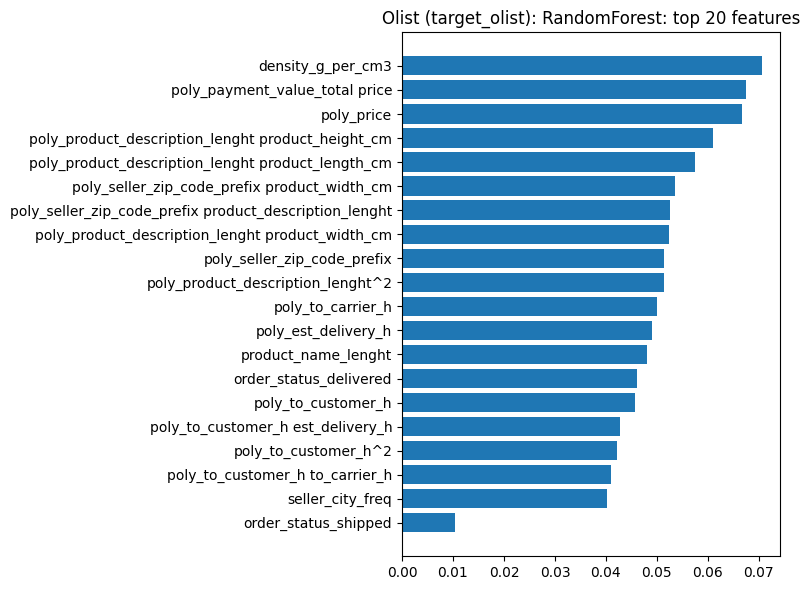

Olist (target_olist) elapsed: 96.77 s

VG2019 (target_sales): build 50k sample and run 5-fold regression CV

sample: using all 6536 rows
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.9364    1.2592  0.2488        12.98         17.46           1.855             0.045             1.901             114.86
GradientBoosting   1.0335    1.3261  0.1669        14.33         18.38           0.449             0.002             0.452               0.14
      ElasticNet   1.0863    1.3845  0.0918        15.06         19.19           0.003             0.001             0.005               0.00
           Lasso   1.0863    1.3845  0.0918        15.06         19.19           0.004             0.001             0.005               0.00
           Ridge   1.0864    1.3845  0.0918        15.06         19.19           0.004             0.001             0.005               0.00
          L

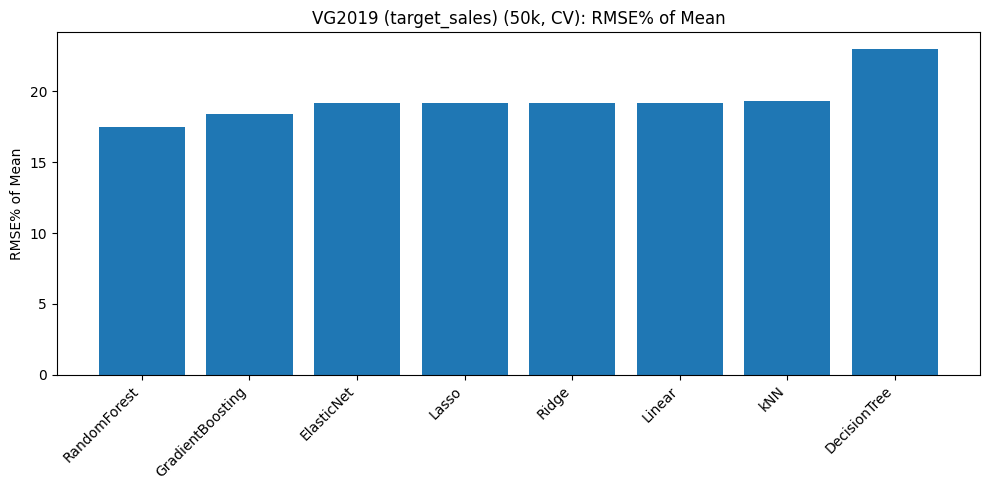

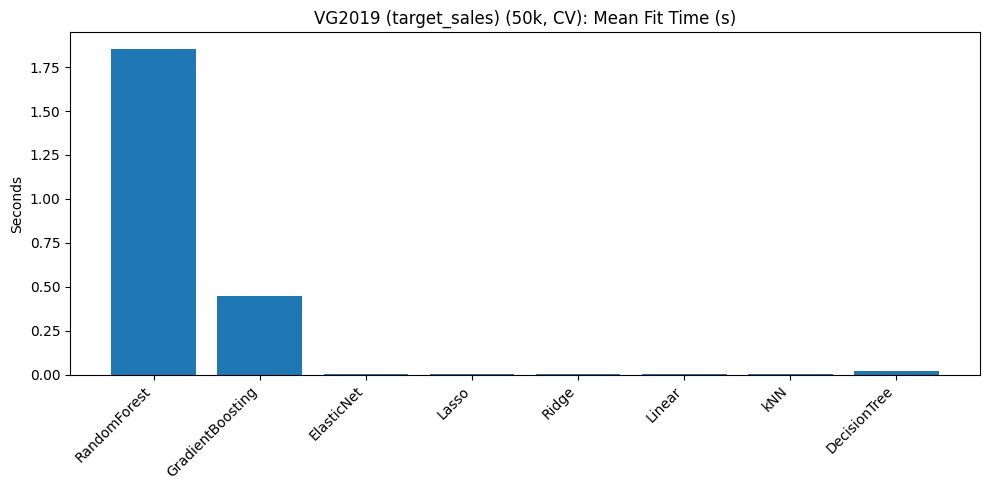

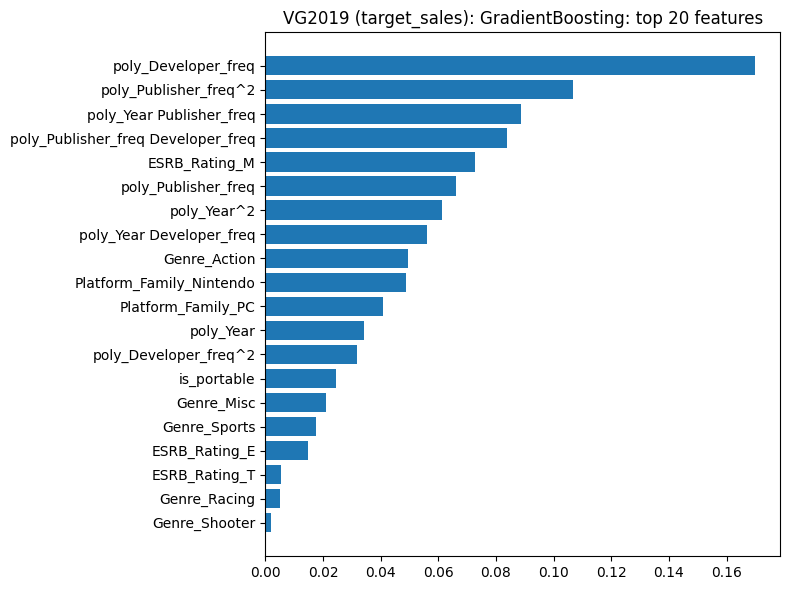

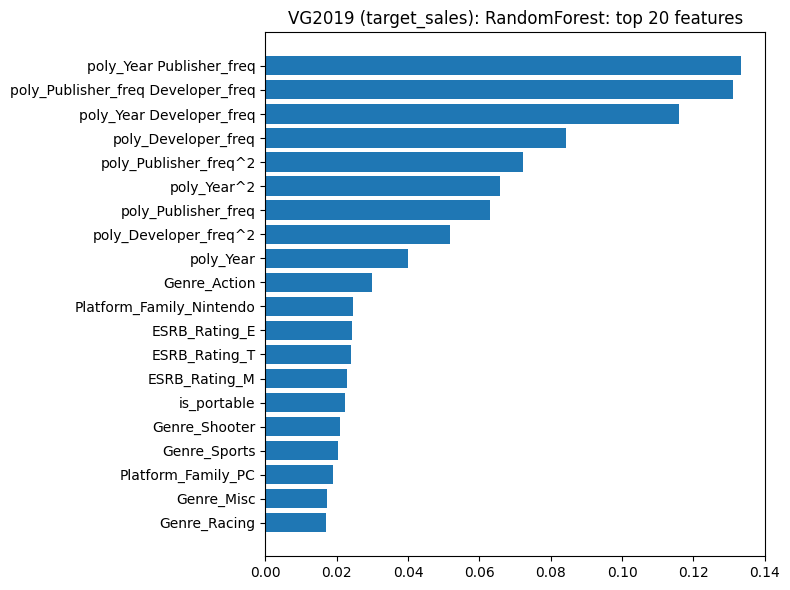

VG2019 (target_sales) elapsed: 5.07 s

SUMMARY TIME (seconds)

Classification total: 164.90
  Steam:  17.65
  Olist:  27.45
  VG2019: 12.41

Regression total:    2256.07
  Steam:  24.67
  Olist:  96.77
  VG2019: 5.07

ALL STEPS TOTAL:     4733.60 seconds

CSV outputs (created during runs):
 - steam_(target_steam)_cls_cv_50k_results.csv
 - olist_(target_olist)_cls_cv_50k_results.csv
 - vg2019_(target_sales)_cls_cv_50k_results.csv
 - steam_(target_steam)_reg_cv_50k_results.csv
 - olist_(target_olist)_reg_cv_50k_results.csv
 - vg2019_(target_sales)_reg_cv_50k_results.csv

FEATURE SELECTION K=30 RUN


RUNNING FULL PIPELINE WITH FEATURE SELECT K=30

prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train counts: {1: 781248, 0: 174261}
steam y_test counts: {1: 28773, 0: 15719}
steam balanced train counts: {1: 174261, 0: 174261}
target_olist train 

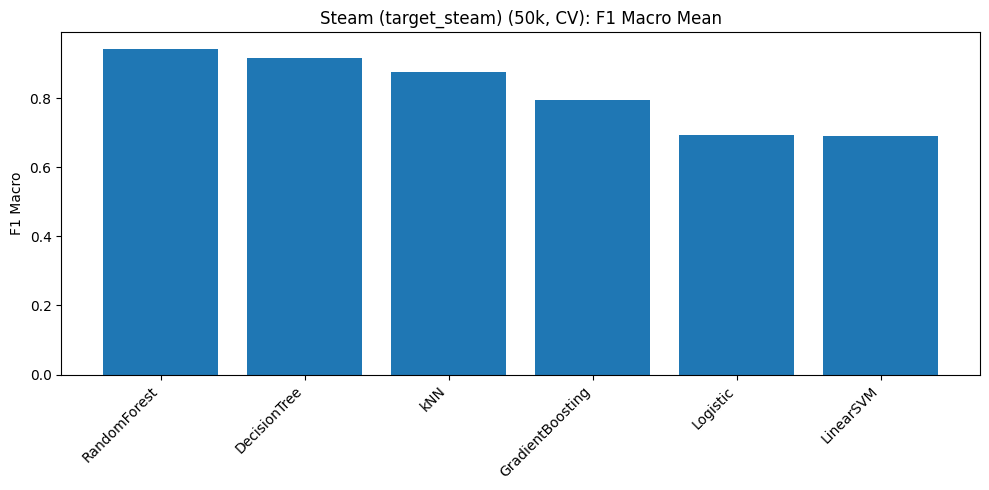

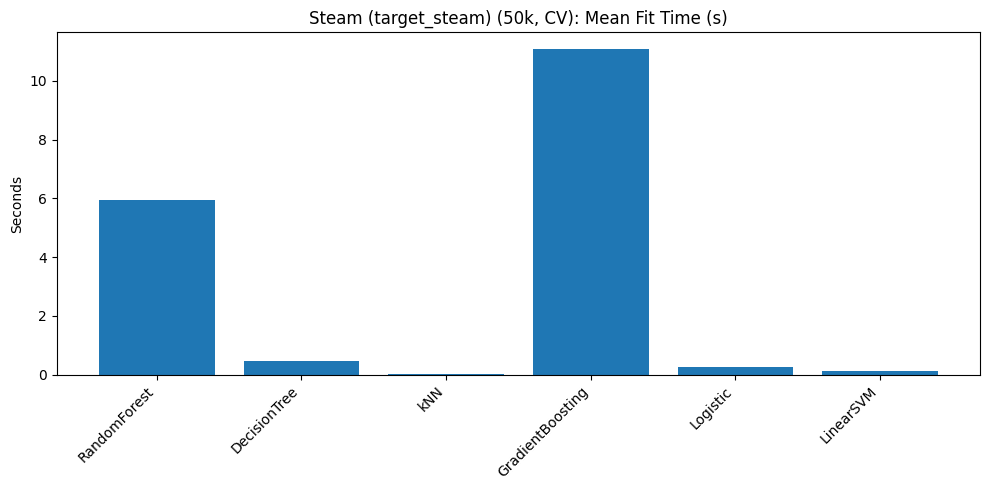

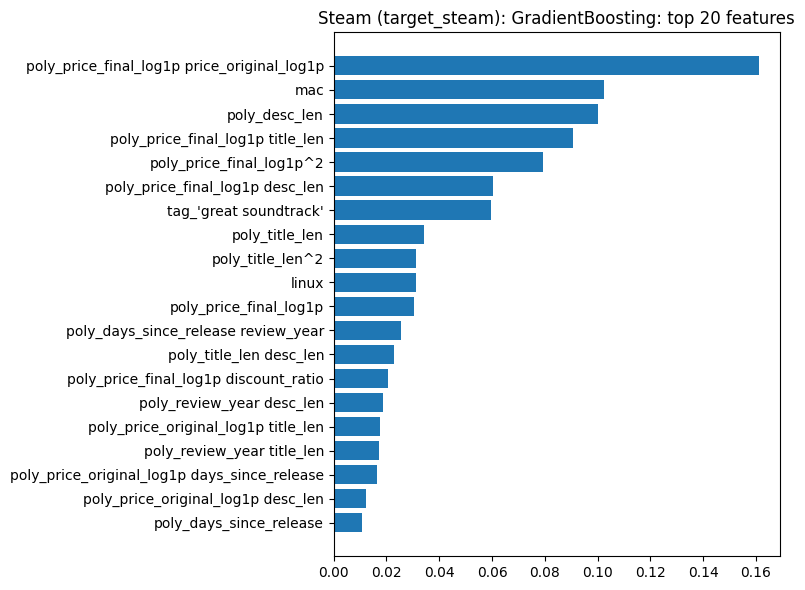

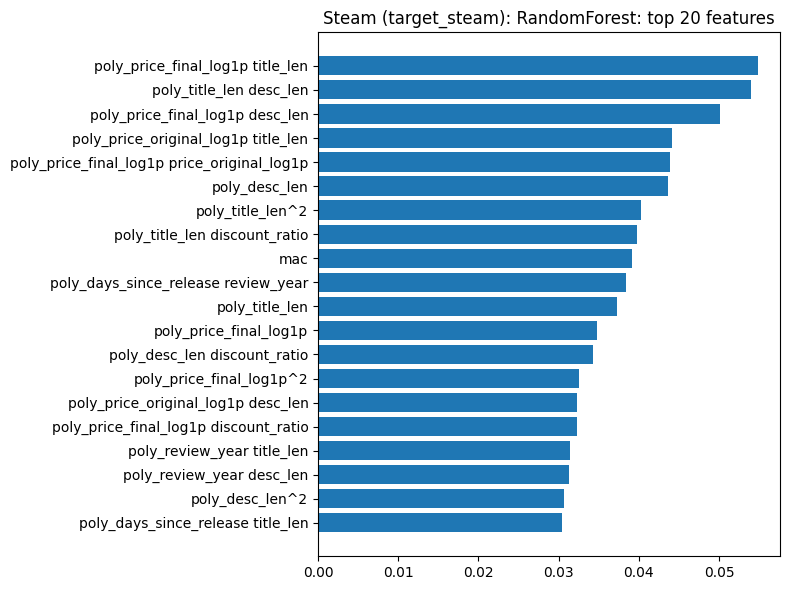

Steam (target_steam) elapsed: 24.12 s

Olist (target_olist): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.8963       0.0027        0.8968       0.9617           9.993             0.190            10.183             172.65
    DecisionTree        0.8401       0.0050        0.8403       0.8412           0.894             0.006             0.900               0.73
             kNN        0.7384       0.0035        0.7392       0.8229           0.009             1.730             1.738               4.89
GradientBoosting        0.6814       0.0048        0.6908       0.7553          16.714             0.017            16.732               0.14
        Logistic        0.5871       0.0024        0.6059       0.6441           0.652             0.005             0.657        

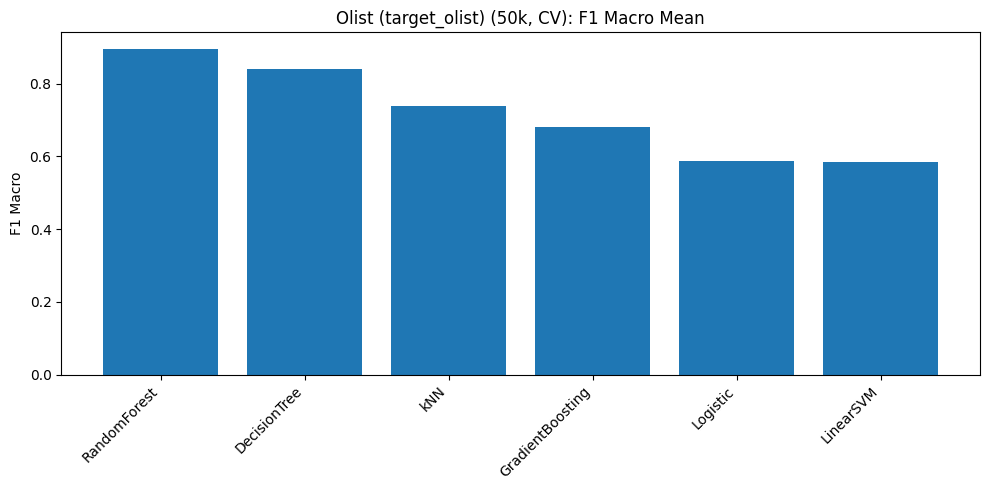

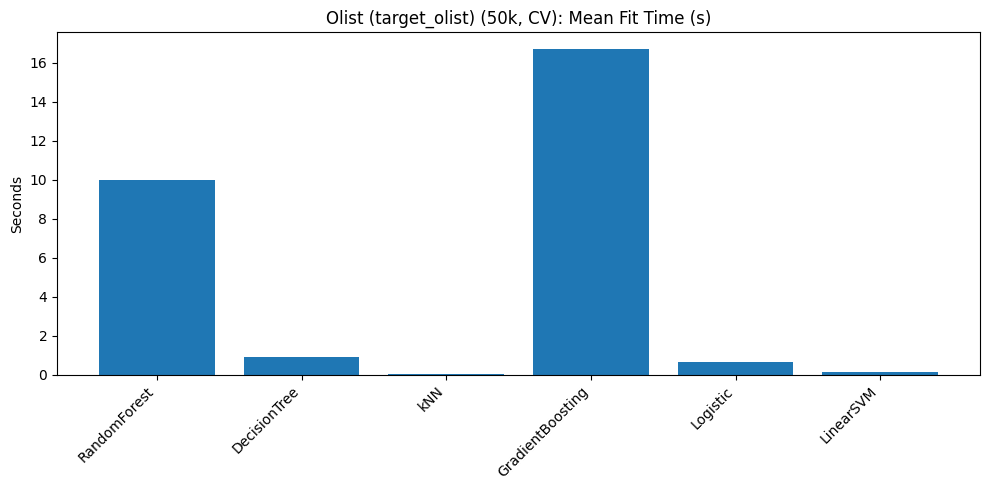

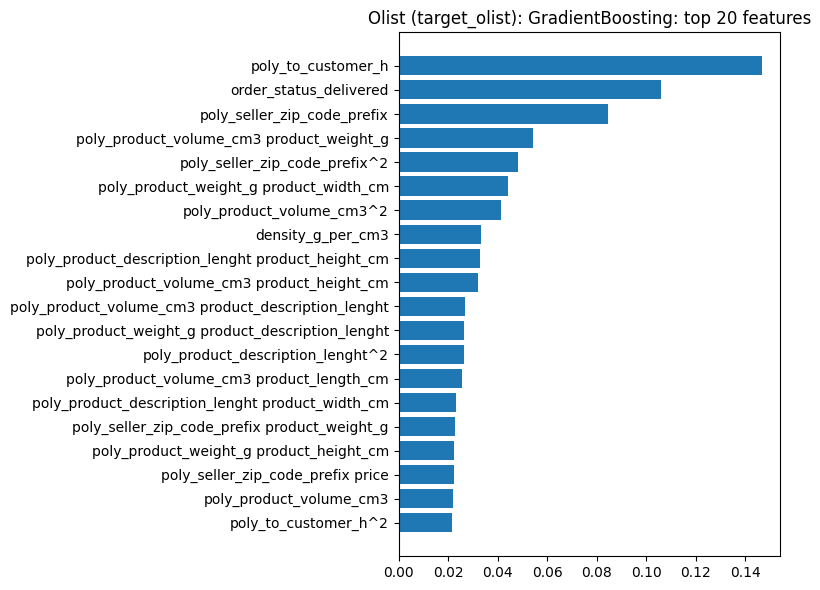

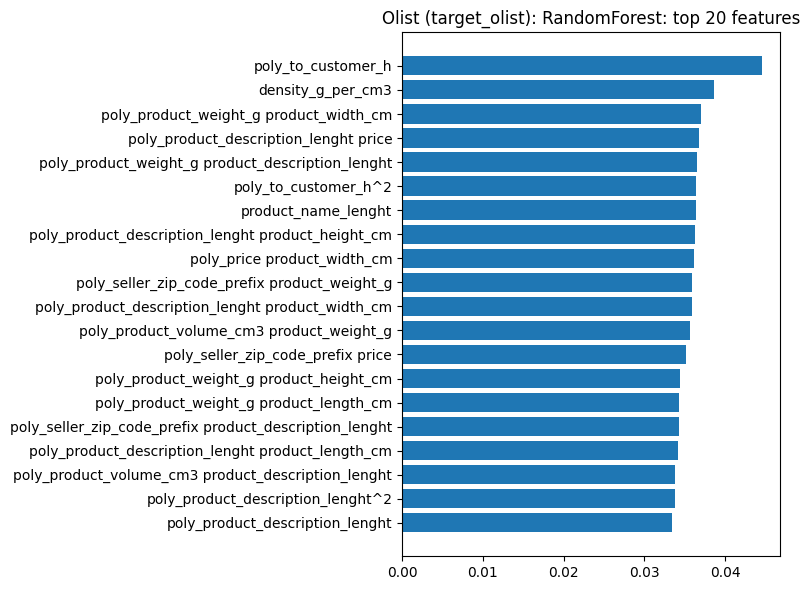

Olist (target_olist) elapsed: 35.51 s

VG2019 (target_sales): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.9791       0.0007        0.9793       0.9955           2.346             0.187             2.533              94.83
    DecisionTree        0.9675       0.0009        0.9677       0.9710           0.145             0.006             0.151               0.35
             kNN        0.8816       0.0021        0.8816       0.9543           0.023             1.733             1.756               9.46
GradientBoosting        0.8219       0.0011        0.8222       0.9020           3.896             0.020             3.915               0.14
        Logistic        0.7827       0.0018        0.7828       0.8504           0.925             0.010             0.935       

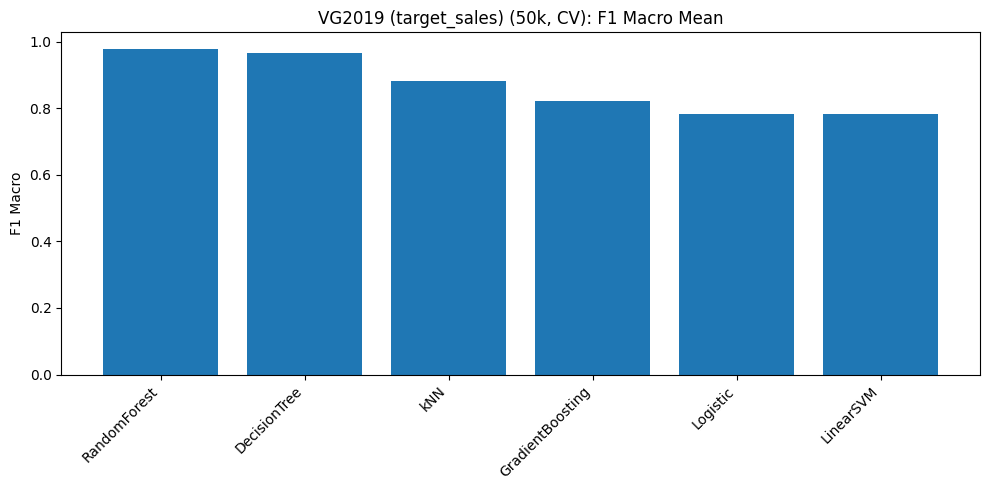

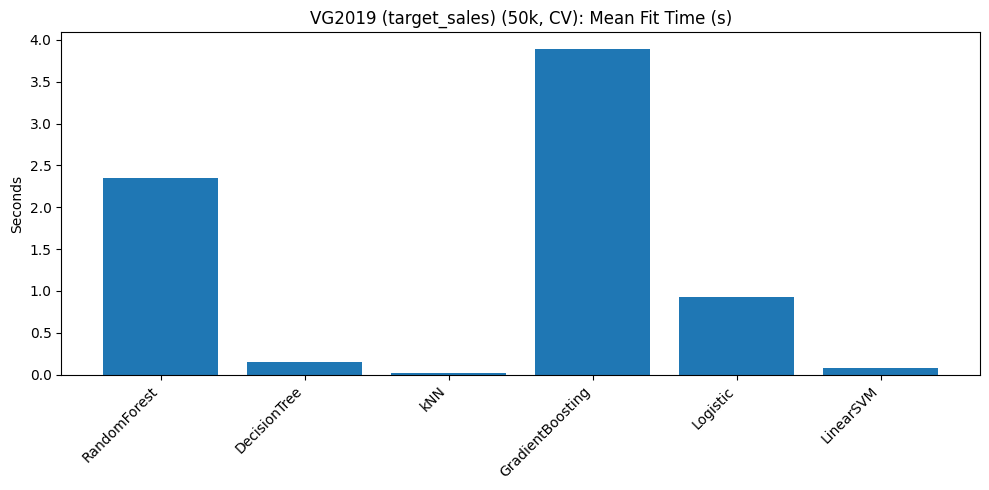

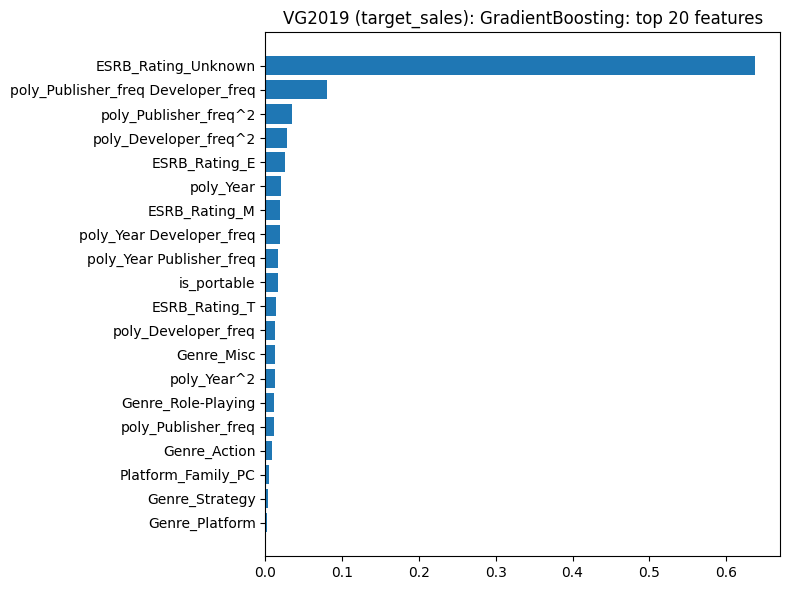

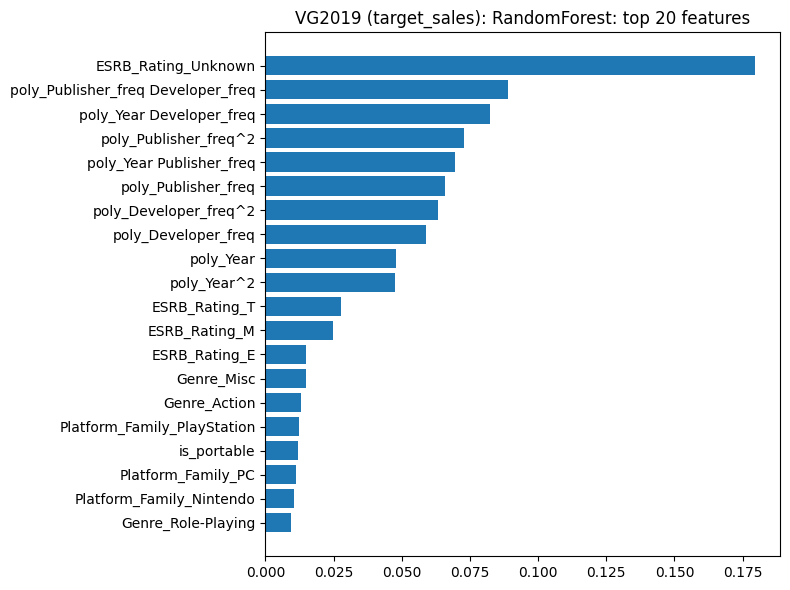

VG2019 (target_sales) elapsed: 13.66 s
prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train stats: {'n': 955509, 'mean': 86.35820698706135, 'std': 10.978047160242102, 'min': 0.0, 'max': 100.0}
steam y_test stats: {'n': 44492, 'mean': 81.25285444574305, 'std': 15.442551141752842, 'min': 0.0, 'max': 100.0}
target_olist train stats: {'n': 89954, 'mean': 4.058243751525879, 'std': 0.8512095808982849, 'min': 1.0, 'max': 5.0}
target_olist test stats: {'n': 22489, 'mean': 4.053517818450928, 'std': 0.8607538342475891, 'min': 1.0, 'max': 5.0}
target_sales train stats: {'n': 5228, 'mean': 7.202467441558838, 'std': 1.45883047580719, 'min': 1.0, 'max': 10.0}
target_sales test stats: {'n': 1308, 'mean': 7.258639812469482, 'std': 1.4334877729415894, 'min': 1.5, 'max': 10.0}
scaled columns: 12 with standard
polynomial features added: 90 (from 12 columns)

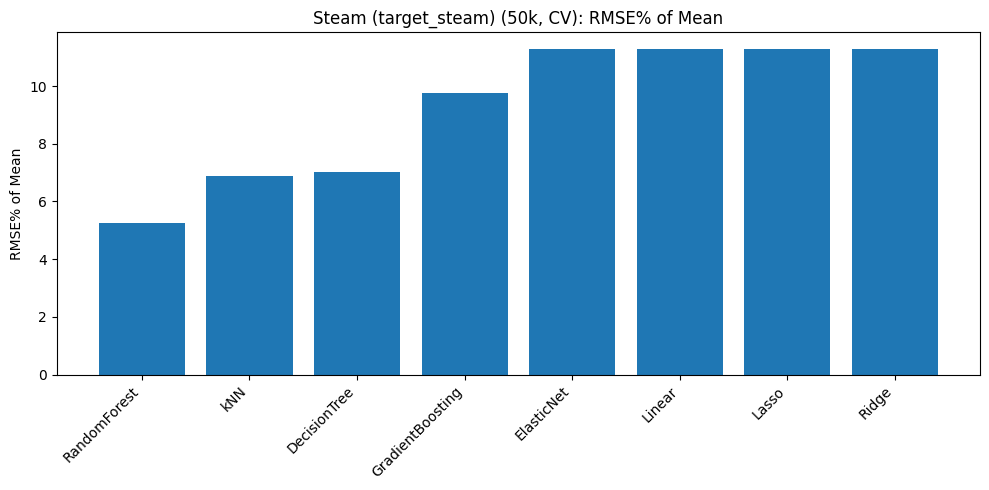

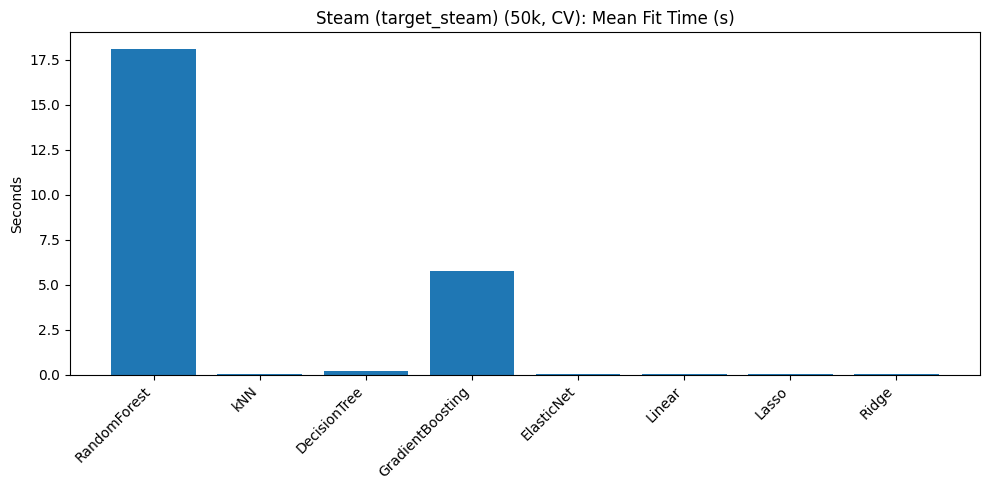

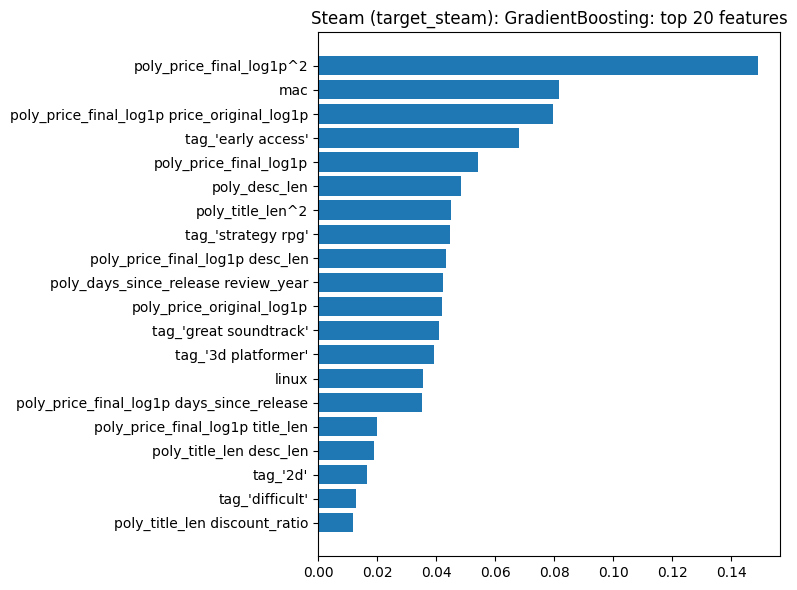

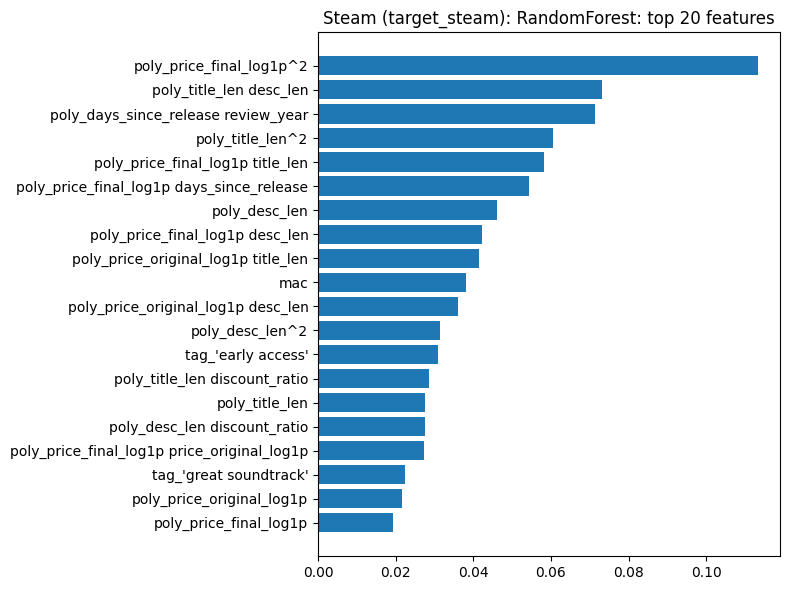

Steam (target_steam) elapsed: 33.56 s

Olist (target_olist): build 50k sample and run 5-fold regression CV

sample: picked 50000 rows (quantile-binned by target)
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.4833    0.7405  0.2472        11.91         18.25         112.958             0.127           113.084             642.73
GradientBoosting   0.5558    0.7889  0.1457        13.70         19.44          18.707             0.007            18.714               0.14
           Lasso   0.5695    0.8047  0.1111        14.04         19.83           0.016             0.002             0.018               0.00
      ElasticNet   0.5694    0.8047  0.1111        14.03         19.83           0.023             0.002             0.025               0.00
           Ridge   0.5694    0.8048  0.1110        14.03         19.83           0.010             0.002             0.012      

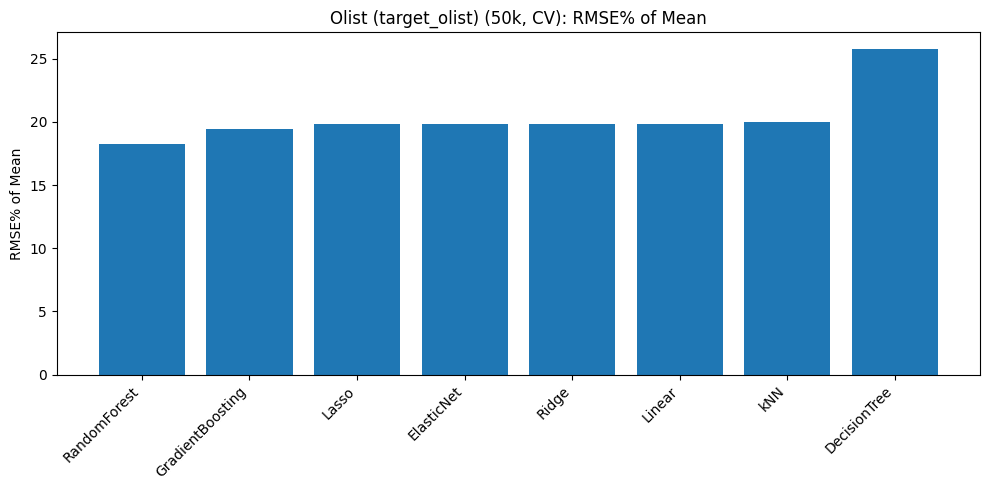

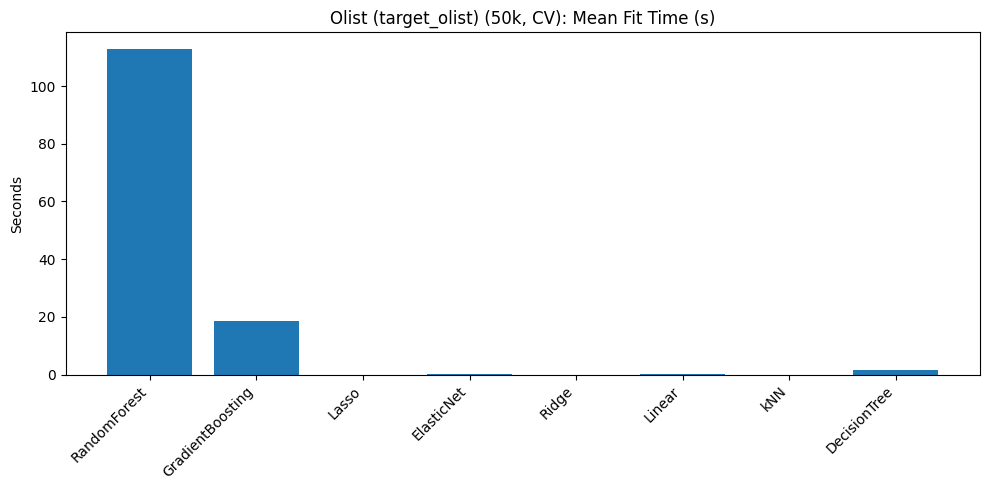

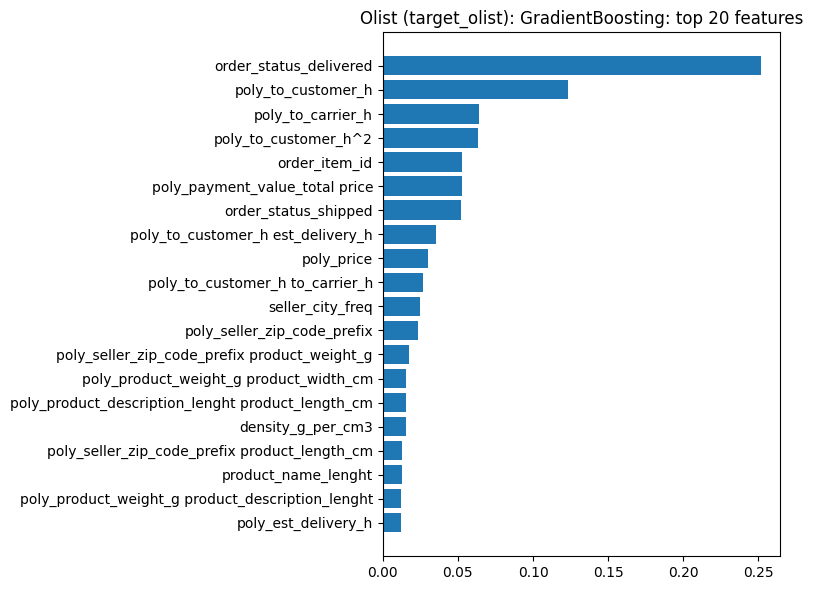

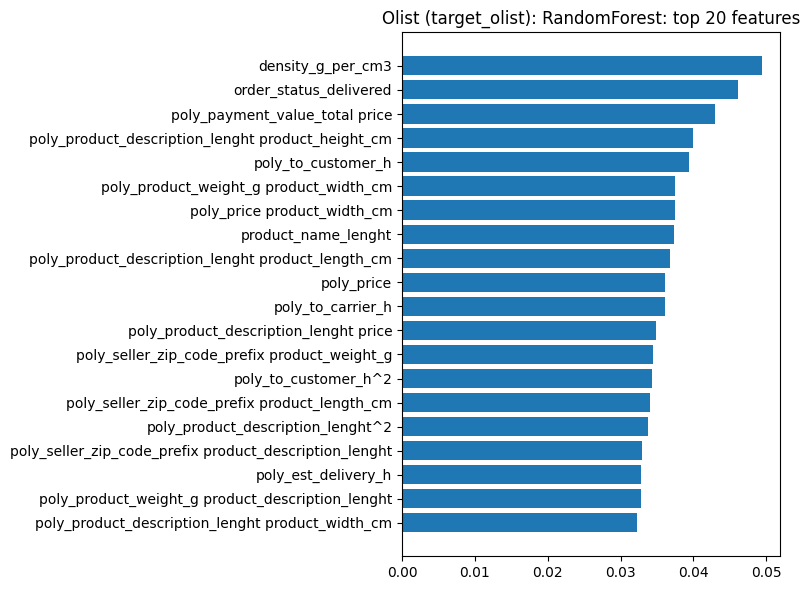

Olist (target_olist) elapsed: 142.49 s

VG2019 (target_sales): build 50k sample and run 5-fold regression CV

sample: using all 6536 rows
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.9403    1.2542  0.2546        13.03         17.39           2.166             0.048             2.215             120.58
GradientBoosting   1.0321    1.3235  0.1701        14.31         18.35           0.495             0.002             0.498               0.14
      ElasticNet   1.0846    1.3834  0.0933        15.04         19.18           0.009             0.002             0.011               0.00
           Lasso   1.0846    1.3834  0.0933        15.04         19.18           0.012             0.001             0.013               0.00
           Ridge   1.0848    1.3834  0.0933        15.04         19.18           0.004             0.001             0.005               0.00
          

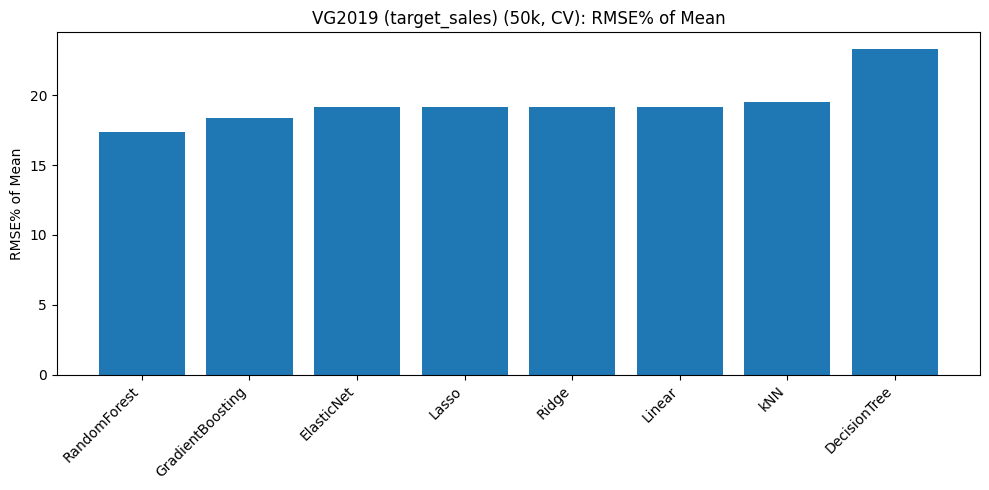

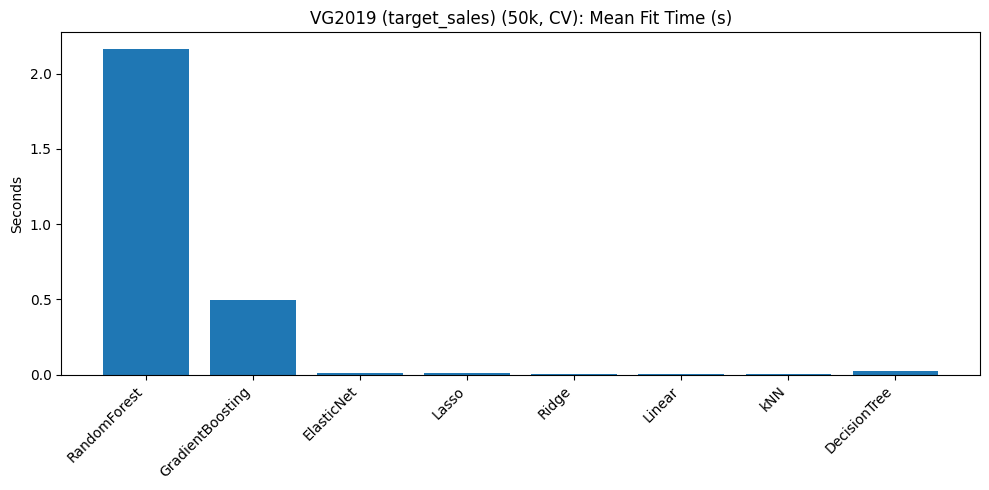

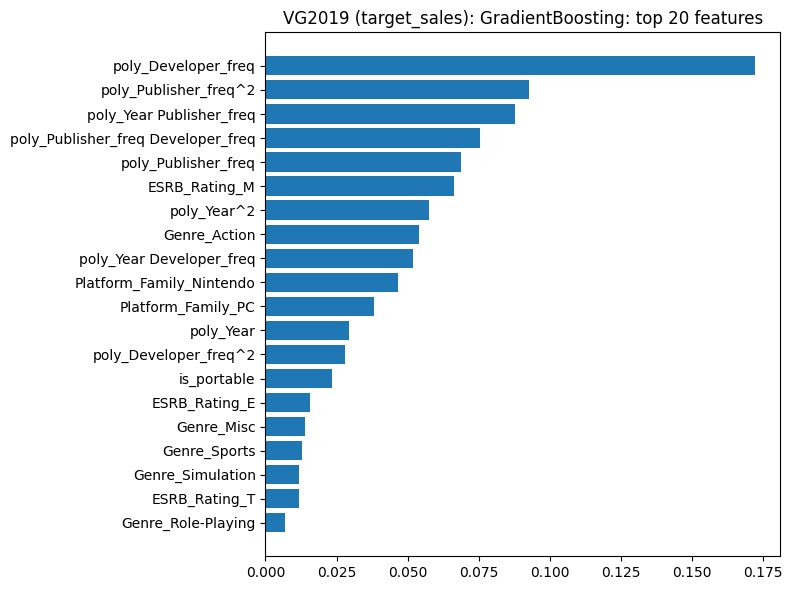

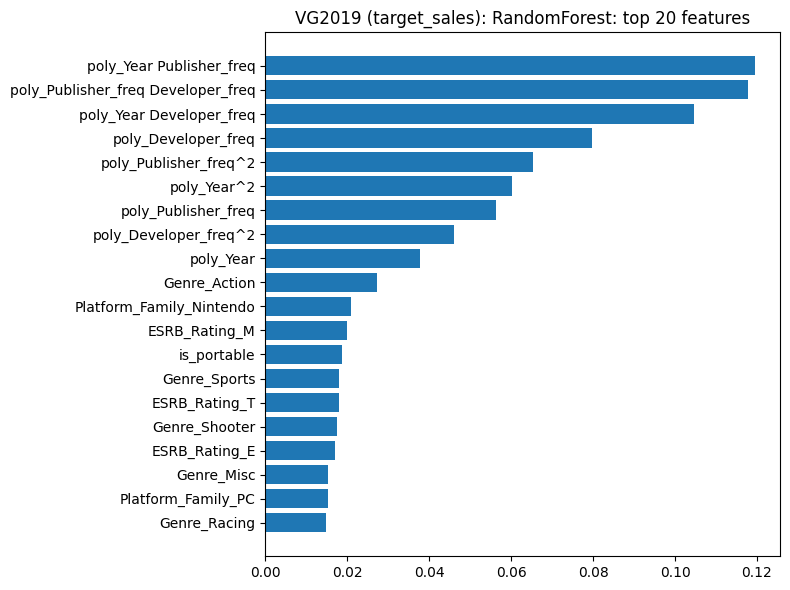

VG2019 (target_sales) elapsed: 4.86 s

SUMMARY TIME (seconds)

Classification total: 179.62
  Steam:  24.12
  Olist:  35.51
  VG2019: 13.66

Regression total:    2233.72
  Steam:  33.56
  Olist:  142.49
  VG2019: 4.86

ALL STEPS TOTAL:     7146.94 seconds

CSV outputs (created during runs):
 - steam_(target_steam)_cls_cv_50k_results.csv
 - olist_(target_olist)_cls_cv_50k_results.csv
 - vg2019_(target_sales)_cls_cv_50k_results.csv
 - steam_(target_steam)_reg_cv_50k_results.csv
 - olist_(target_olist)_reg_cv_50k_results.csv
 - vg2019_(target_sales)_reg_cv_50k_results.csv

FEATURE SELECTION K=40 RUN


RUNNING FULL PIPELINE WITH FEATURE SELECT K=40

prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train counts: {1: 781248, 0: 174261}
steam y_test counts: {1: 28773, 0: 15719}
steam balanced train counts: {1: 174261, 0: 174261}
target_olist train

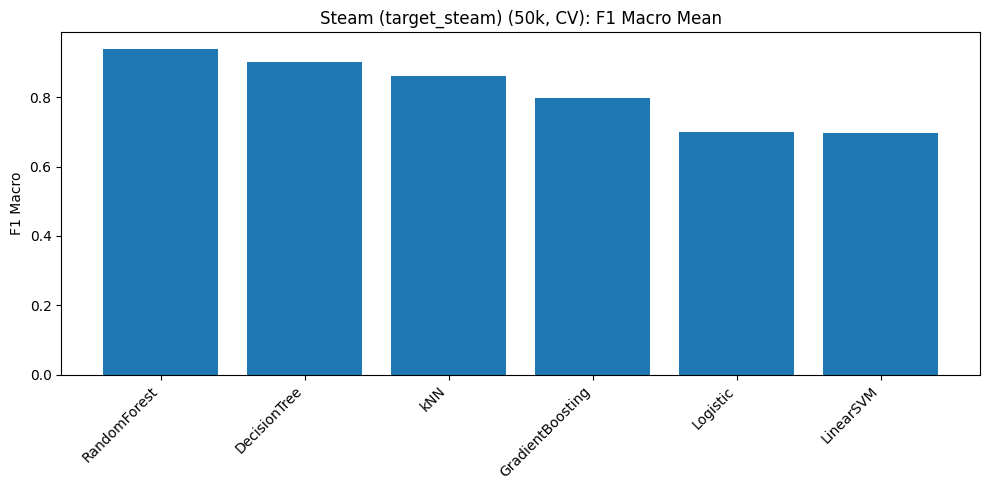

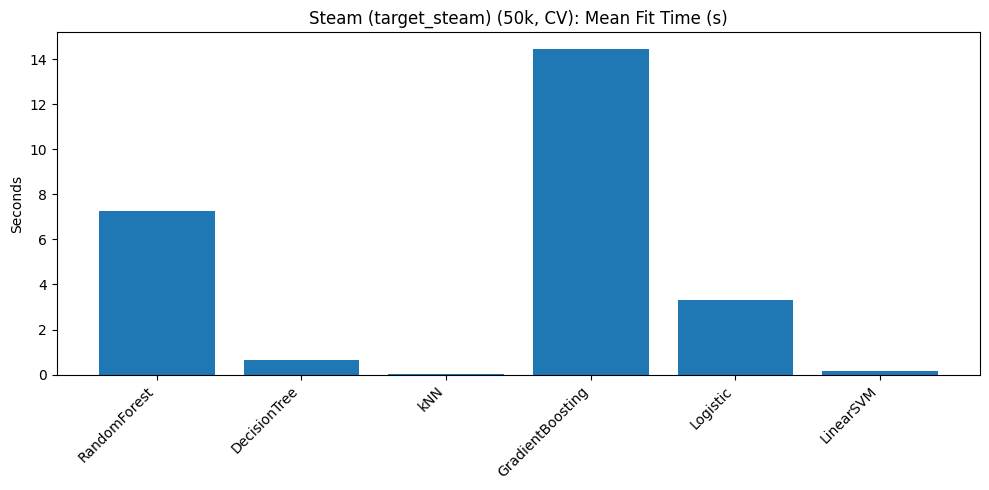

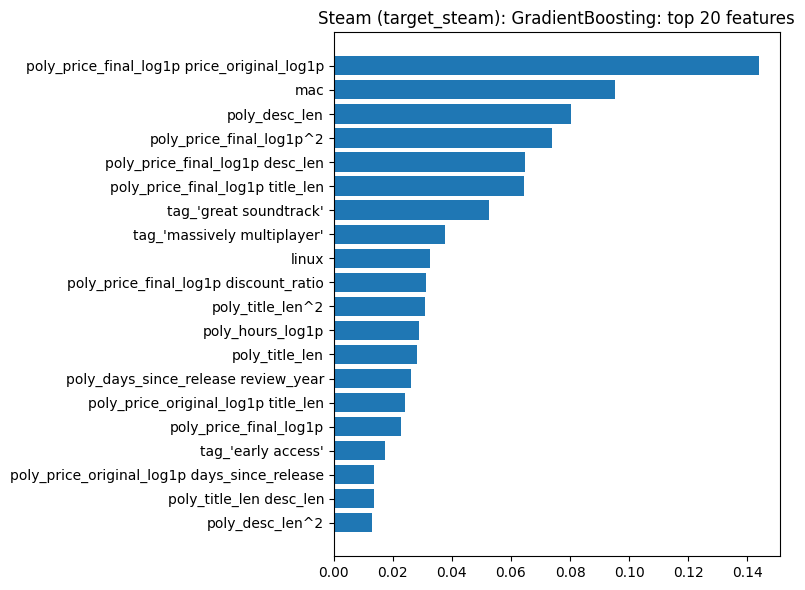

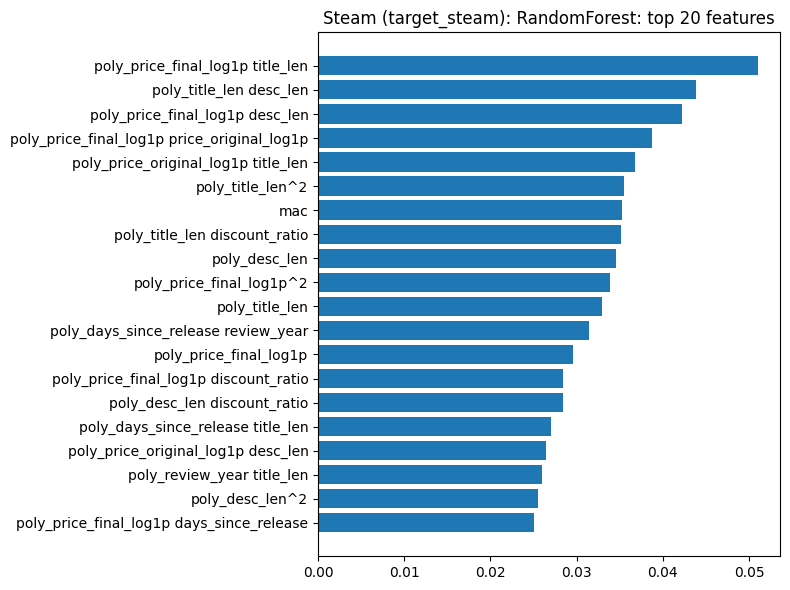

Steam (target_steam) elapsed: 32.97 s

Olist (target_olist): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.9018       0.0017        0.9023       0.9638          12.526             0.246            12.772             166.13
    DecisionTree        0.8409       0.0034        0.8410       0.8420           1.175             0.006             1.181               0.70
             kNN        0.7460       0.0051        0.7469       0.8315           0.012             1.830             1.842              12.52
GradientBoosting        0.6819       0.0039        0.6915       0.7594          21.449             0.019            21.468               0.14
        Logistic        0.5874       0.0032        0.6062       0.6441           3.417             0.005             3.423        

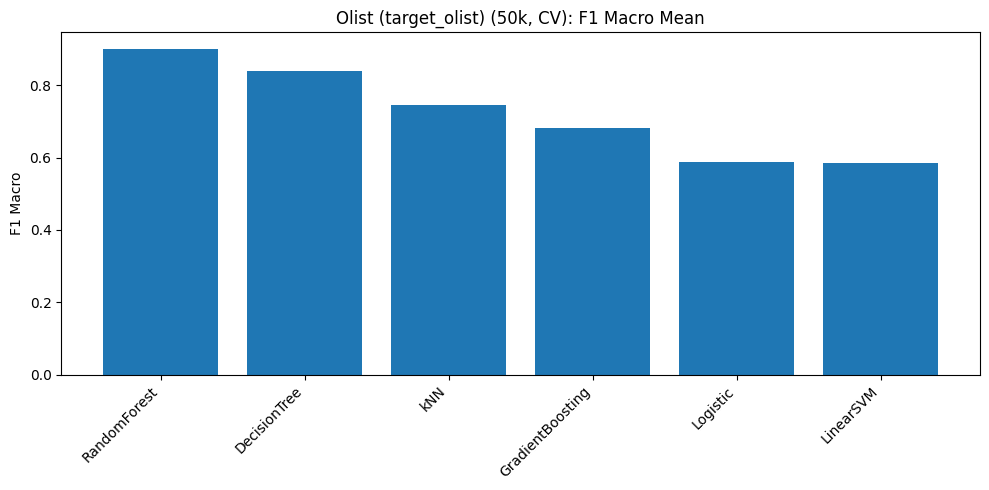

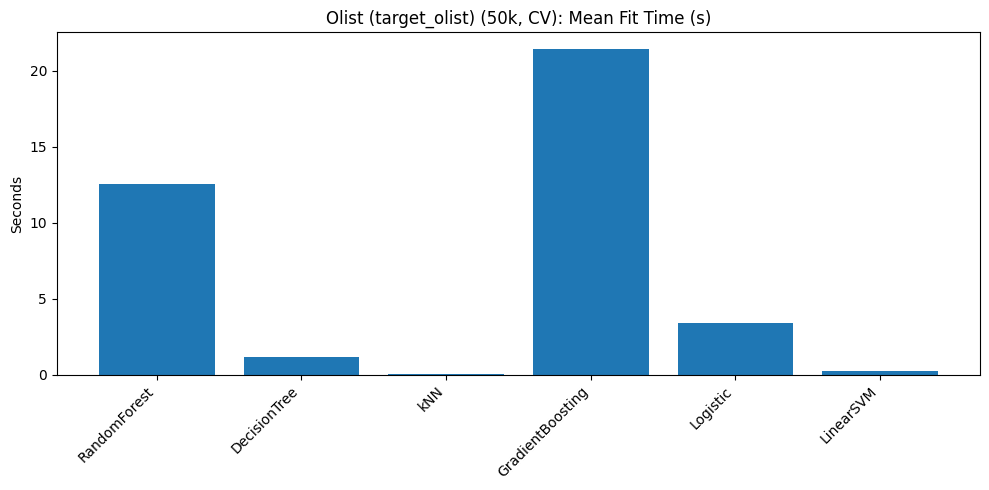

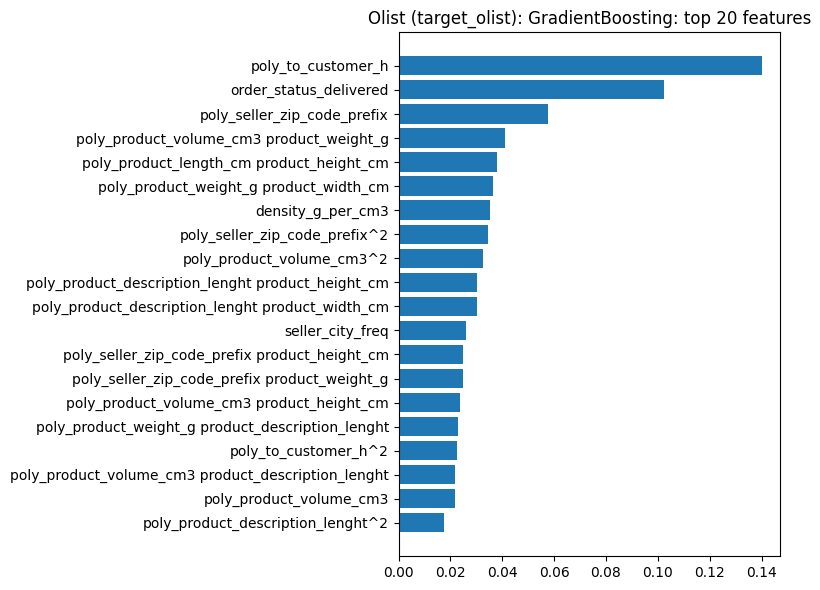

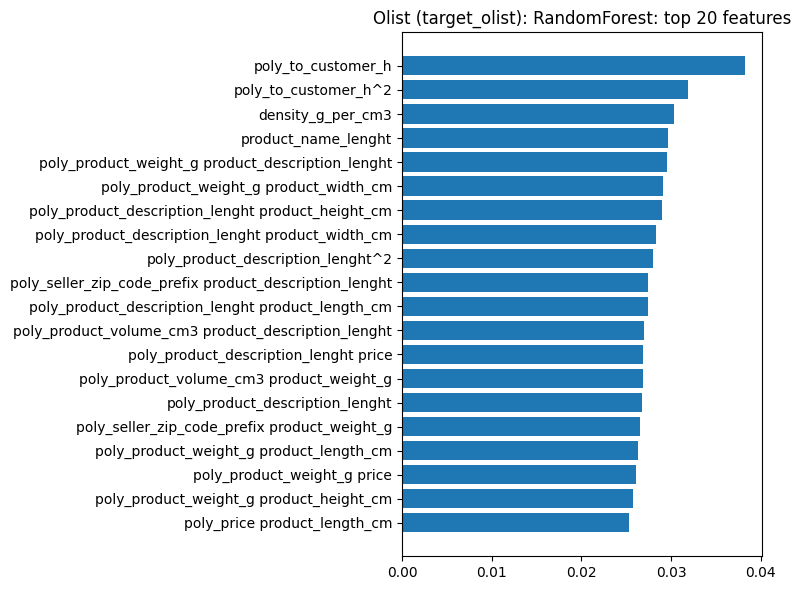

Olist (target_olist) elapsed: 45.44 s

VG2019 (target_sales): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.9800       0.0005        0.9802       0.9957           1.669             0.153             1.822              96.20
    DecisionTree        0.9674       0.0015        0.9676       0.9709           0.167             0.006             0.173               0.34
             kNN        0.8841       0.0016        0.8841       0.9549           0.025             1.825             1.850              12.52
GradientBoosting        0.8240       0.0021        0.8243       0.9024           4.127             0.019             4.147               0.14
        Logistic        0.7834       0.0025        0.7835       0.8514          15.631             0.011            15.642       

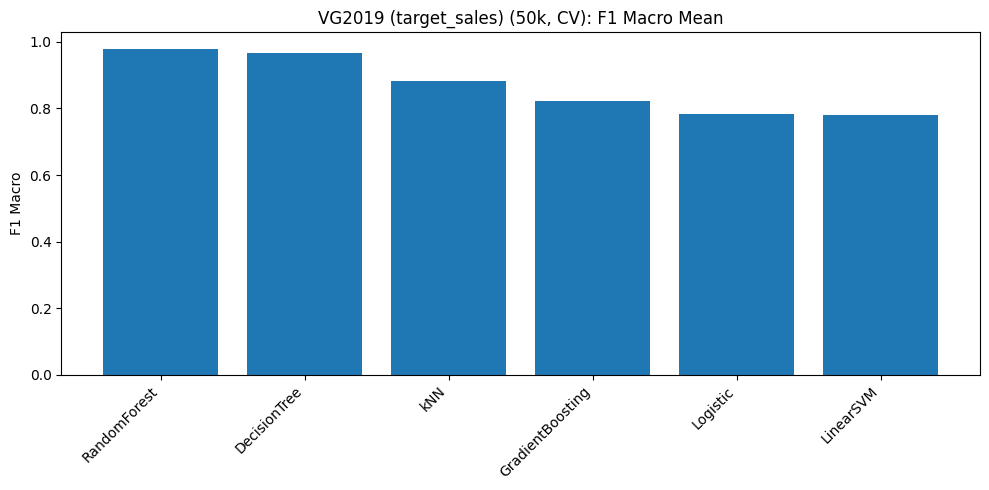

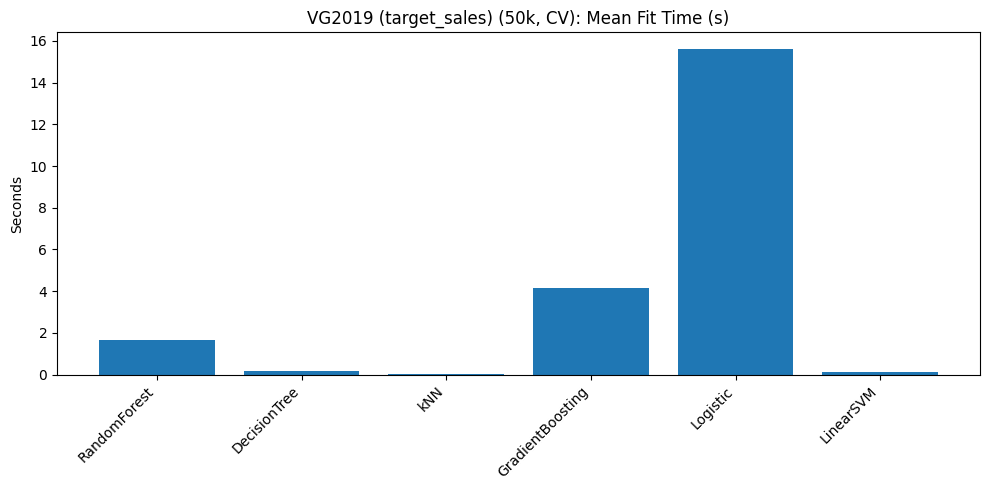

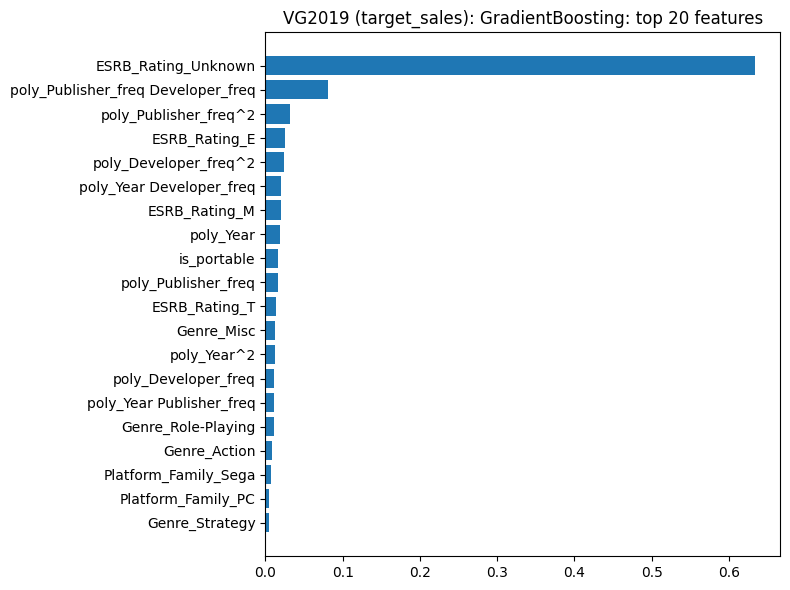

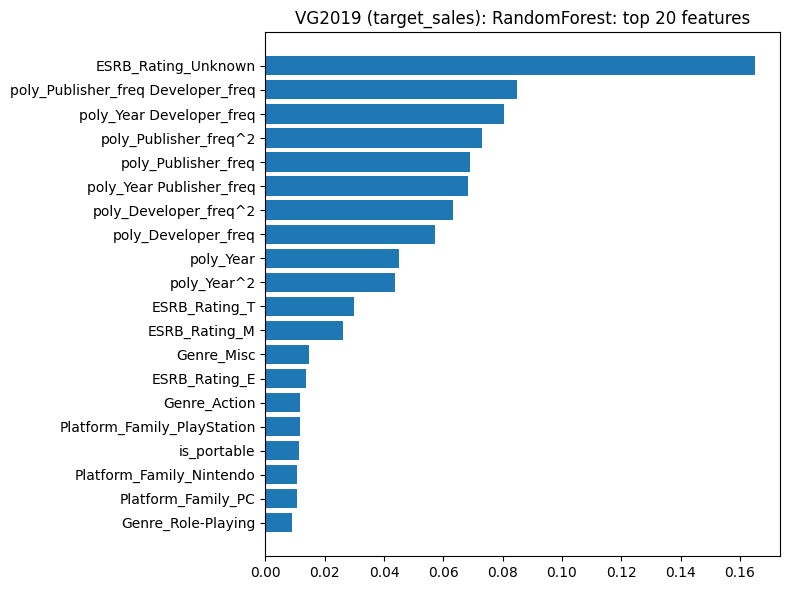

VG2019 (target_sales) elapsed: 28.87 s
prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train stats: {'n': 955509, 'mean': 86.35820698706135, 'std': 10.978047160242102, 'min': 0.0, 'max': 100.0}
steam y_test stats: {'n': 44492, 'mean': 81.25285444574305, 'std': 15.442551141752842, 'min': 0.0, 'max': 100.0}
target_olist train stats: {'n': 89954, 'mean': 4.058243751525879, 'std': 0.8512095808982849, 'min': 1.0, 'max': 5.0}
target_olist test stats: {'n': 22489, 'mean': 4.053517818450928, 'std': 0.8607538342475891, 'min': 1.0, 'max': 5.0}
target_sales train stats: {'n': 5228, 'mean': 7.202467441558838, 'std': 1.45883047580719, 'min': 1.0, 'max': 10.0}
target_sales test stats: {'n': 1308, 'mean': 7.258639812469482, 'std': 1.4334877729415894, 'min': 1.5, 'max': 10.0}
scaled columns: 12 with standard
polynomial features added: 90 (from 12 columns)

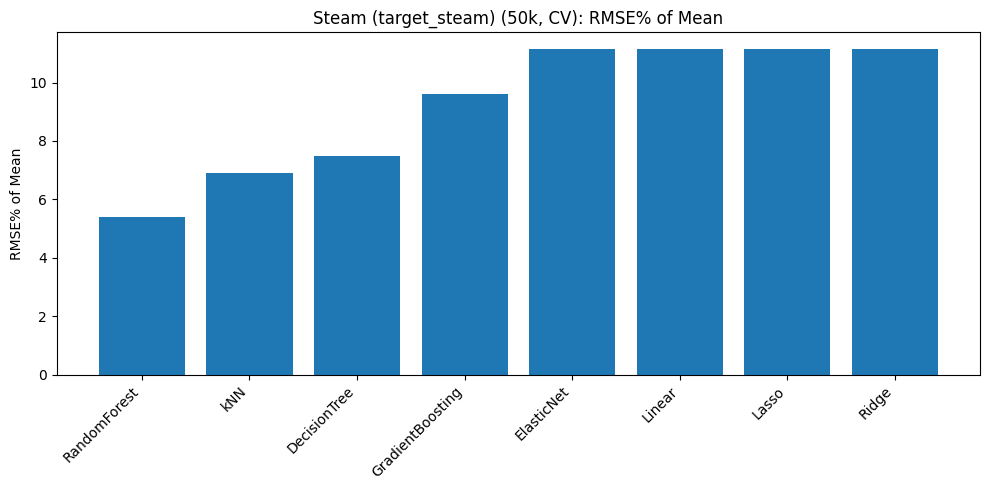

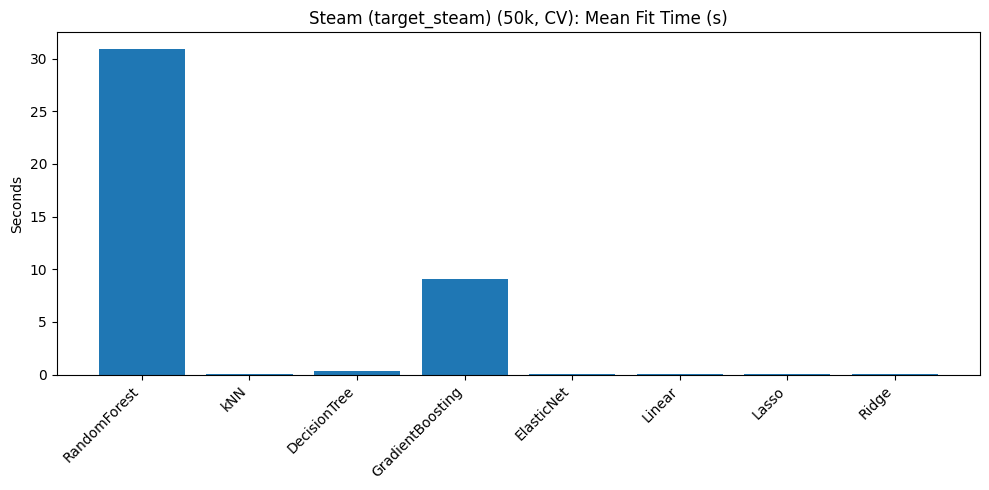

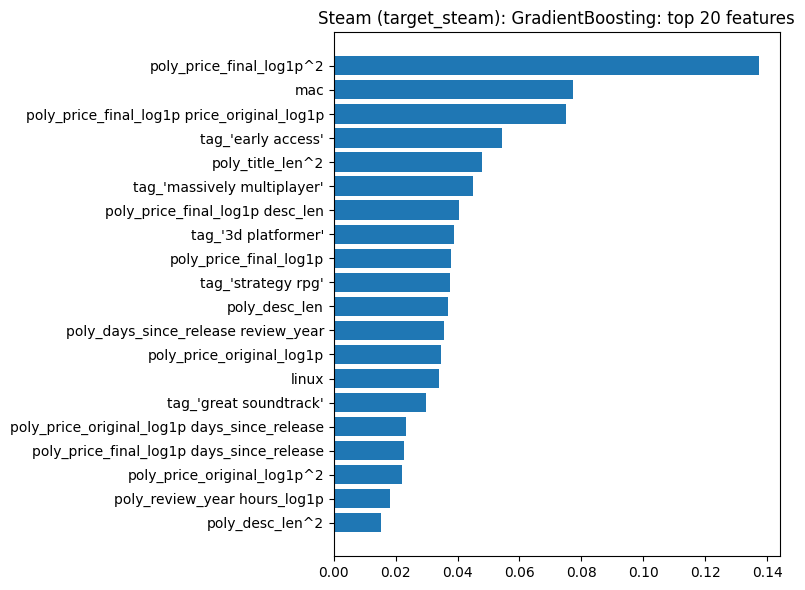

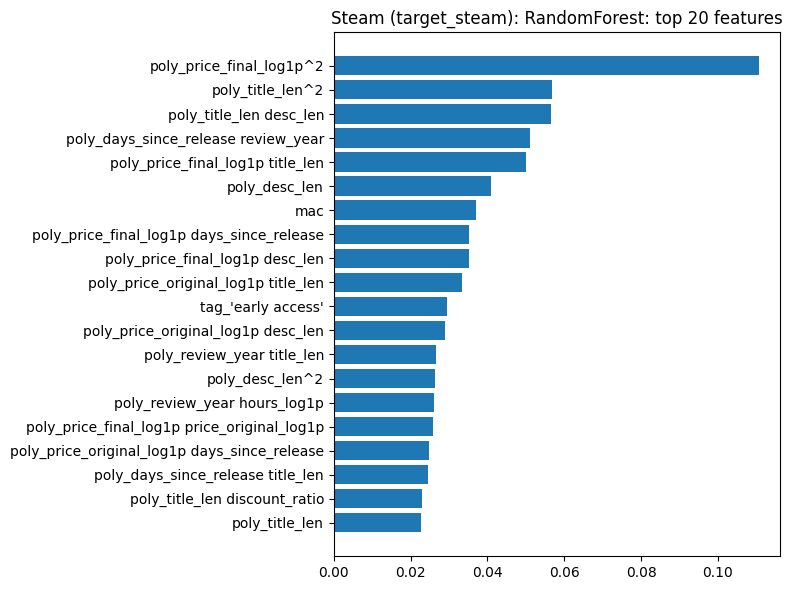

Steam (target_steam) elapsed: 49.59 s

Olist (target_olist): build 50k sample and run 5-fold regression CV

sample: picked 50000 rows (quantile-binned by target)
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.4800    0.7393  0.2497        11.83         18.22         152.035             0.138           152.173             626.58
GradientBoosting   0.5553    0.7885  0.1466        13.69         19.43          24.744             0.007            24.751               0.14
           Lasso   0.5692    0.8033  0.1143        14.03         19.80           0.044             0.009             0.053               0.00
      ElasticNet   0.5692    0.8033  0.1142        14.03         19.80           0.065             0.009             0.074               0.00
           Ridge   0.5692    0.8033  0.1141        14.03         19.80           0.033             0.007             0.041      

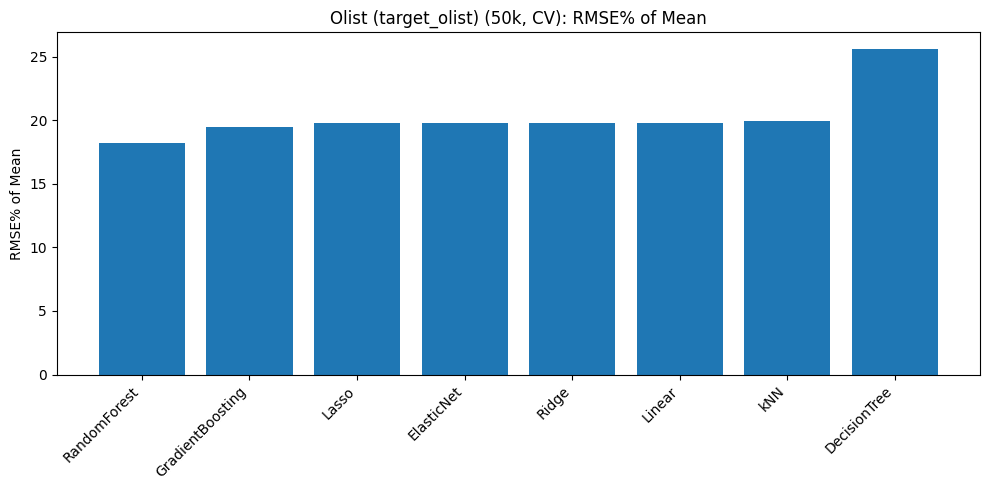

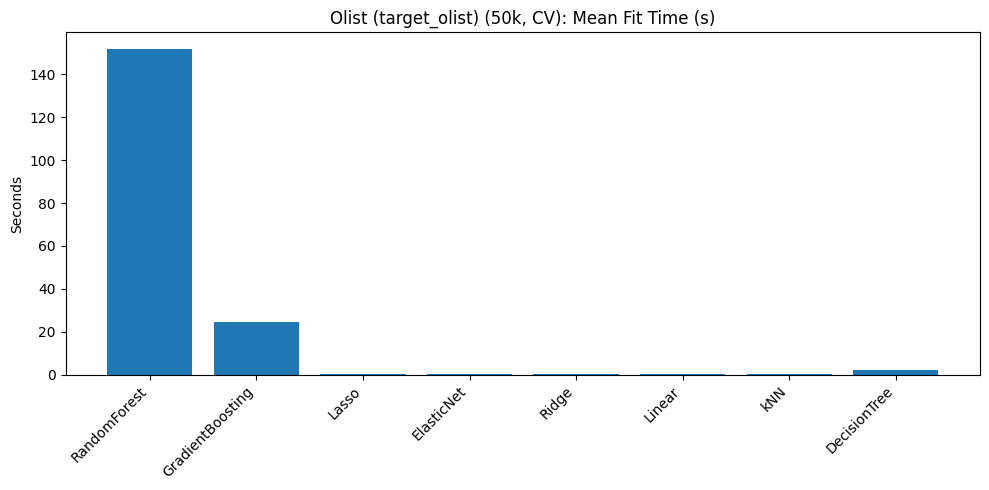

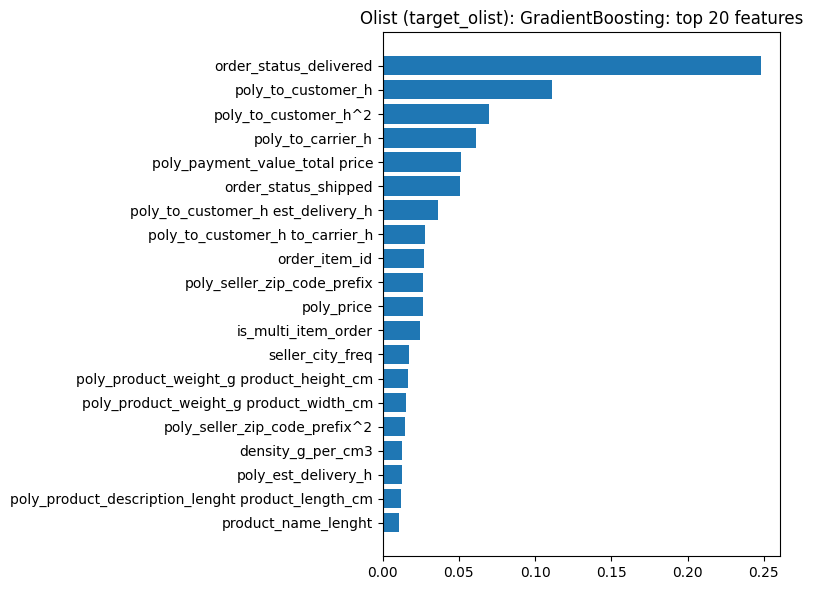

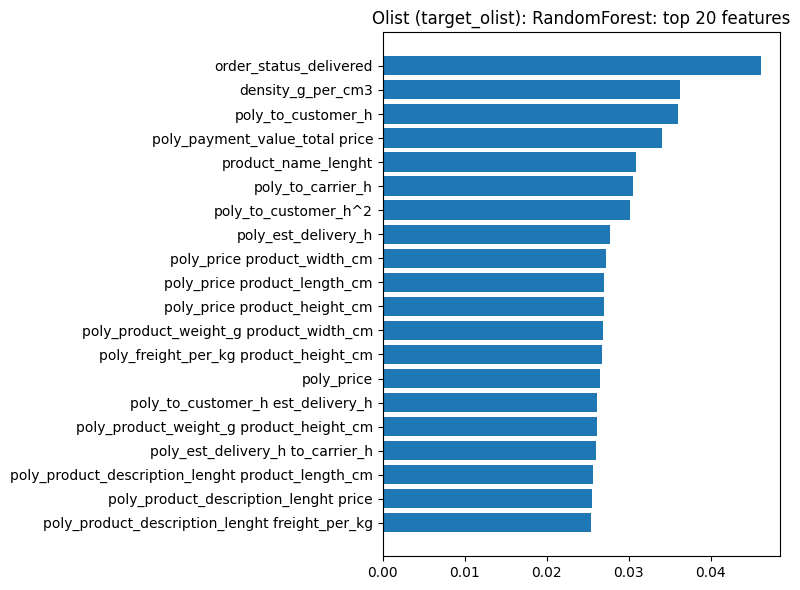

Olist (target_olist) elapsed: 187.32 s

VG2019 (target_sales): build 50k sample and run 5-fold regression CV

sample: using all 6536 rows
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.9364    1.2490  0.2608        12.98         17.31           2.343             0.046             2.389             120.46
GradientBoosting   1.0307    1.3216  0.1725        14.29         18.32           0.534             0.002             0.537               0.14
           Ridge   1.0799    1.3791  0.0989        14.97         19.12           0.005             0.002             0.006               0.00
          Linear   1.0800    1.3791  0.0989        14.97         19.12           0.007             0.002             0.009               0.00
      ElasticNet   1.0801    1.3795  0.0984        14.97         19.12           0.062             0.002             0.063               0.00
          

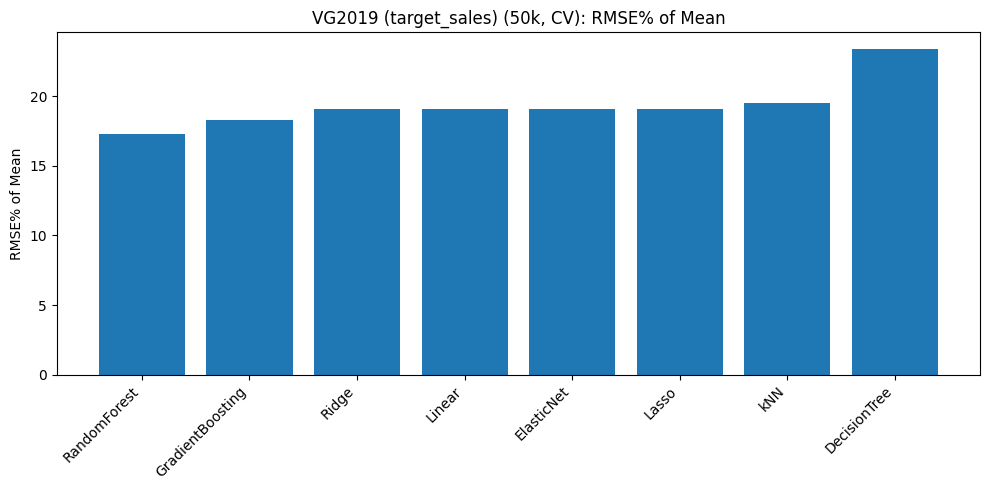

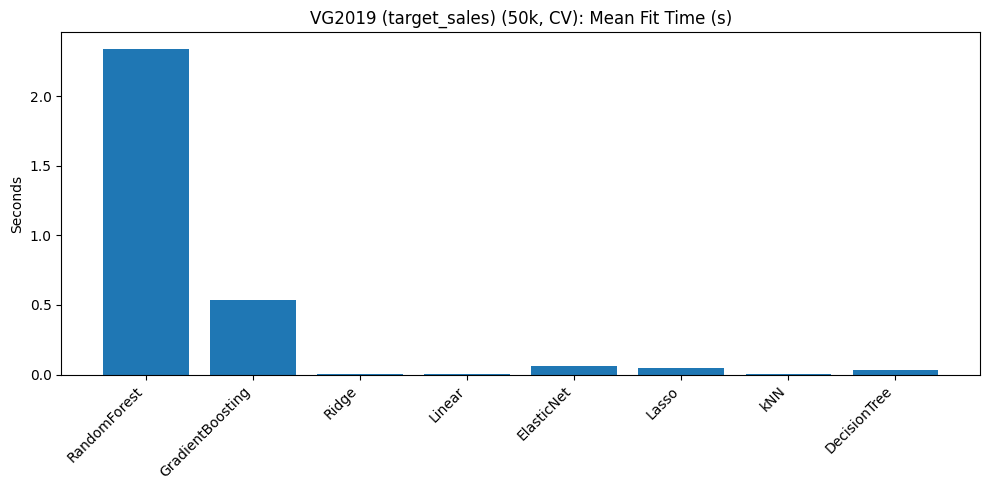

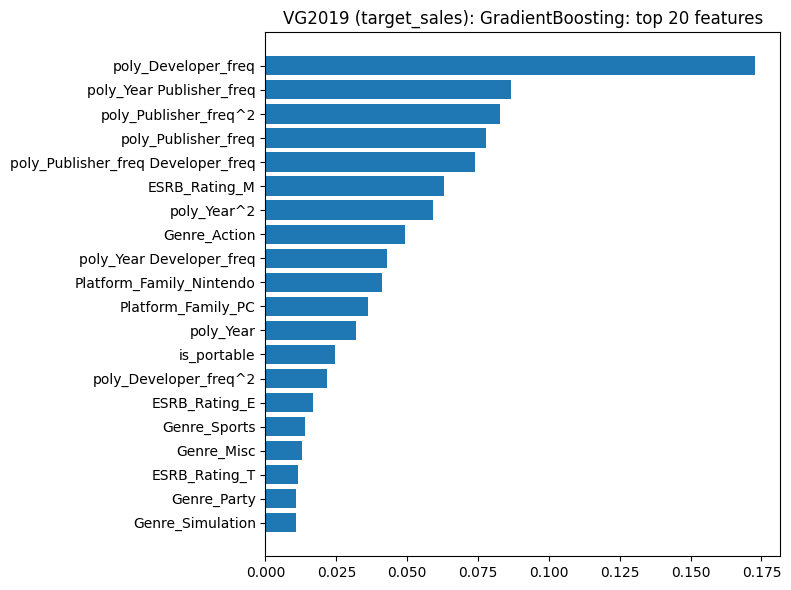

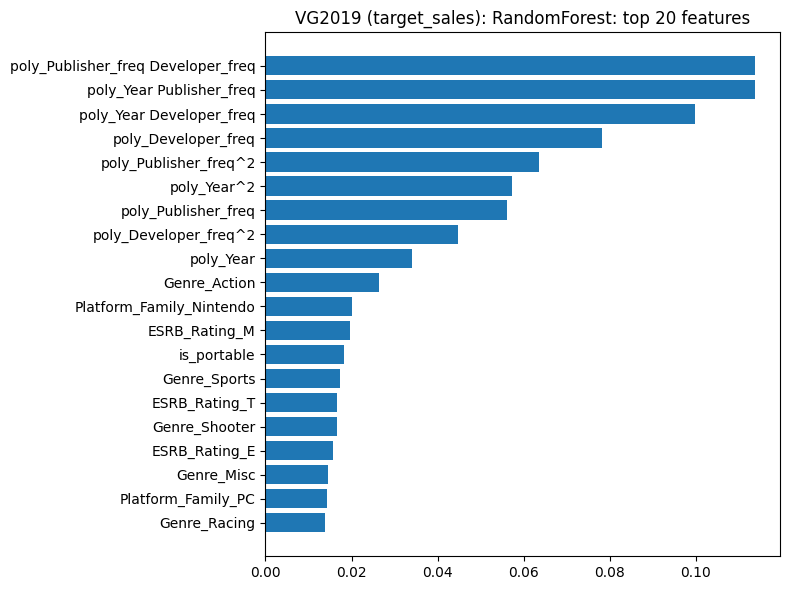

VG2019 (target_sales) elapsed: 5.22 s

SUMMARY TIME (seconds)

Classification total: 210.88
  Steam:  32.97
  Olist:  45.44
  VG2019: 28.87

Regression total:    2278.27
  Steam:  49.59
  Olist:  187.32
  VG2019: 5.22

ALL STEPS TOTAL:     9636.09 seconds

CSV outputs (created during runs):
 - steam_(target_steam)_cls_cv_50k_results.csv
 - olist_(target_olist)_cls_cv_50k_results.csv
 - vg2019_(target_sales)_cls_cv_50k_results.csv
 - steam_(target_steam)_reg_cv_50k_results.csv
 - olist_(target_olist)_reg_cv_50k_results.csv
 - vg2019_(target_sales)_reg_cv_50k_results.csv

FEATURE SELECTION K=50 RUN


RUNNING FULL PIPELINE WITH FEATURE SELECT K=50

prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train counts: {1: 781248, 0: 174261}
steam y_test counts: {1: 28773, 0: 15719}
steam balanced train counts: {1: 174261, 0: 174261}
target_olist train

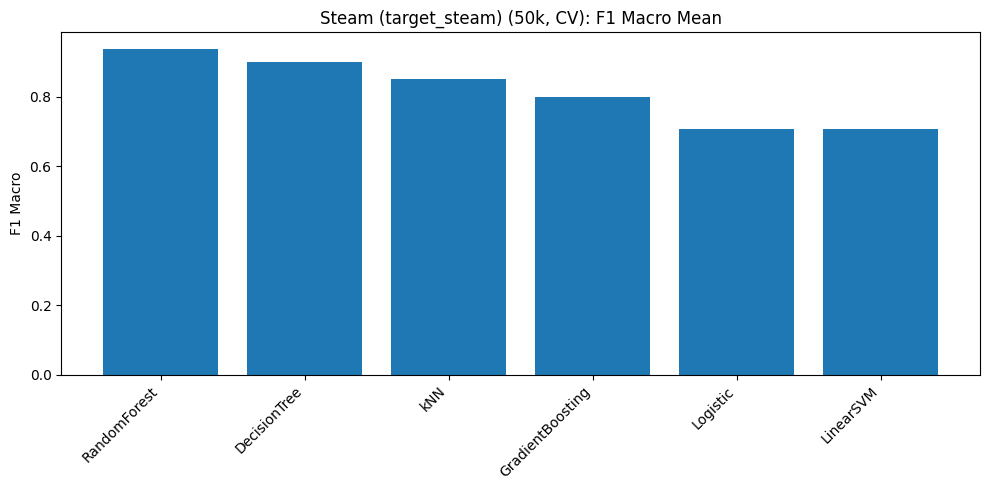

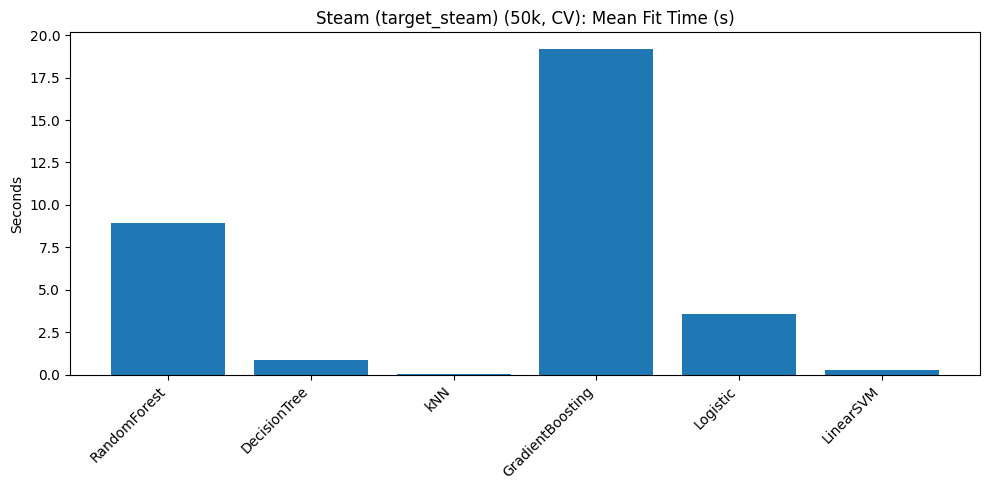

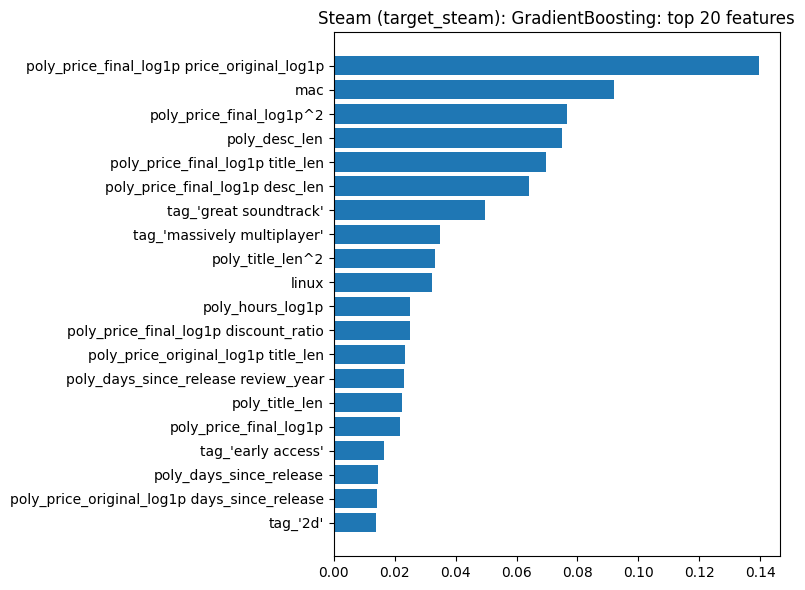

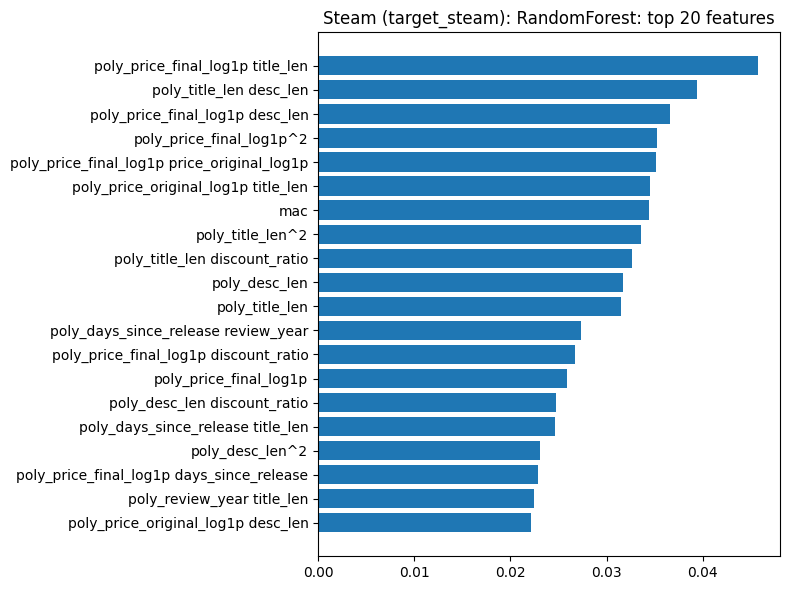

Steam (target_steam) elapsed: 40.28 s

Olist (target_olist): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.8940       0.0022        0.8946       0.9600          16.096             0.226            16.323             163.77
    DecisionTree        0.8291       0.0072        0.8292       0.8301           1.587             0.007             1.594               0.67
             kNN        0.7330       0.0058        0.7340       0.8174           0.017             1.861             1.878              15.57
GradientBoosting        0.6865       0.0061        0.6958       0.7640          29.329             0.020            29.348               0.14
        Logistic        0.5909       0.0015        0.6088       0.6505           6.572             0.006             6.578        

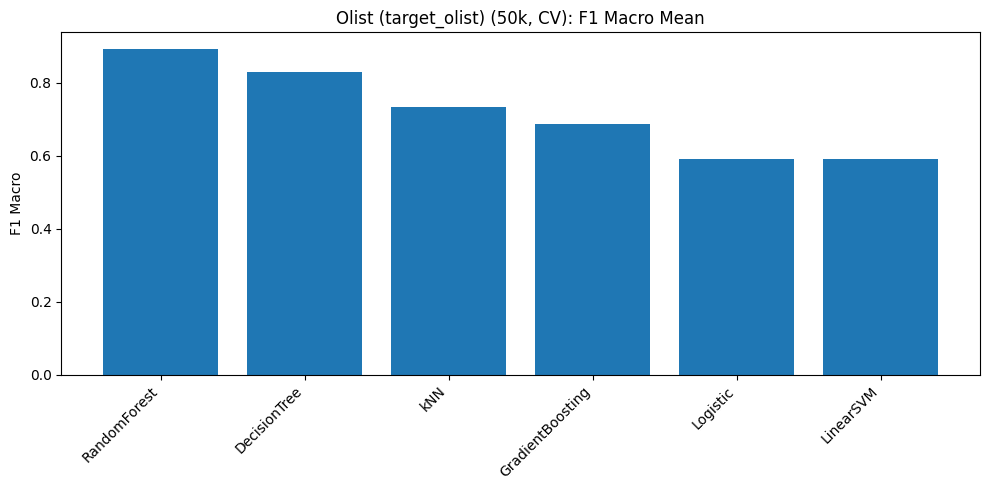

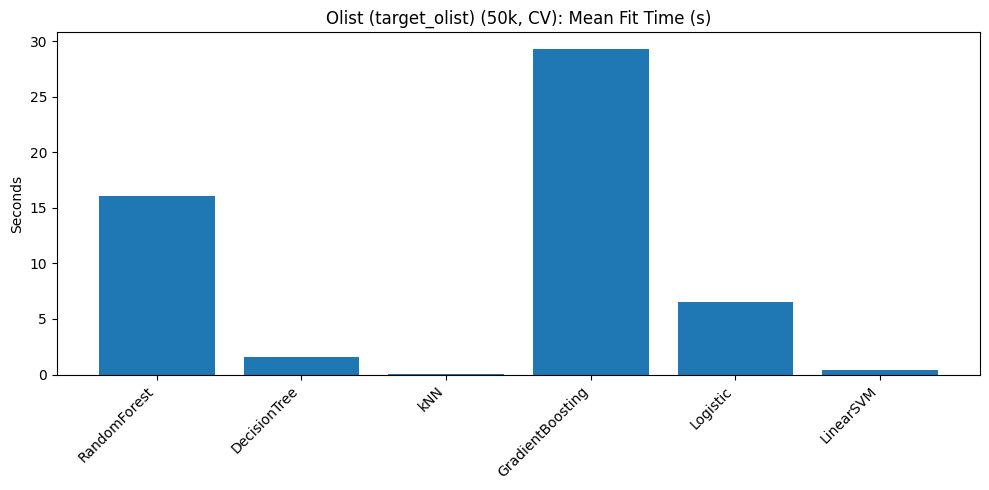

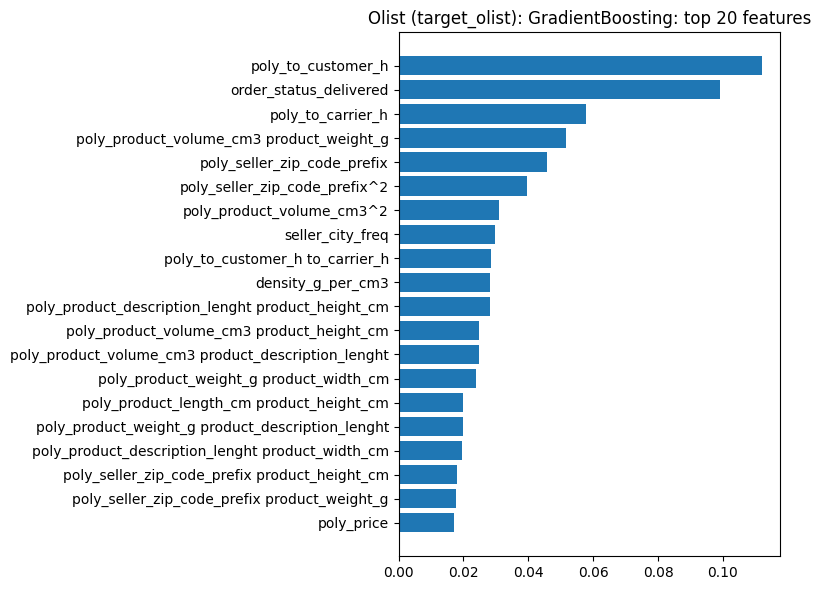

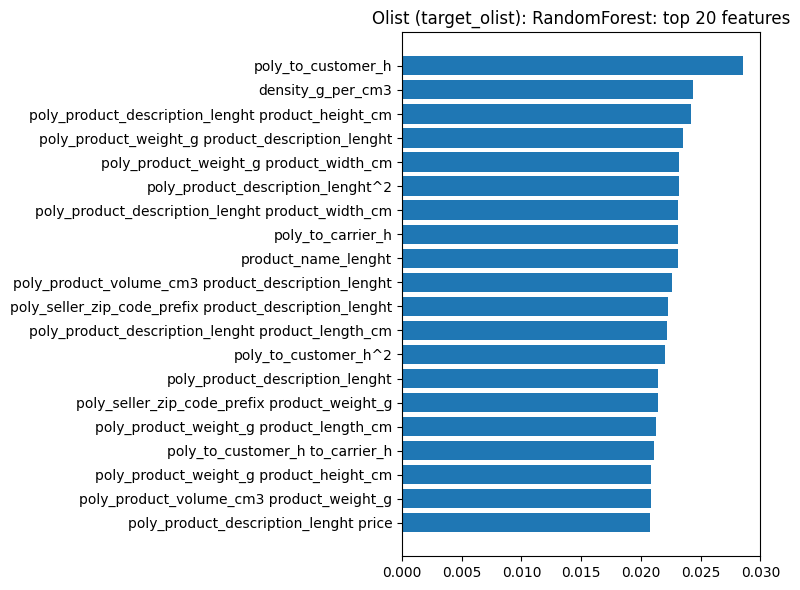

Olist (target_olist) elapsed: 61.99 s

VG2019 (target_sales): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.9806       0.0010        0.9807       0.9957           1.721             0.153             1.875              97.86
    DecisionTree        0.9683       0.0012        0.9685       0.9718           0.174             0.006             0.180               0.34
             kNN        0.8845       0.0019        0.8845       0.9549           0.035             1.918             1.953              15.57
GradientBoosting        0.8217       0.0014        0.8220       0.9019           4.289             0.020             4.309               0.14
        Logistic        0.7828       0.0029        0.7829       0.8522          12.272             0.013            12.284       

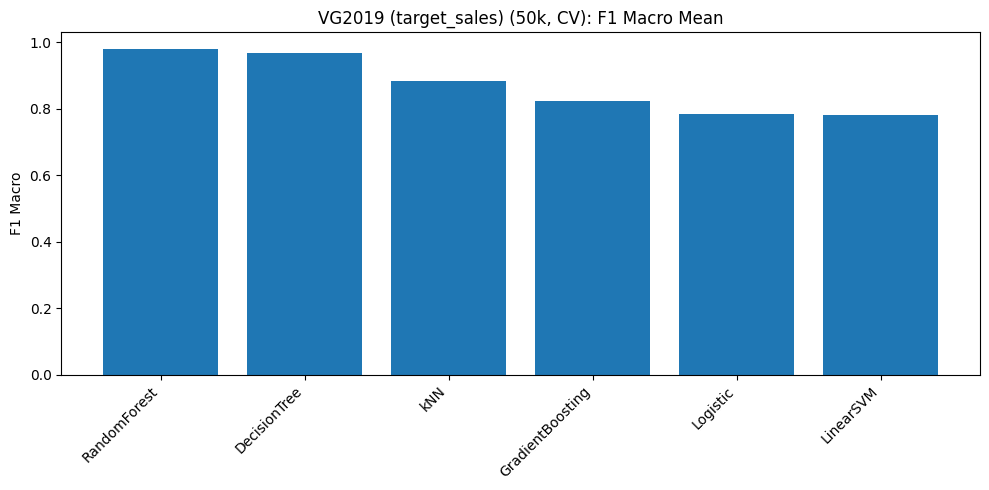

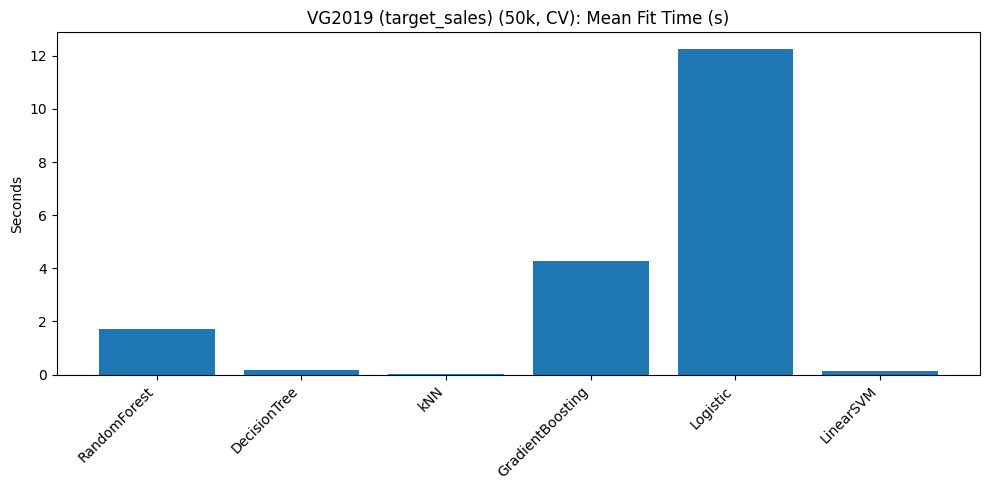

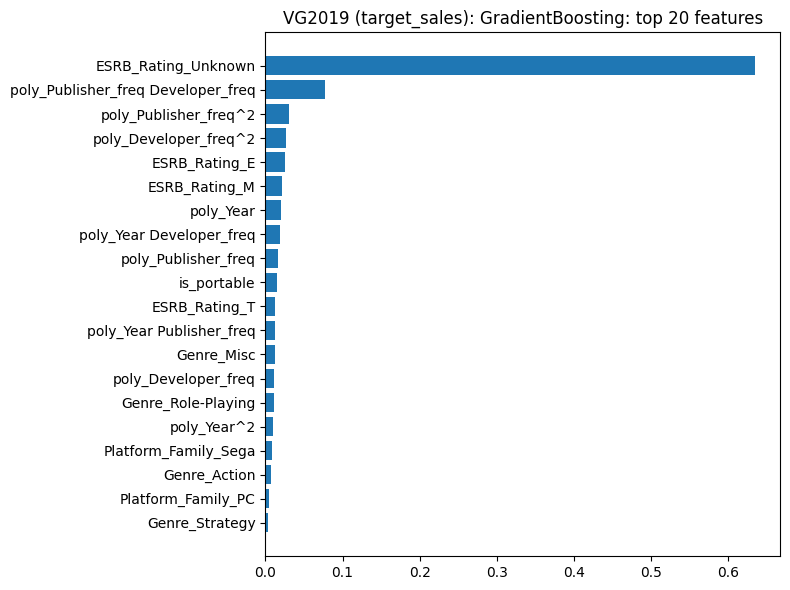

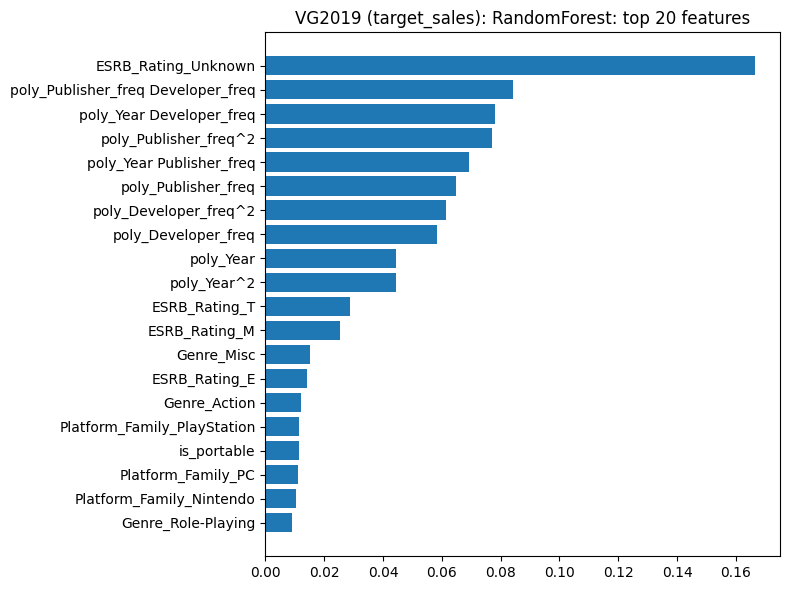

VG2019 (target_sales) elapsed: 31.06 s
prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train stats: {'n': 955509, 'mean': 86.35820698706135, 'std': 10.978047160242102, 'min': 0.0, 'max': 100.0}
steam y_test stats: {'n': 44492, 'mean': 81.25285444574305, 'std': 15.442551141752842, 'min': 0.0, 'max': 100.0}
target_olist train stats: {'n': 89954, 'mean': 4.058243751525879, 'std': 0.8512095808982849, 'min': 1.0, 'max': 5.0}
target_olist test stats: {'n': 22489, 'mean': 4.053517818450928, 'std': 0.8607538342475891, 'min': 1.0, 'max': 5.0}
target_sales train stats: {'n': 5228, 'mean': 7.202467441558838, 'std': 1.45883047580719, 'min': 1.0, 'max': 10.0}
target_sales test stats: {'n': 1308, 'mean': 7.258639812469482, 'std': 1.4334877729415894, 'min': 1.5, 'max': 10.0}
scaled columns: 12 with standard
polynomial features added: 90 (from 12 columns)

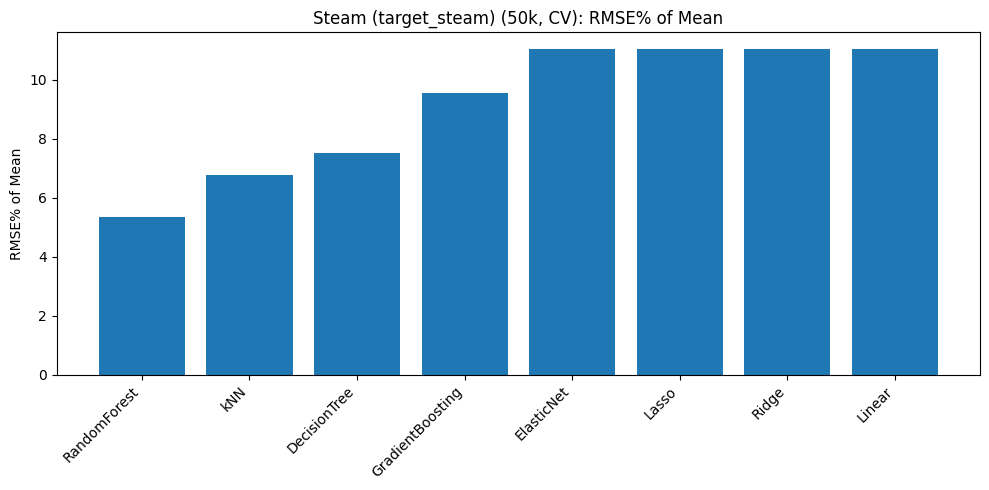

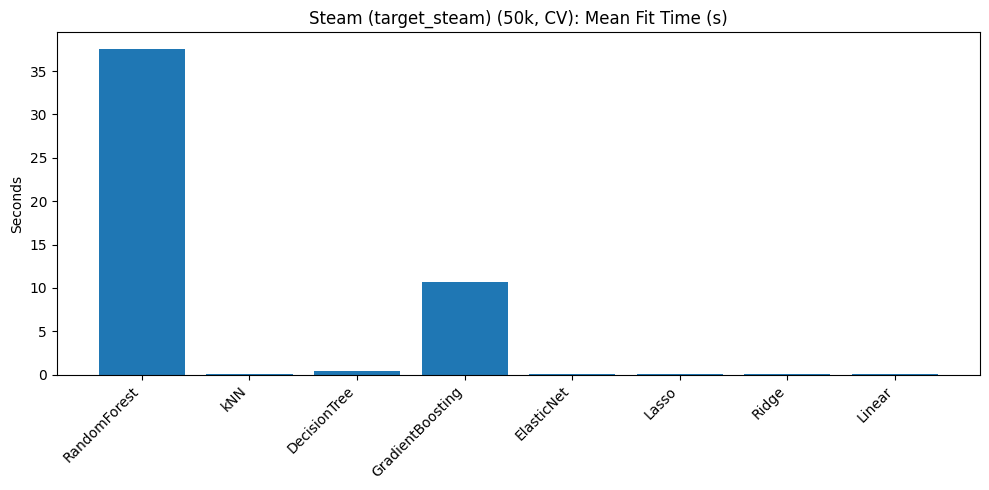

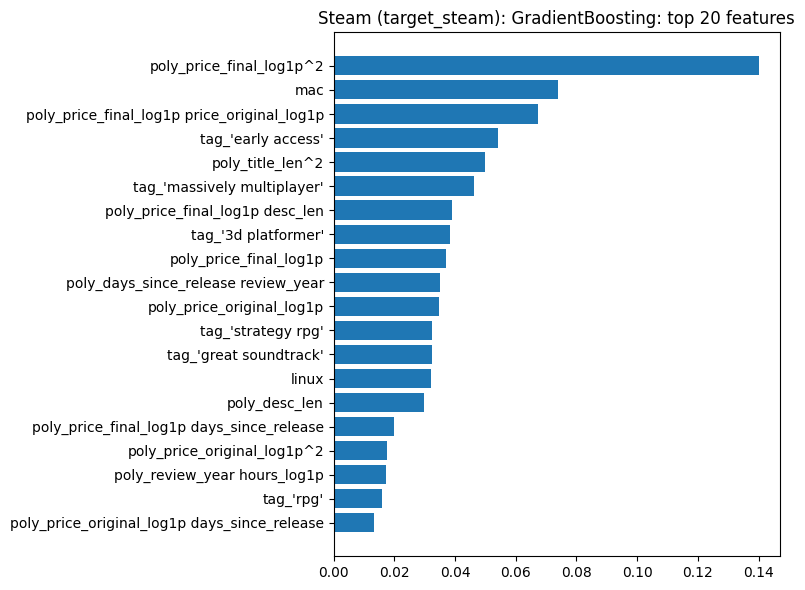

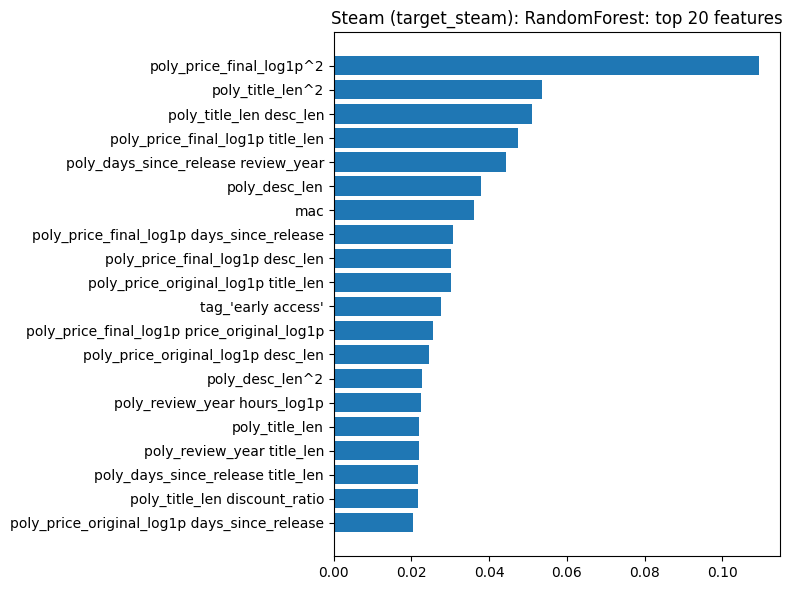

Steam (target_steam) elapsed: 58.75 s

Olist (target_olist): build 50k sample and run 5-fold regression CV

sample: picked 50000 rows (quantile-binned by target)
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.4832    0.7406  0.2470        11.91         18.25         204.638             0.161           204.799             625.60
GradientBoosting   0.5551    0.7885  0.1466        13.68         19.43          31.900             0.008            31.907               0.14
      ElasticNet   0.5690    0.8027  0.1155        14.02         19.78           0.073             0.010             0.083               0.00
           Lasso   0.5690    0.8027  0.1155        14.02         19.79           0.064             0.010             0.074               0.00
           Ridge   0.5691    0.8028  0.1154        14.03         19.79           0.046             0.010             0.055      

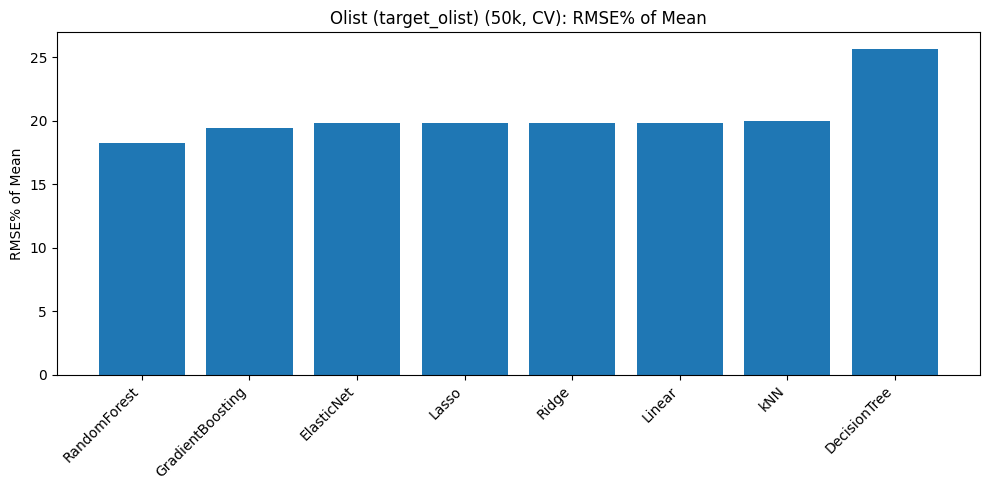

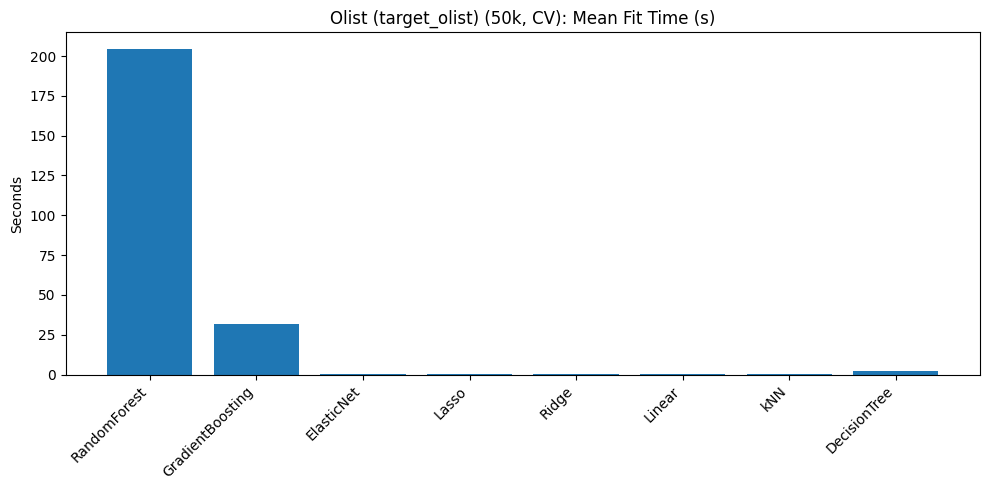

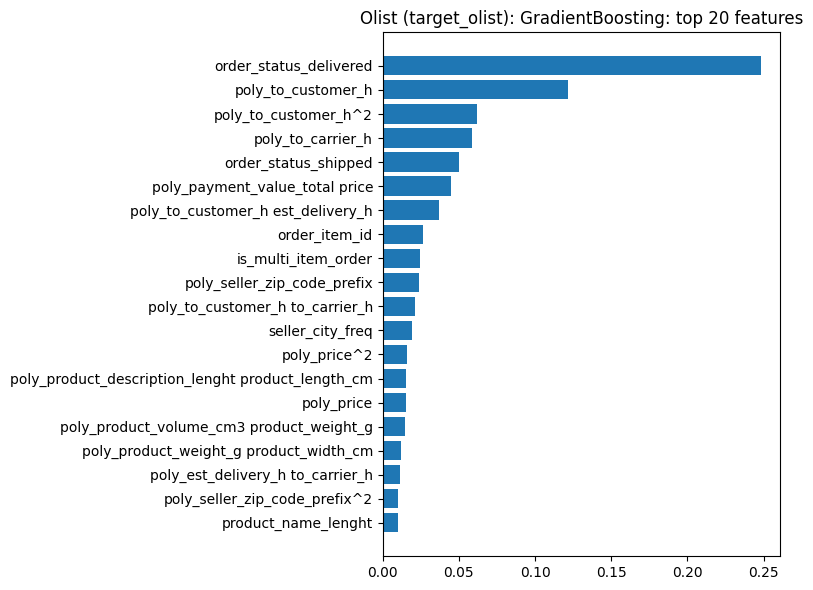

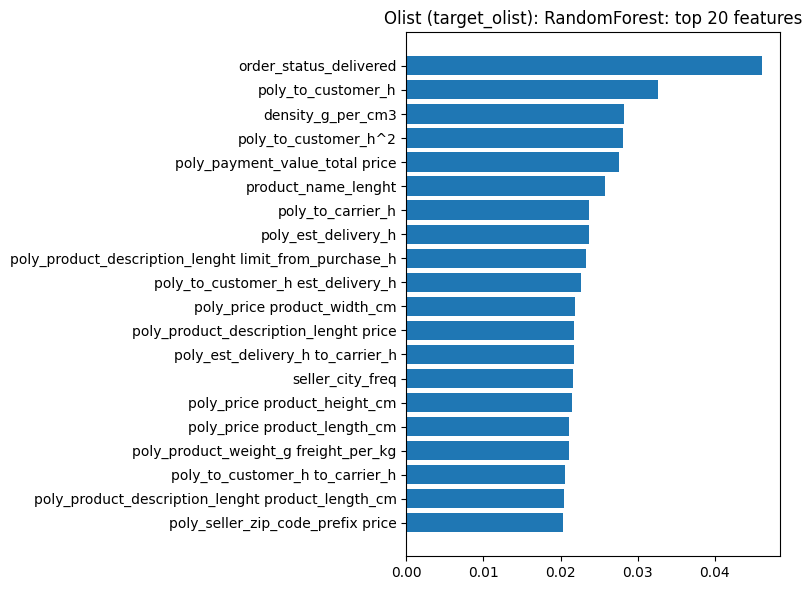

Olist (target_olist) elapsed: 249.10 s

VG2019 (target_sales): build 50k sample and run 5-fold regression CV

sample: using all 6536 rows
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.9366    1.2493  0.2604        12.98         17.32           2.380             0.051             2.431             120.43
GradientBoosting   1.0316    1.3223  0.1716        14.30         18.33           0.548             0.002             0.550               0.13
           Lasso   1.0805    1.3779  0.1005        14.98         19.10           0.015             0.002             0.017               0.00
      ElasticNet   1.0806    1.3779  0.1005        14.98         19.10           0.016             0.002             0.018               0.00
           Ridge   1.0807    1.3779  0.1004        14.98         19.10           0.005             0.002             0.007               0.00
          

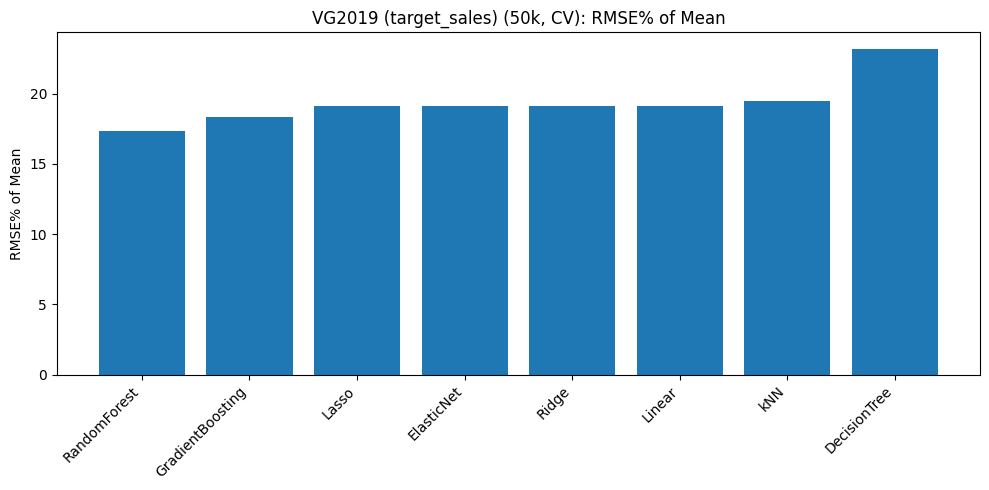

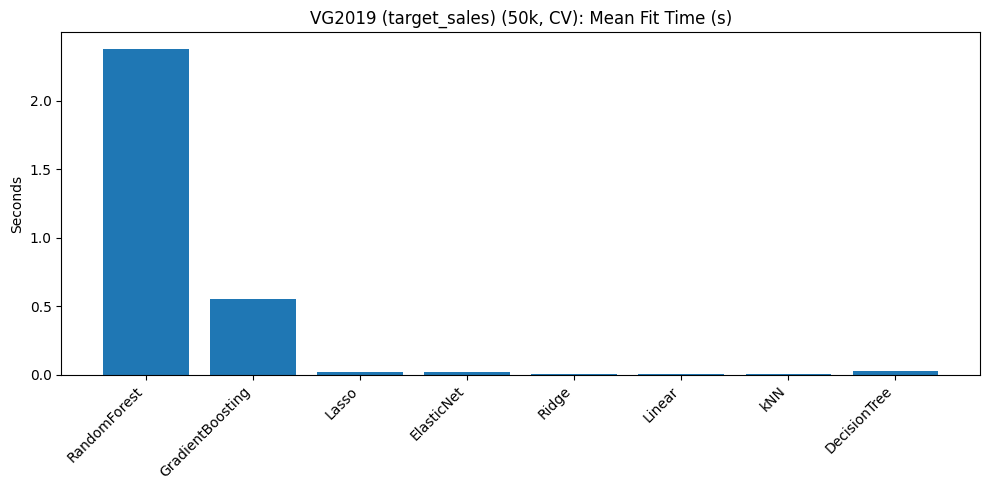

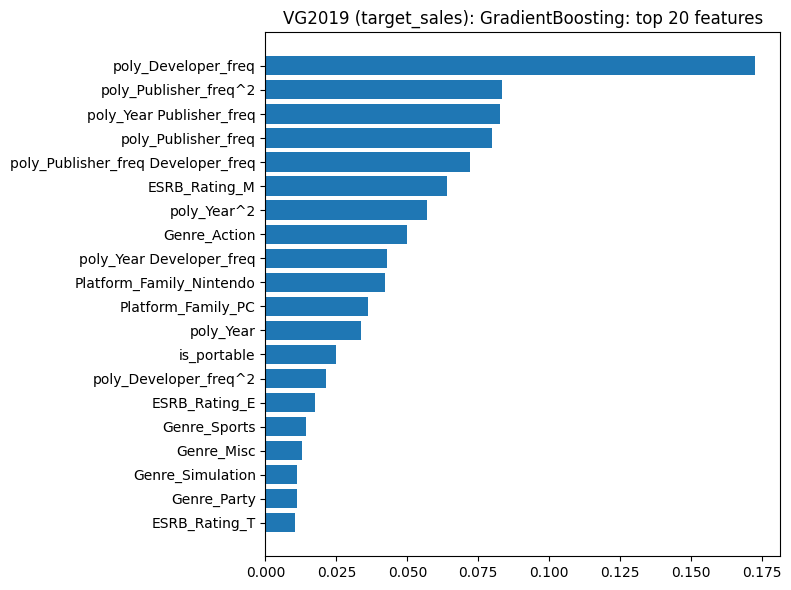

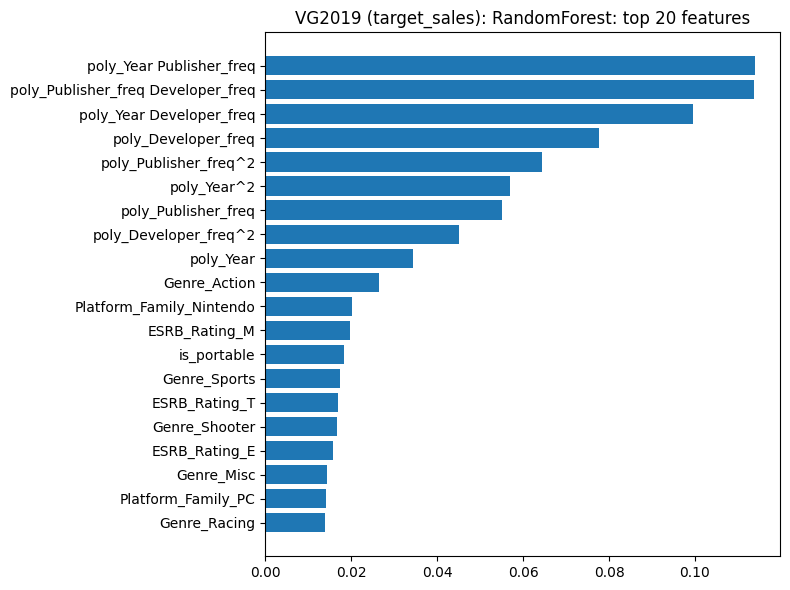

VG2019 (target_sales) elapsed: 5.91 s

SUMMARY TIME (seconds)

Classification total: 237.85
  Steam:  40.28
  Olist:  61.99
  VG2019: 31.06

Regression total:    2430.60
  Steam:  58.75
  Olist:  249.10
  VG2019: 5.91

ALL STEPS TOTAL:     12304.55 seconds

CSV outputs (created during runs):
 - steam_(target_steam)_cls_cv_50k_results.csv
 - olist_(target_olist)_cls_cv_50k_results.csv
 - vg2019_(target_sales)_cls_cv_50k_results.csv
 - steam_(target_steam)_reg_cv_50k_results.csv
 - olist_(target_olist)_reg_cv_50k_results.csv
 - vg2019_(target_sales)_reg_cv_50k_results.csv

FEATURE SELECTION K=60 RUN


RUNNING FULL PIPELINE WITH FEATURE SELECT K=60

prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train counts: {1: 781248, 0: 174261}
steam y_test counts: {1: 28773, 0: 15719}
steam balanced train counts: {1: 174261, 0: 174261}
target_olist trai

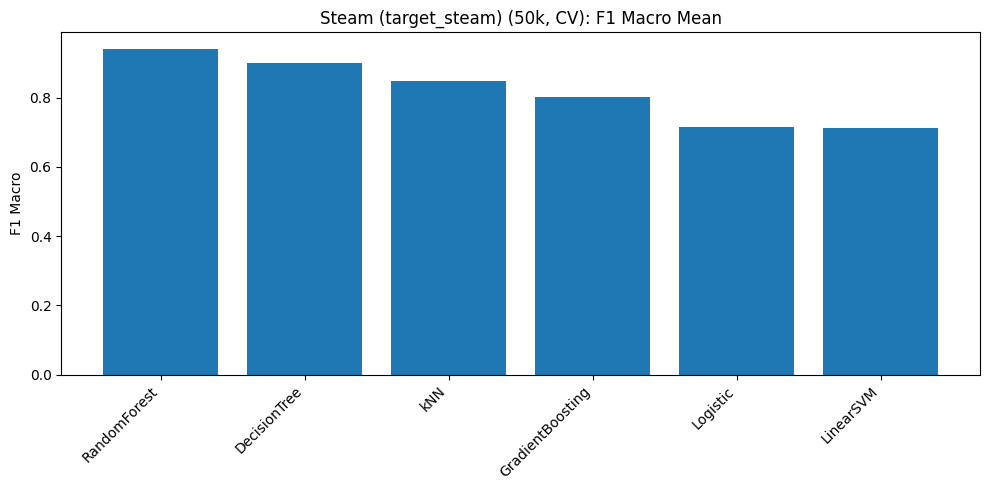

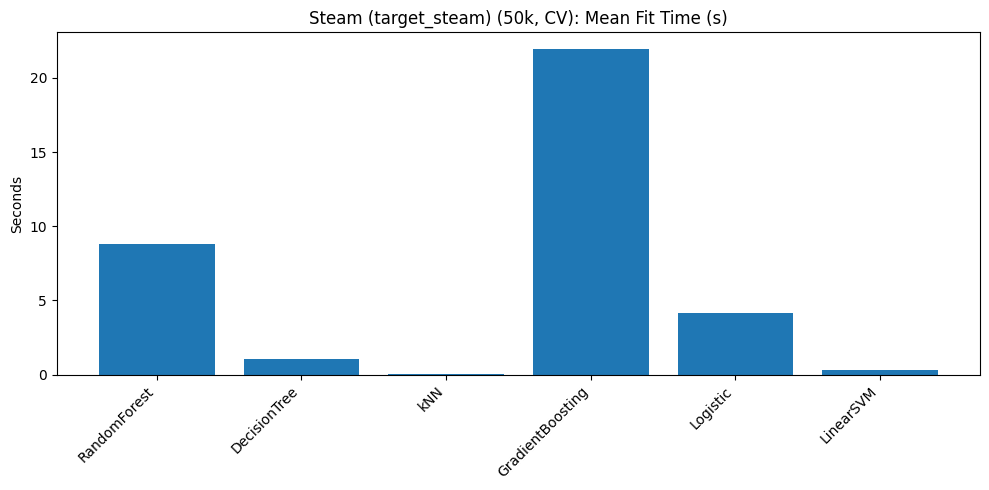

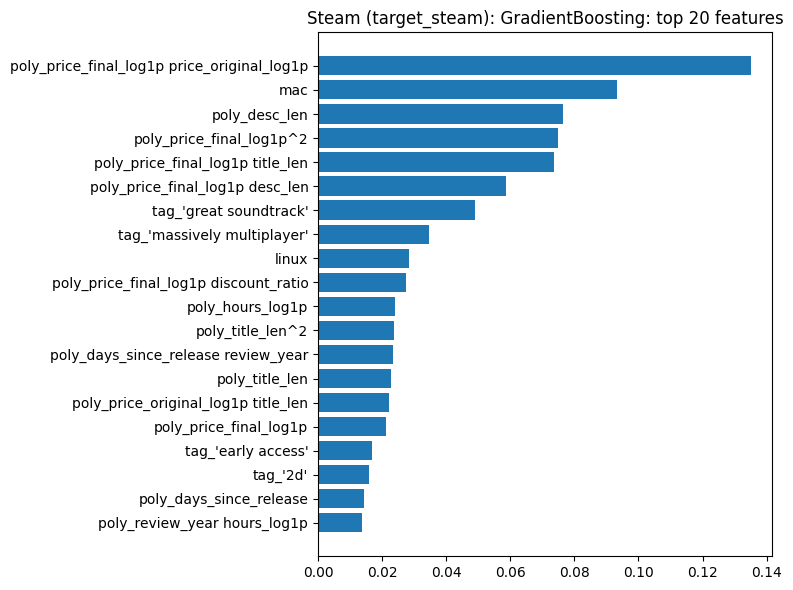

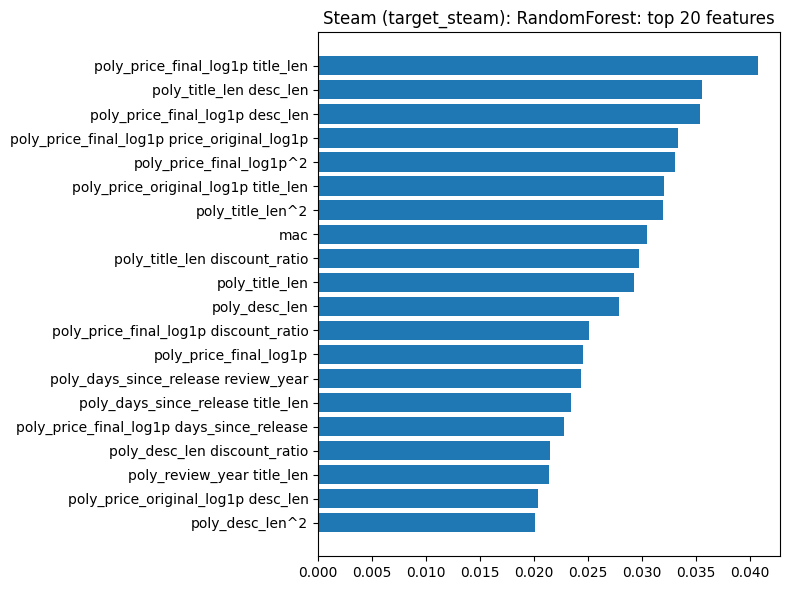

Steam (target_steam) elapsed: 44.02 s

Olist (target_olist): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)


/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.8882       0.0019        0.8888       0.9566          16.476             0.206            16.682             166.24
    DecisionTree        0.8236       0.0095        0.8238       0.8246           2.044             0.007             2.051               0.66
             kNN        0.7327       0.0056        0.7338       0.8165           0.016             1.966             1.982              18.62
GradientBoosting        0.6878       0.0028        0.6970       0.7640          37.485             0.020            37.504               0.14
        Logistic        0.5912       0.0003        0.6090       0.6515          26.344             0.006            26.351               0.01
       LinearSVM        0.5903       0.0011        0.6089       0.6516           0.862             0.007             0.870               0.01

Saved

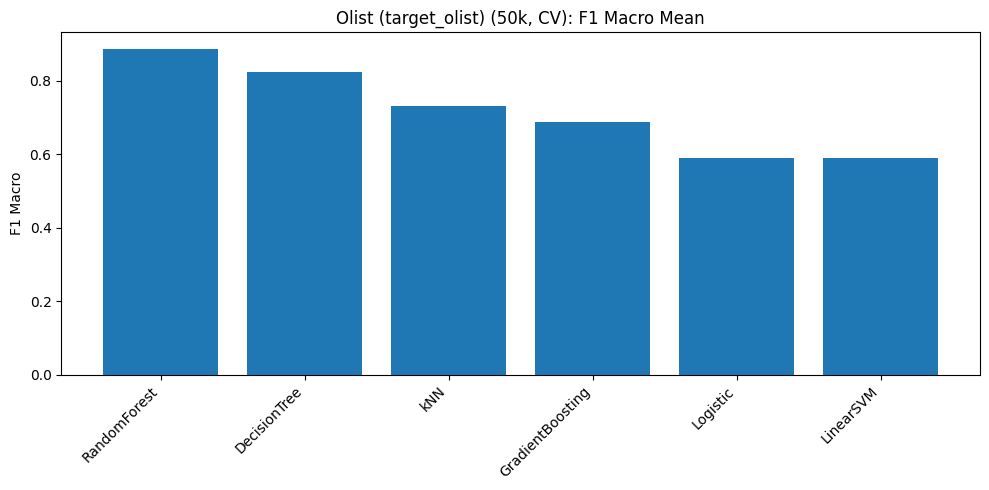

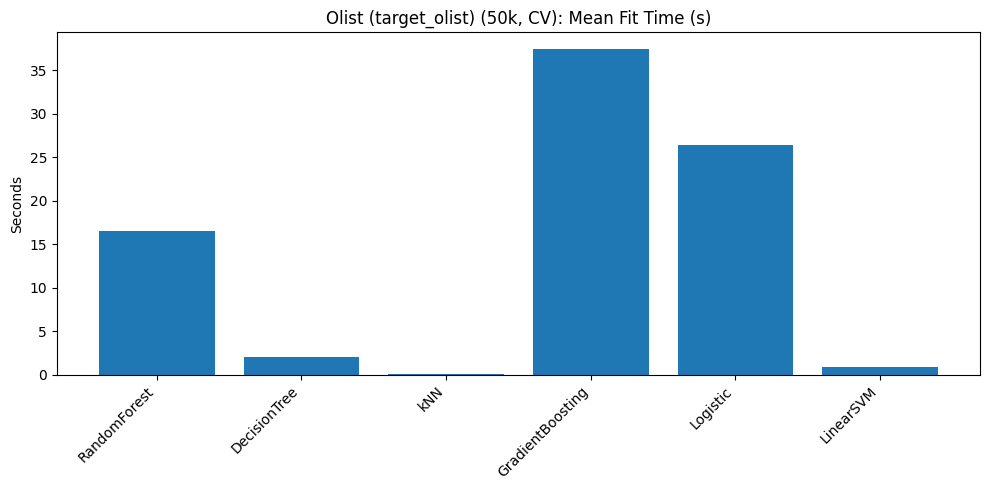

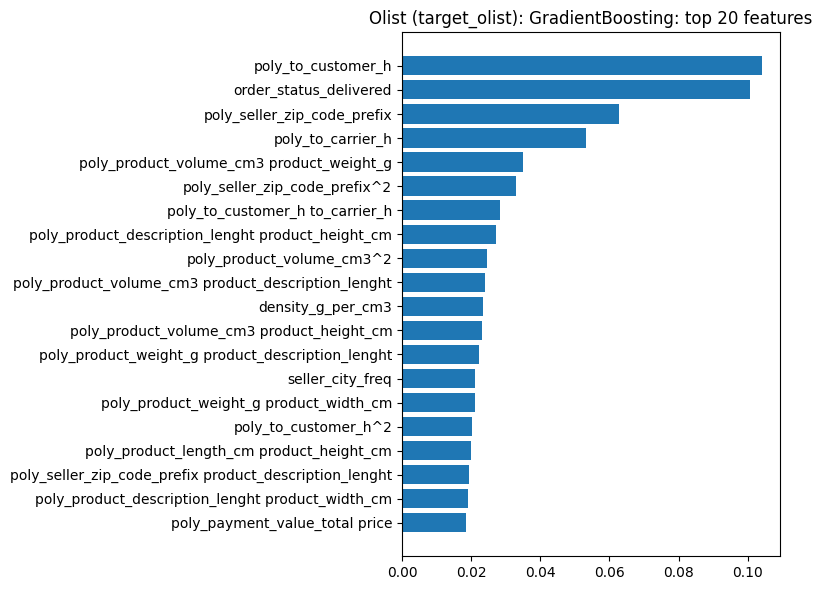

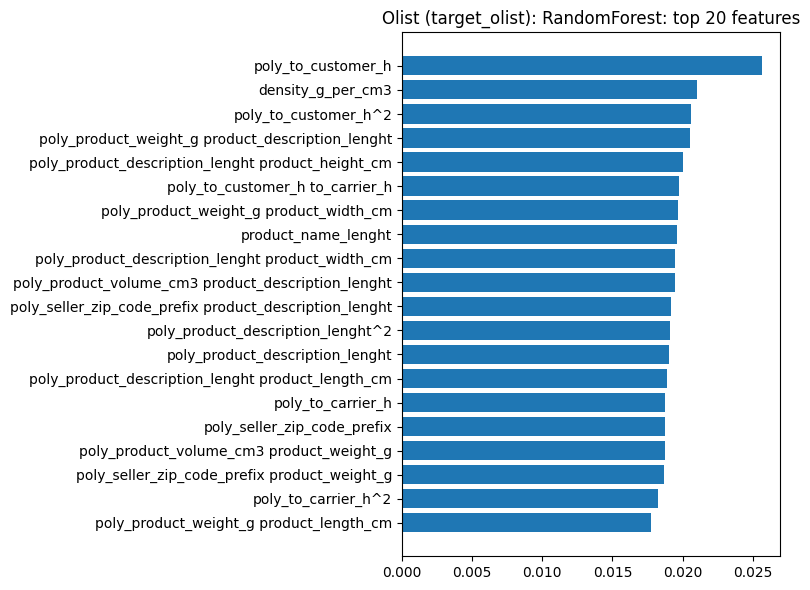

Olist (target_olist) elapsed: 90.60 s

VG2019 (target_sales): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.9803       0.0007        0.9804       0.9958           2.406             0.196             2.601              99.30
    DecisionTree        0.9679       0.0013        0.9681       0.9713           0.175             0.006             0.181               0.34
             kNN        0.8844       0.0019        0.8844       0.9549           0.036             1.933             1.969              16.48
GradientBoosting        0.8217       0.0014        0.8220       0.9019           4.370             0.020             4.390               0.14
        Logistic        0.7833       0.0025        0.7834       0.8523           6.876             0.013             6.889       

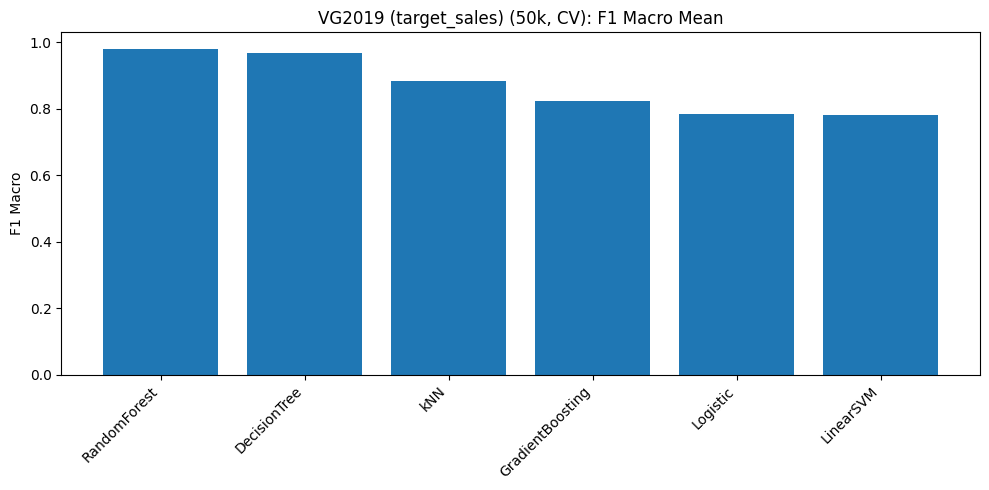

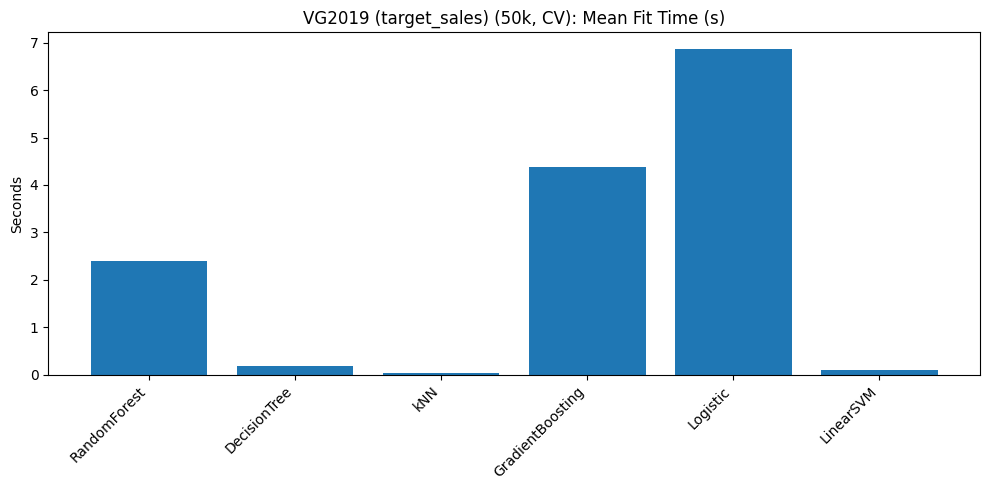

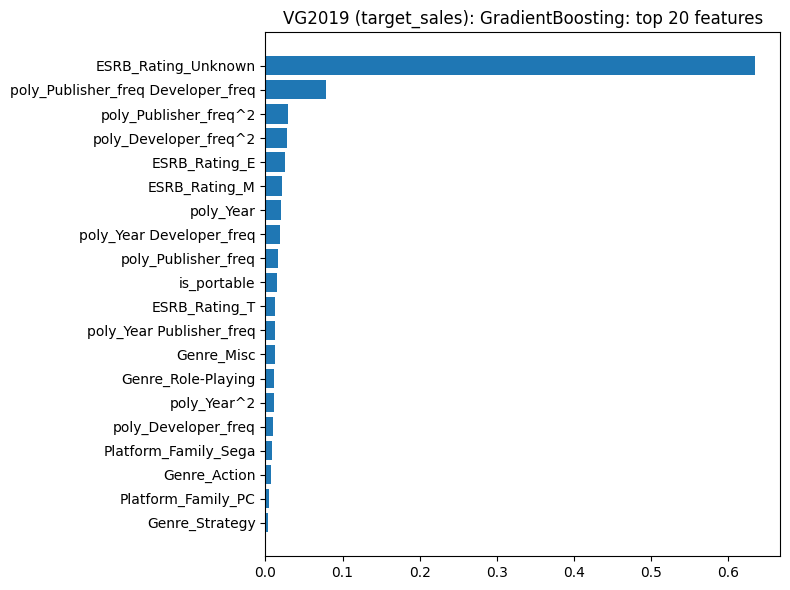

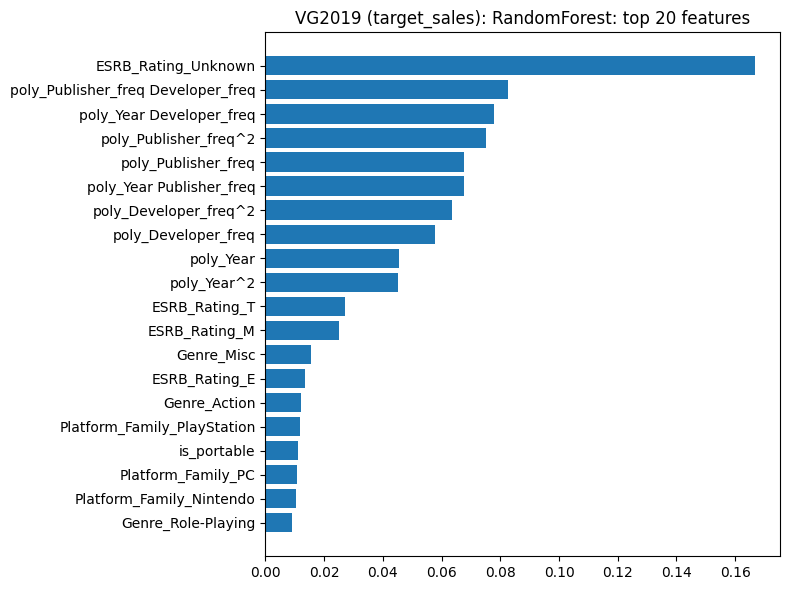

VG2019 (target_sales) elapsed: 21.24 s
prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train stats: {'n': 955509, 'mean': 86.35820698706135, 'std': 10.978047160242102, 'min': 0.0, 'max': 100.0}
steam y_test stats: {'n': 44492, 'mean': 81.25285444574305, 'std': 15.442551141752842, 'min': 0.0, 'max': 100.0}
target_olist train stats: {'n': 89954, 'mean': 4.058243751525879, 'std': 0.8512095808982849, 'min': 1.0, 'max': 5.0}
target_olist test stats: {'n': 22489, 'mean': 4.053517818450928, 'std': 0.8607538342475891, 'min': 1.0, 'max': 5.0}
target_sales train stats: {'n': 5228, 'mean': 7.202467441558838, 'std': 1.45883047580719, 'min': 1.0, 'max': 10.0}
target_sales test stats: {'n': 1308, 'mean': 7.258639812469482, 'std': 1.4334877729415894, 'min': 1.5, 'max': 10.0}
scaled columns: 12 with standard
polynomial features added: 90 (from 12 columns)

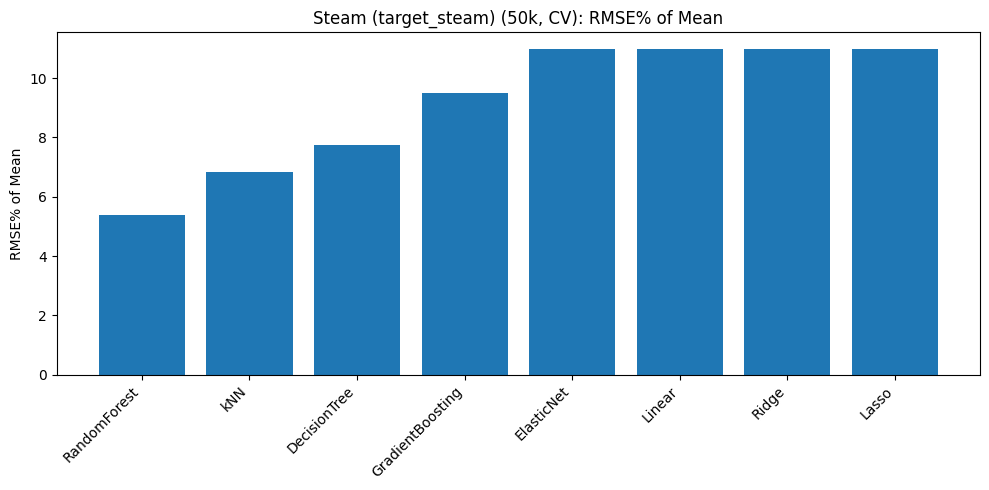

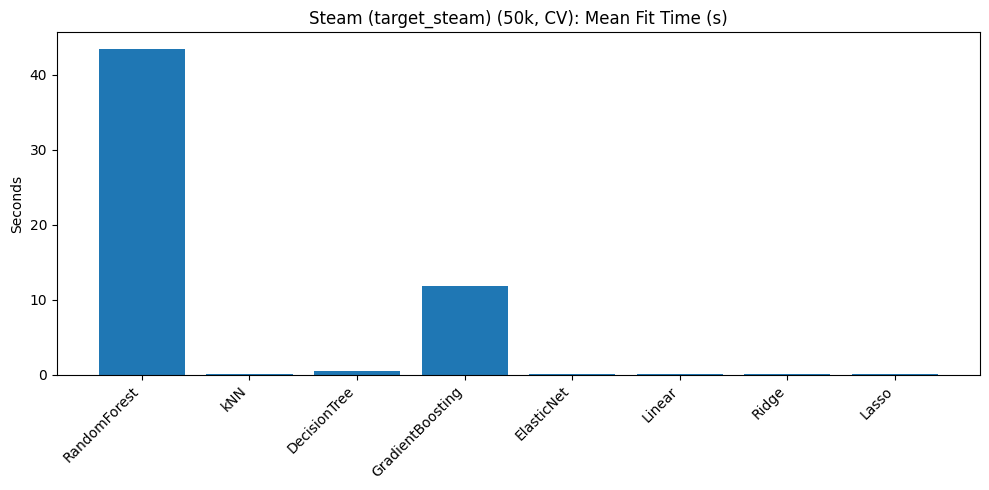

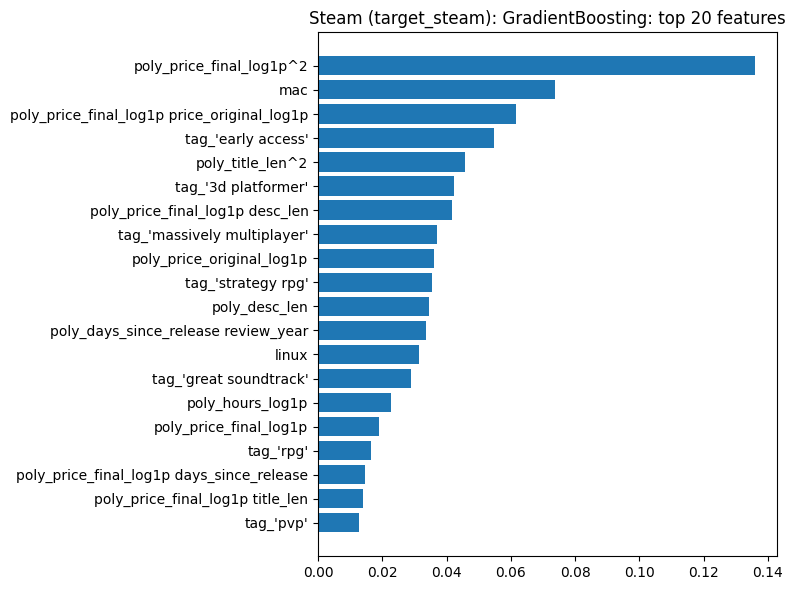

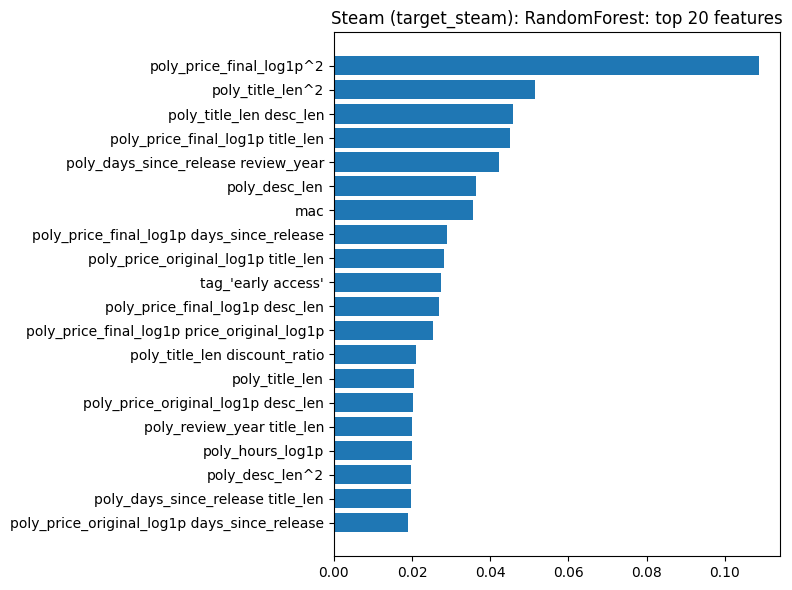

Steam (target_steam) elapsed: 66.36 s

Olist (target_olist): build 50k sample and run 5-fold regression CV

sample: picked 50000 rows (quantile-binned by target)
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.4912    0.7440  0.2402        12.11         18.34         253.381             0.138           253.519             636.69
GradientBoosting   0.5554    0.7884  0.1469        13.69         19.43          39.965             0.008            39.973               0.14
           Lasso   0.5689    0.8032  0.1144        14.02         19.80           0.073             0.011             0.084               0.01
      ElasticNet   0.5690    0.8036  0.1134        14.02         19.81           0.165             0.010             0.176               0.01
           Ridge   0.5691    0.8043  0.1120        14.03         19.82           0.050             0.010             0.061      

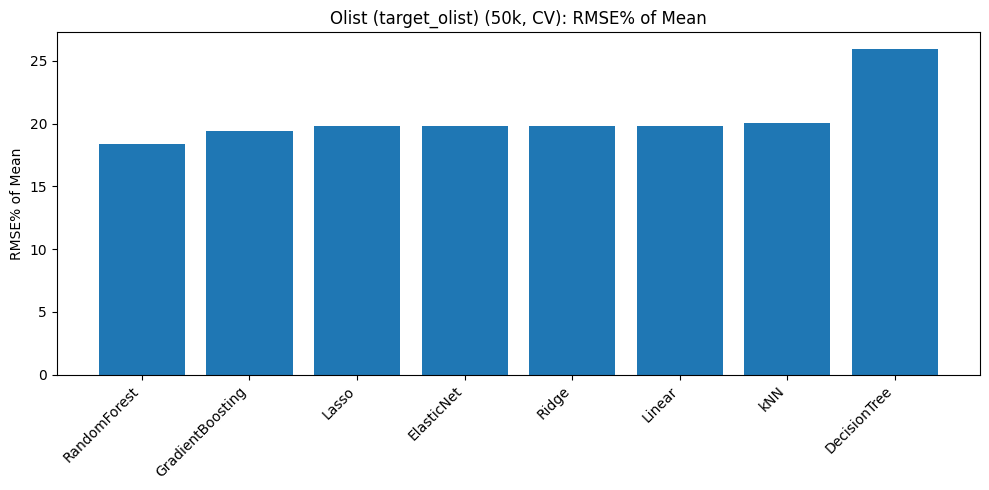

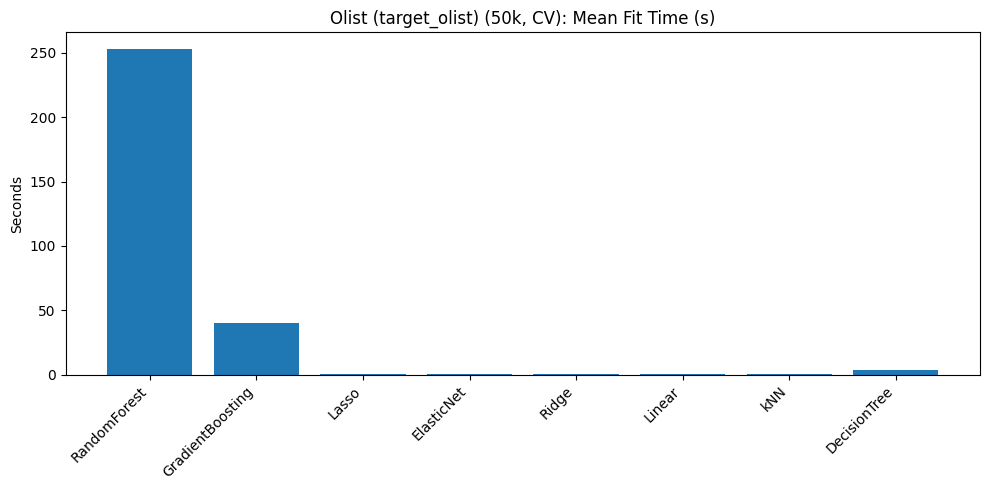

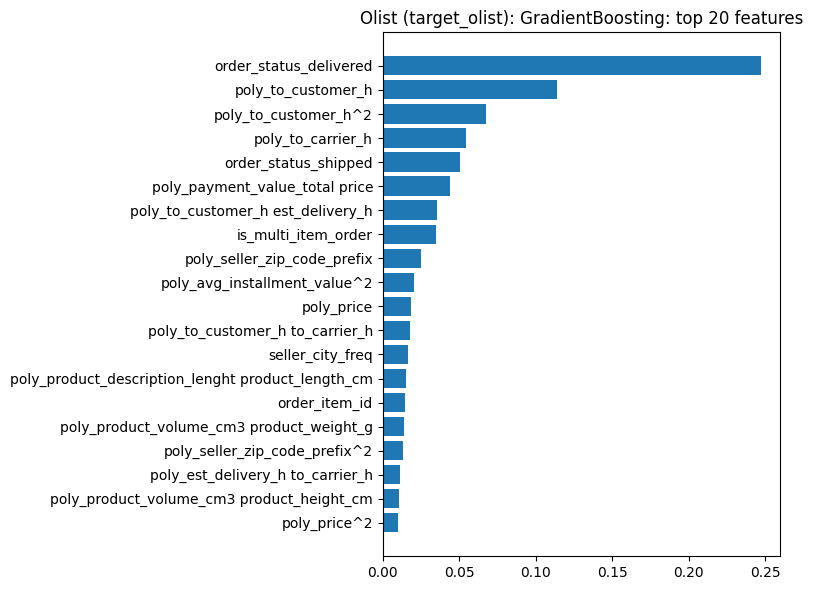

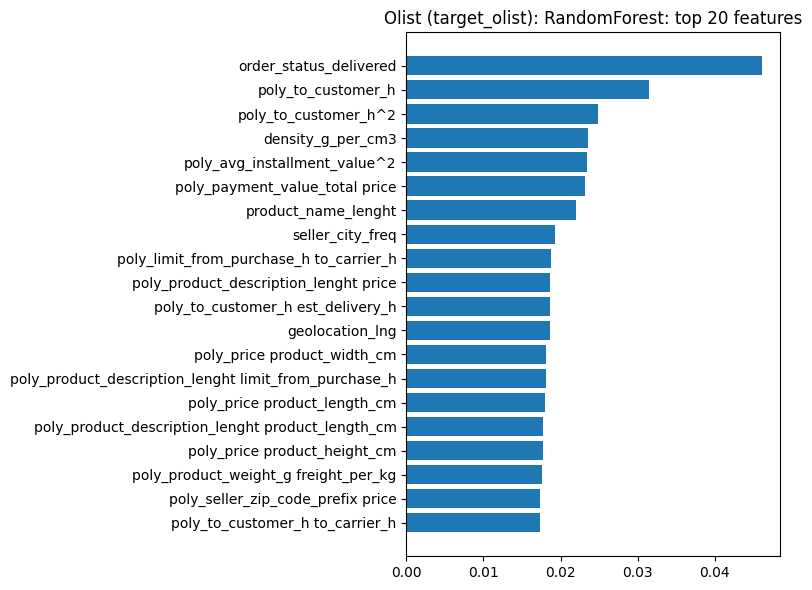

Olist (target_olist) elapsed: 306.52 s

VG2019 (target_sales): build 50k sample and run 5-fold regression CV

sample: using all 6536 rows
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.9358    1.2485  0.2615        12.97         17.31           1.694             0.044             1.738             120.43
GradientBoosting   1.0316    1.3221  0.1719        14.30         18.33           0.541             0.002             0.543               0.13
           Lasso   1.0806    1.3779  0.1004        14.98         19.10           0.019             0.002             0.021               0.00
      ElasticNet   1.0807    1.3780  0.1004        14.98         19.10           0.046             0.002             0.048               0.00
           Ridge   1.0808    1.3780  0.1003        14.98         19.10           0.006             0.002             0.007               0.00
          

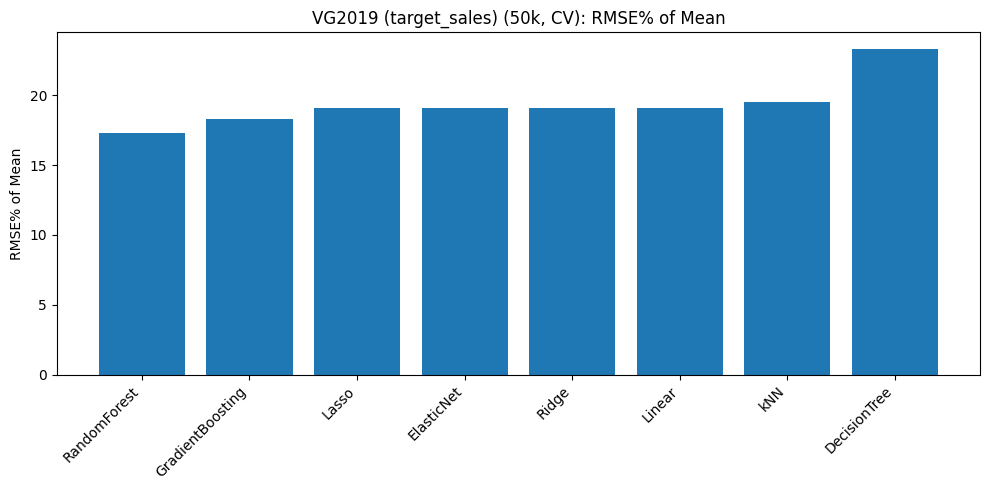

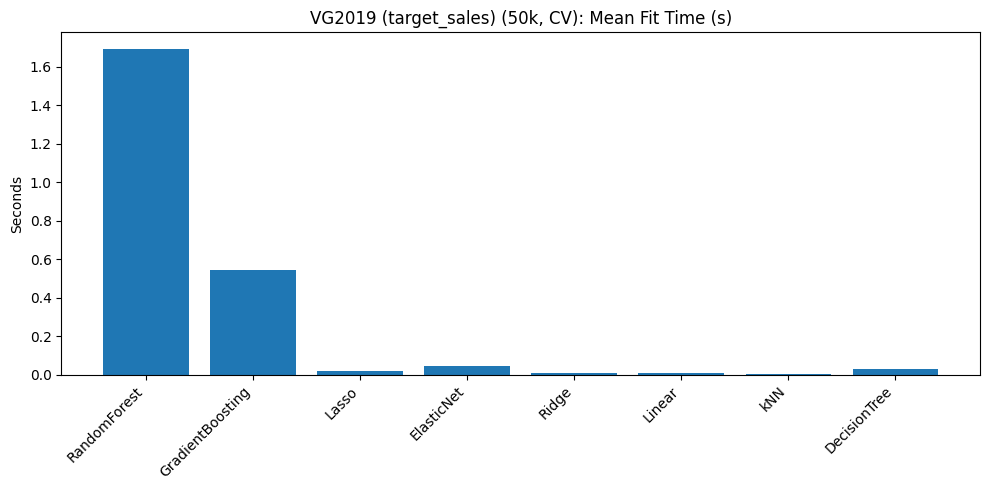

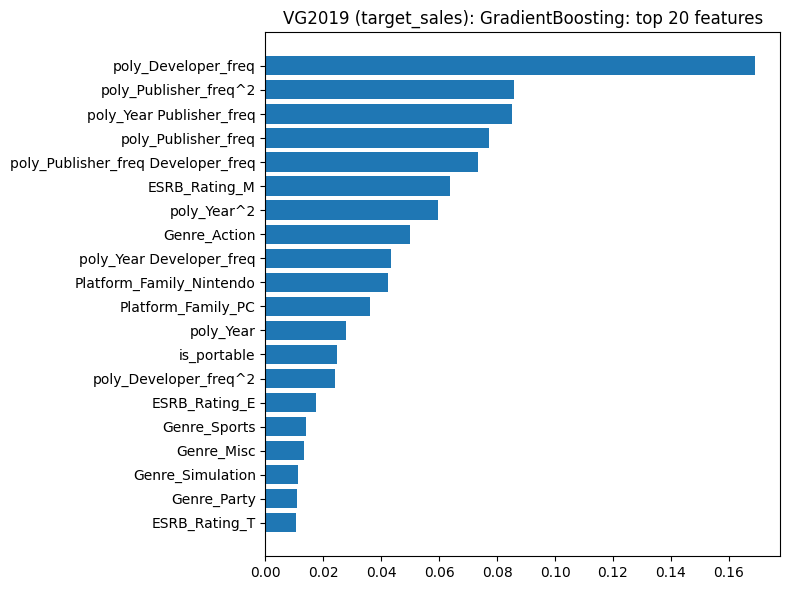

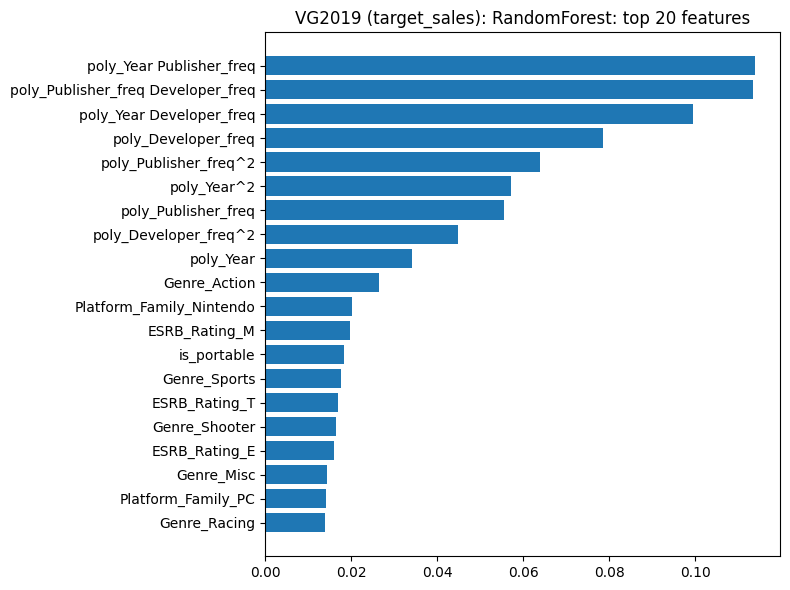

VG2019 (target_sales) elapsed: 6.37 s

SUMMARY TIME (seconds)

Classification total: 258.08
  Steam:  44.02
  Olist:  90.60
  VG2019: 21.24

Regression total:    2475.92
  Steam:  66.36
  Olist:  306.52
  VG2019: 6.37

ALL STEPS TOTAL:     15038.55 seconds

CSV outputs (created during runs):
 - steam_(target_steam)_cls_cv_50k_results.csv
 - olist_(target_olist)_cls_cv_50k_results.csv
 - vg2019_(target_sales)_cls_cv_50k_results.csv
 - steam_(target_steam)_reg_cv_50k_results.csv
 - olist_(target_olist)_reg_cv_50k_results.csv
 - vg2019_(target_sales)_reg_cv_50k_results.csv

FEATURE SELECTION K=70 RUN


RUNNING FULL PIPELINE WITH FEATURE SELECT K=70

prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train counts: {1: 781248, 0: 174261}
steam y_test counts: {1: 28773, 0: 15719}
steam balanced train counts: {1: 174261, 0: 174261}
target_olist trai

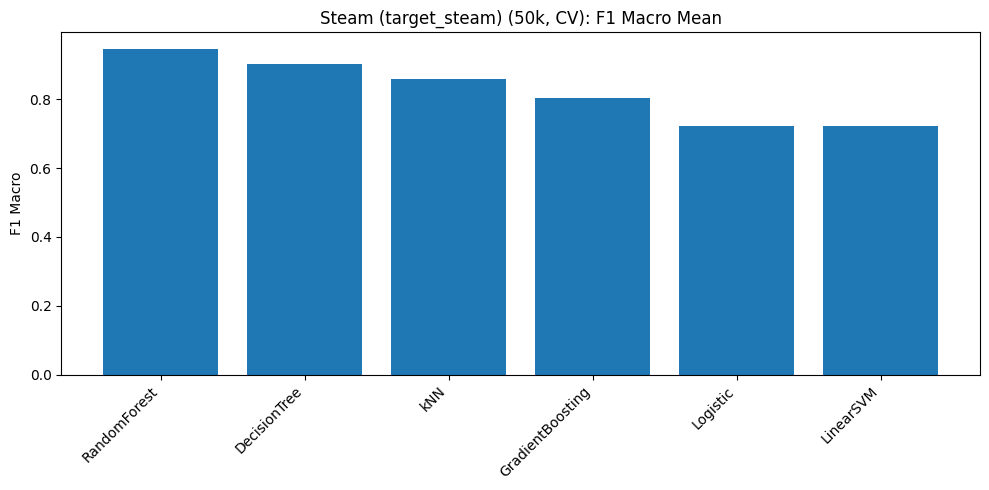

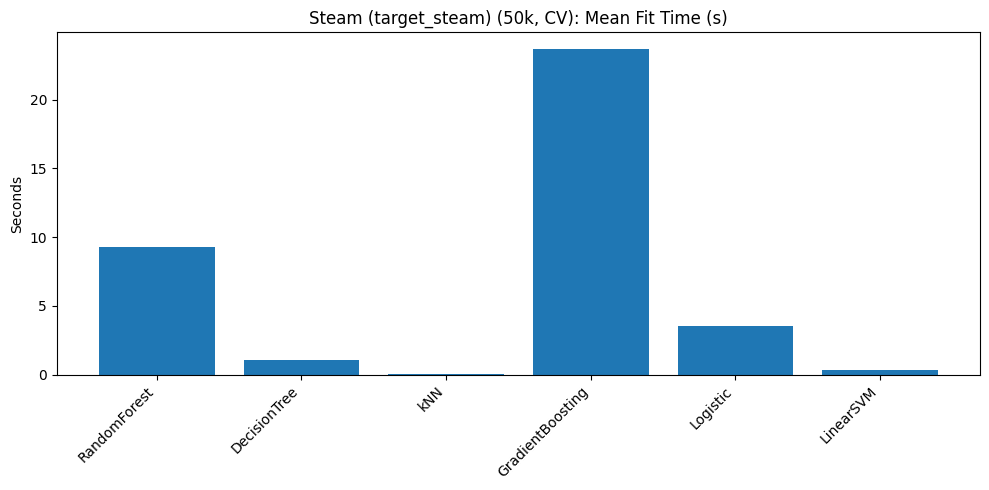

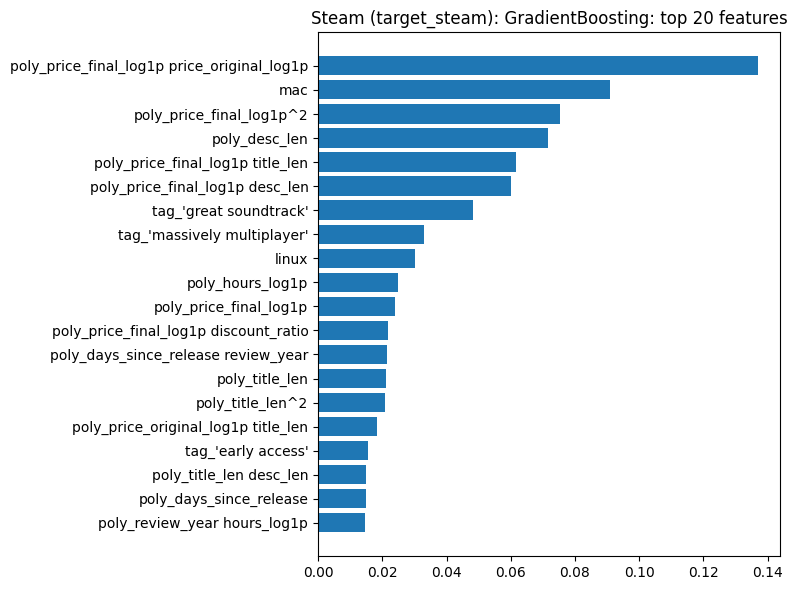

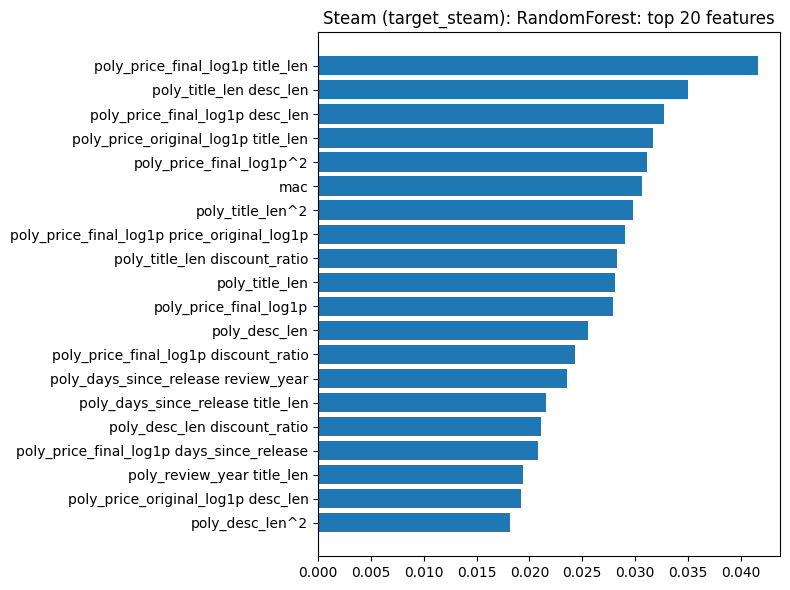

Steam (target_steam) elapsed: 46.22 s

Olist (target_olist): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)


/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.8843       0.0025        0.8850       0.9542          20.486             0.232            20.719             163.40
    DecisionTree        0.8187       0.0082        0.8189       0.8197           2.481             0.008             2.488               0.65
             kNN        0.7298       0.0060        0.7309       0.8122           0.021             2.009             2.030              21.67
GradientBoosting        0.6869       0.0032        0.6962       0.7640          45.283             0.021            45.304               0.14
        Logistic        0.5954       0.0018        0.6125       0.6541          29.585             0.007            29.592               0.01
       LinearSVM        0.5943       0.0016        0.6122       0.6538           1.033             0.008             1.041               0.01

Saved

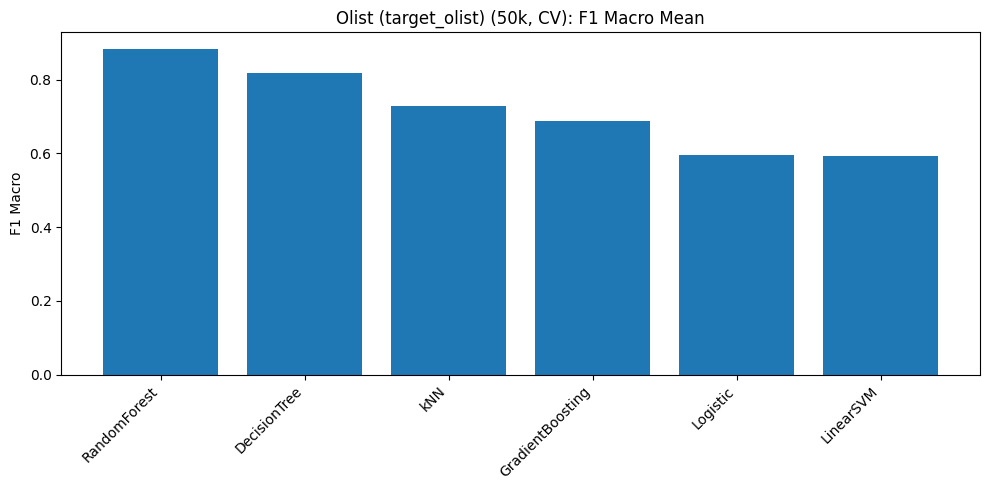

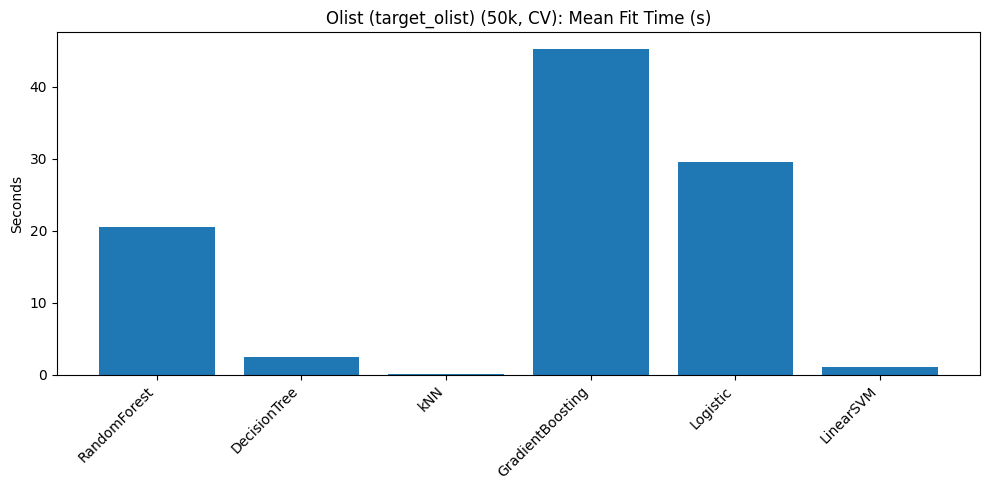

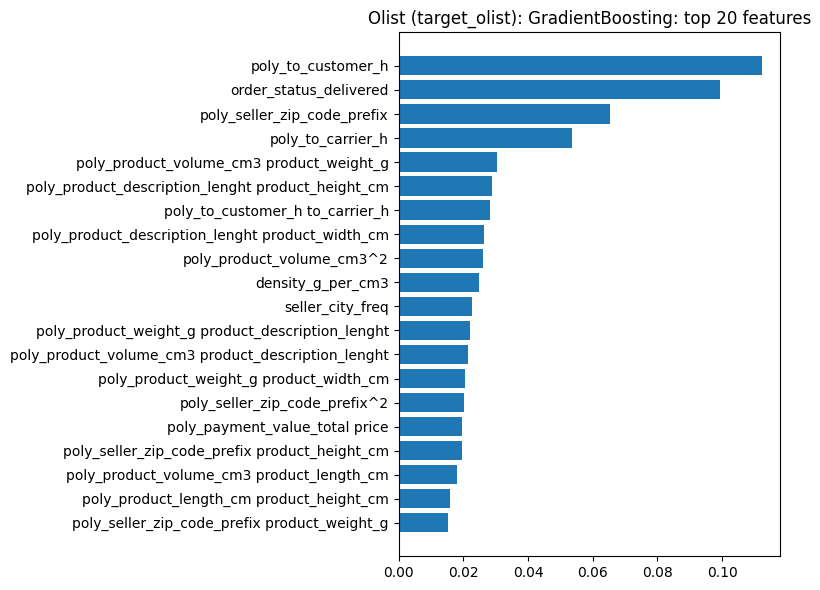

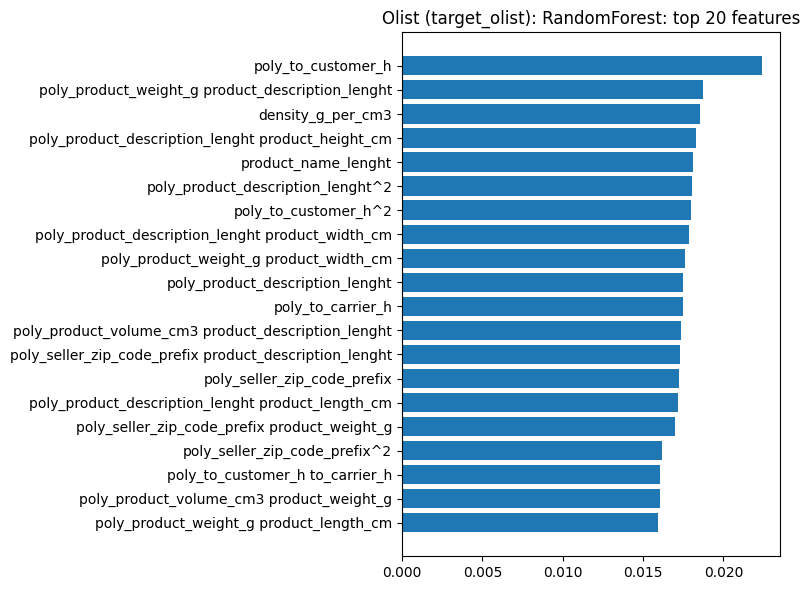

Olist (target_olist) elapsed: 106.55 s

VG2019 (target_sales): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.9803       0.0007        0.9804       0.9958           2.393             0.206             2.599              99.30
    DecisionTree        0.9679       0.0013        0.9681       0.9713           0.178             0.006             0.184               0.34
             kNN        0.8844       0.0019        0.8844       0.9549           0.034             1.906             1.939              16.48
GradientBoosting        0.8217       0.0014        0.8220       0.9019           4.345             0.020             4.365               0.14
        Logistic        0.7833       0.0025        0.7834       0.8523           6.892             0.012             6.905      

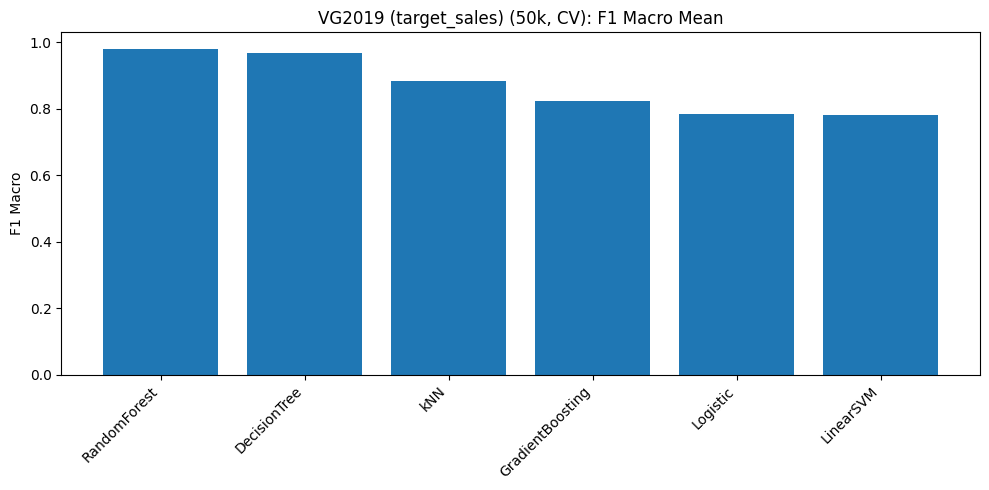

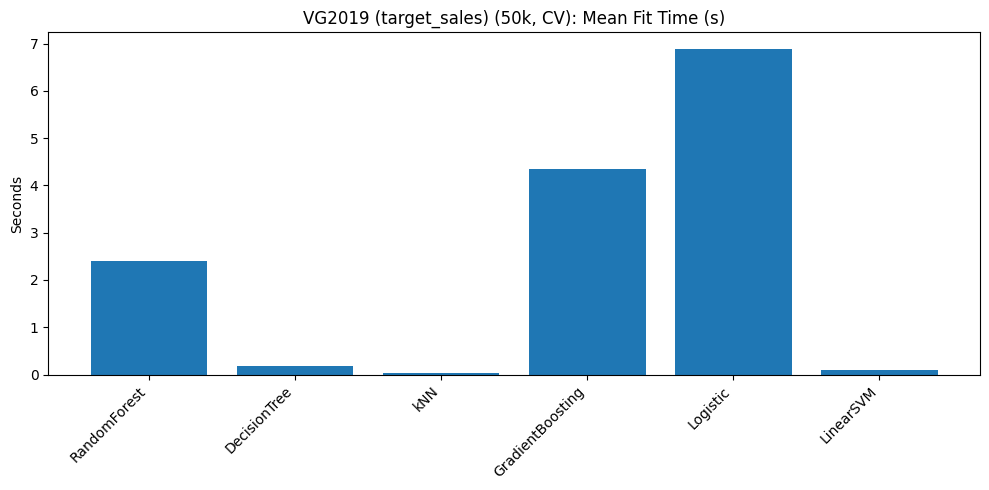

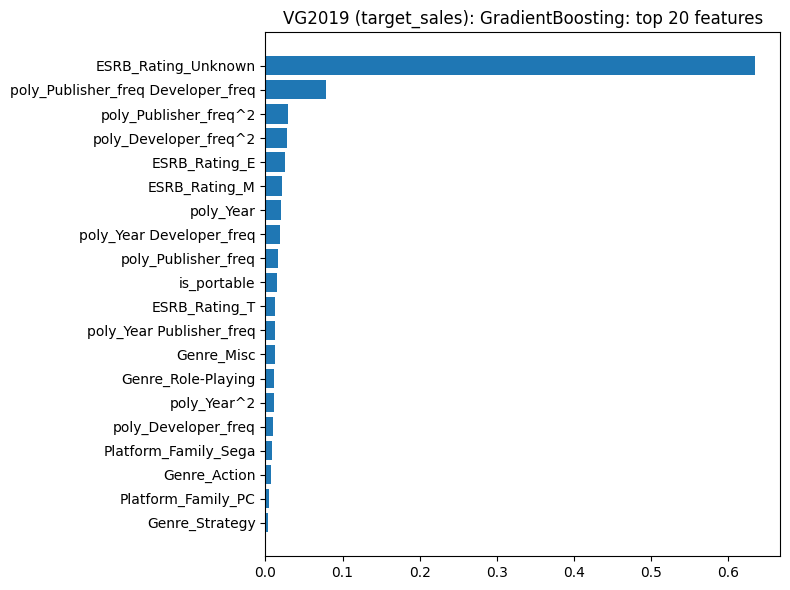

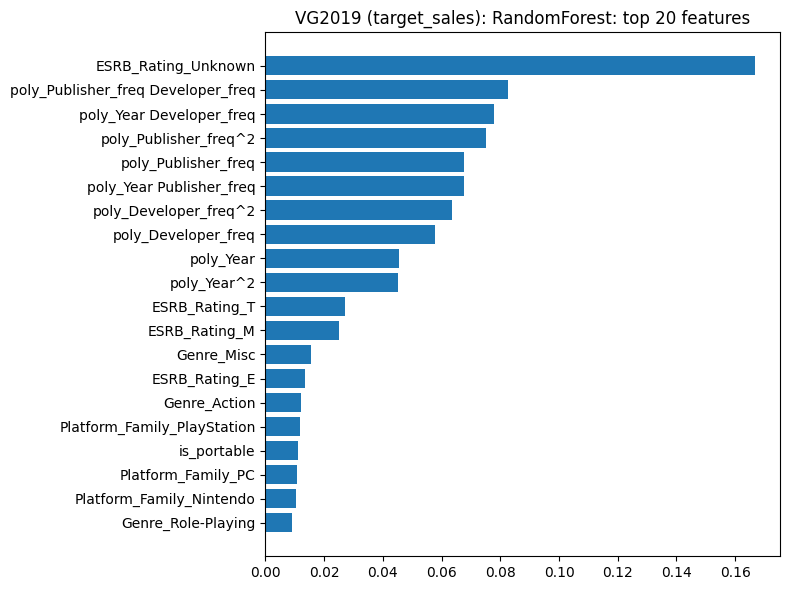

VG2019 (target_sales) elapsed: 21.76 s
prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train stats: {'n': 955509, 'mean': 86.35820698706135, 'std': 10.978047160242102, 'min': 0.0, 'max': 100.0}
steam y_test stats: {'n': 44492, 'mean': 81.25285444574305, 'std': 15.442551141752842, 'min': 0.0, 'max': 100.0}
target_olist train stats: {'n': 89954, 'mean': 4.058243751525879, 'std': 0.8512095808982849, 'min': 1.0, 'max': 5.0}
target_olist test stats: {'n': 22489, 'mean': 4.053517818450928, 'std': 0.8607538342475891, 'min': 1.0, 'max': 5.0}
target_sales train stats: {'n': 5228, 'mean': 7.202467441558838, 'std': 1.45883047580719, 'min': 1.0, 'max': 10.0}
target_sales test stats: {'n': 1308, 'mean': 7.258639812469482, 'std': 1.4334877729415894, 'min': 1.5, 'max': 10.0}
scaled columns: 12 with standard
polynomial features added: 90 (from 12 columns)

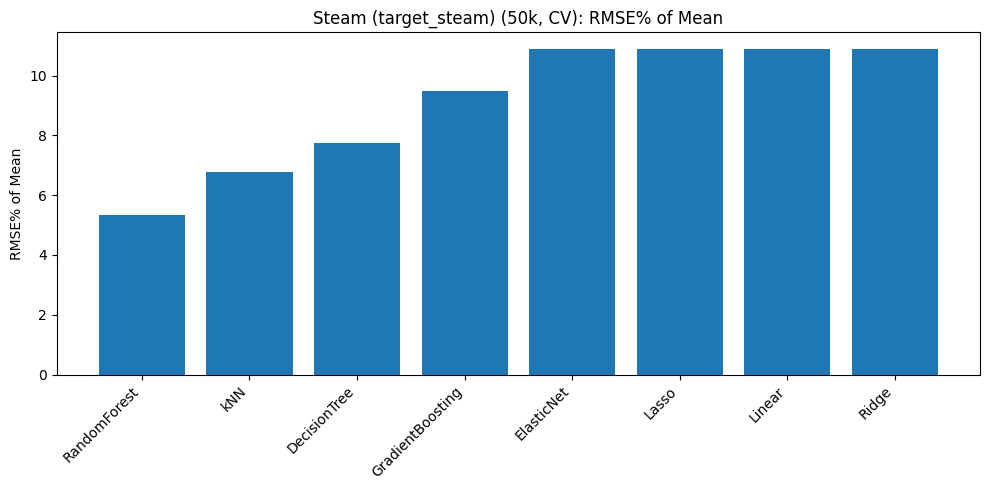

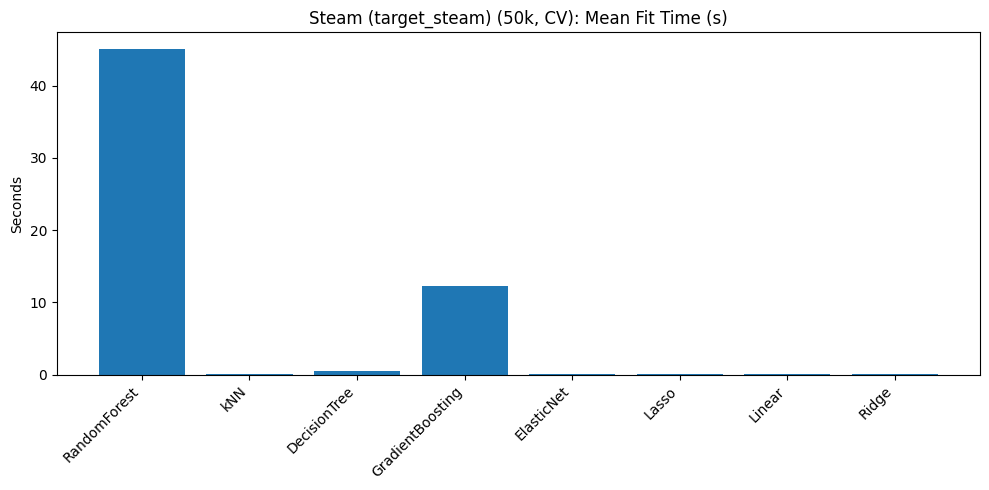

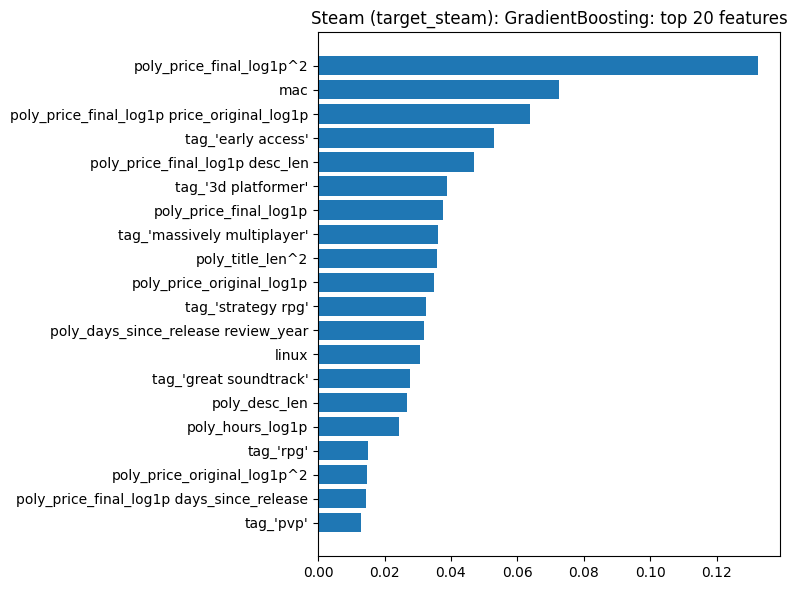

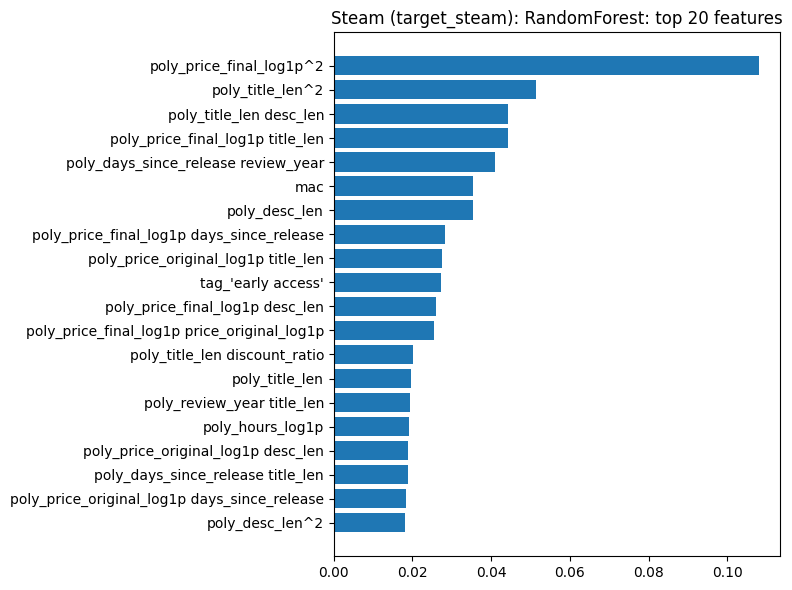

Steam (target_steam) elapsed: 67.89 s

Olist (target_olist): build 50k sample and run 5-fold regression CV

sample: picked 50000 rows (quantile-binned by target)
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.4965    0.7467  0.2347        12.24         18.40         307.090             0.149           307.239             642.81
GradientBoosting   0.5559    0.7887  0.1460        13.70         19.44          48.399             0.008            48.407               0.14
           Lasso   0.5687    0.8026  0.1157        14.02         19.78           0.106             0.012             0.118               0.01
      ElasticNet   0.5687    0.8028  0.1152        14.02         19.79           0.193             0.013             0.206               0.01
           Ridge   0.5688    0.8033  0.1141        14.02         19.80           0.062             0.013             0.075      

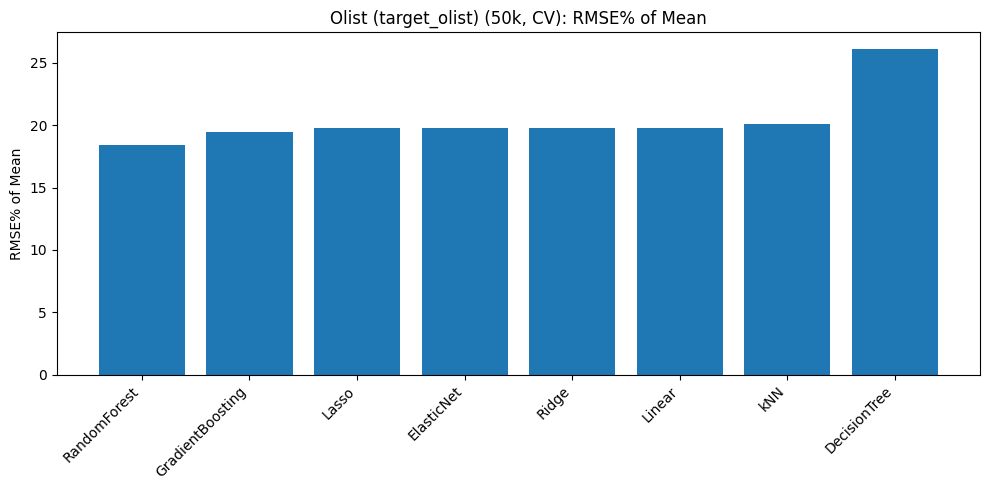

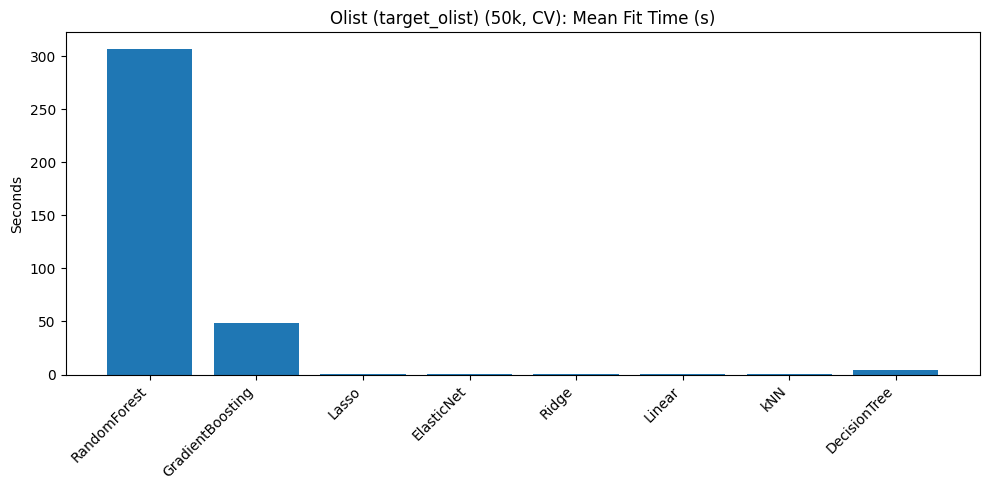

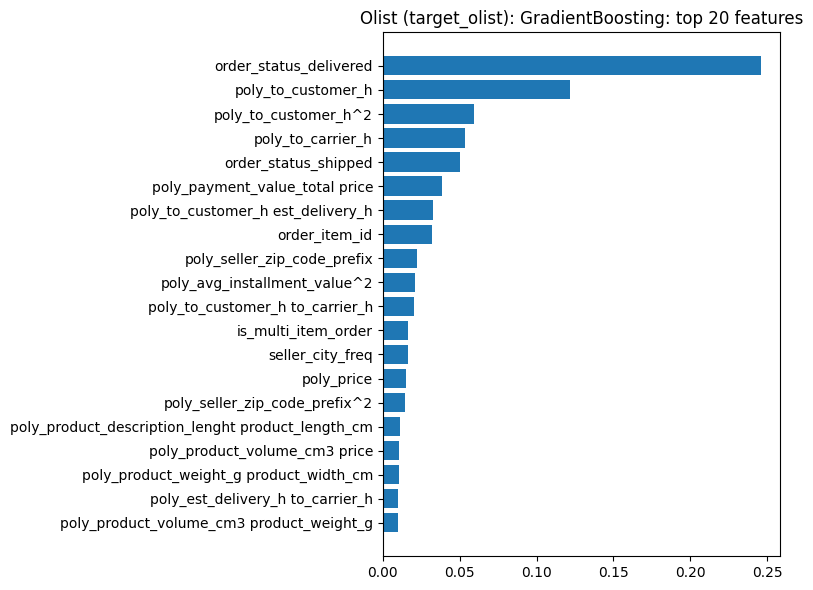

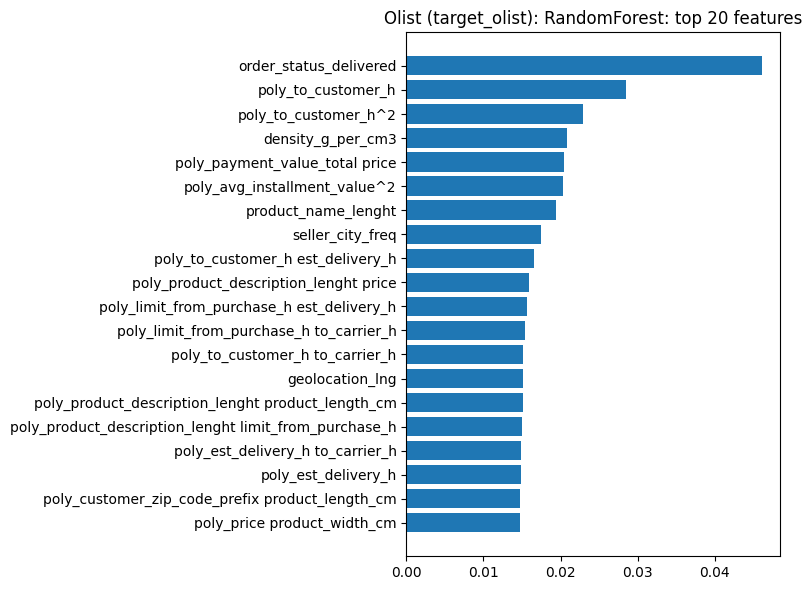

Olist (target_olist) elapsed: 370.61 s

VG2019 (target_sales): build 50k sample and run 5-fold regression CV

sample: using all 6536 rows
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.9358    1.2485  0.2615        12.97         17.31           2.427             0.050             2.477             120.43
GradientBoosting   1.0316    1.3221  0.1719        14.30         18.33           0.549             0.002             0.551               0.13
           Lasso   1.0806    1.3779  0.1004        14.98         19.10           0.019             0.002             0.021               0.00
      ElasticNet   1.0807    1.3780  0.1004        14.98         19.10           0.045             0.002             0.047               0.00
           Ridge   1.0808    1.3780  0.1003        14.98         19.10           0.005             0.001             0.006               0.00
          

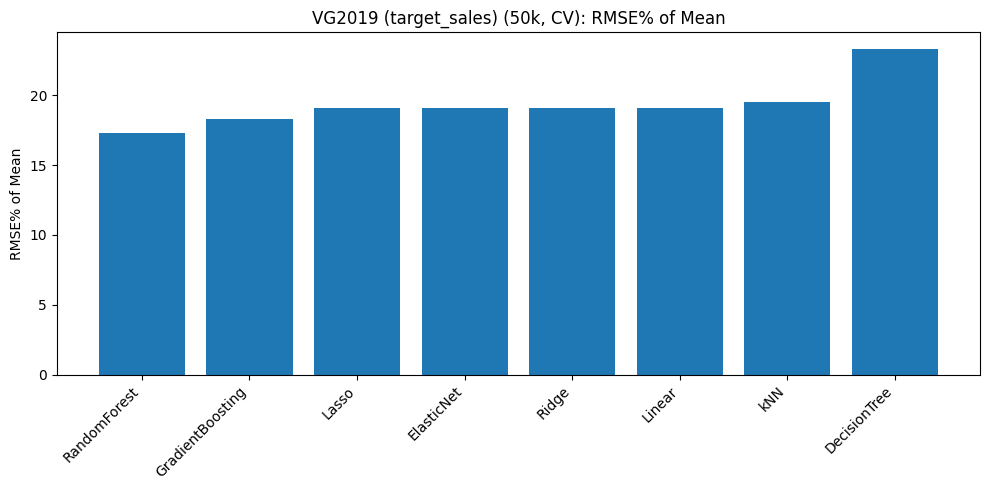

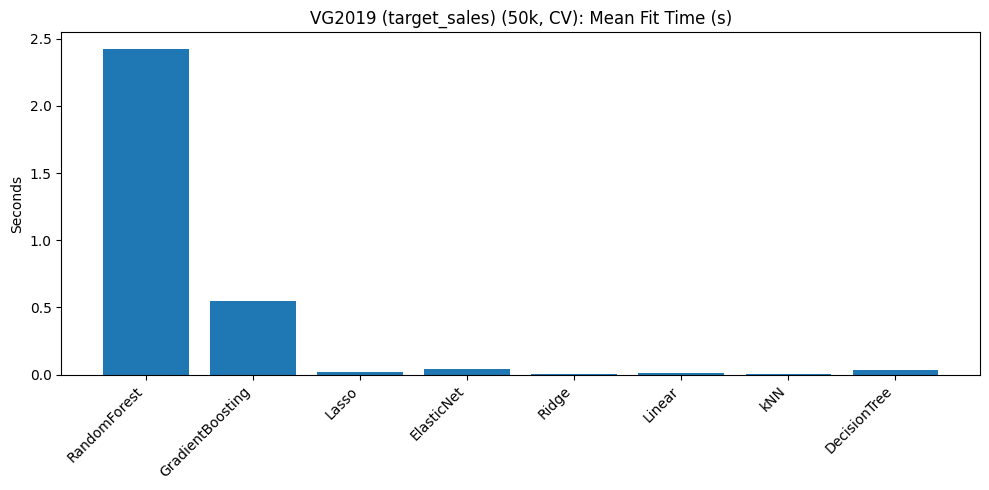

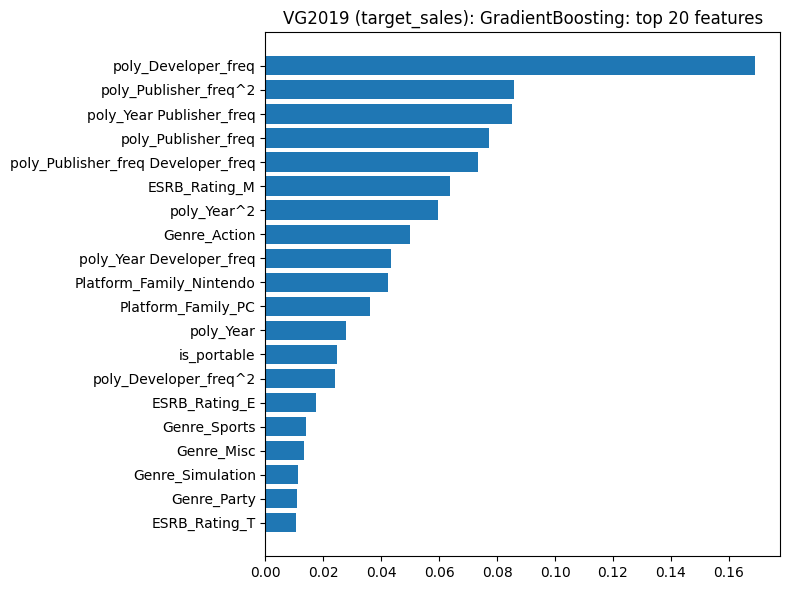

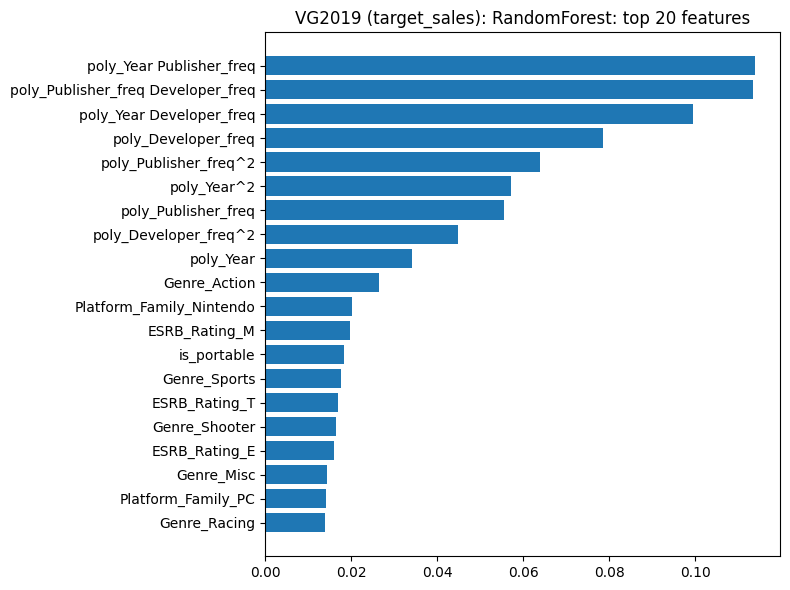

VG2019 (target_sales) elapsed: 4.65 s

SUMMARY TIME (seconds)

Classification total: 278.59
  Steam:  46.22
  Olist:  106.55
  VG2019: 21.76

Regression total:    2537.82
  Steam:  67.89
  Olist:  370.61
  VG2019: 4.65

ALL STEPS TOTAL:     17854.95 seconds

CSV outputs (created during runs):
 - steam_(target_steam)_cls_cv_50k_results.csv
 - olist_(target_olist)_cls_cv_50k_results.csv
 - vg2019_(target_sales)_cls_cv_50k_results.csv
 - steam_(target_steam)_reg_cv_50k_results.csv
 - olist_(target_olist)_reg_cv_50k_results.csv
 - vg2019_(target_sales)_reg_cv_50k_results.csv

FEATURE SELECTION K=80 RUN


RUNNING FULL PIPELINE WITH FEATURE SELECT K=80

prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train counts: {1: 781248, 0: 174261}
steam y_test counts: {1: 28773, 0: 15719}
steam balanced train counts: {1: 174261, 0: 174261}
target_olist tra

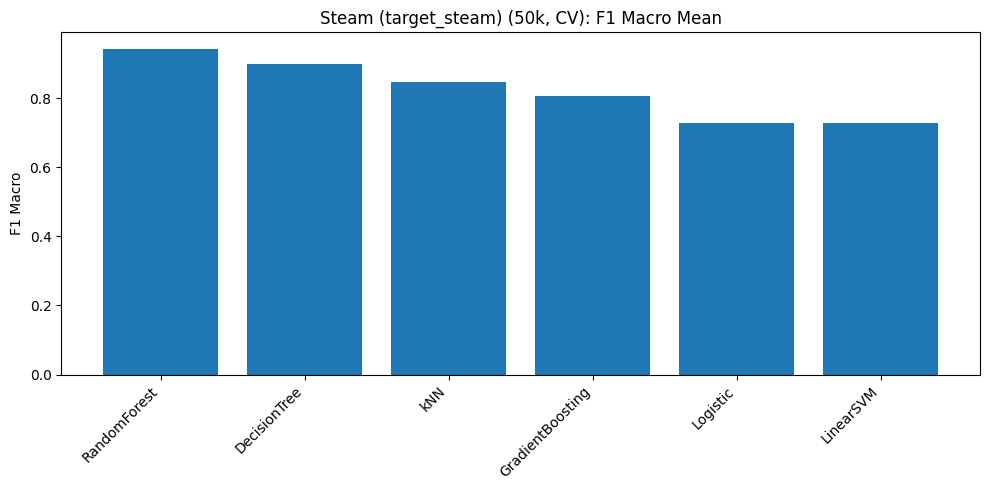

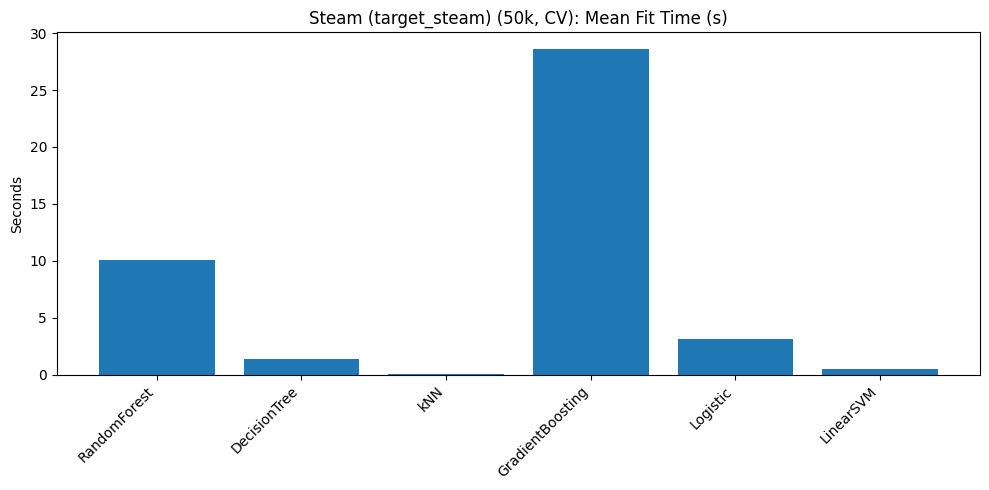

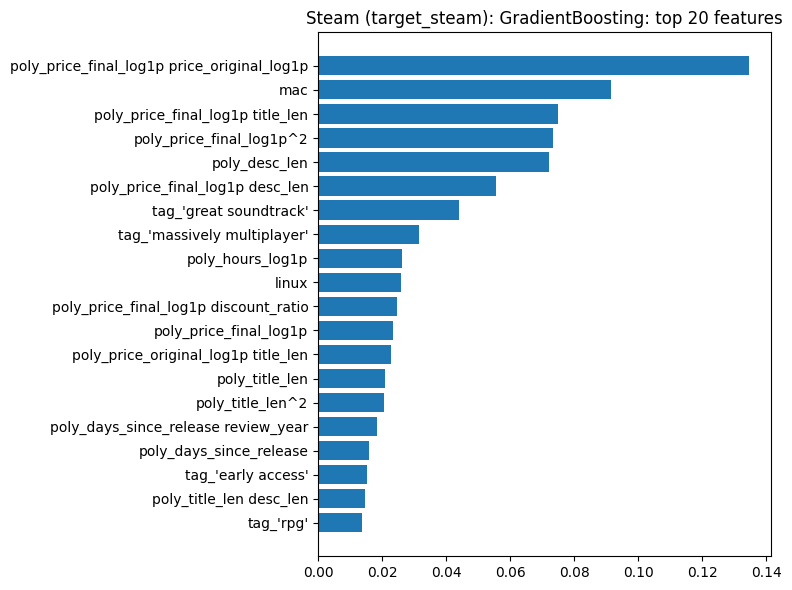

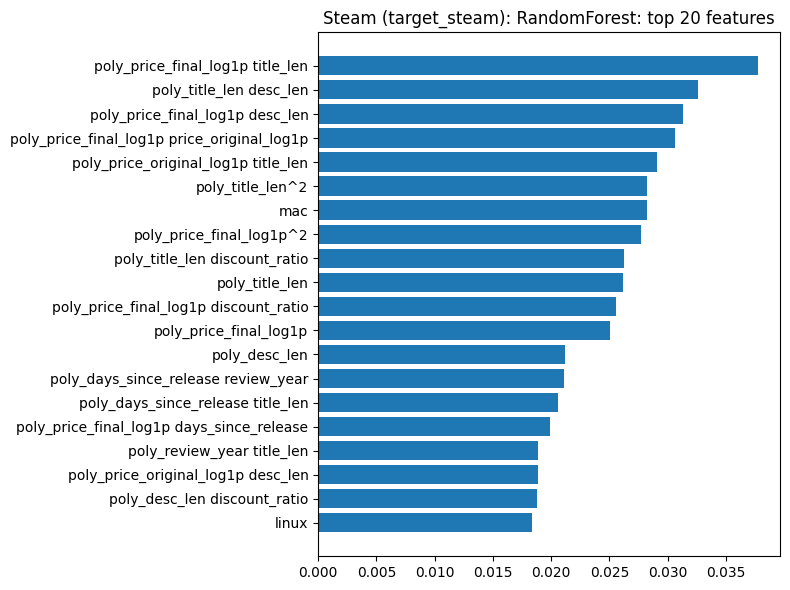

Steam (target_steam) elapsed: 53.14 s

Olist (target_olist): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)


/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.8859       0.0026        0.8867       0.9547          19.447             0.234            19.681             164.19
    DecisionTree        0.8149       0.0068        0.8151       0.8159           2.904             0.008             2.912               0.64
             kNN        0.7325       0.0071        0.7336       0.8167           0.023             2.064             2.087              24.73
GradientBoosting        0.6872       0.0048        0.6963       0.7640          51.382             0.021            51.403               0.14
        Logistic        0.6030       0.0028        0.6180       0.6599          31.983             0.007            31.990               0.01
       LinearSVM        0.6012       0.0023        0.6172       0.6595           2.208             0.009             2.217               0.01

Saved

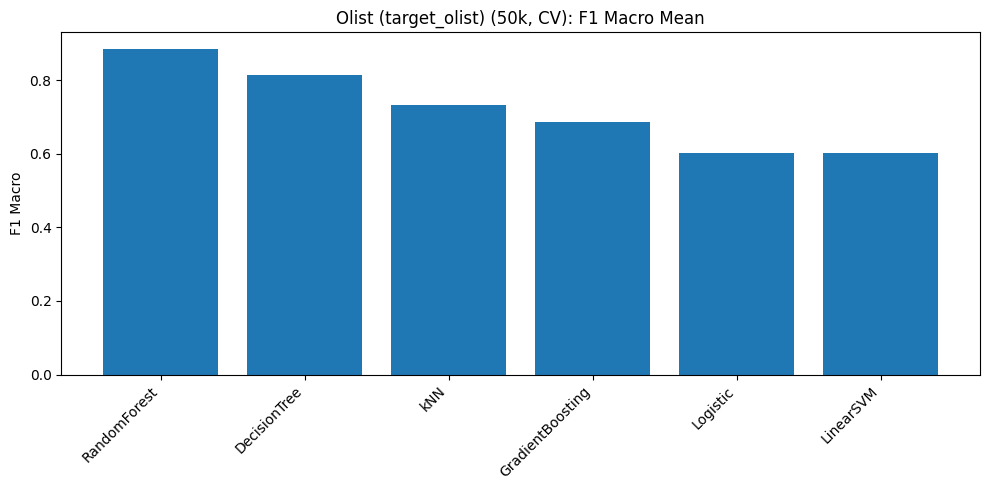

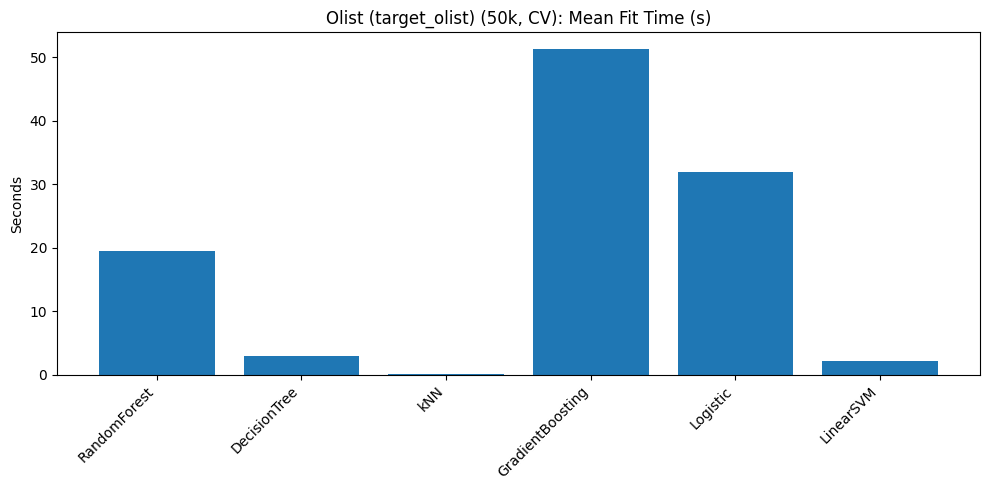

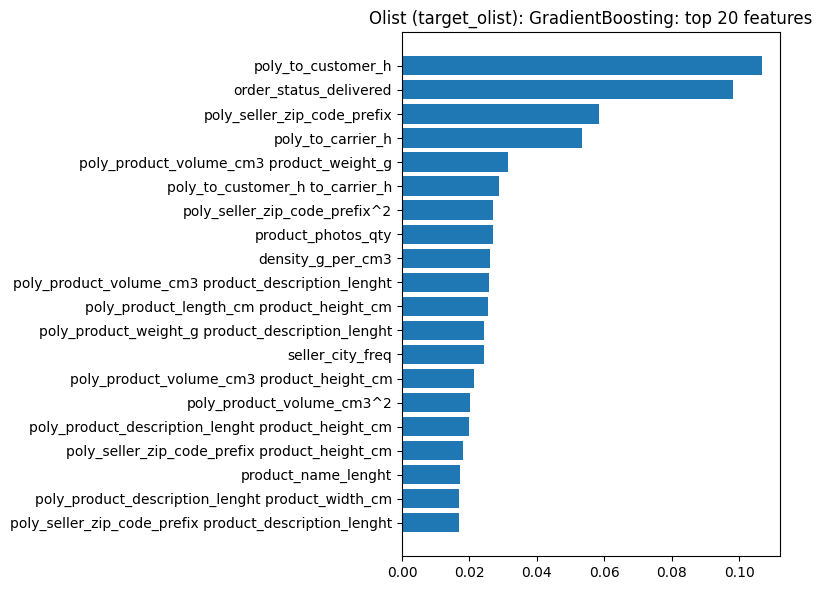

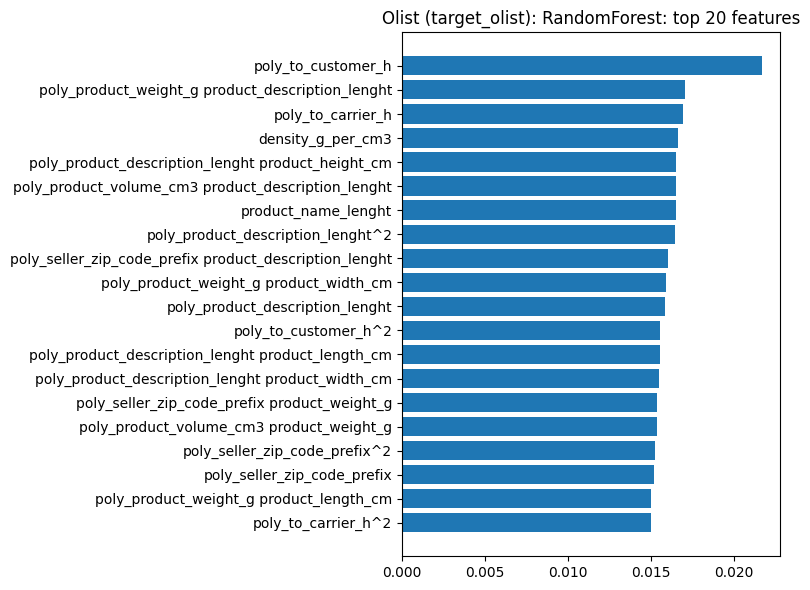

Olist (target_olist) elapsed: 116.73 s

VG2019 (target_sales): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.9803       0.0007        0.9804       0.9958           2.404             0.222             2.626              99.30
    DecisionTree        0.9679       0.0013        0.9681       0.9713           0.177             0.007             0.183               0.34
             kNN        0.8844       0.0019        0.8844       0.9549           0.040             1.931             1.971              16.48
GradientBoosting        0.8217       0.0014        0.8220       0.9019           4.335             0.020             4.355               0.14
        Logistic        0.7833       0.0025        0.7834       0.8523           6.883             0.013             6.896      

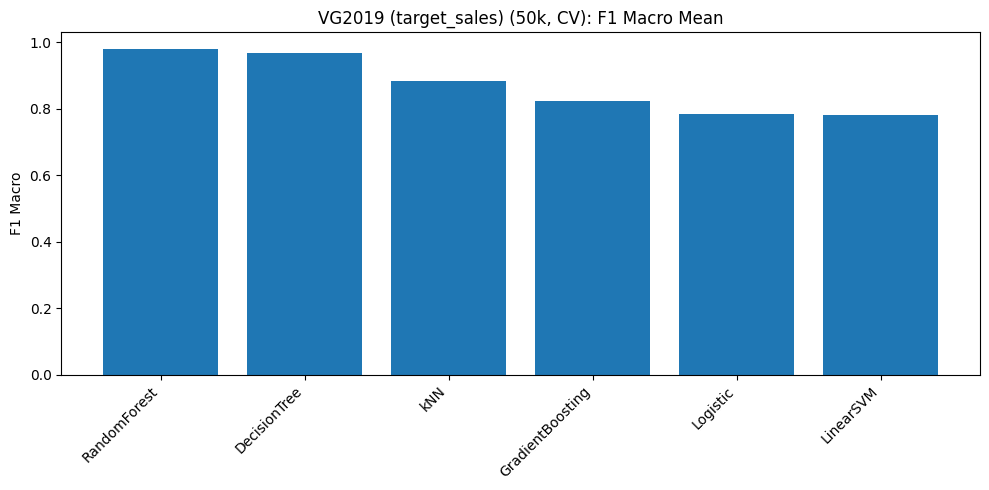

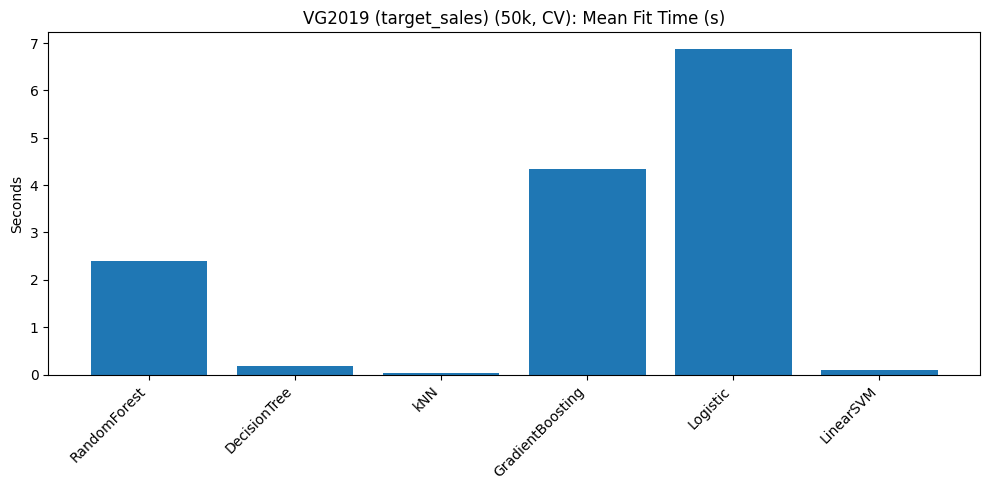

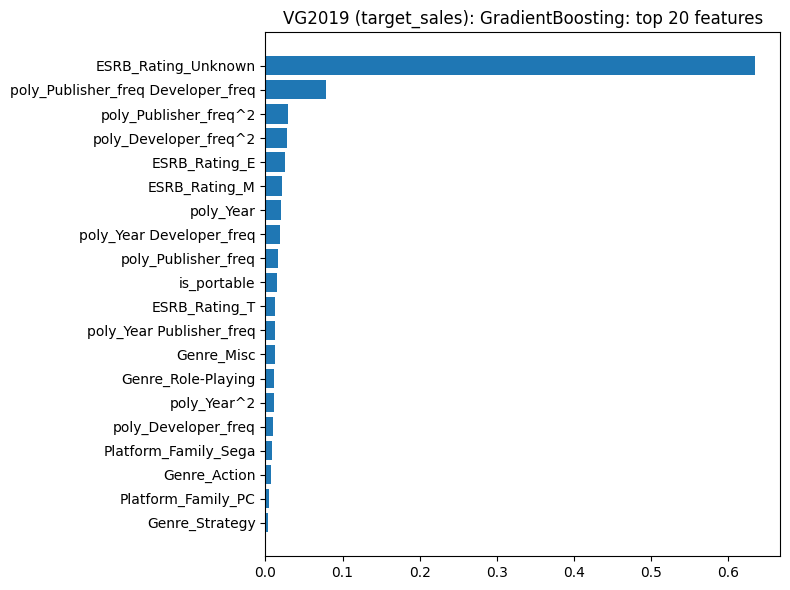

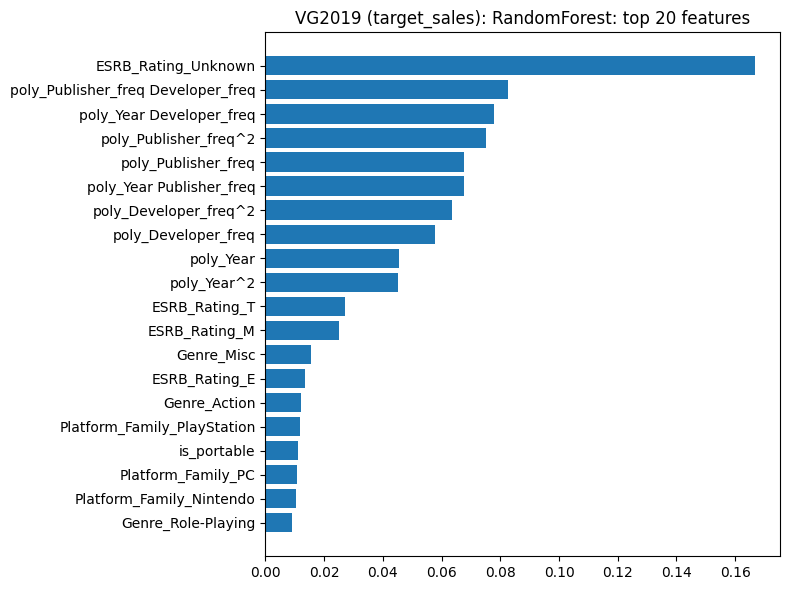

VG2019 (target_sales) elapsed: 21.93 s
prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train stats: {'n': 955509, 'mean': 86.35820698706135, 'std': 10.978047160242102, 'min': 0.0, 'max': 100.0}
steam y_test stats: {'n': 44492, 'mean': 81.25285444574305, 'std': 15.442551141752842, 'min': 0.0, 'max': 100.0}
target_olist train stats: {'n': 89954, 'mean': 4.058243751525879, 'std': 0.8512095808982849, 'min': 1.0, 'max': 5.0}
target_olist test stats: {'n': 22489, 'mean': 4.053517818450928, 'std': 0.8607538342475891, 'min': 1.0, 'max': 5.0}
target_sales train stats: {'n': 5228, 'mean': 7.202467441558838, 'std': 1.45883047580719, 'min': 1.0, 'max': 10.0}
target_sales test stats: {'n': 1308, 'mean': 7.258639812469482, 'std': 1.4334877729415894, 'min': 1.5, 'max': 10.0}
scaled columns: 12 with standard
polynomial features added: 90 (from 12 columns)

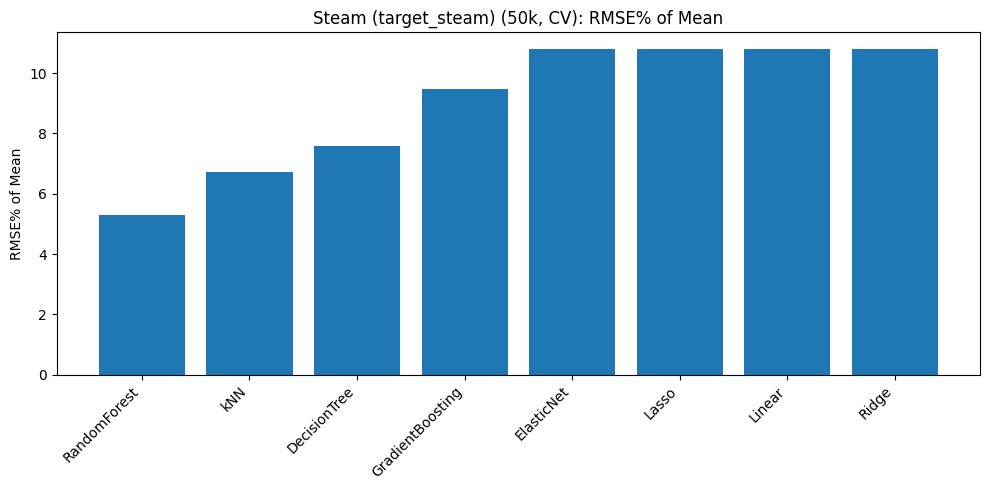

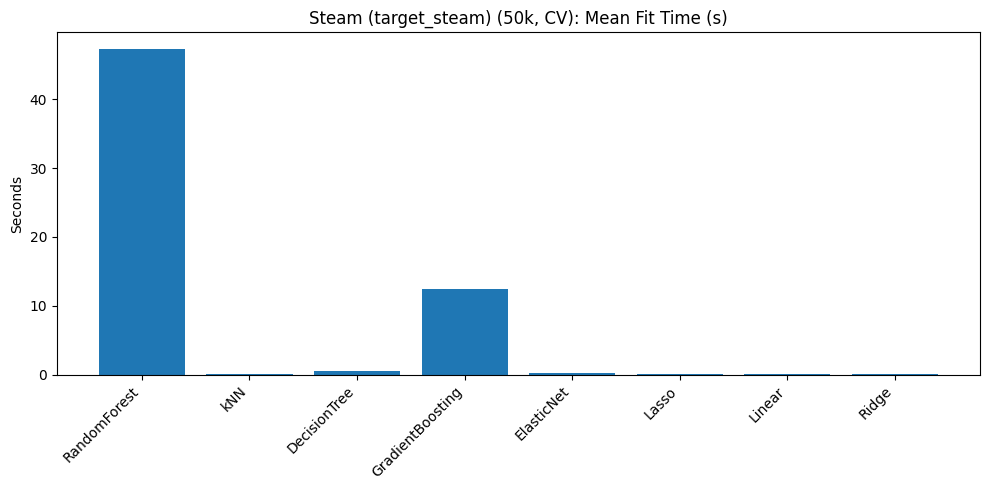

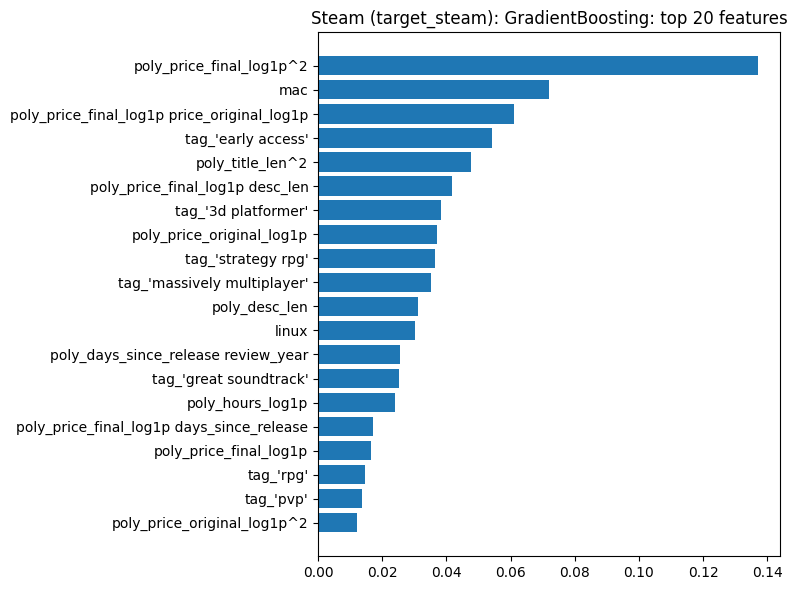

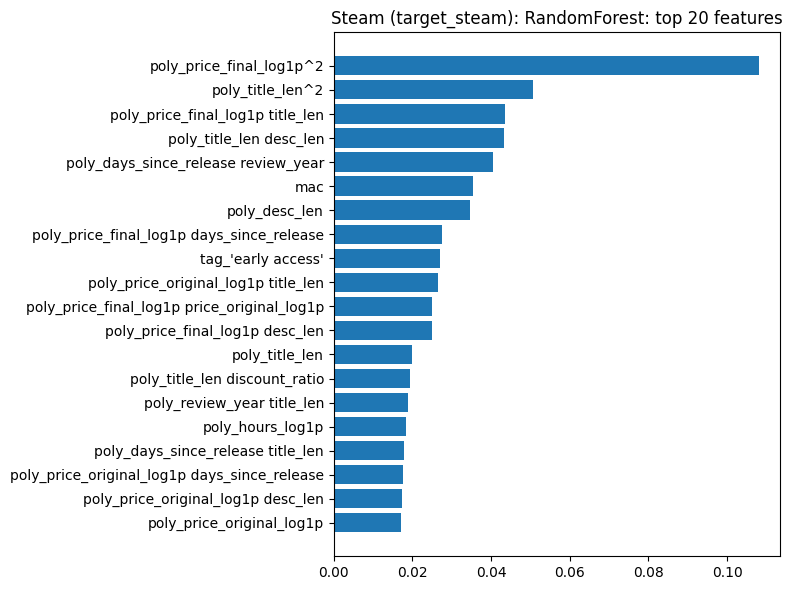

Steam (target_steam) elapsed: 70.50 s

Olist (target_olist): build 50k sample and run 5-fold regression CV

sample: picked 50000 rows (quantile-binned by target)
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.5032    0.7501  0.2277        12.40         18.49         371.484             0.151           371.635             652.64
GradientBoosting   0.5557    0.7886  0.1464        13.70         19.44          58.135             0.008            58.144               0.14
           Lasso   0.5680    0.8019  0.1173        14.00         19.76           0.154             0.015             0.169               0.01
      ElasticNet   0.5680    0.8020  0.1170        14.00         19.77           0.212             0.014             0.226               0.01
           Ridge   0.5680    0.8025  0.1160        14.00         19.78           0.073             0.014             0.087      

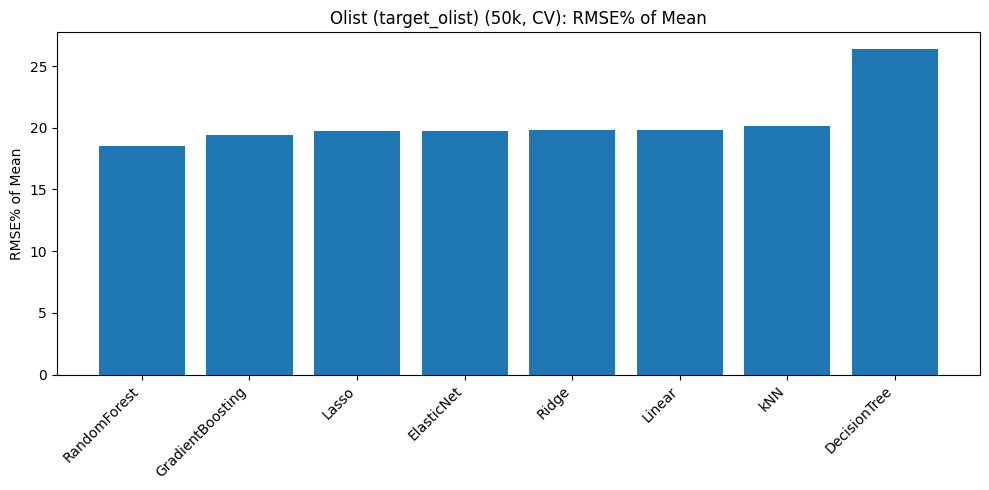

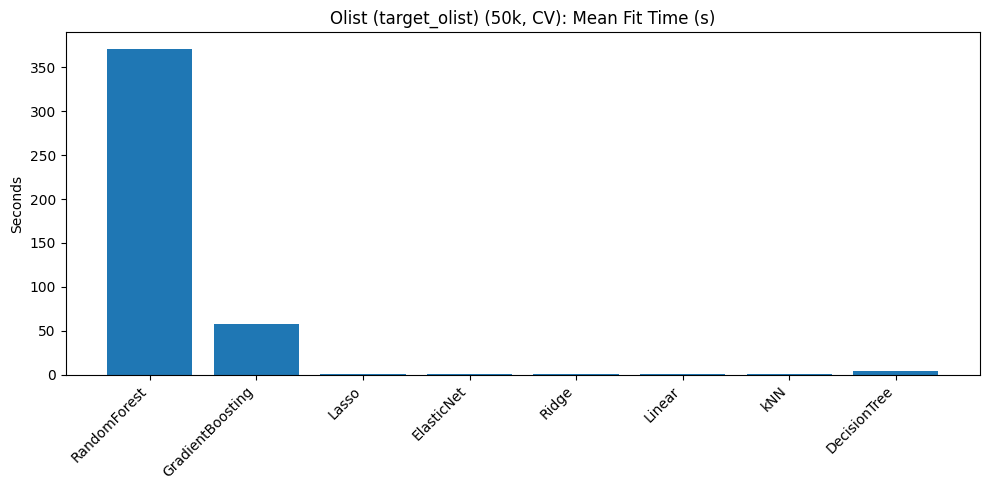

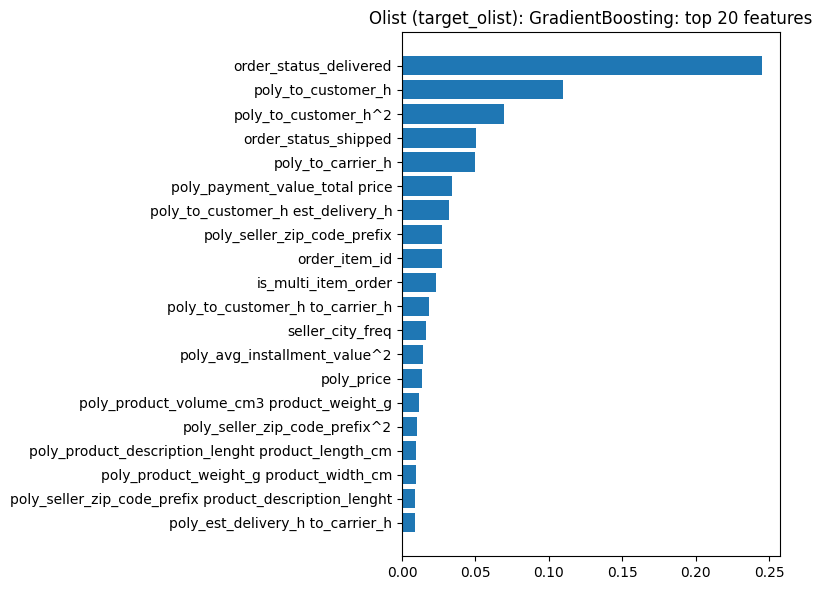

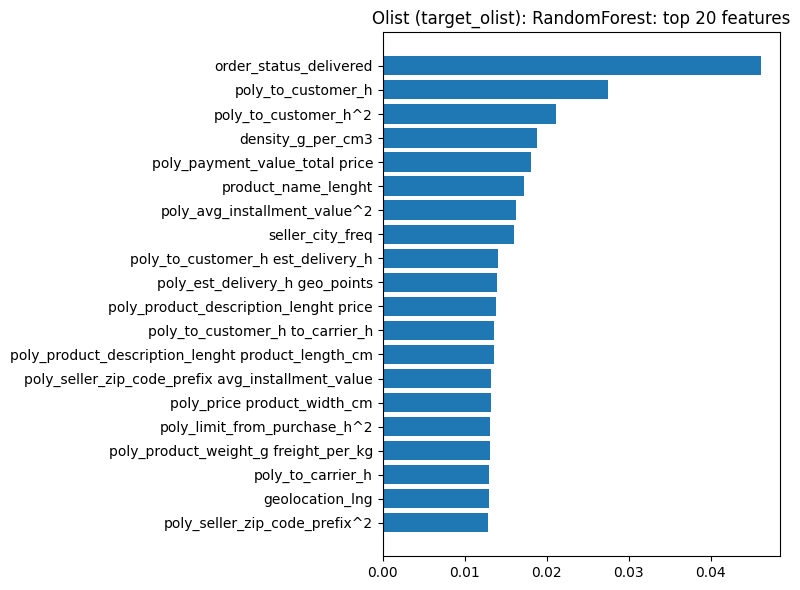

Olist (target_olist) elapsed: 446.08 s

VG2019 (target_sales): build 50k sample and run 5-fold regression CV

sample: using all 6536 rows
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.9358    1.2485  0.2615        12.97         17.31           2.452             0.045             2.497             120.43
GradientBoosting   1.0316    1.3221  0.1719        14.30         18.33           0.547             0.002             0.549               0.13
           Lasso   1.0806    1.3779  0.1004        14.98         19.10           0.021             0.002             0.023               0.00
      ElasticNet   1.0807    1.3780  0.1004        14.98         19.10           0.045             0.002             0.047               0.00
           Ridge   1.0808    1.3780  0.1003        14.98         19.10           0.006             0.002             0.007               0.00
          

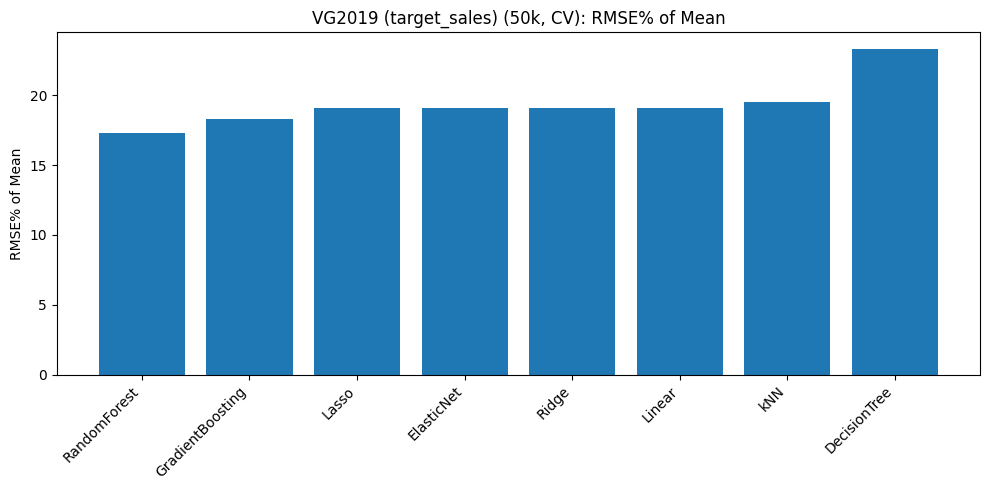

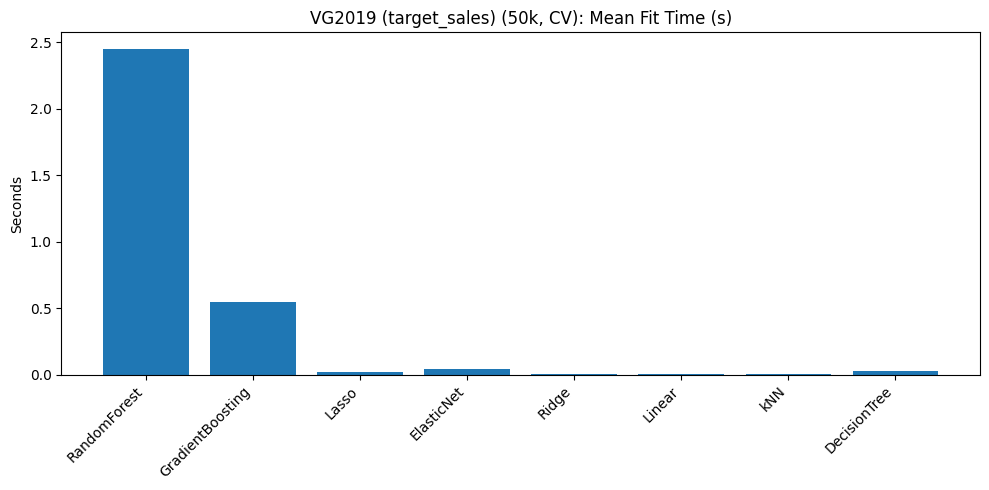

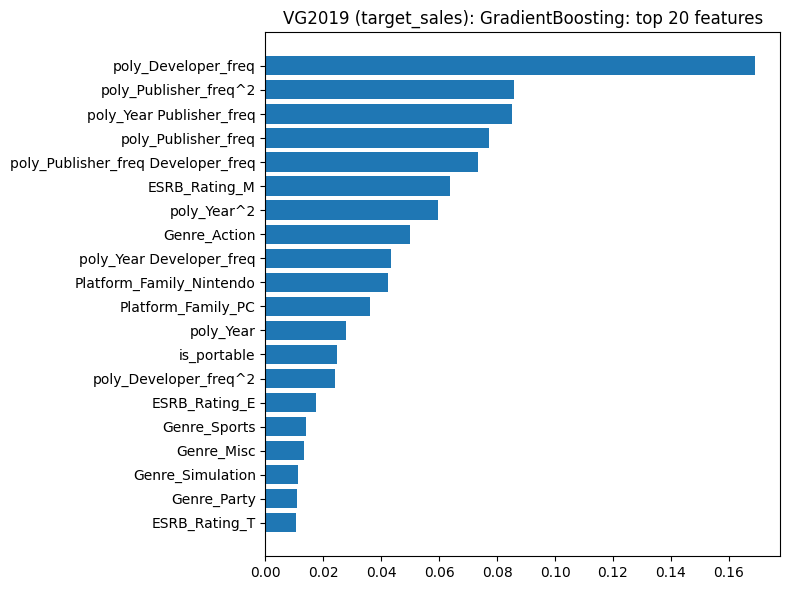

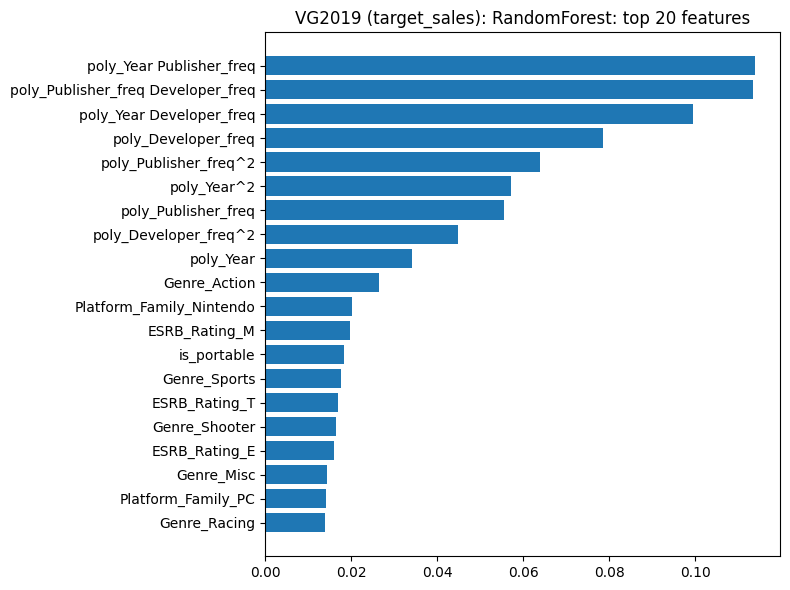

VG2019 (target_sales) elapsed: 5.00 s

SUMMARY TIME (seconds)

Classification total: 295.14
  Steam:  53.14
  Olist:  116.73
  VG2019: 21.93

Regression total:    2607.35
  Steam:  70.50
  Olist:  446.08
  VG2019: 5.00

ALL STEPS TOTAL:     20757.44 seconds

CSV outputs (created during runs):
 - steam_(target_steam)_cls_cv_50k_results.csv
 - olist_(target_olist)_cls_cv_50k_results.csv
 - vg2019_(target_sales)_cls_cv_50k_results.csv
 - steam_(target_steam)_reg_cv_50k_results.csv
 - olist_(target_olist)_reg_cv_50k_results.csv
 - vg2019_(target_sales)_reg_cv_50k_results.csv

FEATURE SELECTION K=90 RUN


RUNNING FULL PIPELINE WITH FEATURE SELECT K=90

prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train counts: {1: 781248, 0: 174261}
steam y_test counts: {1: 28773, 0: 15719}
steam balanced train counts: {1: 174261, 0: 174261}
target_olist tra

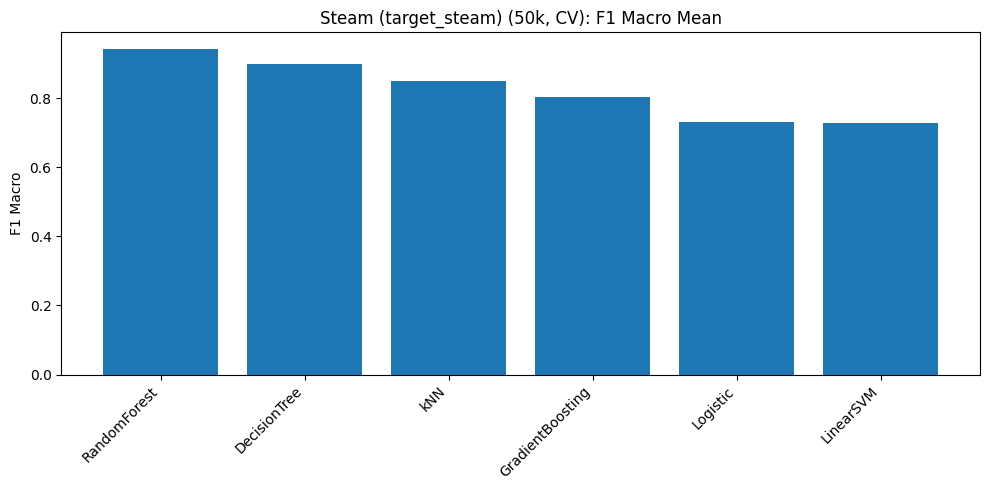

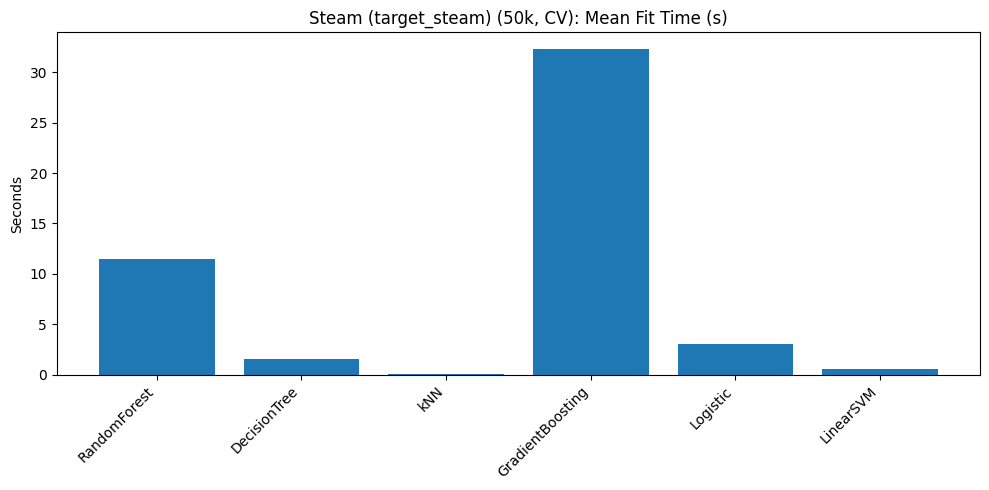

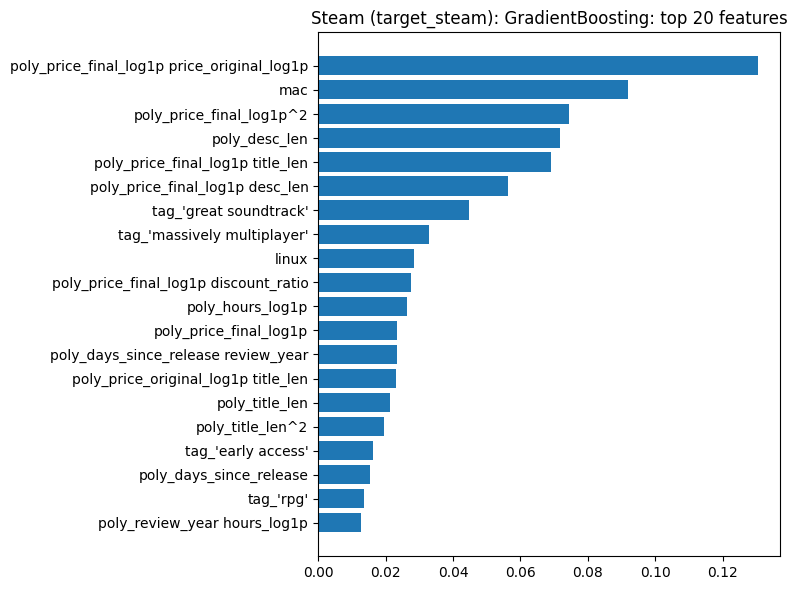

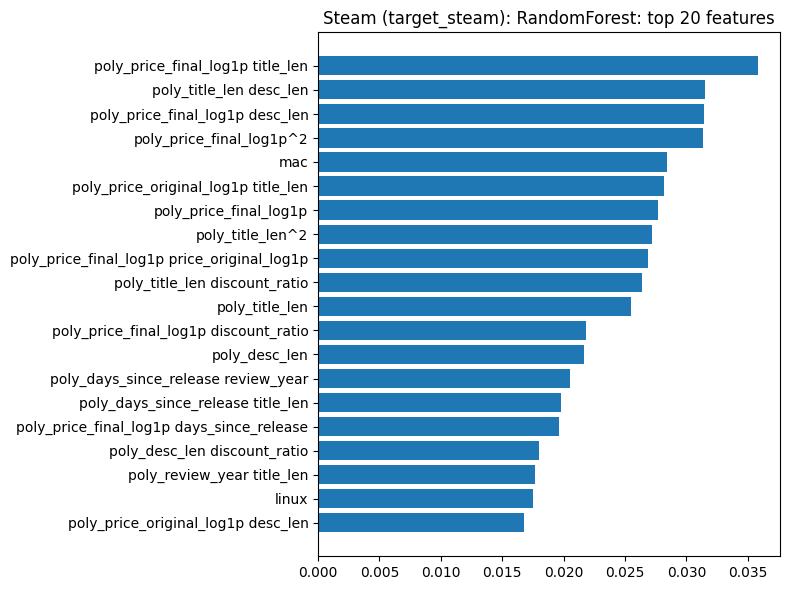

Steam (target_steam) elapsed: 59.16 s

Olist (target_olist): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)


/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.8778       0.0030        0.8786       0.9500          24.277             0.253            24.530             162.20
    DecisionTree        0.8070       0.0093        0.8071       0.8079           3.466             0.008             3.473               0.63
             kNN        0.7294       0.0070        0.7306       0.8129           0.029             2.166             2.195              27.78
GradientBoosting        0.6870       0.0045        0.6960       0.7645          60.993             0.022            61.015               0.14
        Logistic        0.6033       0.0029        0.6184       0.6604          35.384             0.007            35.391               0.01
       LinearSVM        0.6014       0.0020        0.6174       0.6599           2.435             0.009             2.444               0.01

Saved

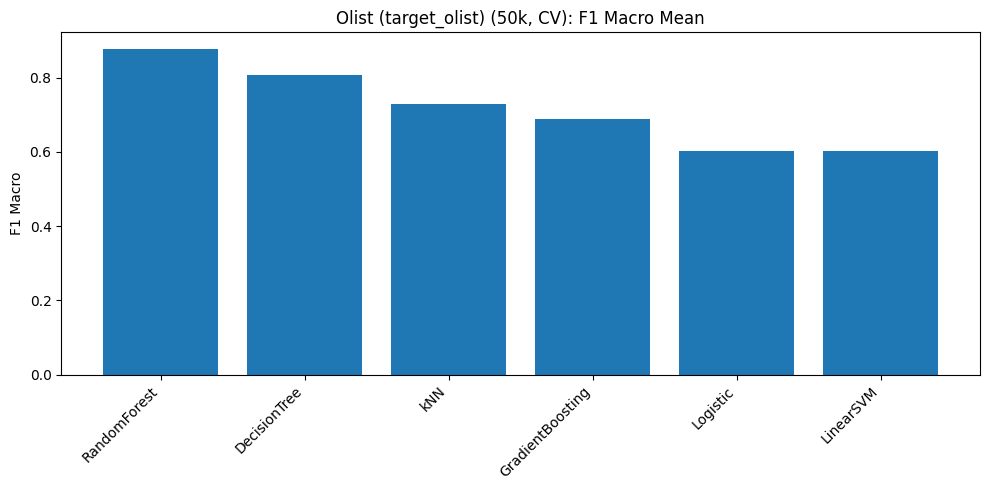

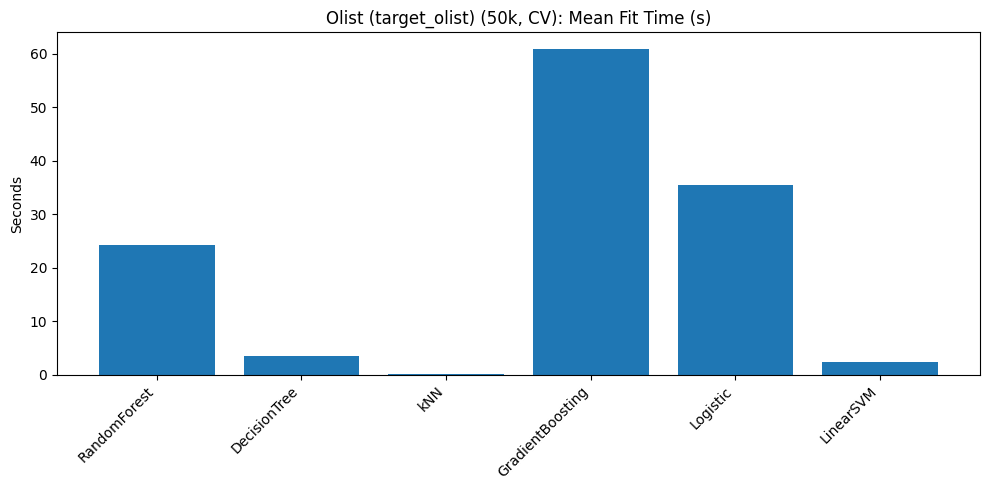

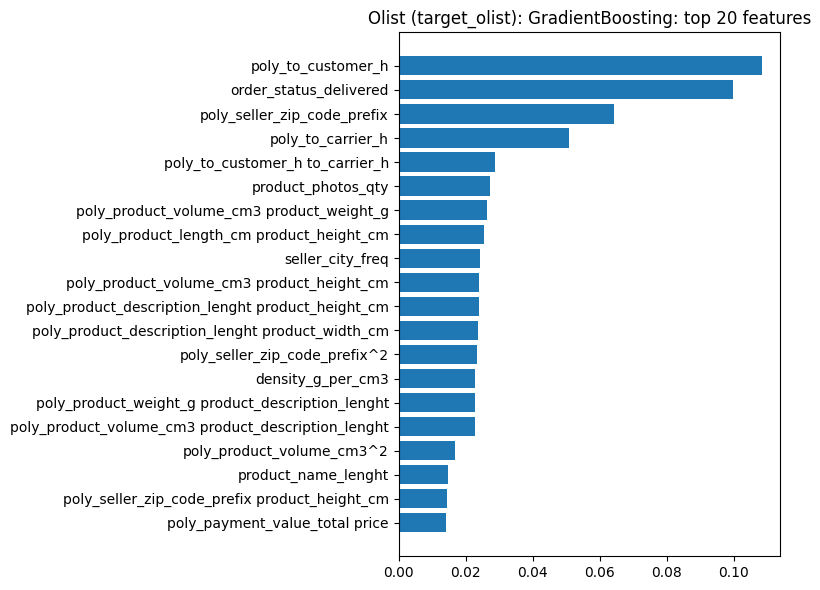

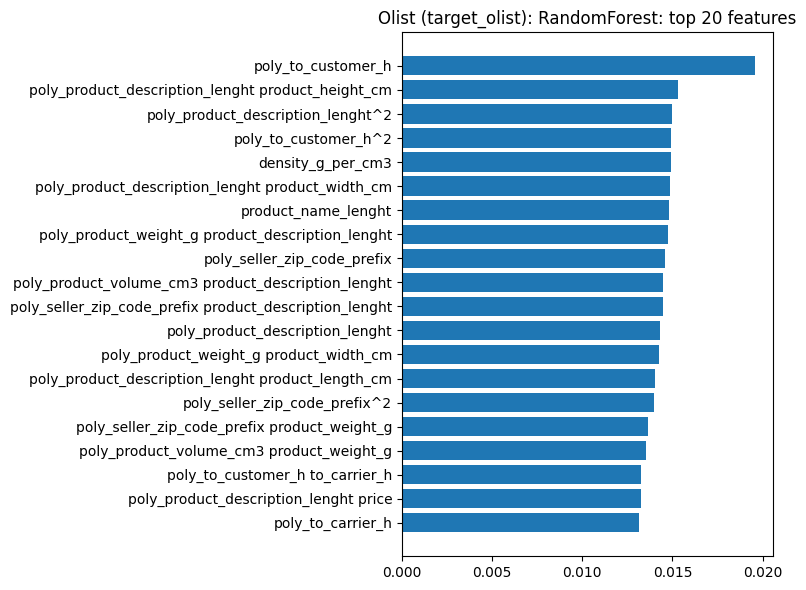

Olist (target_olist) elapsed: 136.12 s

VG2019 (target_sales): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.9803       0.0007        0.9804       0.9958           1.666             0.170             1.836              99.30
    DecisionTree        0.9679       0.0013        0.9681       0.9713           0.176             0.006             0.183               0.34
             kNN        0.8844       0.0019        0.8844       0.9549           0.036             1.956             1.992              16.48
GradientBoosting        0.8217       0.0014        0.8220       0.9019           4.353             0.020             4.373               0.14
        Logistic        0.7833       0.0025        0.7834       0.8523           6.900             0.013             6.913      

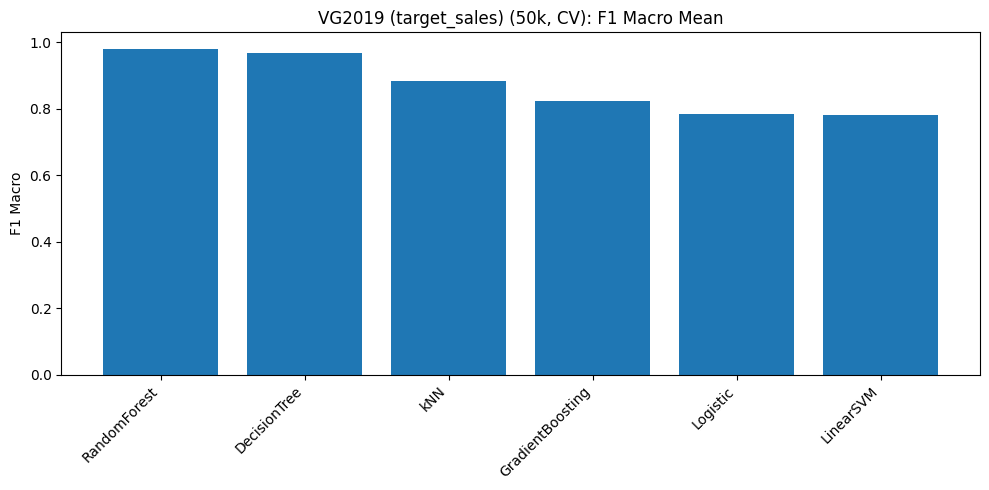

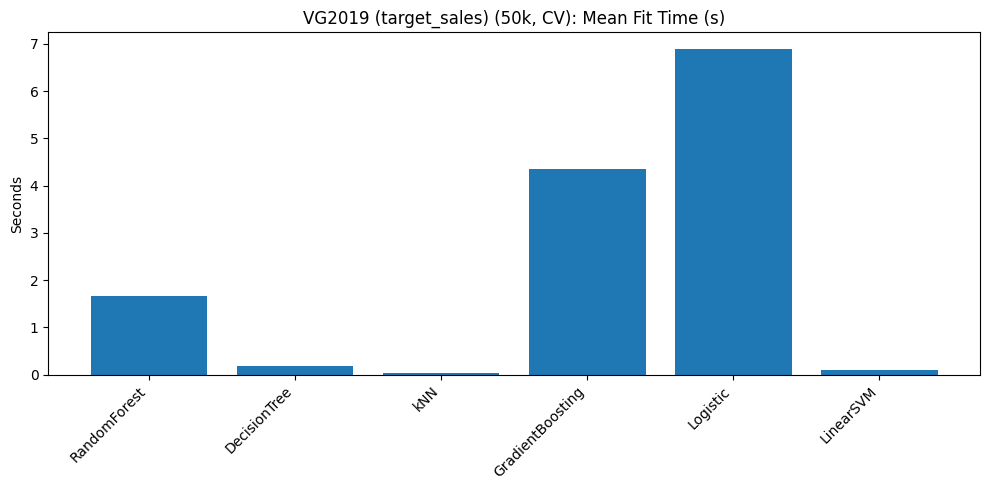

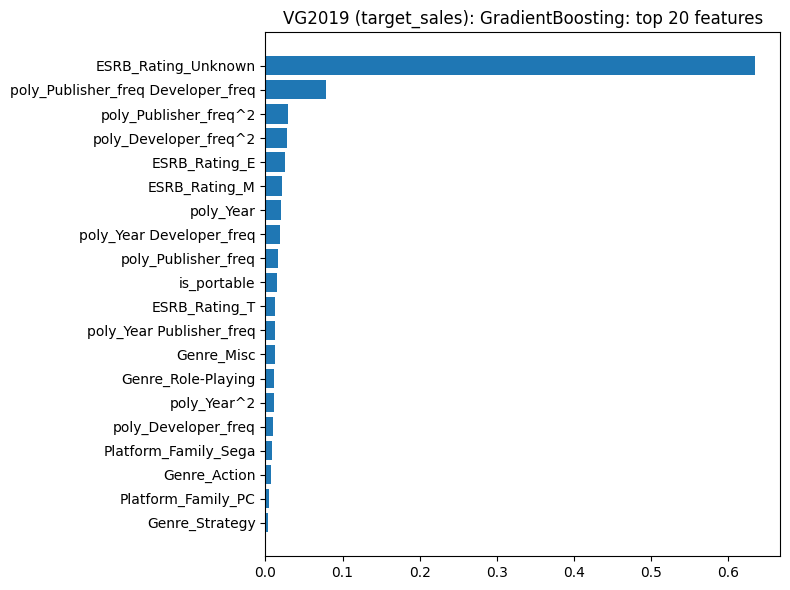

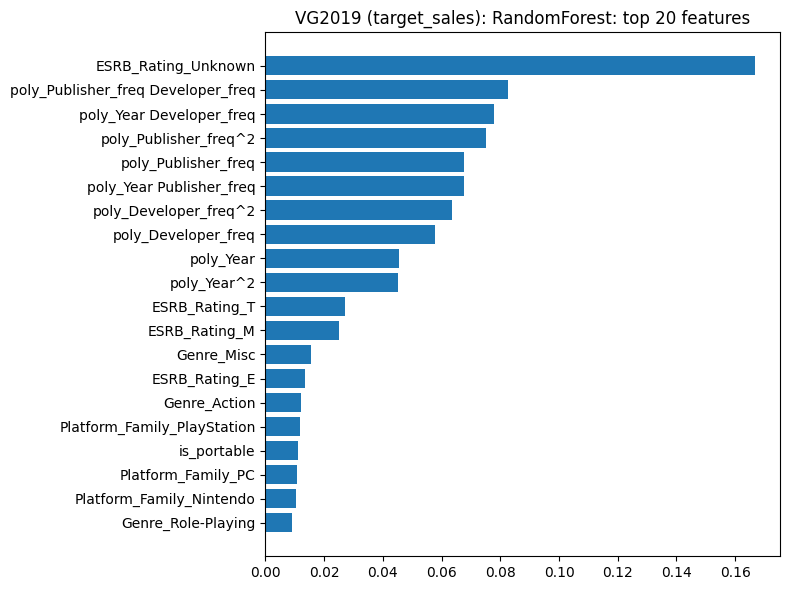

VG2019 (target_sales) elapsed: 21.29 s
prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train stats: {'n': 955509, 'mean': 86.35820698706135, 'std': 10.978047160242102, 'min': 0.0, 'max': 100.0}
steam y_test stats: {'n': 44492, 'mean': 81.25285444574305, 'std': 15.442551141752842, 'min': 0.0, 'max': 100.0}
target_olist train stats: {'n': 89954, 'mean': 4.058243751525879, 'std': 0.8512095808982849, 'min': 1.0, 'max': 5.0}
target_olist test stats: {'n': 22489, 'mean': 4.053517818450928, 'std': 0.8607538342475891, 'min': 1.0, 'max': 5.0}
target_sales train stats: {'n': 5228, 'mean': 7.202467441558838, 'std': 1.45883047580719, 'min': 1.0, 'max': 10.0}
target_sales test stats: {'n': 1308, 'mean': 7.258639812469482, 'std': 1.4334877729415894, 'min': 1.5, 'max': 10.0}
scaled columns: 12 with standard
polynomial features added: 90 (from 12 columns)

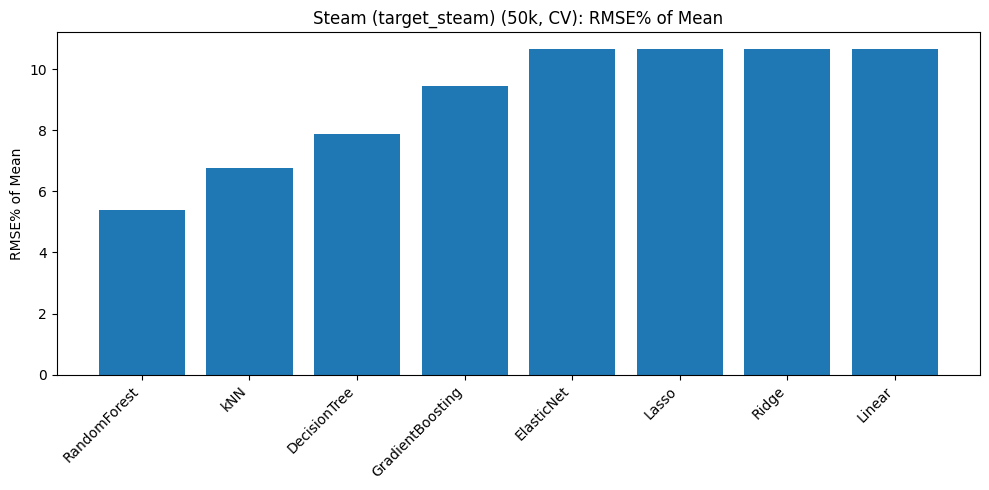

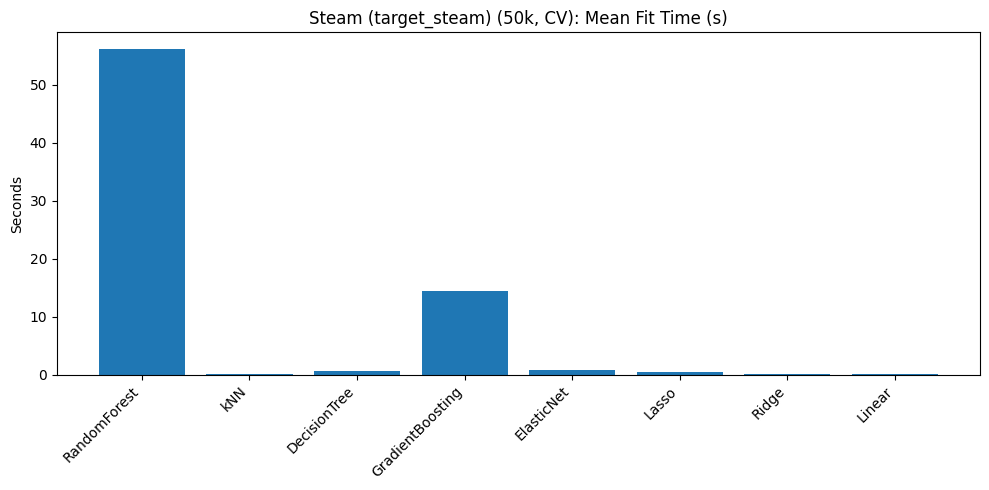

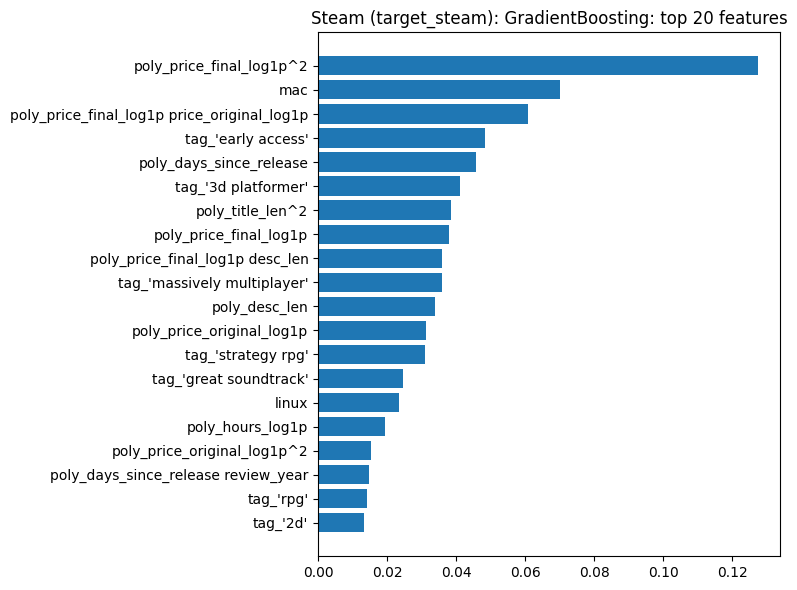

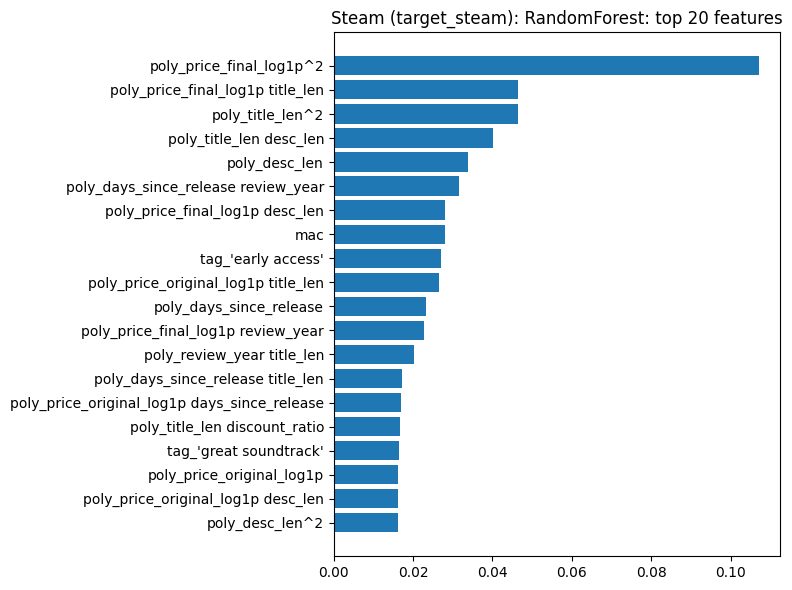

Steam (target_steam) elapsed: 82.73 s

Olist (target_olist): build 50k sample and run 5-fold regression CV

sample: picked 50000 rows (quantile-binned by target)
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.5067    0.7519  0.2238        12.49         18.53         417.401             0.154           417.555             656.63
GradientBoosting   0.5557    0.7887  0.1461        13.70         19.44          66.114             0.009            66.123               0.14
           Lasso   0.5679    0.8021  0.1168        14.00         19.77           0.165             0.019             0.184               0.01
      ElasticNet   0.5679    0.8022  0.1167        14.00         19.77           0.252             0.016             0.269               0.01
           Ridge   0.5680    0.8026  0.1158        14.00         19.78           0.087             0.018             0.105      

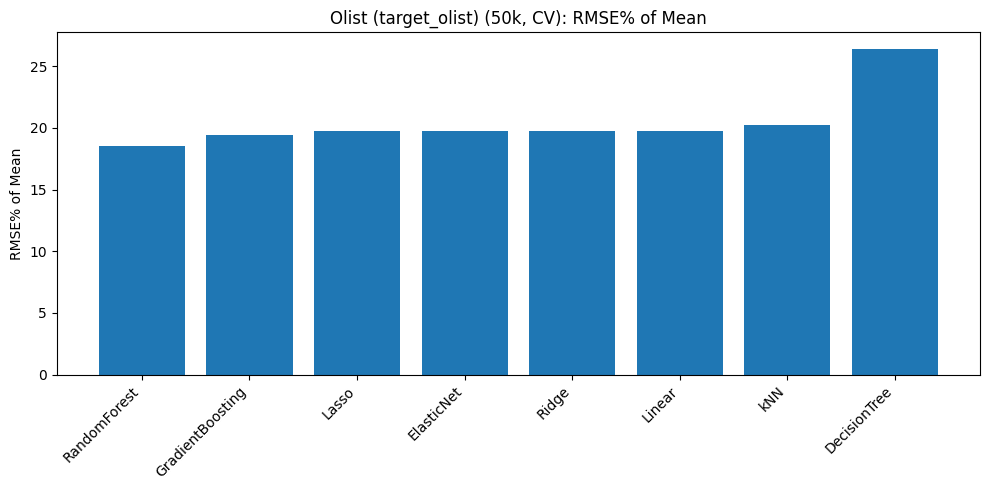

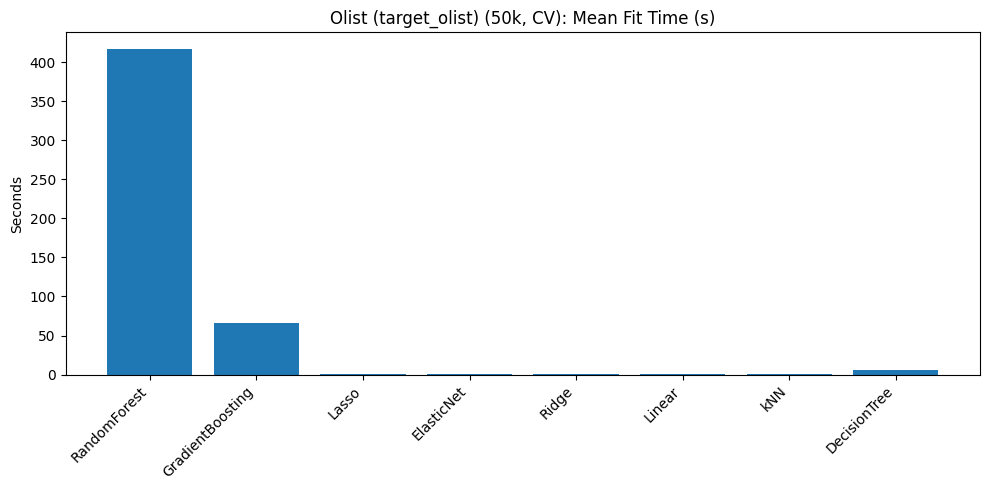

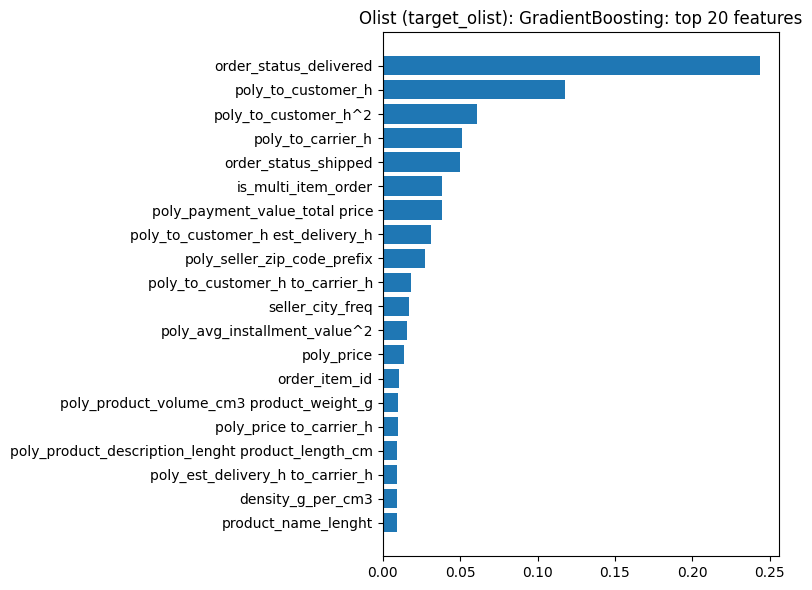

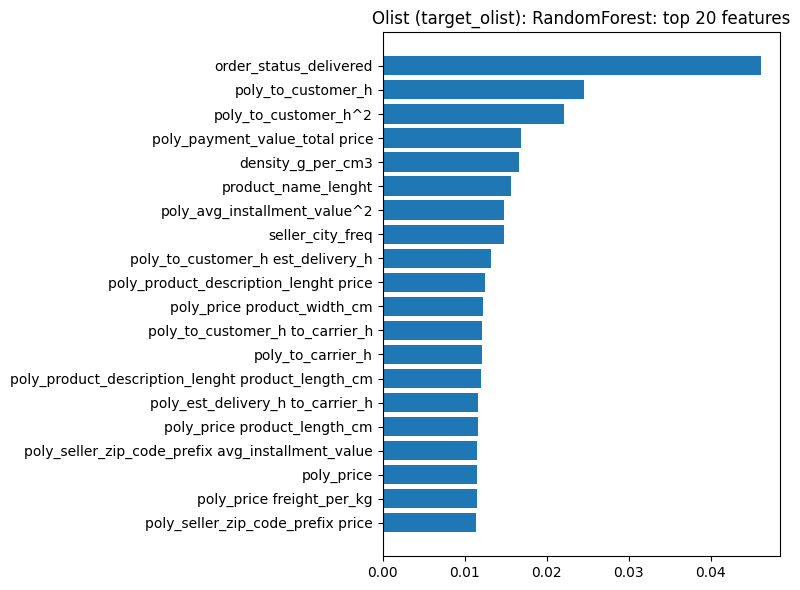

Olist (target_olist) elapsed: 501.04 s

VG2019 (target_sales): build 50k sample and run 5-fold regression CV

sample: using all 6536 rows
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.9358    1.2485  0.2615        12.97         17.31           2.397             0.045             2.441             120.43
GradientBoosting   1.0316    1.3221  0.1719        14.30         18.33           0.546             0.002             0.548               0.13
           Lasso   1.0806    1.3779  0.1004        14.98         19.10           0.020             0.002             0.022               0.00
      ElasticNet   1.0807    1.3780  0.1004        14.98         19.10           0.037             0.002             0.038               0.00
           Ridge   1.0808    1.3780  0.1003        14.98         19.10           0.006             0.002             0.007               0.00
          

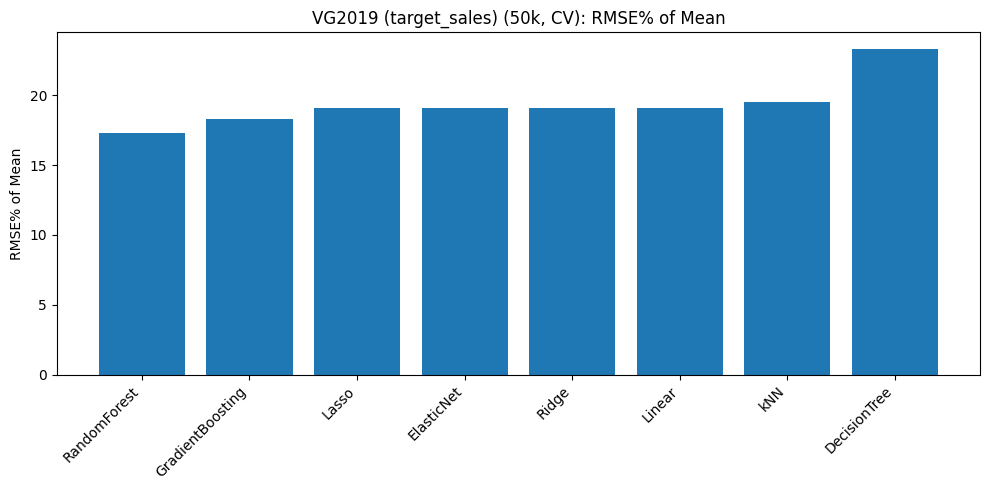

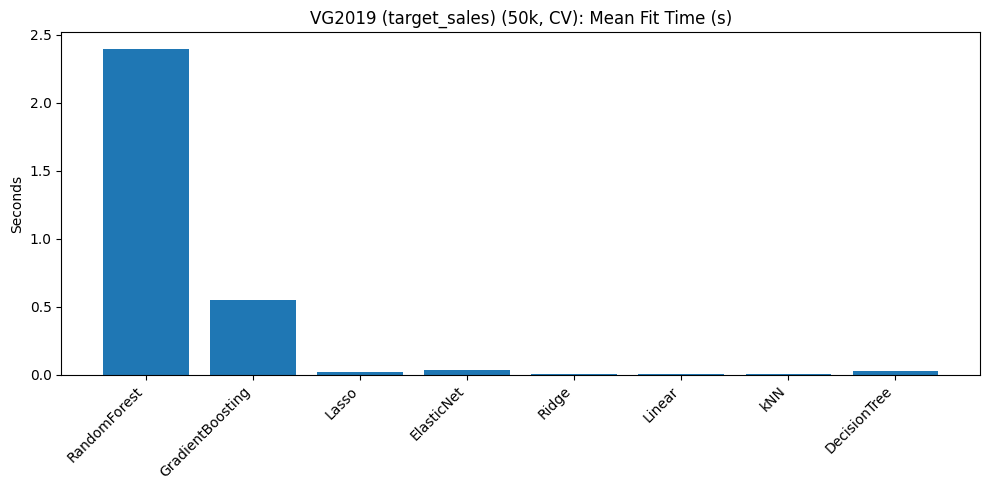

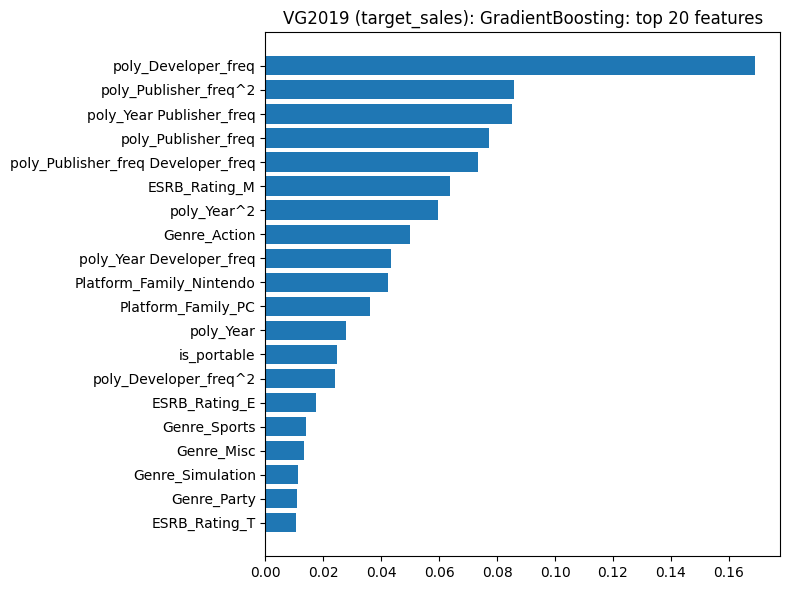

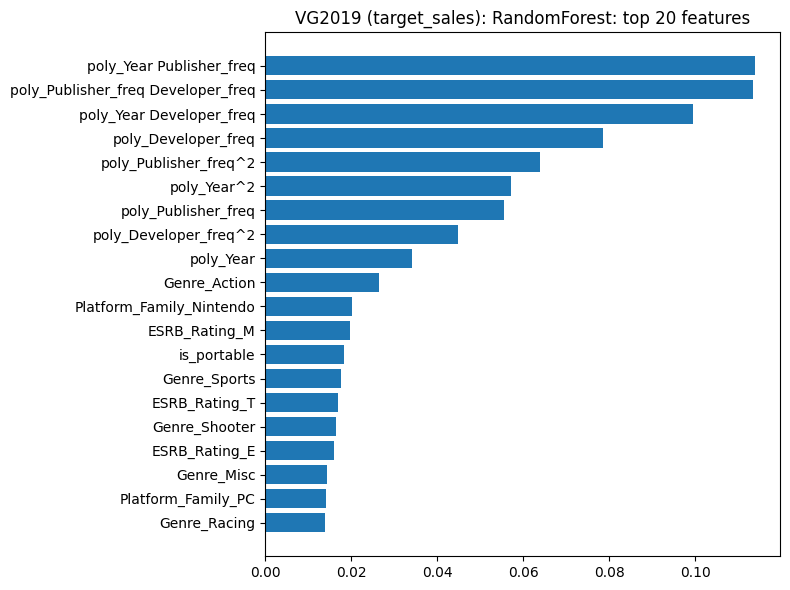

VG2019 (target_sales) elapsed: 6.26 s

SUMMARY TIME (seconds)

Classification total: 319.87
  Steam:  59.16
  Olist:  136.12
  VG2019: 21.29

Regression total:    2669.78
  Steam:  82.73
  Olist:  501.04
  VG2019: 6.26

ALL STEPS TOTAL:     23747.09 seconds

CSV outputs (created during runs):
 - steam_(target_steam)_cls_cv_50k_results.csv
 - olist_(target_olist)_cls_cv_50k_results.csv
 - vg2019_(target_sales)_cls_cv_50k_results.csv
 - steam_(target_steam)_reg_cv_50k_results.csv
 - olist_(target_olist)_reg_cv_50k_results.csv
 - vg2019_(target_sales)_reg_cv_50k_results.csv

FEATURE SELECTION K=100 RUN


RUNNING FULL PIPELINE WITH FEATURE SELECT K=100

prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train counts: {1: 781248, 0: 174261}
steam y_test counts: {1: 28773, 0: 15719}
steam balanced train counts: {1: 174261, 0: 174261}
target_olist t

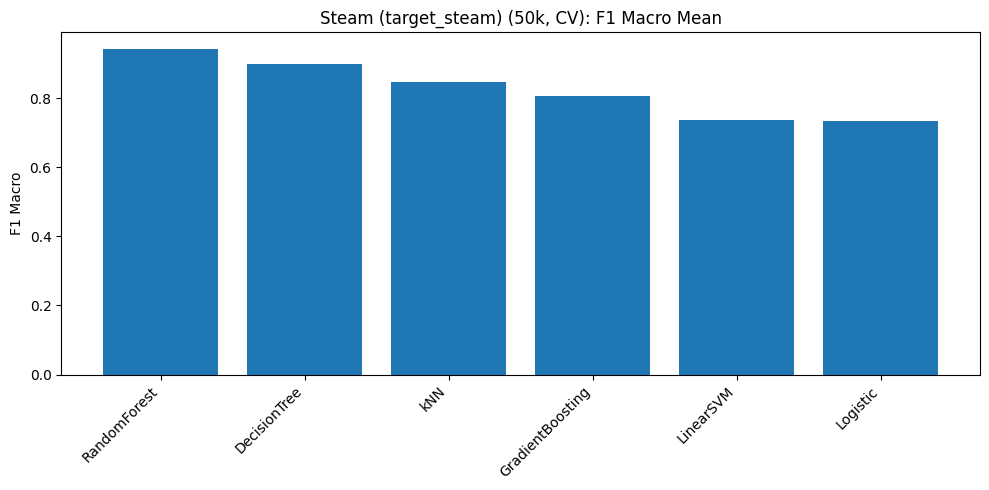

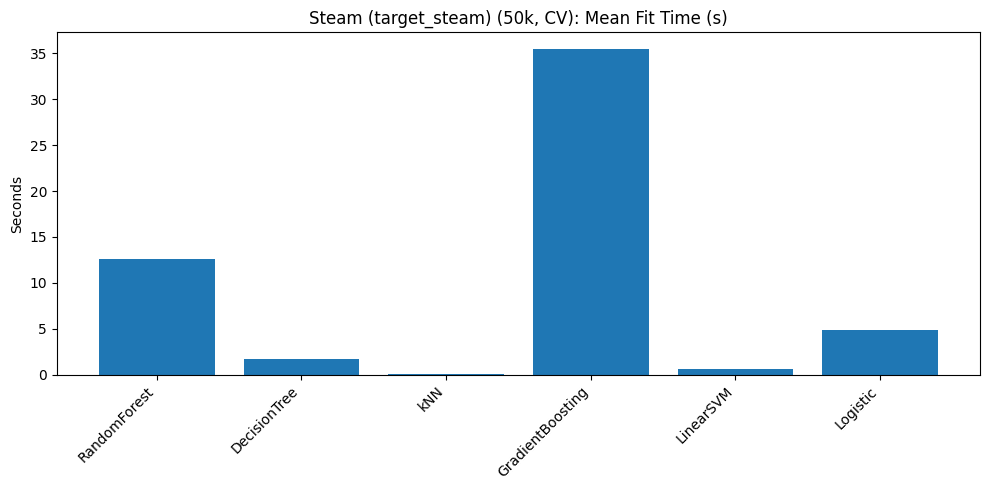

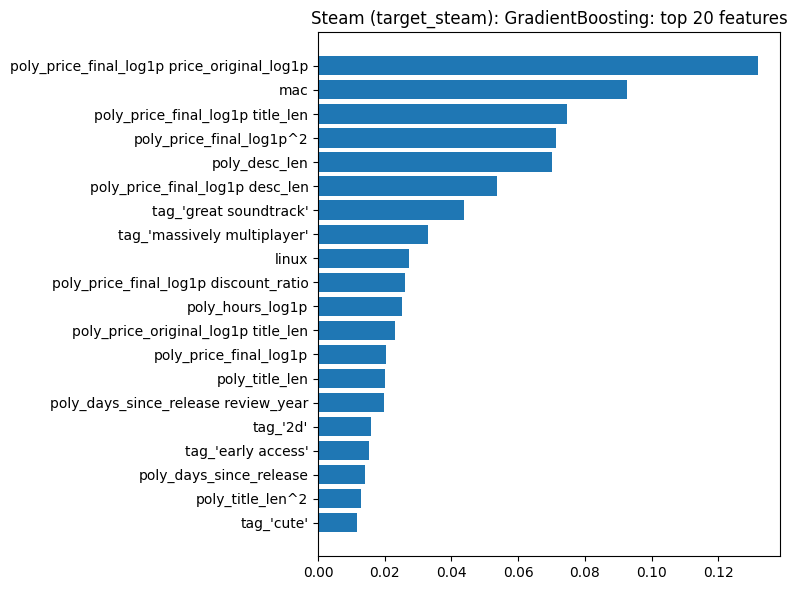

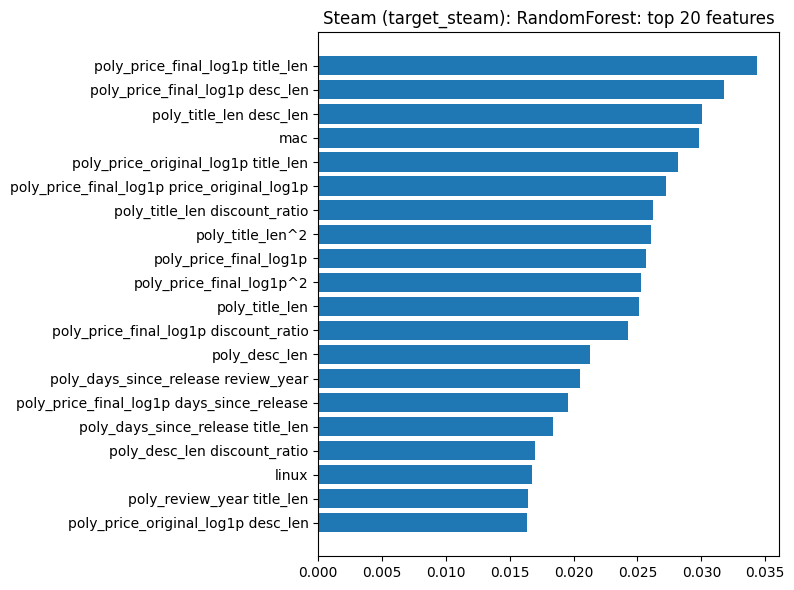

Steam (target_steam) elapsed: 63.18 s

Olist (target_olist): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)


/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chandlercampbell/.venvs/default/lib/python3.13/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.8728       0.0030        0.8737       0.9464          26.842             0.218            27.061             160.80
    DecisionTree        0.8031       0.0086        0.8032       0.8040           4.000             0.008             4.008               0.63
             kNN        0.7211       0.0046        0.7224       0.8038           0.033             2.232             2.266              30.83
GradientBoosting        0.6856       0.0059        0.6950       0.7636          70.048             0.023            70.071               0.15
        Logistic        0.6093       0.0035        0.6237       0.6694          38.465             0.008            38.473               0.01
       LinearSVM        0.6083       0.0037        0.6238       0.6687           5.257             0.009             5.266               0.01

Saved

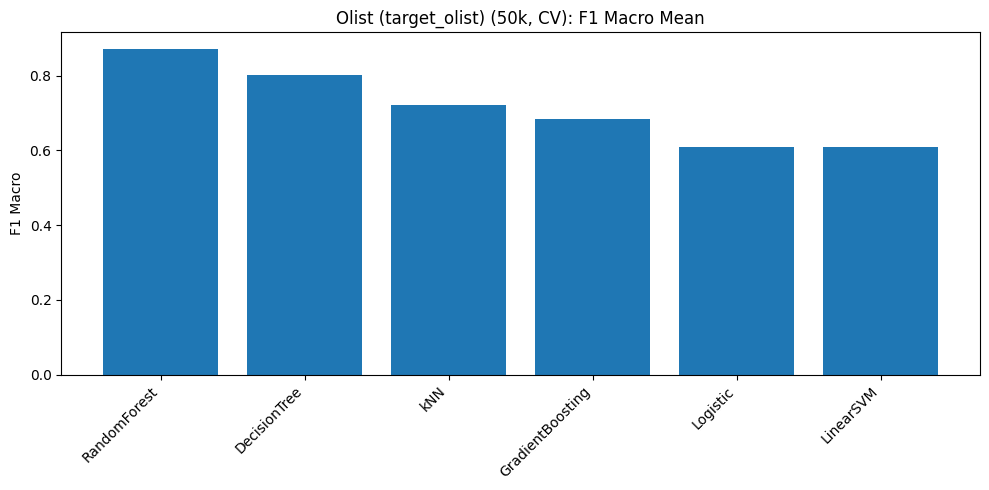

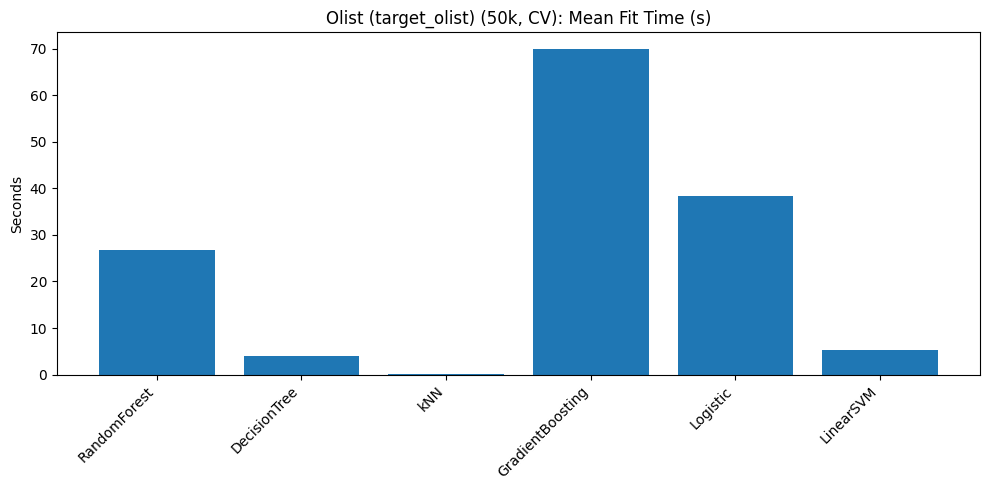

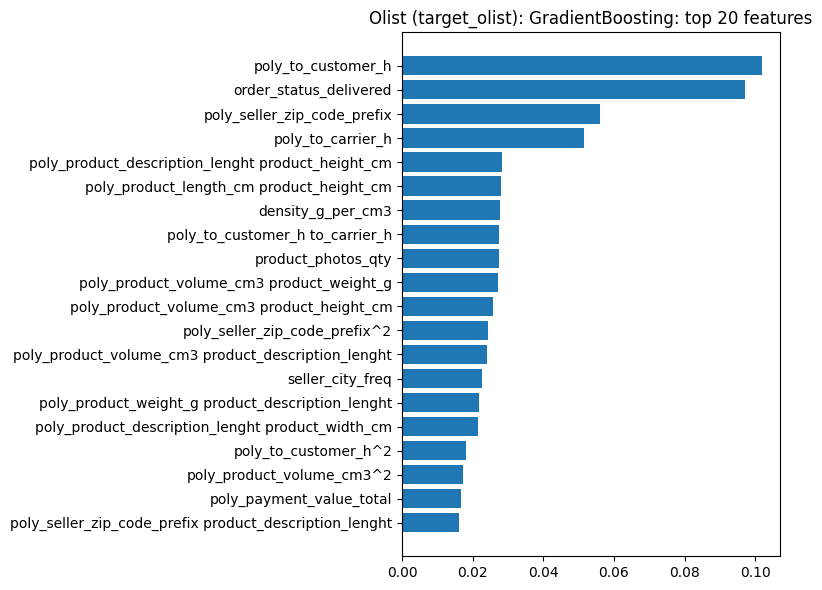

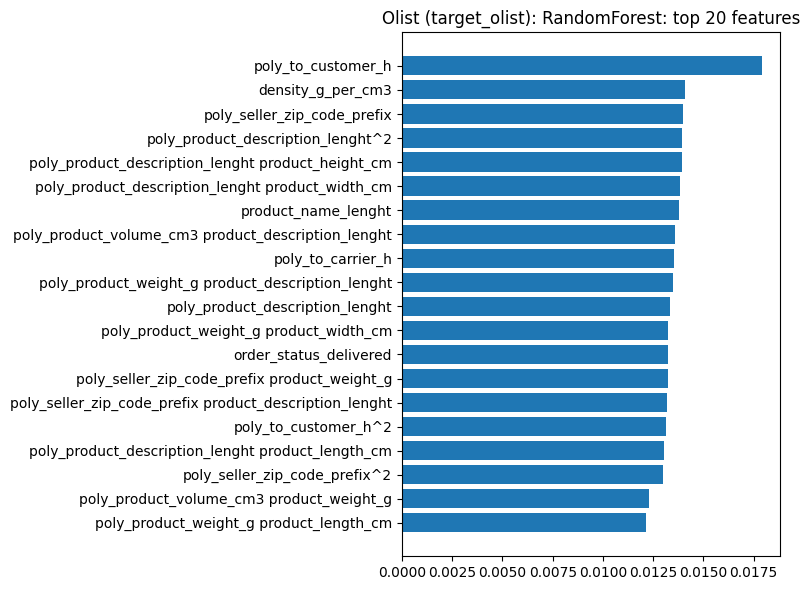

Olist (target_olist) elapsed: 157.92 s

VG2019 (target_sales): build 50k sample and run 5-fold classification CV

sample: picked 50000 rows (stratified by label)
           Model F1_macro_mean F1_macro_std Accuracy_mean ROC_AUC_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest        0.9803       0.0007        0.9804       0.9958           1.880             0.190             2.069              99.30
    DecisionTree        0.9679       0.0013        0.9681       0.9713           0.175             0.006             0.181               0.34
             kNN        0.8844       0.0019        0.8844       0.9549           0.036             1.953             1.989              16.48
GradientBoosting        0.8217       0.0014        0.8220       0.9019           4.361             0.020             4.381               0.14
        Logistic        0.7833       0.0025        0.7834       0.8523           6.888             0.013             6.901      

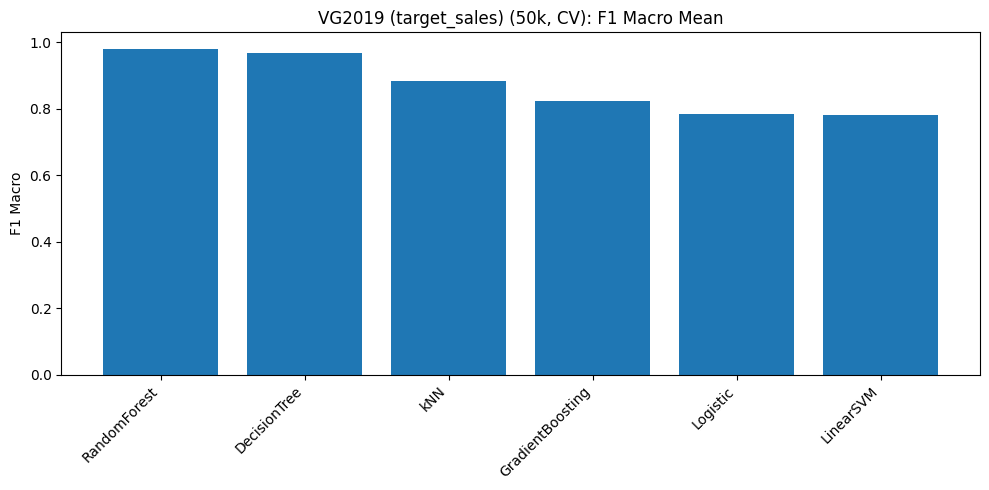

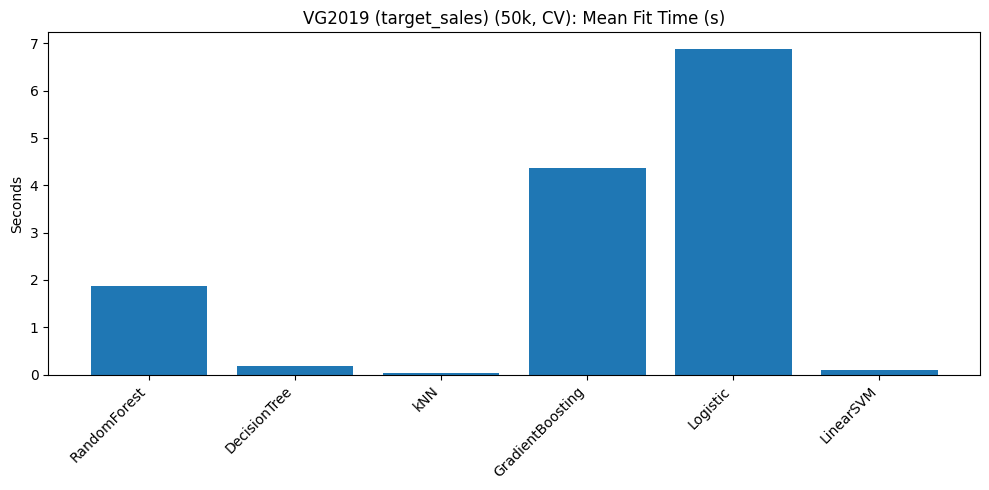

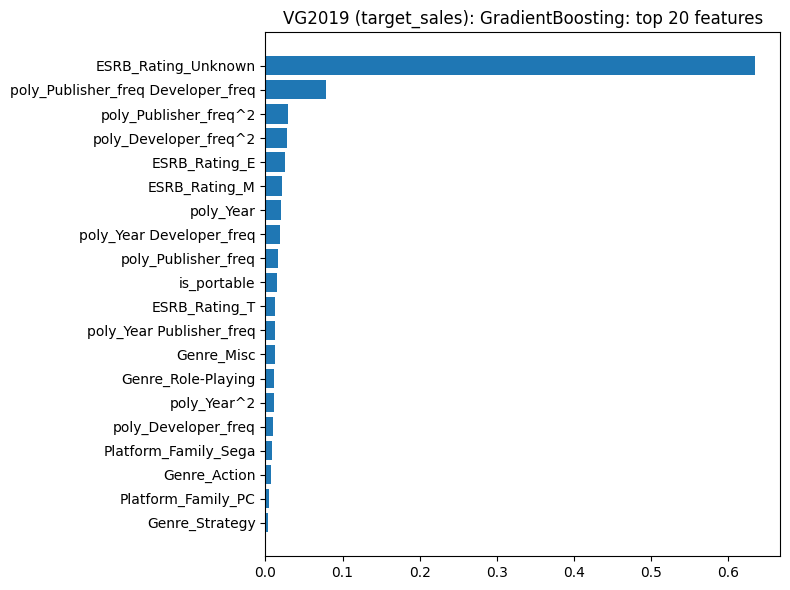

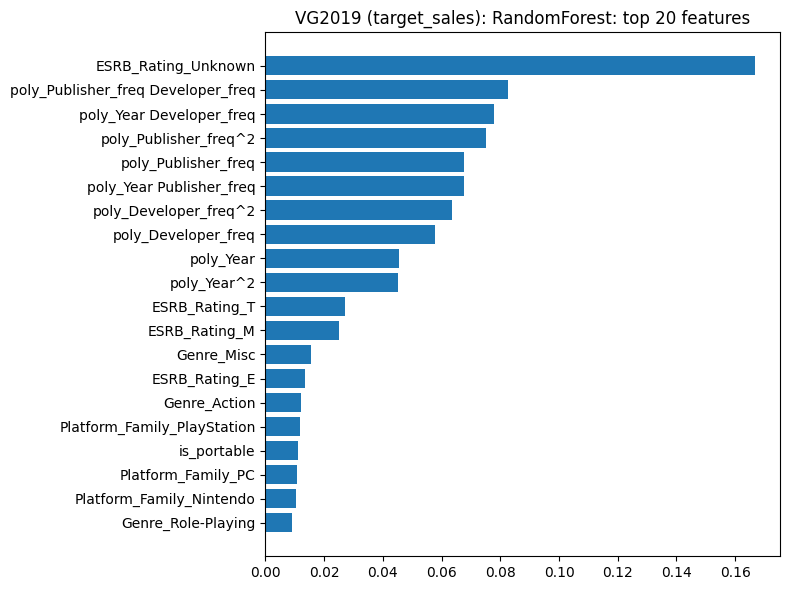

VG2019 (target_sales) elapsed: 21.63 s
prep: steam
prep: steam build sparse tag matrix
prep: olist
prep: sales
steam cutoff_date: 2022-02-17 00:00:00
steam apps in test: 3212 of 22777
steam train rows: 955509 | test rows: 44492
steam y_train stats: {'n': 955509, 'mean': 86.35820698706135, 'std': 10.978047160242102, 'min': 0.0, 'max': 100.0}
steam y_test stats: {'n': 44492, 'mean': 81.25285444574305, 'std': 15.442551141752842, 'min': 0.0, 'max': 100.0}
target_olist train stats: {'n': 89954, 'mean': 4.058243751525879, 'std': 0.8512095808982849, 'min': 1.0, 'max': 5.0}
target_olist test stats: {'n': 22489, 'mean': 4.053517818450928, 'std': 0.8607538342475891, 'min': 1.0, 'max': 5.0}
target_sales train stats: {'n': 5228, 'mean': 7.202467441558838, 'std': 1.45883047580719, 'min': 1.0, 'max': 10.0}
target_sales test stats: {'n': 1308, 'mean': 7.258639812469482, 'std': 1.4334877729415894, 'min': 1.5, 'max': 10.0}
scaled columns: 12 with standard
polynomial features added: 90 (from 12 columns)

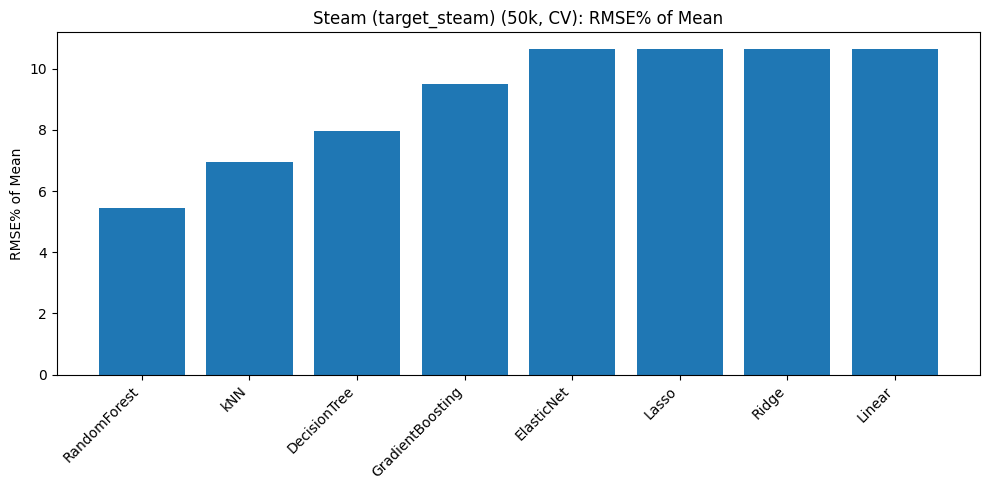

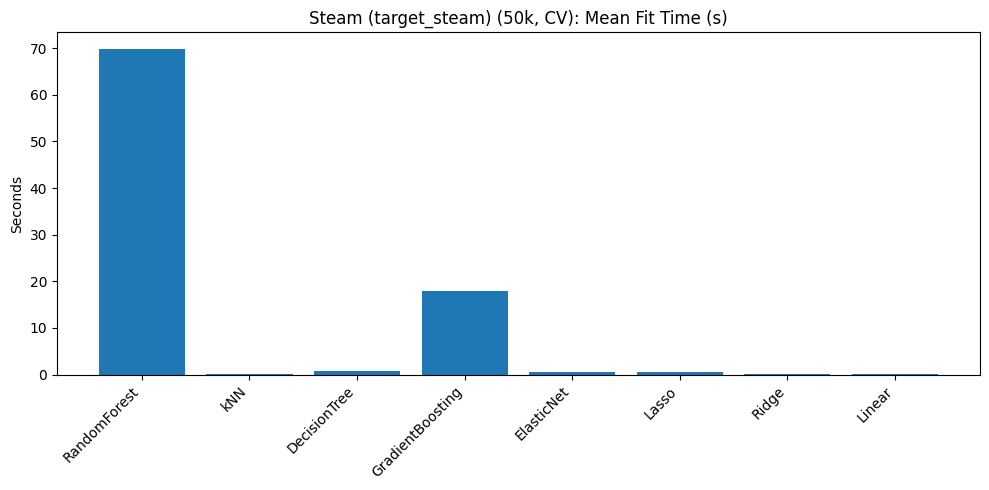

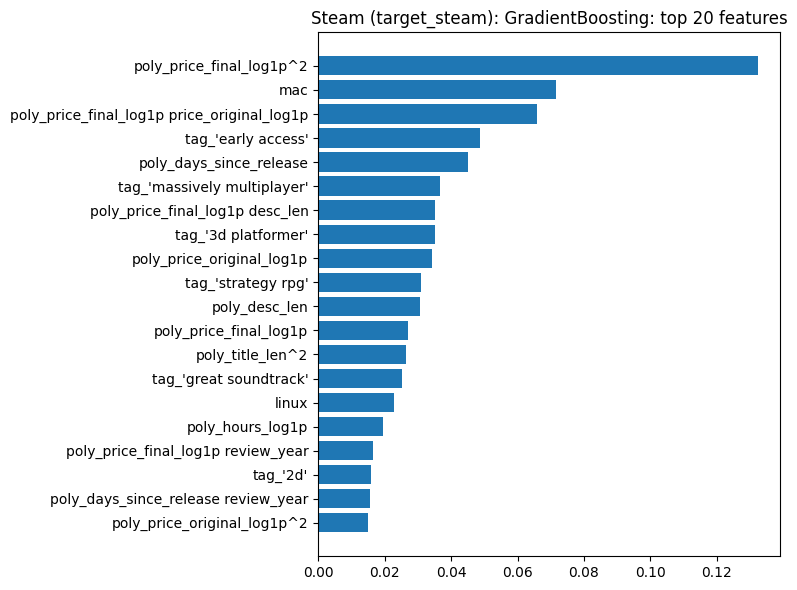

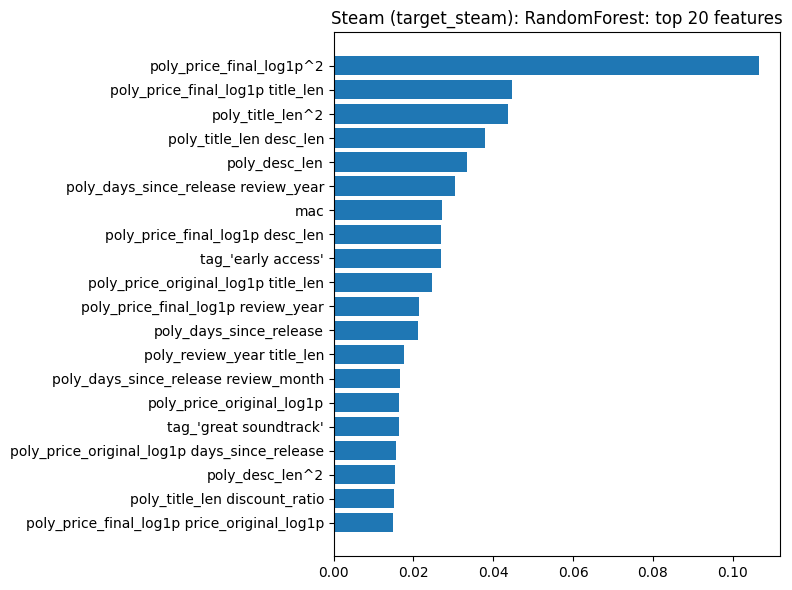

Steam (target_steam) elapsed: 100.84 s

Olist (target_olist): build 50k sample and run 5-fold regression CV

sample: picked 50000 rows (quantile-binned by target)
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.5098    0.7539  0.2198        12.57         18.58         484.699             0.165           484.864             660.81
GradientBoosting   0.5562    0.7891  0.1453        13.71         19.45          75.296             0.009            75.305               0.14
           Lasso   0.5680    0.8022  0.1167        14.00         19.77           0.171             0.019             0.189               0.01
      ElasticNet   0.5680    0.8023  0.1163        14.00         19.78           0.244             0.018             0.263               0.01
           Ridge   0.5680    0.8028  0.1153        14.00         19.79           0.093             0.019             0.111     

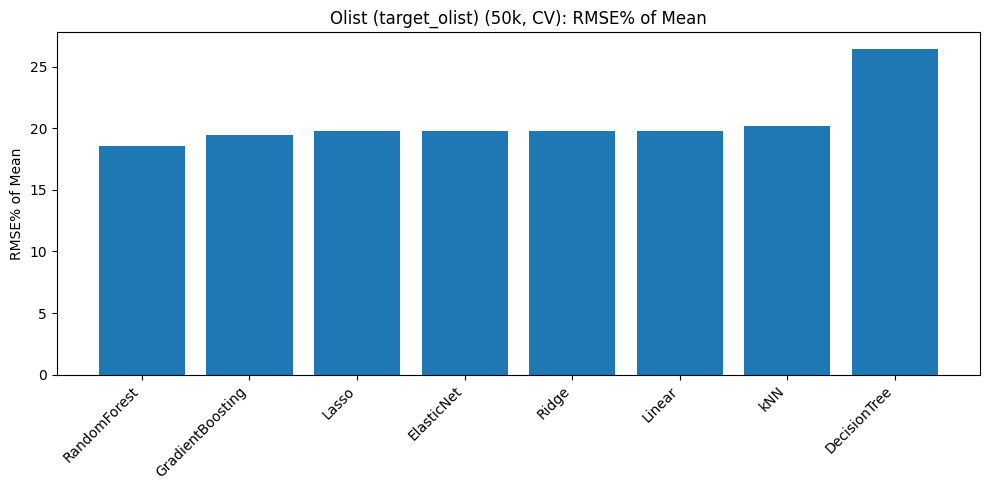

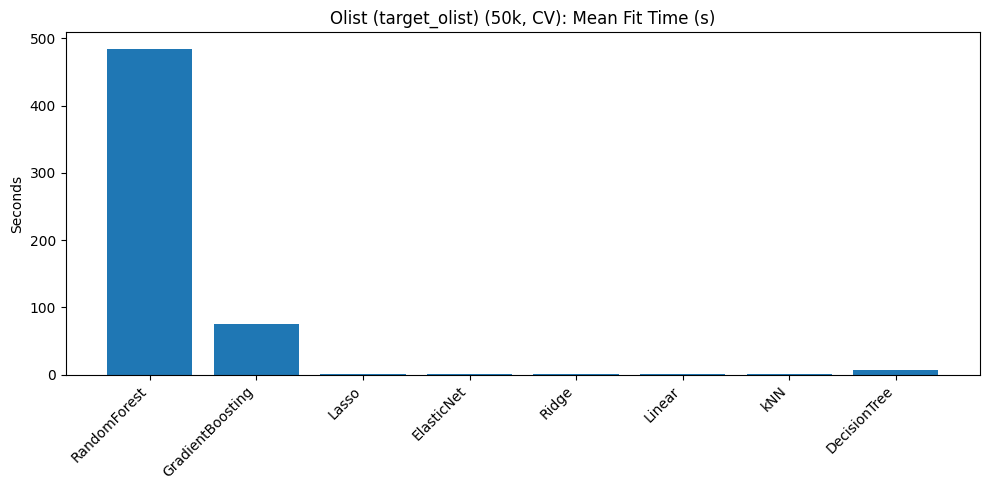

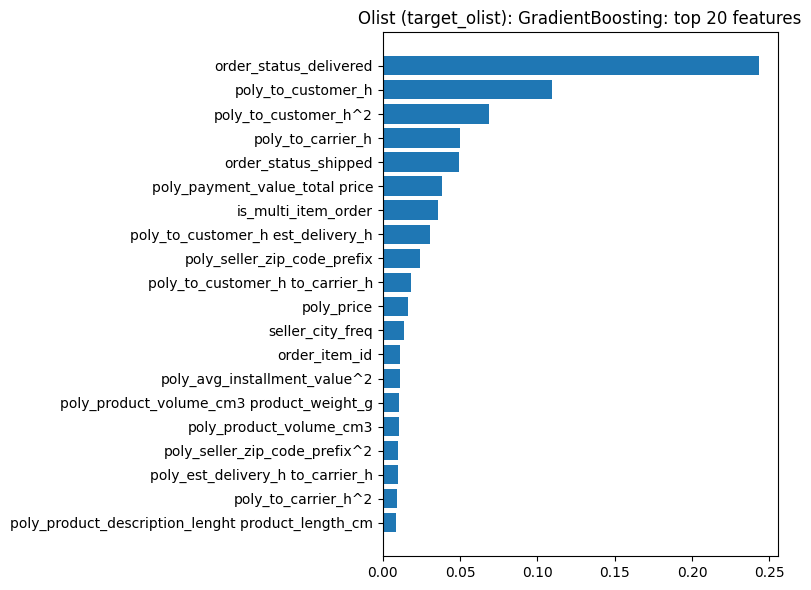

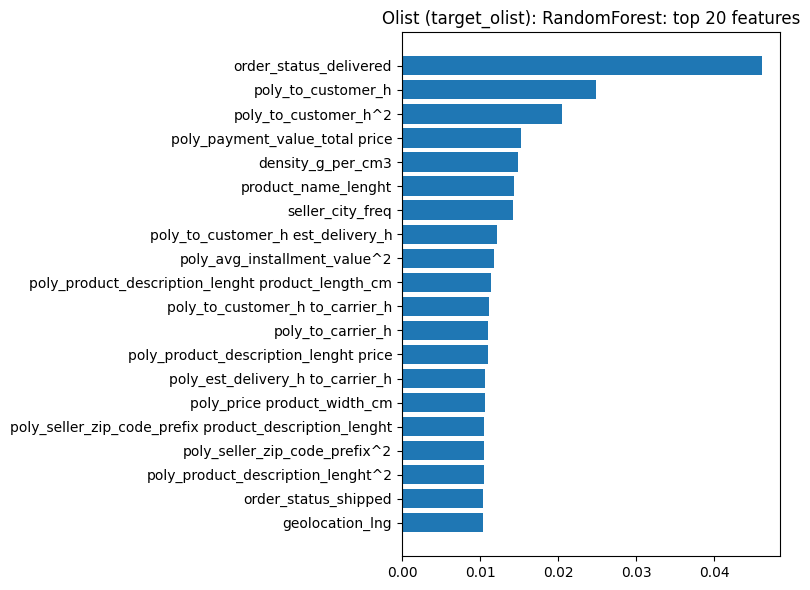

Olist (target_olist) elapsed: 578.50 s

VG2019 (target_sales): build 50k sample and run 5-fold regression CV

sample: using all 6536 rows
           Model MAE_mean RMSE_mean R2_mean MAE%_of_mean RMSE%_of_mean Fit_time_mean_s Score_time_mean_s Total_time_mean_s Model_size_MB_mean
    RandomForest   0.9358    1.2485  0.2615        12.97         17.31           2.403             0.056             2.459             120.43
GradientBoosting   1.0316    1.3221  0.1719        14.30         18.33           0.543             0.002             0.545               0.13
           Lasso   1.0806    1.3779  0.1004        14.98         19.10           0.017             0.002             0.019               0.00
      ElasticNet   1.0807    1.3780  0.1004        14.98         19.10           0.045             0.002             0.046               0.00
           Ridge   1.0808    1.3780  0.1003        14.98         19.10           0.006             0.002             0.008               0.00
          

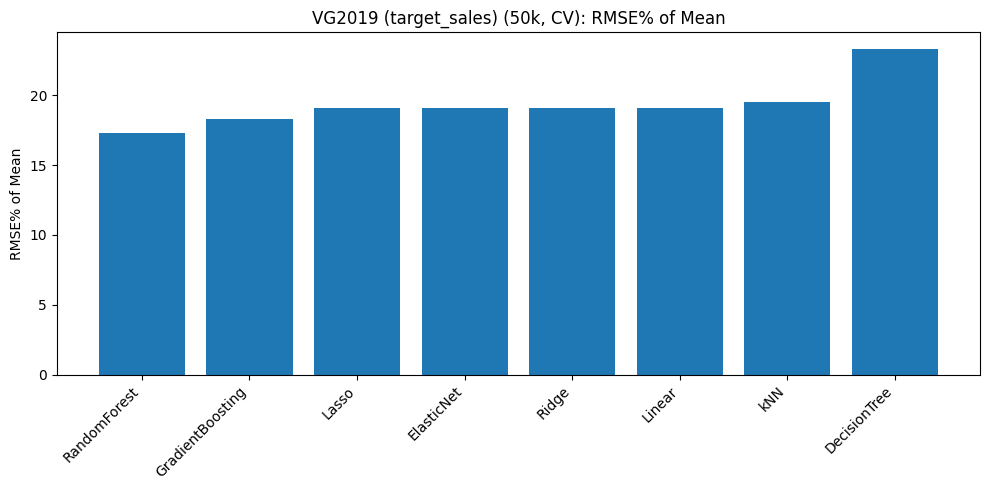

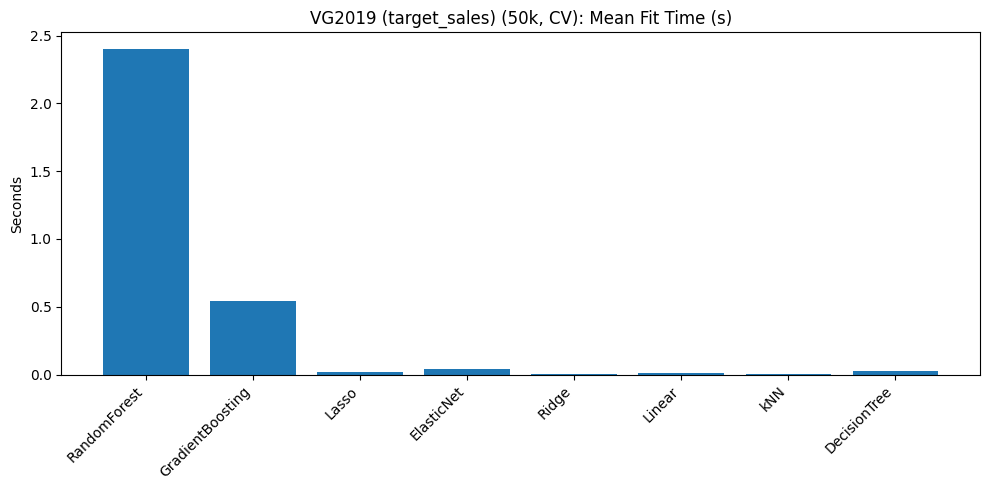

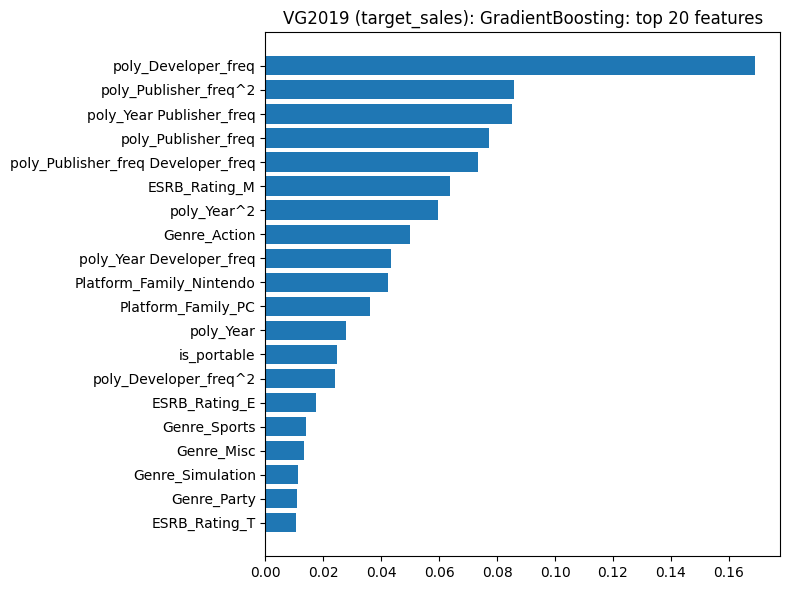

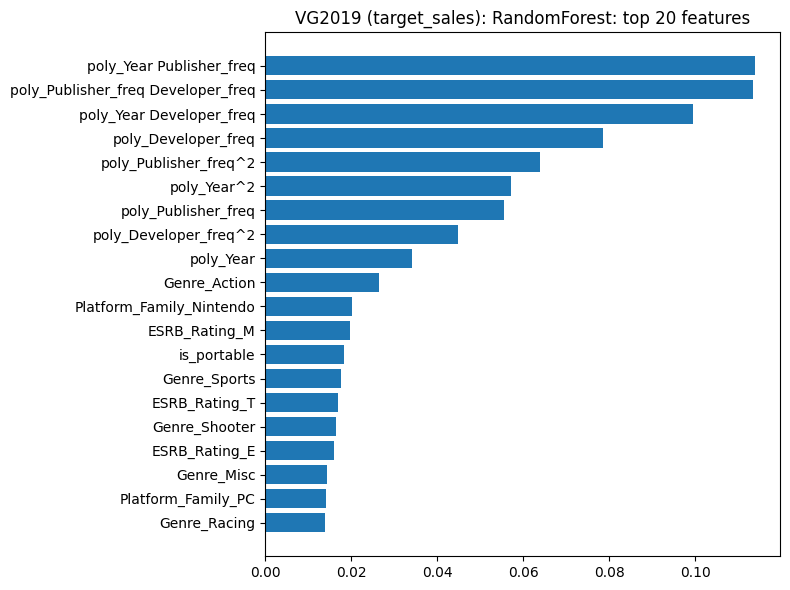

VG2019 (target_sales) elapsed: 5.96 s

SUMMARY TIME (seconds)

Classification total: 344.41
  Steam:  63.18
  Olist:  157.92
  VG2019: 21.63

Regression total:    2699.68
  Steam:  100.84
  Olist:  578.50
  VG2019: 5.96

ALL STEPS TOTAL:     26791.17 seconds

CSV outputs (created during runs):
 - steam_(target_steam)_cls_cv_50k_results.csv
 - olist_(target_olist)_cls_cv_50k_results.csv
 - vg2019_(target_sales)_cls_cv_50k_results.csv
 - steam_(target_steam)_reg_cv_50k_results.csv
 - olist_(target_olist)_reg_cv_50k_results.csv
 - vg2019_(target_sales)_reg_cv_50k_results.csv


In [2]:
# ============================================================
# Classic model comparison on YOUR datasets with 50k samples
# - Calls your prepare_all(...) for classification and regression
# - Runs 5-fold CV with timing, CSVs, and graphs
# - No ExtraTrees, no GaussianNB, no LDA, no Huber, no SVR-RBF
# - Uses classic GradientBoosting (not HistGB)
# ============================================================

import time
import sys
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedKFold, KFold, cross_validate, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# classification models
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, RandomForestRegressor, GradientBoostingRegressor

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

# -----------------------------
# Global settings
# -----------------------------
np.set_printoptions(suppress=True)
pd.set_option("display.float_format", lambda x: f"{x:.6f}")

RNG = 42
CV_K = 5
SAMPLE_ROWS = 50_000

# -----------------------------
# Simple helpers
# -----------------------------
def print_header(text):
    print("\n" + "=" * 80)
    print(text)
    print("=" * 80 + "\n")

def need_global(var_name):
    if var_name not in globals():
        raise NameError(f"Missing variable: {var_name}. Make sure your loader code created it.")
    return globals()[var_name]

def model_size_mb(estimator):
    try:
        b = pickle.dumps(estimator, protocol=pickle.HIGHEST_PROTOCOL)
        return float(len(b)) / (1024.0 * 1024.0)
    except Exception:
        try:
            return float(sys.getsizeof(estimator)) / (1024.0 * 1024.0)
        except Exception:
            return float("nan")

def concat_train_test(X_tr, X_te, y_tr, y_te):
    X = pd.concat([pd.DataFrame(X_tr), pd.DataFrame(X_te)], axis=0, ignore_index=True)
    y = pd.concat([pd.Series(y_tr), pd.Series(y_te)], axis=0, ignore_index=True)
    return X, y

# -----------------------------
# Sampling helpers (50k rows)
# -----------------------------
def sample_stratified_classification(X, y, n_rows=SAMPLE_ROWS, random_state=RNG):
    X = pd.DataFrame(X).reset_index(drop=True)
    y = pd.Series(y).reset_index(drop=True)
    if len(X) <= n_rows:
        print(f"sample: using all {len(X)} rows")
        return X, y
    # do a quick stratified split to approximate a stratified sample
    X_tmp, X_s, y_tmp, y_s = train_test_split(
        X, y, test_size=n_rows, stratify=y, random_state=random_state
    )
    print(f"sample: picked {len(X_s)} rows (stratified by label)")
    return X_s.reset_index(drop=True), y_s.reset_index(drop=True)

def sample_quantile_binned_regression(X, y, n_rows=SAMPLE_ROWS, bins=20, random_state=RNG):
    X = pd.DataFrame(X).reset_index(drop=True)
    y = pd.Series(y).reset_index(drop=True).astype(float)
    if len(X) <= n_rows:
        print(f"sample: using all {len(X)} rows")
        return X, y
    try:
        q = pd.qcut(y, q=bins, duplicates="drop")
    except Exception:
        q = pd.cut(y, bins=bins)
    counts = q.value_counts()
    probs = counts / counts.sum()
    take_per_bin = (probs * n_rows).round().astype(int)
    rng = np.random.default_rng(random_state)
    picked = []
    for level, n_take in take_per_bin.items():
        idx = q[q == level].index.values
        if n_take > 0 and len(idx) > 0:
            n_take = min(n_take, len(idx))
            picked.extend(rng.choice(idx, size=n_take, replace=False).tolist())
    if len(picked) > n_rows:
        picked = picked[:n_rows]
    print(f"sample: picked {len(picked)} rows (quantile-binned by target)")
    Xs = X.iloc[picked].reset_index(drop=True)
    ys = y.iloc[picked].reset_index(drop=True)
    return Xs, ys

# -----------------------------
# Feature importances (trees)
# -----------------------------
def plot_top_importances(trained_pipeline, step_name, feature_names, top_k=20, title_prefix=""):
    try:
        est = trained_pipeline.named_steps[step_name]
        if not hasattr(est, "feature_importances_"):
            return
        importances = np.array(est.feature_importances_, dtype=float)
        k = min(top_k, importances.shape[0])
        idx = np.argsort(importances)[-k:]
        plt.figure(figsize=(8, 6))
        plt.title(f"{title_prefix}: top {k} features")
        plt.barh(range(k), importances[idx])
        names = np.array(feature_names, dtype=object)
        if len(names) == importances.shape[0]:
            plt.yticks(range(k), names[idx])
        else:
            plt.yticks(range(k), [f"f{i}" for i in idx])
        plt.tight_layout()
        plt.show()
    except Exception:
        pass

# -----------------------------
# Classification CV
# -----------------------------
def run_classification_cv(name, X, y):
    print_header(f"{name}: build 50k sample and run {CV_K}-fold classification CV")
    Xs, ys = sample_stratified_classification(X, y, n_rows=SAMPLE_ROWS, random_state=RNG)
    feature_names = list(Xs.columns)

    # scale for linear / knn; trees use raw
    if hasattr(Xs, "dtypes") and (Xs.dtypes == "uint8").any():
        scaler = StandardScaler(with_mean=False)
    else:
        scaler = StandardScaler()

    models = {
        "GradientBoosting": Pipeline([("clf", GradientBoostingClassifier(random_state=RNG))]),
        "RandomForest": Pipeline([("clf", RandomForestClassifier(n_estimators=250, random_state=RNG, n_jobs=-1))]),
        "Logistic": Pipeline([("sc", scaler), ("clf", LogisticRegression(max_iter=2000, solver="saga", n_jobs=-1))]),
        "LinearSVM": Pipeline([("sc", scaler), ("clf", LinearSVC())]),
        "kNN": Pipeline([("sc", scaler), ("clf", KNeighborsClassifier(n_neighbors=11))]),
        "DecisionTree": Pipeline([("clf", DecisionTreeClassifier(random_state=RNG))]),
    }

    cv = StratifiedKFold(n_splits=CV_K, shuffle=True, random_state=RNG)
    scoring = {"f1_macro": "f1_macro", "accuracy": "accuracy", "auc": "roc_auc"}

    t0 = time.time()
    rows = []
    keep_one = {}

    for mname, pipe in models.items():
        res = cross_validate(
            pipe, Xs, ys, scoring=scoring, cv=cv, n_jobs=-1,
            return_train_score=False, return_estimator=True
        )
        sizes = [model_size_mb(e) for e in res["estimator"]]
        rows.append({
            "Model": mname,
            "F1_macro_mean": float(np.mean(res["test_f1_macro"])),
            "F1_macro_std": float(np.std(res["test_f1_macro"])),
            "Accuracy_mean": float(np.mean(res["test_accuracy"])),
            "ROC_AUC_mean": float(np.mean(res["test_auc"])),
            "Fit_time_mean_s": float(np.mean(res["fit_time"])),
            "Score_time_mean_s": float(np.mean(res["score_time"])),
            "Total_time_mean_s": float(np.mean(res["fit_time"] + res["score_time"])),
            "Model_size_MB_mean": float(np.mean(sizes)),
        })
        keep_one[mname] = res["estimator"][0]

    elapsed = time.time() - t0

    results = pd.DataFrame(rows).sort_values("F1_macro_mean", ascending=False).reset_index(drop=True)
    fmt = {
        "F1_macro_mean": "{:.4f}".format, "F1_macro_std": "{:.4f}".format,
        "Accuracy_mean": "{:.4f}".format, "ROC_AUC_mean": "{:.4f}".format,
        "Fit_time_mean_s": "{:.3f}".format, "Score_time_mean_s": "{:.3f}".format,
        "Total_time_mean_s": "{:.3f}".format, "Model_size_MB_mean": "{:.2f}".format,
    }
    print(results.to_string(index=False, formatters=fmt))
    csv_name = f"{name.lower().replace(' ', '_').replace('(', '').replace(')', '').replace('/', '_')}_cls_cv_50k_results.csv"
    results.to_csv(csv_name, index=False)
    print(f'\nSaved "{csv_name}"')

    # F1 bar
    plt.figure(figsize=(10, 5))
    plt.title(f"{name} (50k, CV): F1 Macro Mean")
    plt.bar(results["Model"], results["F1_macro_mean"])
    plt.ylabel("F1 Macro")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

    # Fit-time bar
    plt.figure(figsize=(10, 5))
    plt.title(f"{name} (50k, CV): Mean Fit Time (s)")
    plt.bar(results["Model"], results["Fit_time_mean_s"])
    plt.ylabel("Seconds")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

    # Importances for tree models
    for m in ["GradientBoosting", "RandomForest"]:
        if m in keep_one:
            plot_top_importances(keep_one[m], "clf", feature_names, top_k=20, title_prefix=f"{name}: {m}")

    print(f"{name} elapsed: {elapsed:.2f} s")
    return elapsed, results

# -----------------------------
# Regression CV
# -----------------------------
def check_regression_target(name, y):
    u = pd.Series(y).dropna().unique()
    if len(u) <= 10 and set(np.unique(u)).issubset(set(range(-5, 11))):
        msg = (
            f"{name}: target looks categorical.\n"
            "Please call prepare_all(..., task_type='regression', balance_method='none') first."
        )
        raise ValueError(msg)

def run_regression_cv(name, X, y):
    print_header(f"{name}: build 50k sample and run {CV_K}-fold regression CV")
    check_regression_target(name, y)

    Xs, ys = sample_quantile_binned_regression(X, y, n_rows=SAMPLE_ROWS, random_state=RNG)
    feature_names = list(Xs.columns)

    if hasattr(Xs, "dtypes") and (Xs.dtypes == "uint8").any():
        scaler = StandardScaler(with_mean=False)
    else:
        scaler = StandardScaler()

    models = {
        "GradientBoosting": Pipeline([("reg", GradientBoostingRegressor(random_state=RNG))]),
        "RandomForest": Pipeline([("reg", RandomForestRegressor(n_estimators=300, random_state=RNG, n_jobs=-1))]),
        "Ridge": Pipeline([("sc", scaler), ("reg", Ridge(alpha=1.0))]),
        "Lasso": Pipeline([("sc", scaler), ("reg", Lasso(alpha=0.001, max_iter=10000))]),
        "ElasticNet": Pipeline([("sc", scaler), ("reg", ElasticNet(alpha=0.001, l1_ratio=0.5, max_iter=10000))]),
        "Linear": Pipeline([("sc", scaler), ("reg", LinearRegression())]),
        "kNN": Pipeline([("sc", scaler), ("reg", KNeighborsRegressor(n_neighbors=7))]),
        "DecisionTree": Pipeline([("reg", DecisionTreeRegressor(random_state=RNG))]),
    }

    cv = KFold(n_splits=CV_K, shuffle=True, random_state=RNG)
    scoring = {
        "mae": "neg_mean_absolute_error",
        "rmse": "neg_root_mean_squared_error",
        "r2": "r2",
    }
    mean_abs_y = float(np.mean(np.abs(ys))) if float(np.mean(np.abs(ys))) != 0 else 1.0

    t0 = time.time()
    rows = []
    keep_one = {}

    for mname, pipe in models.items():
        res = cross_validate(
            pipe, Xs, ys, scoring=scoring, cv=cv, n_jobs=-1,
            return_train_score=False, return_estimator=True
        )
        mae = -res["test_mae"]
        rmse = -res["test_rmse"]
        sizes = [model_size_mb(e) for e in res["estimator"]]
        rows.append({
            "Model": mname,
            "MAE_mean": float(np.mean(mae)),
            "RMSE_mean": float(np.mean(rmse)),
            "R2_mean": float(np.mean(res["test_r2"])),
            "MAE%_of_mean": float(100.0 * np.mean(mae) / mean_abs_y),
            "RMSE%_of_mean": float(100.0 * np.mean(rmse) / mean_abs_y),
            "Fit_time_mean_s": float(np.mean(res["fit_time"])),
            "Score_time_mean_s": float(np.mean(res["score_time"])),
            "Total_time_mean_s": float(np.mean(res["fit_time"] + res["score_time"])),
            "Model_size_MB_mean": float(np.mean(sizes)),
        })
        keep_one[mname] = res["estimator"][0]

    elapsed = time.time() - t0

    results = pd.DataFrame(rows).sort_values("RMSE%_of_mean").reset_index(drop=True)
    fmt = {
        "MAE_mean": "{:.4f}".format, "RMSE_mean": "{:.4f}".format, "R2_mean": "{:.4f}".format,
        "MAE%_of_mean": "{:.2f}".format, "RMSE%_of_mean": "{:.2f}".format,
        "Fit_time_mean_s": "{:.3f}".format, "Score_time_mean_s": "{:.3f}".format,
        "Total_time_mean_s": "{:.3f}".format, "Model_size_MB_mean": "{:.2f}".format,
    }
    print(results.to_string(index=False, formatters=fmt))
    csv_name = f"{name.lower().replace(' ', '_').replace('(', '').replace(')', '').replace('/', '_')}_reg_cv_50k_results.csv"
    results.to_csv(csv_name, index=False)
    print(f'\nSaved "{csv_name}"')

    # RMSE% bar
    plt.figure(figsize=(10, 5))
    plt.title(f"{name} (50k, CV): RMSE% of Mean")
    plt.bar(results["Model"], results["RMSE%_of_mean"])
    plt.ylabel("RMSE% of Mean")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

    # Fit-time bar
    plt.figure(figsize=(10, 5))
    plt.title(f"{name} (50k, CV): Mean Fit Time (s)")
    plt.bar(results["Model"], results["Fit_time_mean_s"])
    plt.ylabel("Seconds")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

    # Importances for tree models
    for m in ["GradientBoosting", "RandomForest"]:
        if m in keep_one:
            step = "reg"
            plot_top_importances(keep_one[m], step, feature_names, top_k=20, title_prefix=f"{name}: {m}")

    print(f"{name} elapsed: {elapsed:.2f} s")
    return elapsed, results

# -----------------------------
# CALL YOUR prepare_all(...)
# -----------------------------
def prepare_classification_splits(k=30):
    # requires your globals: prepare_all, steam, olist, sales
    need_global("prepare_all")
    need_global("steam"); need_global("olist"); need_global("sales")
    splits = prepare_all(
        steam, olist, sales,
        test_size=0.2,
        random_state=42,
        balance_method="auto",
        min_class_ratio=0.5,
        feature_select_method="rf",
        feature_select_k=k,
        task_type="classification",
        scale_method="standard",
        poly_degree=2,
        poly_interaction_only=False,
        poly_include_bias=False,
        poly_feature_limit=20
    )
    X_train_steam, X_test_steam, y_train_steam, y_test_steam = splits["steam"]
    X_train_olist, X_test_olist, y_train_olist, y_test_olist = splits["olist"]
    X_train_sales, X_test_sales, y_train_sales, y_test_sales = splits["sales"]
    Xs, ys = concat_train_test(X_train_steam, X_test_steam, y_train_steam, y_test_steam)
    Xo, yo = concat_train_test(X_train_olist, X_test_olist, y_train_olist, y_test_olist)
    Xv, yv = concat_train_test(X_train_sales, X_test_sales, y_train_sales, y_test_sales)
    return (Xs, ys), (Xo, yo), (Xv, yv)

def prepare_regression_splits(k=30):
    # requires your globals: prepare_all, steam, olist, sales
    need_global("prepare_all")
    need_global("steam"); need_global("olist"); need_global("sales")
    splits = prepare_all(
        steam, olist, sales,
        test_size=0.2,
        random_state=42,
        balance_method="none",      # no balancing for regression
        min_class_ratio=0.5,
        feature_select_method="rf",
        feature_select_k=k,
        task_type="regression",
        scale_method="standard",
        poly_degree=2,
        poly_interaction_only=False,
        poly_include_bias=False,
        poly_feature_limit=20
    )
    X_train_steam, X_test_steam, y_train_steam, y_test_steam = splits["steam"]
    X_train_olist, X_test_olist, y_train_olist, y_test_olist = splits["olist"]
    X_train_sales, X_test_sales, y_train_sales, y_test_sales = splits["sales"]
    Xs, ys = concat_train_test(X_train_steam, X_test_steam, y_train_steam, y_test_steam)
    Xo, yo = concat_train_test(X_train_olist, X_test_olist, y_train_olist, y_test_olist)
    Xv, yv = concat_train_test(X_train_sales, X_test_sales, y_train_sales, y_test_sales)
    return (Xs, ys), (Xo, yo), (Xv, yv)

# -----------------------------
# Main
# -----------------------------
def main():
    grand_t0 = time.time()
    for k in [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]:
        print_header(f"FEATURE SELECTION K={k} RUN")
        print_header(f"RUNNING FULL PIPELINE WITH FEATURE SELECT K={k}")
        # 1) Classification path
        cls_start = time.time()
        (Xs_cls, ys_cls), (Xo_cls, yo_cls), (Xv_cls, yv_cls) = prepare_classification_splits(k=k)
        t_s_cls, r_s_cls = run_classification_cv("Steam (target_steam)", Xs_cls, ys_cls)
        t_o_cls, r_o_cls = run_classification_cv("Olist (target_olist)", Xo_cls, yo_cls)
        t_v_cls, r_v_cls = run_classification_cv("VG2019 (target_sales)", Xv_cls, yv_cls)
        cls_total = time.time() - cls_start

        # 2) Regression path
        reg_start = time.time()
        (Xs_reg, ys_reg), (Xo_reg, yo_reg), (Xv_reg, yv_reg) = prepare_regression_splits(k=k)
        t_s_reg, r_s_reg = run_regression_cv("Steam (target_steam)", Xs_reg, ys_reg)
        t_o_reg, r_o_reg = run_regression_cv("Olist (target_olist)", Xo_reg, yo_reg)
        t_v_reg, r_v_reg = run_regression_cv("VG2019 (target_sales)", Xv_reg, yv_reg)
        reg_total = time.time() - reg_start

        grand_t1 = time.time()
        grand_total = grand_t1 - grand_t0

        print_header("SUMMARY TIME (seconds)")
        print(f"Classification total: {cls_total:.2f}")
        print(f"  Steam:  {t_s_cls:.2f}")
        print(f"  Olist:  {t_o_cls:.2f}")
        print(f"  VG2019: {t_v_cls:.2f}")
        print("")
        print(f"Regression total:    {reg_total:.2f}")
        print(f"  Steam:  {t_s_reg:.2f}")
        print(f"  Olist:  {t_o_reg:.2f}")
        print(f"  VG2019: {t_v_reg:.2f}")
        print("")
        print(f"ALL STEPS TOTAL:     {grand_total:.2f} seconds")

        print("\nCSV outputs (created during runs):")
        print(" - steam_(target_steam)_cls_cv_50k_results.csv")
        print(" - olist_(target_olist)_cls_cv_50k_results.csv")
        print(" - vg2019_(target_sales)_cls_cv_50k_results.csv")
        print(" - steam_(target_steam)_reg_cv_50k_results.csv")
        print(" - olist_(target_olist)_reg_cv_50k_results.csv")
        print(" - vg2019_(target_sales)_reg_cv_50k_results.csv")

if __name__ == "__main__":
    # Safety checks so errors are friendly
    try:
        main()
    except NameError as e:
        print("Setup error:", str(e))
        print("\nMake sure you already ran your loader + prep code that defines:")
        print(" - steam, olist, sales (dataframes)")
        print(" - prepare_all(...) function")
        print("\nThen re-run this script.")
